# Imports used for the project

In [1]:
import csv
import datetime
from cleantext import clean
import re
import numpy as np
import pandas as pd

import psycopg2
from psycopg2 import connect, extensions, sql, Error
from psycopg2.extensions import ISOLATION_LEVEL_AUTOCOMMIT

import scrapy
from scrapy.crawler import CrawlerProcess

import sys
import os

import nltk
from nltk.tokenize import word_tokenize
import string
from nltk.corpus import stopwords

from IPython.display import display, Image

# Task 2 - Load database
### Create csv files that contains the data from the raw data csv file

In [2]:
# Sample
csv_in = '1mio-raw.csv' #You need to have the file in the same folder as this Jupyter Notebook

In [3]:
def create_empty_file_for_writing(filename):
    if os.path.exists(filename):
        file = open(filename)
        file.close()
        os.remove(filename)
    return open(filename, "w")    

In [4]:
def simple_entity_to_CSV(filename, idName, keyName, dictionary):
    file = open(filename,"a",encoding='utf-8')
    for item in dictionary.items():
        file.write("%s,%s\n" %(str(item[1]), str(item[0])))
    file.close

In [5]:
def clean_text(content):

    # split into words
    tokens = word_tokenize(content)
    
    # convert to lower case
    tokens = [w.lower() for w in tokens]
    
    # remove punctuation from the end of words
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table) for w in tokens]
    
    # remove remaining tokens that are not alphabetic
    words = [word for word in stripped if word.isalpha()]
    
    # filter out stop words
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]
    
    #Join to one string
    seperator = ' '
    clean_text = seperator.join(words)
    
    return clean_text

In [6]:
def isNaN(string):
    return string != string

In [7]:
def extract_and_put_in_csv_files(chunk):
    
    global ID_author
    global ID_domain
    global ID_keyword
    global ID_type 
    global ID_article
    global ID_time
    
    
    for index, row in chunk.iterrows():
        # Authors  
        authors = row['authors']
        if(not isNaN(authors)):
            list_of_authors = authors.split(", ")
            for author in list_of_authors:
                if(len(author) <= 64 and (author not in author_dictionary)):
                    author_dictionary[author] = ID_author
                    ID_author += 1
        
        
        
        # Meta keywords and Tags
        keywords = row['meta_keywords']
        if(not isNaN(keywords)):
            list_of_keywords = list(dict.fromkeys(re.split(r'[;,"\'\[\]]\s*', keywords)))
            for keyword in list_of_keywords:
                if(len(keyword) <= 128 and len(keyword) > 0): 
                    if (keyword not in keyword_dictionary):
                        keyword_dictionary[keyword] = ID_keyword
                        csv_tags.write("%s,%s\n" % (ID_article, ID_keyword))
                        ID_keyword += 1
                    else:
                        csv_tags.write("%s,%s\n" % (ID_article, keyword_dictionary.get(keyword)))
        
        
        
        # Domain
        domain = row['domain']
        if(not isNaN(domain)):
            if(len(domain) <= 1024 and (domain not in domain_dictionary)):
                domain_dictionary[domain] = ID_domain
                ID_domain += 1
        
        
        
        # Type
        typ = row['type']
        if(not isNaN(typ)):
            if(len(typ) <= 64 and (typ not in type_dictionary)):
                type_dictionary[typ] = ID_type
                ID_type += 1
        
        
        
        # Time
        scrapped_at_time_id = 0
        scrapped_at = row['scraped_at']
        if(isNaN(scrapped_at)):
            scrapped_at = datetime.datetime(1000, 1, 1)
        if (scrapped_at not in time_dictionary):
            time_dictionary[scrapped_at] = ID_time
            scrapped_at_time_id = ID_time
            ID_time += 1
        else:
            scrapped_at_time_id = time_dictionary.get(scrapped_at)
            
        inserted_at_time_id = 0    
        inserted_at = row['inserted_at']
        if(isNaN(inserted_at)):
            inserted_at = datetime.datetime(1000, 1, 1)
        if (inserted_at not in time_dictionary):
            time_dictionary[inserted_at] = ID_time
            inserted_at_time_id = ID_time
            ID_time += 1
        else:
            inserted_at_time_id = time_dictionary.get(inserted_at)    
            
        updated_at_time_id = 0 
        updated_at  = row['updated_at']
        if(isNaN(updated_at)):
            updated_at = datetime.datetime(1000, 1, 1)
        if (updated_at not in time_dictionary):
            time_dictionary[updated_at] = ID_time
            updated_at_time_id = ID_time
            ID_time += 1
        else:
            updated_at_time_id = time_dictionary.get(updated_at)    
        
        
        
        # Article
        title = row['title']
        if(title and (not isNaN(title)) and (len(title) <= 512)):
            title = clean_text(title)
        else:
            title = "NULL"
        
        content = row['content']
        if(not isNaN(content)):
            content = clean_text(content)
        else:
            content = "NULL"
        
        summary = row['summary']
        if(summary and (not isNaN(summary))):
            summary = clean_text(summary)
        else:
            summary = "NULL"
        
        meta_description = row['meta_description']
        if(meta_description and (not isNaN(meta_description))):
            meta_description = clean_text(meta_description)
        else:
            meta_description = "NULL"
        
        typ = row['type']
        if((not isNaN(typ)) and (len(typ) <= 64)):
            type_id = type_dictionary[typ]
        else:
            type_id = 0

        csv_article.write("%s^\"%s\"^\"%s\"^\"%s\"^\"%s\"^%s^%s^%s^%s\n"%
            (ID_article
             , title
             , content
             , summary
             , meta_description
             , type_id
             , scrapped_at_time_id
             , inserted_at_time_id
             , updated_at_time_id))
        
        
        
        # Webpage
        url = row['url']
        domain = row['domain']
        if((not isNaN(url)) and (not isNaN(domain)) and (len(url) <= 1024) and (len(domain) <= 1024)):
            csv_webpage.write("%s^%s^%s\n" % (ID_article, url, domain_dictionary[domain]))
        
        
        
        # Writen_by
        authors = row['authors']
        if(not isNaN(authors)):
            list_of_authors = authors.split(", ")
            for author in list_of_authors:
                if(len(author) <= 64):
                    csv_written_by.write("%s,%s\n" % (ID_article, author_dictionary[author]))
                    

        ID_article += 1


In [8]:
csv_author     = create_empty_file_for_writing('csv-files/author.csv')
csv_keyword    = create_empty_file_for_writing('csv-files/keyword.csv')
csv_domain     = create_empty_file_for_writing('csv-files/domain.csv')
csv_type       = create_empty_file_for_writing('csv-files/type.csv')
csv_article    = create_empty_file_for_writing('csv-files/article.csv')
csv_written_by = create_empty_file_for_writing('csv-files/written_by.csv')
csv_tags       = create_empty_file_for_writing('csv-files/tags.csv')
csv_webpage    = create_empty_file_for_writing('csv-files/webpage.csv')
csv_time       = create_empty_file_for_writing('csv-files/time.csv')

# Initialize the dictionaries
author_dictionary  = dict()
domain_dictionary  = dict() 
type_dictionary    = dict()
keyword_dictionary = dict()   
time_dictionary    = dict()

# Used to generate ID's in the csv files
ID_author = ID_domain = ID_keyword = ID_type = ID_article = ID_time = 0

# Process and store the stuff 
CHUNK_SIZE = 100000

with open(csv_in, 'r', newline='',encoding='utf-8', errors='replace') as csvfile:
    reader = pd.read_csv(csvfile, chunksize=CHUNK_SIZE,
                         encoding='utf-8',
                         parse_dates=['scraped_at','inserted_at','updated_at'])
    chunk_idx = 1 # Used to see how far the reading process is
    for chunk in reader:
        extract_and_put_in_csv_files(chunk)
        print(str(CHUNK_SIZE * chunk_idx) + " rows have been read.")
        chunk_idx += 1
    
    simple_entity_to_CSV("csv-files/author.csv", "author_id", "author_name", author_dictionary)
    simple_entity_to_CSV("csv-files/keyword.csv", "keyword_id", "keyword_name", keyword_dictionary)
    simple_entity_to_CSV("csv-files/domain.csv", "domain_id", "domain_url", domain_dictionary)    
    simple_entity_to_CSV("csv-files/type.csv", "type_id", "type_name", type_dictionary)
    simple_entity_to_CSV("csv-files/time.csv", "time_id", "time", time_dictionary)
csvfile.close() 

100000 rows have been read.


/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


200000 rows have been read.
300000 rows have been read.
400000 rows have been read.
500000 rows have been read.
600000 rows have been read.
700000 rows have been read.
800000 rows have been read.
900000 rows have been read.
1000000 rows have been read.


### Create database and load it with the data from above

Run the follwoing commands in the terminal to create the database:

sudo -u postgres psql

CREATE DATABASE fakenews;

CREATE USER user123 WITH ENCRYPTED PASSWORD 'pass123';

GRANT ALL PRIVILEGES ON DATABASE FakeNews TO user123;

GRANT pg_read_server_files TO user123;

In [3]:
sql_query_create_and_load_database = """
DROP TABLE IF EXISTS Time, Written_by, Tags, Webpage, Article, Typ, Domain, Author, Keyword CASCADE;


CREATE TABLE Time
(
  time_id serial NOT NULL,
  time timestamp NOT NULL,
  PRIMARY KEY (time_id)
);

CREATE TABLE Typ
(
  type_id serial NOT NULL,
  type_name varchar(64) NOT NULL,
  PRIMARY KEY (type_id),
  UNIQUE (type_name)
);

CREATE TABLE Keyword
(
  keyword_id serial NOT NULL,
  keyword_name varchar(128),
  PRIMARY KEY (keyword_id),
  UNIQUE (keyword_name)
);

CREATE TABLE Author
(
  author_id serial NOT NULL,
  author_name varchar(64) NOT NULL,
  PRIMARY KEY (author_id),
  UNIQUE (author_name)
);

CREATE TABLE Domain
(
  domain_id serial NOT NULL,
  domain_url varchar(1024) NOT NULL,
  PRIMARY KEY (domain_id)
);

CREATE TABLE Article
(
  article_id serial NOT NULL,
  title text NOT NULL,
  content text NOT NULL,
  summary text,
  meta_description text,
  type_id integer NOT NULL,
  inserted_at_time_id integer NOT NULL,
  updated_at_time_id  integer NOT NULL,
  scrapped_at_time_id integer NOT NULL,
  PRIMARY KEY (article_id),
  FOREIGN KEY (inserted_at_time_id) REFERENCES Time(time_id),
  FOREIGN KEY (updated_at_time_id)  REFERENCES Time(time_id),
  FOREIGN KEY (scrapped_at_time_id) REFERENCES Time(time_id),
  FOREIGN KEY (type_id) REFERENCES Typ(type_id)
);

CREATE TABLE Webpage 
(
  article_id integer REFERENCES Article(article_id),
  url varchar(1024),
  domain_id integer REFERENCES Domain(domain_id)
);

CREATE TABLE Tags
(
  article_id integer NOT NULL,
  keyword_id integer NOT NULL,
  PRIMARY KEY (article_id, keyword_id),
  FOREIGN KEY (article_id) REFERENCES Article(article_id),
  FOREIGN KEY (keyword_id) REFERENCES Keyword(keyword_id)
);

CREATE TABLE Written_by
(
  article_id integer NOT NULL,
  author_id integer NOT NULL,
  PRIMARY KEY (article_id, author_id),
  FOREIGN KEY (article_id) REFERENCES Article(article_id),
  FOREIGN KEY (author_id) REFERENCES Author(author_id)
);



COPY time       FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/time.csv'        DELIMITER ',' CSV;
COPY keyword    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/keyword.csv'     DELIMITER ',' CSV;
COPY author     FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/author.csv'      DELIMITER ',' CSV;
COPY typ        FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/type.csv'        DELIMITER ',' CSV;
COPY domain     FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/domain.csv'      DELIMITER ',' CSV;
COPY article    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/article.csv'     DELIMITER '^' QUOTE '}' CSV ;
COPY tags       FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/tags.csv'        DELIMITER ',' CSV;
COPY written_by FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/written_by.csv'  DELIMITER ',' CSV;
COPY webpage    FROM '/home/marcus/Desktop/Studie/Data Science/Project_Data_Science/csv-files/webpage.csv'     DELIMITER '^' CSV;"""

In [4]:
# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands
cursor.execute(sql_query_create_and_load_database)

# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Login to the database to see that the data has been loaded with the following command:

psql -h localhost -U user123 fakenews

### Explanation of the database design 

Below is a E/R diagram of our database design. 

Our design of our database design was an iterative process, where we started with an databse design and then when we saw some anomalies we changed our design to reduce these. We started by cramming all the data in one relation but this created a lot of anomalies. So by decomposing this iteratively we ended up with the design that can be viewed on the picture below. By designing our database this way, we have reduced redundancy, update anomalies, and deletion anomalies a lot.   

Article:
- As it can be seen from the diagram the central, and most important entity is the Article entity. The article consists of some text attributes including: summary, meta_description, title, and content. It would make sense to split these into entities themselves since for example multiple atricles doesn't have the same content or summaries. It could maybe make sense to have title in an entity since multiple articles could have the same titles. This would maybe save some storage and reduce the redundancy, but we have decided to keep it together since it would make the database more complicated. 
- The article entity also has some id attributes. These are for the data fields where we have a many - one relationship. So for example article has a field called inserted_at_time_id. The reason for this is that one article only has a single time where it was inserted, but multiple articles could be inserted at the same time. So by doing this we save some space and make querying more efficient.

Time:
- In the beginning our Article entity also had scrapped_at, inserted_at, and Updated_at as attributes, but after making some queries we quickly found out that it was the same dates that was used. Therefore we decided to create an time entity with all the various times. This happened to be a good idea since there was only five different times in the dataset. So now the Article entity only has the attributes scrapped_at_time_id, inserted_at_time_id, and updated_at_time_id which are the time id's from the time table. This does that instead of saving a lot of the same dates, we only have to save a lot of the same id's. This reduces update anomalies since we now for example only have to change one date if it was wrong for some reason. It also save space since it is more efficient to store a lot of integers than a lot of timestamps.


Keyword and tags:
- Since many articles have the same keywords and articles have many keywords we decided to split it up into two entities. The keyword entity contains all the different keywords and the tags entity contains article id's and keyword id's. By doing it this way we reduce redundancy. 

Typ:
- We used the same logic for types. Here we initially thought they also should just be an attribute but again there was only 12 different kinds of types.


Author and written_by:
- Like keyword and tags, o an article can have many authors and an author can have written multiple articles. Therefore we have decomposed it. Author contains all the authors and written_by contains article_id and author_id that can be used to link the article to its authors. The reason for this decomposition is because it reduces redundancy. 


Domain and webpage:
- The reason for decomposing the domain into its own relation is that an article can only have one domain, but a domain can have many articles. By decomposing it like this into two relations, we reduce redundancy by a lot.


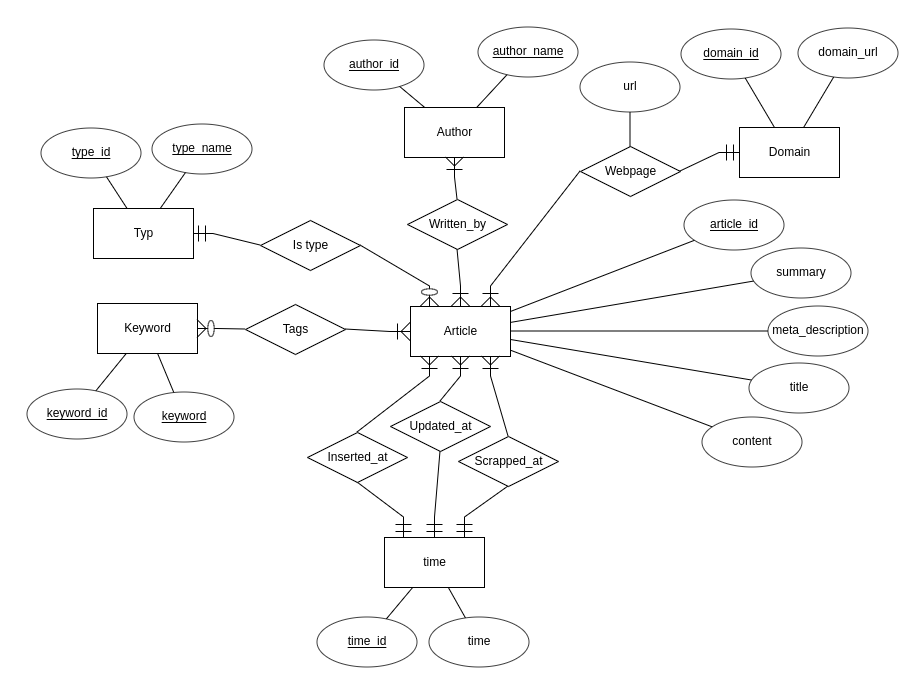

In [5]:
i = Image(filename='ER diagram.png')
display(i)

### Demonstration that our database contains a larger number of rows
We will now show that our database contains a larger number of rows by printing the number of rows in each table in the database.

In [6]:
# SQL commands
sql_query_large_number_of_rows_keyword    = "SELECT COUNT(*) FROM keyword;"
sql_query_large_number_of_rows_author     = "SELECT COUNT(*) FROM author;"
sql_query_large_number_of_rows_domain     = "SELECT COUNT(*) FROM domain;"
sql_query_large_number_of_rows_typ        = "SELECT COUNT(*) FROM typ;"
sql_query_large_number_of_rows_article    = "SELECT COUNT(*) FROM article;"
sql_query_large_number_of_rows_webpage    = "SELECT COUNT(*) FROM webpage;"
sql_query_large_number_of_rows_tags       = "SELECT COUNT(*) FROM tags;"
sql_query_large_number_of_rows_written_by = "SELECT COUNT(*) FROM written_by;"
sql_query_large_number_of_rows_time       = "SELECT COUNT(*) FROM time;"

# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands and print results
cursor.execute(sql_query_large_number_of_rows_keyword)
print("Number of rows in the keyword table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_author)
print("Number of rows in the author table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_domain)
print("Number of rows in the domain table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_typ)
print("Number of rows in the typ table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_article)
print("Number of rows in the article table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_webpage)
print("Number of rows in the webpage table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_tags)
print("Number of rows in the tags table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_written_by)
print("Number of rows in the written_by table: " + str(cursor.fetchone()[0]))

cursor.execute(sql_query_large_number_of_rows_time)
print("Number of rows in the time table: " + str(cursor.fetchone()[0]))


# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Number of rows in the keyword table: 135381
Number of rows in the author table: 57837
Number of rows in the domain table: 394
Number of rows in the typ table: 12
Number of rows in the article table: 999992
Number of rows in the webpage table: 999855
Number of rows in the tags table: 1027217
Number of rows in the written_by table: 2301635
Number of rows in the time table: 5


### Demonstration that simple queries works

We will now show that our database supports simple queries. Here we just make some natural joins between some of the tables an so on. 

In [7]:
# SQL commands
simple_sql_query_title_and_type = "SELECT article_id, title, type_name FROM article NATURAL JOIN typ LIMIT 10;"
simple_sql_query_various_types = "SELECT type_name FROM typ;"
simple_sql_query_nr_of_fake_articles = "SELECT COUNT(*) FROM article NATURAL JOIN typ WHERE type_name = 'fake';"

# Establishing the connection
conn = psycopg2.connect(
   database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432'
)

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

# Execute SQL commands and print results
cursor.execute(simple_sql_query_title_and_type)
print("Get title and type for ten articles:")
for row in cursor.fetchall():
    print("Article id: " + str(row[0]) + ", Title: " + row[1] + ", Type: " + row[2])


cursor.execute(simple_sql_query_various_types)
print("\nThe various types:")
for row in cursor.fetchall():
    print(row[0])

cursor.execute(simple_sql_query_nr_of_fake_articles)
print("\nNumber of articles marked as fake: \n" + str(cursor.fetchone()[0]))

# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

Get title and type for ten articles:
Article id: 0, Title: "life illusion researchers prove reality nt exist looking", Type: rumor
Article id: 1, Title: "donald trump", Type: hate
Article id: 2, Title: "donald trump", Type: hate
Article id: 3, Title: "winning israeli intelligence source debkafile confirms trump administration cut ties palestinians means peace plan financial aid", Type: hate
Article id: 4, Title: "oh trump coward wait dig grave means islamic caliphate", Type: hate
Article id: 5, Title: "following guatemala decision move embassy jerusalem capital israel countries also considering move", Type: hate
Article id: 6, Title: "unbacked police massacred haitians impunity", Type: unreliable
Article id: 7, Title: "black agenda report", Type: unreliable
Article id: 8, Title: "black agenda report", Type: unreliable
Article id: 9, Title: "zambia must clarify whether host israelafrica summit", Type: unreliable

The various types:
rumor
hate
unreliable
conspiracy
clickbait
satire
fake


# Task 3 - Issuing queries to better understand the characteristics of the data

We will now formulate some queries in various database languages and discuss what we observed when we executed then over our database.

In [8]:
# Establishing the connection
conn = psycopg2.connect(database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432')

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

### 3.1: List the domains of news articles of reliable type and scrapped at or after January 15, 2018. NOTE: Do not include duplicate domains in your answer. [Languages: relational algebra and SQL]

In [9]:
%%latex
\begin{equation}
\text{Answer(domain)} := \pi_{\text{domain_url}} \left(\sigma_{\text{type_name = 'reliable' AND time} \geq '2018-01-15'} \left(\text{Domain} \bowtie \text{Webpage} \bowtie \text{Article} \bowtie \text{Typ} \thinspace \mathring{\bowtie}_{\text{scrapped_at_time_id = time_id}} \thinspace \text{Time} \right)\right)  
\end{equation}

<IPython.core.display.Latex object>

In [10]:
sql_list_domains_of_reliable_articles = """
SELECT DISTINCT domain_url 
FROM   domain 
       natural JOIN webpage 
       natural JOIN article 
       natural JOIN typ 
       INNER JOIN time 
               ON article.scrapped_at_time_id = time.time_id 
WHERE  type_name = 'reliable' 
       AND time >= '2018-01-15';"""


# Execute SQL command and print result
cursor.execute(sql_list_domains_of_reliable_articles)
print("\nDomains of news articles of reliable type and scrapped at or after January 15, 2018: \n")
for row in cursor.fetchall():
    print("Domain: " + row[0])



Domains of news articles of reliable type and scrapped at or after January 15, 2018: 

Domain: christianpost.com
Domain: consortiumnews.com
Domain: nutritionfacts.org


### 3.2: List the name(s) of the most prolific author(s) of news articles of fake type. An author is among the most prolific if it has authored as many or more fake news articles as any other author in the dataset. [Languages: extended relational algebra and SQL]

In [11]:
%%latex
\begin{equation}
\text{R (a, w)} := \pi_{\text{author_name} \to a, \text{COUNT(author)} \to \text{w}} \left(\sigma_{\text{type_name = 'fake'}} \left(\gamma_{\text{author_name}} \left(\text{Author} \bowtie \text{Written_by} \bowtie \text{Article} \bowtie \text{Typ} \right)\right)\right)\\
\text{max_articles_written_by_any_author} := \pi_{\text{MAX(w)}}(R)\\
\text{Answer(a)} := \pi_{a} \left( \sigma_{\text{w} = \text{max_articles_written_by_any_author}}\left(\text{R}\right) \right) 
\end{equation}

<IPython.core.display.Latex object>

In [12]:
sql_list_names_of_the_most_prolific_authors_of_fake_articles = """
WITH table_author_and_fake_articles 
     AS (SELECT author_name, 
                Count(author) AS fake_articles_written 
         FROM   author 
                natural JOIN written_by 
                natural JOIN article 
                natural JOIN typ 
         WHERE  type_name = 'fake' 
         GROUP  BY author_name) 
SELECT author_name 
FROM   table_author_and_fake_articles 
WHERE  fake_articles_written = (SELECT Max(fake_articles_written) 
                                FROM   table_author_and_fake_articles);"""

# Execute SQL command and print result
cursor.execute(sql_list_names_of_the_most_prolific_authors_of_fake_articles)
print("\nList of the name(s) of the most prolific author(s) of news articles of fake type: \n")
for row in cursor.fetchall():
    print("Author: " + row[0])


List of the name(s) of the most prolific author(s) of news articles of fake type: 

Author: John Rolls


### 3.3: Count the pairs of article IDs that exhibit the exact same set of meta-keywords, but only return the pairs where the set of meta-keywords is not empty. [Language: SQL]

In [13]:
sql_count_the_pairs_of_article_IDs_that_exhibit_the_exact_same_set_of_keywords = """
WITH small_tags 
     AS (SELECT * 
         FROM   tags 
         WHERE  article_id <= 1000), 
     articles_small 
     AS (SELECT DISTINCT article_id 
         FROM   small_tags), 
     pairs_of_article_ids
     AS (SELECT A1.article_id, 
       A2.article_id 
FROM   articles_small A1, 
       articles_small A2 
WHERE  A1.article_id > A2.article_id 
       AND EXISTS (SELECT * 
                   FROM   small_tags 
                   WHERE  A1.article_id = small_tags.article_id) 
       AND NOT EXISTS ((SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A1.article_id = small_tags.article_id
                        AND small_tags.keyword_id != 0) 
                       EXCEPT 
                       (SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A2.article_id = small_tags.article_id)) 
       AND NOT EXISTS ((SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A2.article_id = small_tags.article_id) 
                       EXCEPT 
                       (SELECT small_tags.keyword_id 
                        FROM   small_tags 
                        WHERE  A1.article_id = small_tags.article_id)))
SELECT COUNT(*) FROM pairs_of_article_ids;""" 

# Execute SQL command and print result
cursor.execute(sql_count_the_pairs_of_article_IDs_that_exhibit_the_exact_same_set_of_keywords)
print("\nThe number of pairs of article IDs that exhibit the exact same set of meta-keywords: \n")
str(cursor.fetchone()[0])



The number of pairs of article IDs that exhibit the exact same set of meta-keywords: 



'28'

In [14]:
# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

# Task 4 - Explore the FakeNewsCorpus dataset

Three non-trivial observations/discoveries about the data. These observations are related to outliers, artefacts, and genuinely interesting patterns in the data that could potentially be used for fake-news detection.

In [2]:
# Establishing the connection
conn = psycopg2.connect(database="fakenews", user='user123', password='pass123', host='127.0.0.1', port= '5432')

# Set the isolation level
conn.set_isolation_level(ISOLATION_LEVEL_AUTOCOMMIT)

# Creating a cursor object using the cursor() method
cursor = conn.cursor()

### 4.1 First non-trivial observation 
The following query shows that the articles are labeled as fake from their domains. This means that all articles form the same domain are labeled as the same type. 

In [4]:
sql_drop_view1 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_domain_and_type"""
sql_view_articles_per_domain_and_type = """
CREATE materialized VIEW articles_per_domain_and_type 
(domain, typ, article_count) 
AS (SELECT domain_url, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join webpage 
           NATURAL join domain 
    WHERE  domain_url IS NOT NULL 
           AND type_name IS NOT NULL
    GROUP  BY domain_url, 
              type_name);"""

sql_get_all_from_view = "SELECT * FROM articles_per_domain_and_type ORDER BY domain;"

# Execute SQL command and print result
cursor.execute(sql_drop_view1)
cursor.execute(sql_view_articles_per_domain_and_type)
cursor.execute(sql_get_all_from_view)
print("\nArticles per domain and type: \n")
for row in cursor.fetchall():
    print("Domain: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))




Articles per domain and type: 

Domain: 100percentfedup.com, Type: bias, count: 22
Domain: 21stcenturywire.com, Type: conspiracy, count: 453
Domain: 82.221.129.208, Type: conspiracy, count: 3
Domain: aanirfan.blogspot.co.uk, Type: unreliable, count: 1
Domain: abovetopsecret.com, Type: conspiracy, count: 32826
Domain: aceflashman.wordpress.com, Type: satire, count: 25
Domain: activistpost.com, Type: conspiracy, count: 945
Domain: actualidadpanamericana.com, Type: satire, count: 102
Domain: addictinginfo.org, Type: clickbait, count: 193
Domain: advocate.com, Type: political, count: 483
Domain: aheadoftheherd.com, Type: bias, count: 10
Domain: ahtribune.com, Type: unreliable, count: 42
Domain: allnewspipeline.com, Type: unreliable, count: 106
Domain: alternet.org, Type: political, count: 4575
Domain: alt-market.com, Type: rumor, count: 36
Domain: americablog.com, Type: bias, count: 1712
Domain: americanborderpatrol.com, Type: hate, count: 11
Domain: americanfreepress.net, Type: conspirac

### 4.2 Second non-trivial observation 
This query shows that each author only has one type just like the first query

In [17]:
sql_drop_view2 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_author_and_type"""
sql_view_articles_per_author_and_type1 = """
CREATE materialized VIEW articles_per_author_and_type 
(author, typ, article_count) 
AS (SELECT author_name, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join written_by 
           NATURAL join author 
    WHERE  author_name IS NOT NULL 
           AND type_name IS NOT NULL 
    GROUP  BY author_name, 
              type_name);"""

#select * from articles_per_author_and_type order by author;
sql_get_all_from_view = "SELECT * FROM articles_per_author_and_type ORDER BY author;"

# Execute SQL command and print result
cursor.execute(sql_drop_view2)
cursor.execute(sql_view_articles_per_author_and_type1)
cursor.execute(sql_get_all_from_view)
print("\nArticles per author and type: \n")
for row in cursor.fetchall():
    print("Author: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))


Articles per author and type: 

Author: _, Type: hate, count: 1
Author: -, Type: conspiracy, count: 1
Author: ., Type: unknown, count: 2
Author: วงศ ช ศร, Type: unknown, count: 1
Author: คงศ กด, Type: unknown, count: 1
Author: ᵀʳᵘᵐᵖ ᴺᵃᵗᶦᵒᶰ, Type: unknown, count: 1
Author: ᵀʳᵘᵐᵖ ˢᵘᵖᵖᵒʳᵗᵉʳ, Type: bias, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ, Type: conspiracy, count: 10
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵀʳᵘᵐᵖ, Type: conspiracy, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵀʳᵘᵐᵖ, Type: unknown, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵃᶜᶜᵒᵘᶰᵗ, Type: conspiracy, count: 1
Author: ᵛᵉʳᶦᶠᶦᵉᵈ ᵃᶜᶜᵒᵘᶰᵗ, Type: junksci, count: 1
Author: A, Type: unknown, count: 13
Author: Â, Type: bias, count: 1
Author: Ä¾ Æœ, Type: political, count: 1
Author: Ãƒ Ãƒ Ãƒ Ãƒ Ãƒ¼Ãƒ Ãƒ³Å, Type: political, count: 1
Author: Aa Chief Executive, Type: rumor, count: 1
Author: Aa Gill, Type: rumor, count: 1
Author: A. Albaciete, Type: satire, count: 2
Author: Aaliya Bhatt, Type: bias, count: 1
Author: A. Allen, Type: fake, count: 1
Author: A Amendment Aficionado, Type: unknown, count: 1
A

Author: Ann, Type: conspiracy, count: 1
Author: Ann, Type: political, count: 3
Author: Anna Bäck, Type: unknown, count: 1
Author: Annabel Candy, Type: fake, count: 11
Author: Annabel Croft On Rafael Nadal Vs Roger Federer, Type: rumor, count: 1
Author: Annabelle S Boyfriend Jordon Brohier, Type: rumor, count: 1
Author: Annabel Scott, Type: political, count: 2
Author: Annabel Scott, Type: rumor, count: 1
Author: Anna Bondesson, Type: rumor, count: 1
Author: Anna Bowes, Type: rumor, count: 1
Author: Anna Coulling, Type: fake, count: 16
Author: Anna Faris, Type: rumor, count: 1
Author: Anna Forostenko, Type: bias, count: 1
Author: Anna Freeman, Type: rumor, count: 33
Author: Anna Friel, Type: rumor, count: 1
Author: Anna Giaritelli, Type: political, count: 346
Author: Anna Guatieri, Type: junksci, count: 1
Author: Anna Halpine, Type: political, count: 2
Author: Anna Heaton, Type: rumor, count: 1
Author: Anna In Philly, Type: political, count: 1
Author: Anna J. Egalite, Type: bias, count: 

Author: Blair Mcdougall, Type: rumor, count: 1
Author: Blair Tim, Type: political, count: 1
Author: Blair T. Longley, Type: bias, count: 3
Author: Blake Boles, Type: bias, count: 2
Author: Blake Bolton, Type: rumor, count: 1
Author: Blake Cousins, Type: rumor, count: 1
Author: Blake Douglas, Type: conspiracy, count: 1
Author: Blake Farenthold For Congress, Type: fake, count: 6
Author: Blake Halfacre, Type: clickbait, count: 1
Author: Blake Hart, Type: political, count: 2
Author: Blakely Diller, Type: bias, count: 51
Author: Blake Neff, Type: political, count: 37
Author: Blake Seitz, Type: political, count: 2
Author: Blake Seitz, Type: rumor, count: 13
Author: Blake Tommey, Type: political, count: 43
Author: Blake Wainwright, Type: clickbait, count: 1
Author: Blame Game, Type: fake, count: 1
Author: Blame Nazi Israel On This, Type: bias, count: 1
Author: Blanche Benson, Type: unreliable, count: 4
Author: Blank, Type: fake, count: 50
Author: Blank Crusader, Type: political, count: 3
Auth

Author: Check It, Type: fake, count: 1
Author: Checkmate To Humanity, Type: conspiracy, count: 1
Author: Check Out, Type: junksci, count: 3
Author: Cheeky Kent, Type: unknown, count: 1
Author: Cheer Bear Girl, Type: conspiracy, count: 24
Author: Cheerdiver ., Type: conspiracy, count: 1
Author: Cheese-Eating Frog, Type: bias, count: 1
Author: Cheez Whiz, Type: political, count: 2
Author: Chef, Type: conspiracy, count: 7
Author: Chef Beata, Type: rumor, count: 1
Author: Chef Guy Fenton, Type: rumor, count: 1
Author: Chef Rawsheed, Type: fake, count: 1
Author: Chef Shawk Parson Iii, Type: rumor, count: 1
Author: Chef Sp, Type: conspiracy, count: 2
Author: Chef Tom Cooks, Type: fake, count: 4
Author: Chegreenwood Gmail.Com, Type: reliable, count: 1
Author: Cheikhou Kouyate, Type: rumor, count: 2
Author: Che Joubert, Type: bias, count: 1
Author: Chelle In Mo, Type: political, count: 1
Author: Chelonia Testudines, Type: political, count: 1
Author: Chelsea Boss Antonio Conte, Type: rumor, cou

Author: Daniel Hazen, Type: bias, count: 1
Author: Daniel H Benson, Type: conspiracy, count: 1
Author: Daniel Horowitz, Type: political, count: 166
Author: Daniel Horowitz, Type: rumor, count: 1
Author: Daniel Hudson, Type: clickbait, count: 1
Author: Daniel Ibn Zayd Currently Lives In, Type: bias, count: 1
Author: Daniel Immerwahr, Type: bias, count: 1
Author: Daniel Jackson, Type: rumor, count: 1
Author: Daniel James Brown, Type: bias, count: 1
Author: Daniel J. Boorstin, Type: bias, count: 1
Author: Daniel J. Davis, Type: bias, count: 1
Author: Daniel J. Engler, Type: bias, count: 1
Author: Daniel J. Flynn, Type: political, count: 166
Author: Daniel J. Freeman, Type: political, count: 2
Author: Daniel J. Ikenson, Type: political, count: 2
Author: Daniel J. Mitchell, Type: political, count: 1
Author: Daniel Johnson, Type: political, count: 14
Author: Daniel Jones, Type: unknown, count: 1
Author: Daniel J. Weiss, Type: political, count: 34
Author: Daniel K, Type: political, count: 16


Author: Doris Evans, Type: conspiracy, count: 1
Author: Doris Felsch, Type: rumor, count: 1
Author: Doris Will, Type: unknown, count: 1
Author: Doris Wise, Type: fake, count: 1
Author: Dorota Głażewska, Type: political, count: 2
Author: Dorothea Hackman, Type: rumor, count: 1
Author: Dorothy Calderon Arreola, Type: unknown, count: 2
Author: Dorothy Cummings Mclean, Type: clickbait, count: 40
Author: Dorothy Gy, Type: junksci, count: 1
Author: Dorothy Mills, Type: rumor, count: 1
Author: Dorothy Swaine, Type: rumor, count: 1
Author: Dorothy Thompson, Type: bias, count: 1
Author: Dorothy Weigel, Type: political, count: 4
Author: Dorothy Zick, Type: conspiracy, count: 1
Author: Dortmund Coach Jurgen Klopp, Type: rumor, count: 1
Author: Dory Mclaughlin, Type: bias, count: 2
Author: Dose Of Tequila, Type: political, count: 5
Author: Dos Tacos Mas, Type: rumor, count: 1
Author: Do Tell, Type: political, count: 1
Author: Dot Farmer, Type: political, count: 8
Author: Dotted Timeline, Type: pol

Author: Eve, Type: unknown, count: 5
Author: Eve Canavan, Type: rumor, count: 1
Author: Eve Conant, Type: political, count: 1
Author: Eve Kish, Type: unknown, count: 1
Author: Eve-Lily Brown, Type: rumor, count: 1
Author: Evelyn De Rothschild, Type: conspiracy, count: 1
Author: Evelyn Gail Dunbar, Type: clickbait, count: 1
Author: Evelyn Gordon, Type: political, count: 89
Author: Evelyn Pringle, Type: junksci, count: 1
Author: Evelyn T. Woodson, Type: junksci, count: 1
Author: Eve Mayer, Type: unknown, count: 2
Author: Even Keel Media, Type: fake, count: 4
Author: Even More Importantly, Type: political, count: 1
Author: Event Horizon, Type: rumor, count: 31
Author: Event Organiser, Type: rumor, count: 1
Author: Event Organizing, Type: unknown, count: 183
Author: Events Manager, Type: unknown, count: 3
Author: Eventually Employed Over Full-Time Employees., Type: unknown, count: 1
Author: Even We Age, Type: bias, count: 1
Author: Everett Piper, Type: rumor, count: 1
Author: Everett Wohle

Author: Glenn Jacobs, Type: rumor, count: 8
Author: Glenn Lurman, Type: hate, count: 1
Author: Glenn Magus Harvey, Type: political, count: 16
Author: Glenn Marks, Type: clickbait, count: 2
Author: Glenn Mason, Type: conspiracy, count: 1
Author: Glenn Mason, Type: hate, count: 1
Author: Glenn Melancon, Type: political, count: 10
Author: Glenn Reynolds, Type: political, count: 134
Author: Glenn Richard Williams, Type: unknown, count: 1
Author: Glenn Sunshine, Type: unreliable, count: 202
Author: Glenn Swart, Type: political, count: 1
Author: Glenn Trombly, Type: unknown, count: 3
Author: Glenn Webb, Type: junksci, count: 1
Author: Glenn Wright, Type: political, count: 2
Author: Glenn W. Smith, Type: unknown, count: 34
Author: Glen Robertson, Type: conspiracy, count: 1
Author: Glen The Plumber, Type: political, count: 44
Author: Glen Thompson, Type: bias, count: 1
Author: Glide Utilities, Type: bias, count: 4
Author: Glloyd Rowsey, Type: unknown, count: 2
Author: Global Agenda, Type: fake

Author: Ingolf Stern, Type: bias, count: 1
Author: Ingrid B, Type: fake, count: 1
Author: Ingrid Detter De Frankopan, Type: rumor, count: 1
Author: Ingrid D. Rowland, Type: political, count: 1
Author: Ingrid Holmquist, Type: political, count: 2
Author: Ingrid Keskitalo, Type: conspiracy, count: 1
Author: Ingrown Toenail, Type: bias, count: 1
Author: Ingvar Kyi, Type: fake, count: 1
Author: In He Launched The First Website Devoted To, Type: bias, count: 3
Author: Inherent Autonomy, Type: unknown, count: 8
Author: Inherent Chaos, Type: conspiracy, count: 1
Author: In Her Other Life, Type: fake, count: 317
Author: In Her Own Voice, Type: political, count: 2
Author: In His Debut Novel, Type: political, count: 1
Author: In His Forties He Was Abroad Again, Type: unknown, count: 2
Author: In His Spare Time On Lgbt Equality., Type: unknown, count: 5
Author: Iniesta On Coutinho, Type: rumor, count: 1
Author: Inigo Mendez De Vigo, Type: rumor, count: 1
Author: In International Relations The Ie B

Author: J. Greig, Type: satire, count: 1
Author: J. Gudinne, Type: conspiracy, count: 1
Author: J. Gumb, Type: unknown, count: 1
Author: J.G. Vibes, Type: conspiracy, count: 1
Author: Jg Wentworth Scam, Type: bias, count: 1
Author: J H, Type: conspiracy, count: 1
Author: J Hall, Type: conspiracy, count: 2
Author: Jhanas Observer.Com, Type: political, count: 1
Author: Jhandoo Balmaa, Type: clickbait, count: 1
Author: J. Hawk, Type: satire, count: 1
Author: Jhayla Walls, Type: political, count: 3
Author: Jhgl Hgyi, Type: bias, count: 1
Author: J. H. J. Andriessen, Type: bias, count: 1
Author: J. H. Levasseur, Type: unknown, count: 1
Author: J.H. Mullis Iii, Type: conspiracy, count: 1
Author: Jhoanna Robinson, Type: conspiracy, count: 8
Author: Jhoanna Robinson, Type: junksci, count: 175
Author: J. Holland, Type: political, count: 3
Author: J'Hon Doe Ii, Type: reliable, count: 21
Author: Jhon Jahrmarkt, Type: bias, count: 1
Author: J Horeaus, Type: conspiracy, count: 1
Author: Jiban Malla

Author: Judy Mandell, Type: political, count: 2
Author: Judy Mandell Writes Regularly For Observer, Type: political, count: 2
Author: Judy Mcc Ain, Type: unknown, count: 1
Author: Judy Murray, Type: rumor, count: 4
Author: Judy On Andy Murray, Type: rumor, count: 1
Author: Judy Serrone, Type: unknown, count: 1
Author: Judy Shao, Type: unknown, count: 1
Author: Judy Spady, Type: political, count: 1
Author: Judyth Vary Baker, Type: bias, count: 1
Author: Judyth Vary Baker, Type: unreliable, count: 1
Author: Judy White, Type: rumor, count: 1
Author: Judy Wilson Nolin, Type: clickbait, count: 1
Author: Juha Jarvinen, Type: rumor, count: 1
Author: Juha Sipila, Type: rumor, count: 2
Author: Juho Romakkaniemi, Type: rumor, count: 1
Author: Juice Regulary, Type: junksci, count: 1
Author: Juicing, Type: rumor, count: 772
Author: Julea Meyers, Type: conspiracy, count: 1
Author: Jules Beaujolais, Type: political, count: 1
Author: Jules Bernstein, Type: political, count: 2
Author: Jules Howard, Ty

Author: Leo Belill, Type: hate, count: 1
Author: Leo Bruski, Type: conspiracy, count: 1
Author: Leo Casey, Type: political, count: 1
Author: Leo Damrosch, Type: political, count: 1
Author: Leo Dominique, Type: fake, count: 1
Author: Leo Emil Wanta Is A Syndicated Columnist, Type: bias, count: 1
Author: Leo Fender, Type: political, count: 9
Author: Leo Gerald Harold, Type: political, count: 1
Author: Leo Goretsky, Type: unknown, count: 1
Author: Leo Hickman, Type: political, count: 6
Author: Leo Hohmann Is A News Editor For Wnd. He Has Been A Reporter, Type: bias, count: 61
Author: Leo Jansen, Type: unknown, count: 2
Author: Leo K, Type: reliable, count: 1
Author: Leo Kolivakis, Type: political, count: 8
Author: Leola Hase, Type: unknown, count: 1
Author: Leo Mckinstry, Type: rumor, count: 26
Author: Leona Henryson Is A Graphic Designer, Type: junksci, count: 1
Author: Leona Lewis, Type: rumor, count: 2
Author: Leonard Architect, Type: political, count: 1
Author: Leonard B., Type: unkno

Author: Martyn Greenstreet, Type: rumor, count: 1
Author: Martyn Lewis, Type: rumor, count: 1
Author: Marty North, Type: junksci, count: 1
Author: Marty Rosenblatt, Type: unreliable, count: 1
Author: Marty Smith, Type: clickbait, count: 1
Author: Marumiyu Moriame, Type: unknown, count: 3
Author: Marvel'S Daredevil Actor, Type: rumor, count: 1
Author: Marvin Munzu, Type: rumor, count: 2
Author: Marvin Nubwaxer, Type: bias, count: 1
Author: Marvin Nubwaxer, Type: conspiracy, count: 2
Author: Marvin Zeegelaar On Liverpool Target Virgil Van Dijk, Type: rumor, count: 1
Author: Marv Knox, Type: political, count: 32
Author: Marv Sammons, Type: clickbait, count: 1
Author: Marwan Sabbagh, Type: rumor, count: 1
Author: Marwa Osman, Type: unreliable, count: 5
Author: Marwa Osman Is A Phd Candidate Located In Beirut, Type: unreliable, count: 1
Author: Mary Ada, Type: political, count: 2
Author: Mary-Alice Strom, Type: bias, count: 1
Author: Mary Amezcua, Type: clickbait, count: 1
Author: Maryam Na

Author: Moyers, Type: political, count: 22
Author: Moyra Samuels, Type: rumor, count: 1
Author: Moyra Samuels - Local Resident, Type: rumor, count: 1
Author: M. Palma, Type: satire, count: 1
Author: Mp Anna Turley, Type: rumor, count: 1
Author: Mp Bernard Jenkin, Type: rumor, count: 1
Author: Mp Caroline Lucas, Type: rumor, count: 1
Author: Mp Charlie Elphicke, Type: rumor, count: 1
Author: Mpf-Mouvement Por La France, Type: fake, count: 1
Author: Mp For Birkenhead, Type: rumor, count: 1
Author: Mp For Warrington South, Type: rumor, count: 1
Author: Mp Gordon Birtwistle, Type: rumor, count: 1
Author: Mp Hazel Blears, Type: rumor, count: 1
Author: Mpho Thagwana, Type: political, count: 1
Author: Mp Jacob Rees-Mogg, Type: rumor, count: 1
Author: Mp Michelle Thomson, Type: rumor, count: 1
Author: Mp Priti Patel, Type: rumor, count: 2
Author: Mp Rebecca Harris, Type: rumor, count: 1
Author: Mp Sandra Osborne, Type: rumor, count: 1
Author: Mp Simon Danczuk, Type: rumor, count: 1
Author: Mp 

Author: Paolo Storari - Chief Prosecutor, Type: rumor, count: 1
Author: Papa Bear, Type: bias, count: 10
Author: Papa Charlie, Type: conspiracy, count: 1
Author: Papa J, Type: conspiracy, count: 1
Author: Papa John, Type: political, count: 1
Author: Papa Monzano, Type: political, count: 2
Author: Papa Ooo Mao Mao, Type: unknown, count: 2
Author: Papa Ron, Type: junksci, count: 1
Author: Paper, Type: unknown, count: 9
Author: Paper Cup, Type: political, count: 12
Author: Paper Mac, Type: rumor, count: 1
Author: Paper Roses, Type: political, count: 3
Author: Paper Tigress, Type: political, count: 2
Author: Papiss Cisse, Type: rumor, count: 1
Author: Pappy Morgan, Type: bias, count: 5
Author: Paradigm Change, Type: political, count: 9
Author: Paralegal, Type: unknown, count: 5
Author: Paralegal Trainee, Type: unknown, count: 2
Author: Paralympian Vanessa Low, Type: rumor, count: 1
Author: Param Tejas, Type: unknown, count: 1
Author: Paranam Kid, Type: bias, count: 214
Author: Paranam Kid,

Author: Questions Of Americanism To Questions Of Global Inequity, Type: unknown, count: 6
Author: Questions Of Legality To Questions Of Justice., Type: unknown, count: 6
Author: Question Time Audience Member, Type: rumor, count: 5
Author: Quick Brown Dog, Type: bias, count: 1
Author: Quick Takes Pro, Type: fake, count: 97
Author: Quidco.Com Managing Director, Type: rumor, count: 1
Author: Quid The Cynic, Type: political, count: 2
Author: Quiet In Nc, Type: political, count: 7
Author: Quiet Is The New Loud, Type: political, count: 1
Author: Quiet Long, Type: political, count: 1
Author: Quigley Carroll, Type: bias, count: 1
Author: Quilliam International, Type: rumor, count: 1
Author: Quilviov, Type: unknown, count: 4
Author: Quinceanera Limo, Type: bias, count: 2
Author: Quin Hillyer, Type: political, count: 18
Author: Quinn Esq, Type: unknown, count: 1
Author: Quinn Norton, Type: rumor, count: 3
Author: Quins Gma, Type: political, count: 2
Author: Quintus Can Be Found At, Type: hate, c

Author: Roman Berry, Type: rumor, count: 6
Author: Romance, Type: unknown, count: 2
Author: Romancing The Loan, Type: political, count: 21
Author: Roman G, Type: political, count: 1
Author: Roman Genn, Type: political, count: 1
Author: Romanian Ambassador Dr Ion Jinga, Type: rumor, count: 1
Author: Romanian Foreign Affairs Ministry, Type: rumor, count: 1
Author: Romanian Orthodox Church, Type: fake, count: 14
Author: Romanian President Klaus Johannis, Type: rumor, count: 1
Author: Roman Kosarev, Type: bias, count: 9
Author: Roman Mamonov, Type: bias, count: 1
Author: Roman Mysteries, Type: fake, count: 6
Author: Romano Iv, Type: political, count: 10
Author: Roman Onillon, Type: junksci, count: 1
Author: Roman Rivers, Type: political, count: 1
Author: Romans ., Type: bias, count: 2
Author: Roma Slovakian Community Worker Miroslav Sando, Type: rumor, count: 1
Author: Roma S Sporting Director, Type: rumor, count: 1
Author: Rome Correspondent, Type: clickbait, count: 78
Author: Romelu Luka

Author: Silence Dogood, Type: conspiracy, count: 2
Author: Silence Do Good, Type: political, count: 1
Author: Silence Doogood, Type: conspiracy, count: 1
Author: Silence Hand, Type: rumor, count: 81
Author: Silence Is Complicity, Type: political, count: 9
Author: Silence Is Golden, Type: clickbait, count: 1
Author: Silene Fredreiksz, Type: rumor, count: 1
Author: Silent Lurker, Type: political, count: 8
Author: Silent No More, Type: political, count: 1
Author: Silent Scream, Type: political, count: 1
Author: Silent Spring, Type: political, count: 20
Author: Silicon Alley Founders, Type: political, count: 6
Author: Silk Skirt, Type: political, count: 1
Author: Silky Humble, Type: political, count: 2
Author: Silly Little Me, Type: conspiracy, count: 1
Author: Silly Me, Type: reliable, count: 4
Author: Silly Me, Type: rumor, count: 7
Author: Silly Rabbit, Type: political, count: 29
Author: Siloo Kapadia, Type: conspiracy, count: 1
Author: Silvan Elf, Type: political, count: 7
Author: Silv

Author: Terry Bain, Type: conspiracy, count: 2
Author: Terry Beatley, Type: clickbait, count: 1
Author: Terry Blakey, Type: political, count: 1
Author: Terry Bowes, Type: rumor, count: 1
Author: Terry Bradbury, Type: rumor, count: 1
Author: Terry Branstad For Governor, Type: fake, count: 13
Author: Terry Bressi, Type: rumor, count: 42
Author: Terry Brown, Type: clickbait, count: 1
Author: Terry Cooper, Type: bias, count: 1
Author: Terry Coxon, Type: bias, count: 1
Author: Terry Deary, Type: rumor, count: 1
Author: Terry Delcuze, Type: unknown, count: 1
Author: Terry Gain, Type: conspiracy, count: 17
Author: Terry Gibson, Type: rumor, count: 2
Author: Terry Golway, Type: political, count: 2
Author: Terry Graham, Type: junksci, count: 1
Author: Terry Greene Sterling, Type: political, count: 1
Author: Terry Hammond, Type: unknown, count: 1
Author: Terry Harnden, Type: junksci, count: 2
Author: Terry Hurford Of Nasa S Goddard Space Flight Center In Greenbelt, Type: rumor, count: 1
Author: 

Author: Tom Orr, Type: political, count: 4
Author: Tom Osborne Sr., Type: conspiracy, count: 1
Author: To Move A Nation, Type: political, count: 1
Author: Tom Paine, Type: bias, count: 271
Author: Tom Pappalardo, Type: political, count: 5
Author: Tom Parfitt, Type: rumor, count: 171
Author: Tom Parker Bowles On Twitter, Type: rumor, count: 1
Author: Tom Payne, Type: junksci, count: 1
Author: Tom Payne S Ghost, Type: bias, count: 1
Author: Tom Perez, Type: rumor, count: 1
Author: Tom Perez For Md Attorney General, Type: political, count: 1
Author: Tom Perriello, Type: political, count: 4
Author: Tom Perrotta, Type: political, count: 1
Author: Tom Pfotzer, Type: rumor, count: 1
Author: Tom Philpott, Type: bias, count: 1
Author: Tom Piatak, Type: bias, count: 3
Author: Tom Pickering, Type: rumor, count: 1
Author: Tom Pierson, Type: conspiracy, count: 1
Author: Tom P O Donnell, Type: conspiracy, count: 3
Author: Tom Poll Master, Type: political, count: 2
Author: Tom Prentki, Type: rumor, c

Author: William Dufty, Type: bias, count: 1
Author: William Dunkerley, Type: bias, count: 2
Author: William Dunkerley, Type: unknown, count: 3
Author: William Edmisson, Type: conspiracy, count: 1
Author: William E. Kelly, Type: unreliable, count: 1
Author: William E. Lewis Jr., Type: political, count: 91
Author: William E. Lewis Jr., Type: unknown, count: 1
Author: William Engdahl, Type: conspiracy, count: 1
Author: William Fan, Type: rumor, count: 1
Author: William Faulkner, Type: bias, count: 1
Author: William F. Buckley, Type: political, count: 2
Author: William F. Buckley Jr., Type: political, count: 15
Author: William F Harrison, Type: political, count: 55
Author: William F. Jasper, Type: bias, count: 36
Author: William Fowler, Type: political, count: 2
Author: William F. Pepper, Type: bias, count: 2
Author: William Frederick, Type: fake, count: 17
Author: William Fuller, Type: bias, count: 2
Author: William Gallas, Type: rumor, count: 1
Author: William G. Bowen, Type: political, 

### 4.3 Third non-trivial observation 

In [19]:
sql_drop_view3 = """DROP MATERIALIZED VIEW IF EXISTS articles_per_keyword_and_type"""
sql_view_articles_per_keyword_and_type = """
CREATE materialized VIEW articles_per_keyword_and_type 
(keyword_name, typ, article_count) 
AS (SELECT keyword_name, 
           type_name, 
           Count(*) 
    FROM   article 
           NATURAL join typ 
           NATURAL join written_by
           NATURAL join tags
           NATURAL join keyword 
    WHERE  keyword_name IS NOT NULL 
           AND type_name IS NOT NULL 
    GROUP  BY keyword_name, 
              type_name); """

sql_get_all_from_view = "SELECT * FROM articles_per_keyword_and_type ORDER BY keyword_name;"


# Execute SQL command and print result
cursor.execute(sql_drop_view3)
cursor.execute(sql_view_articles_per_keyword_and_type)
cursor.execute(sql_get_all_from_view)
print("\nArticles per keyword and type: \n")
for row in cursor.fetchall():
    print("Keyword: " + row[0] + ", Type: " + row[1] + ", count: " + str(row[2]))


Articles per keyword and type: 

Keyword: !, Type: conspiracy, count: 2
Keyword: ., Type: bias, count: 6
Keyword: \\, Type: political, count: 2
Keyword: 000, Type: bias, count: 2
Keyword: 000, Type: political, count: 4
Keyword: 000 A Year Not To Murder With Guns, Type: political, count: 1
Keyword: 000 cases of rape, Type: bias, count: 1
Keyword: 000 For Info On Vandals Who Desecrated POW Memorial, Type: political, count: 1
Keyword: 000 hour\xa0rule, Type: political, count: 5
Keyword: 000 murders, Type: bias, count: 1
Keyword: 000 refugees flee from Ukraine in 24 hours, Type: bias, count: 1
Keyword: 000 Women, Type: political, count: 1
Keyword: 000 year old mammoth Lyuba from Russia, Type: bias, count: 1
Keyword: 000 years, Type: conspiracy, count: 1
Keyword: 007, Type: political, count: 9
Keyword: 1, Type: political, count: 1
Keyword: 1%, Type: political, count: 1
Keyword: 10, Type: political, count: 5
Keyword: $10, Type: political, count: 1
Keyword: 100, Type: political, count: 3
Key

Keyword: allen gurevich, Type: political, count: 3
Keyword: allen houston, Type: political, count: 3
Keyword: Allen Richardson, Type: political, count: 1
Keyword: Allen Thornwell, Type: political, count: 1
Keyword: Allen v. City of Long Beach, Type: political, count: 2
Keyword: allen west, Type: political, count: 133
Keyword: allen west, Type: rumor, count: 1
Keyword: Allen West, Type: bias, count: 5
Keyword: Allen West, Type: political, count: 5
Keyword: Allen West, Type: rumor, count: 1
Keyword: allergens, Type: junksci, count: 6
Keyword: allergic reactions, Type: conspiracy, count: 2
Keyword: allergic reactions, Type: junksci, count: 2
Keyword: allergic rhinitis, Type: junksci, count: 4
Keyword: allergic to vaccines, Type: junksci, count: 1
Keyword: allergies, Type: conspiracy, count: 7
Keyword: allergies, Type: junksci, count: 29
Keyword: allergies, Type: political, count: 10
Keyword: allergy, Type: junksci, count: 24
Keyword: allergy treatment, Type: unknown, count: 2
Keyword: al 

Keyword: Arp Police Department, Type: political, count: 1
Keyword: ARRA, Type: political, count: 7
Keyword: arrest, Type: bias, count: 1
Keyword: arrest, Type: conspiracy, count: 46
Keyword: arrest, Type: junksci, count: 3
Keyword: arrest, Type: political, count: 10
Keyword: arrest, Type: rumor, count: 1
Keyword: Arrest, Type: political, count: 4
Keyword: Arrest, Type: unknown, count: 14
Keyword: arrested, Type: clickbait, count: 1
Keyword: arrested, Type: conspiracy, count: 3
Keyword: arrested, Type: junksci, count: 2
Keyword: Arrested, Type: political, count: 1
Keyword: arrested development, Type: political, count: 5
Keyword: Arre Stewart, Type: political, count: 1
Keyword: arrests, Type: junksci, count: 4
Keyword: arrests, Type: political, count: 17
Keyword: arrest warrant, Type: junksci, count: 1
Keyword: arrival, Type: bias, count: 1
Keyword: Arrival, Type: political, count: 3
Keyword: Arrival, Type: rumor, count: 1
Keyword: Arrivals, Type: political, count: 1
Keyword: Arrogance, 

Keyword: Biffi, Type: rumor, count: 1
Keyword: big, Type: rumor, count: 3
Keyword: Big, Type: rumor, count: 1
Keyword: big 10, Type: political, count: 10
Keyword: big ag, Type: junksci, count: 13
Keyword: Big AG, Type: conspiracy, count: 6
Keyword: Big Agra Drives Deforestation in Latin America, Type: unknown, count: 1
Keyword: Bigamy, Type: political, count: 1
Keyword: Big Apple, Type: political, count: 1
Keyword: big banks, Type: conspiracy, count: 104
Keyword: big banks, Type: junksci, count: 6
Keyword: big banks, Type: political, count: 8
Keyword: big belly, Type: bias, count: 3
Keyword: Big Bend region, Type: political, count: 1
Keyword: big berkey, Type: junksci, count: 3
Keyword: big biotech, Type: junksci, count: 4
Keyword: big bird, Type: political, count: 1
Keyword: big boi, Type: political, count: 3
Keyword: big box, Type: rumor, count: 1
Keyword: big brother, Type: conspiracy, count: 42
Keyword: big brother, Type: junksci, count: 3
Keyword: big brother, Type: rumor, count: 

Keyword: Bunker, Type: political, count: 1
Keyword: bunkers, Type: junksci, count: 3
Keyword: bunny mellon, Type: political, count: 3
Keyword: Bunny Mellon, Type: political, count: 4
Keyword: Buoy, Type: political, count: 1
Keyword: bupropion, Type: unknown, count: 14
Keyword: burbank, Type: political, count: 12
Keyword: burberry, Type: political, count: 8
Keyword: bureaucracy, Type: bias, count: 1
Keyword: bureaucracy, Type: junksci, count: 17
Keyword: bureaucracy, Type: political, count: 13
Keyword: Bureaucracy, Type: political, count: 2
Keyword: bureaucratic agencies, Type: junksci, count: 3
Keyword: bureaucrats, Type: conspiracy, count: 10
Keyword: bureaucrats, Type: political, count: 9
Keyword: Bureaucrats, Type: conspiracy, count: 6
Keyword: Bureaucrats, Type: unknown, count: 1
Keyword: Bureau of Alcohol, Type: political, count: 1
Keyword: bureau of alcohol tobacco firearms and explosives, Type: political, count: 22
Keyword: bureau of indian affairs, Type: political, count: 2
Key

Keyword: chemical weapons deal, Type: political, count: 1
Keyword: chemical weapon warfare, Type: rumor, count: 1
Keyword: chemi shalev, Type: political, count: 1
Keyword: chemistry, Type: bias, count: 3
Keyword: chemistry, Type: junksci, count: 9
Keyword: chemistry, Type: political, count: 48
Keyword: Chemistry, Type: conspiracy, count: 5
Keyword: chemo, Type: conspiracy, count: 12
Keyword: chemo, Type: junksci, count: 8
Keyword: chemo and cancer, Type: conspiracy, count: 5
Keyword: chemo brain, Type: junksci, count: 9
Keyword: chemo fog, Type: junksci, count: 5
Keyword: chemo mustard gas, Type: junksci, count: 1
Keyword: chemotherapy, Type: conspiracy, count: 7
Keyword: chemotherapy, Type: junksci, count: 42
Keyword: chemotherapy, Type: political, count: 22
Keyword: chemotherapy, Type: unknown, count: 5
Keyword: Chemotherapy, Type: unknown, count: 2
Keyword: chemotherapy dangers, Type: junksci, count: 3
Keyword: chemours, Type: junksci, count: 3
Keyword: chemtails, Type: conspiracy, 

Keyword: Congress, Type: junksci, count: 6
Keyword: Congress, Type: political, count: 1812
Keyword: Congress, Type: rumor, count: 22
Keyword: Congress, Type: satire, count: 9
Keyword: Congress, Type: unknown, count: 90
Keyword: congressal baseball game, Type: political, count: 1
Keyword: congress approval rating, Type: conspiracy, count: 11
Keyword: congress critters, Type: conspiracy, count: 22
Keyword: Congress Democrats, Type: unknown, count: 7
Keyword: Congress Failed Oversight $$, Type: unknown, count: 1
Keyword: congress.gov, Type: clickbait, count: 1
Keyword: Congress House Legislation, Type: unknown, count: 2
Keyword: congressional, Type: clickbait, count: 1
Keyword: Congressional Accountability Act of 1995, Type: political, count: 1
Keyword: congressional baseball game, Type: political, count: 16
Keyword: Congressional Baseball Game, Type: political, count: 19
Keyword: congressional baseball shooting, Type: political, count: 22
Keyword: Congressional Baseball Team, Type: polit

Keyword: david lawrence, Type: political, count: 12
Keyword: David Leach, Type: political, count: 4
Keyword: david letterman, Type: political, count: 70
Keyword: David Letterman, Type: political, count: 13
Keyword: David Letterman, Type: satire, count: 5
Keyword: David Letterman Last Top 10 List, Type: political, count: 1
Keyword: david levine, Type: political, count: 5
Keyword: david limbaugh, Type: political, count: 11
Keyword: David Limbaugh, Type: political, count: 5
Keyword: david loglisci, Type: political, count: 3
Keyword: David Lowe, Type: political, count: 3
Keyword: david luttway, Type: political, count: 4
Keyword: david lynch twin peaks, Type: political, count: 5
Keyword: david mamet, Type: political, count: 22
Keyword: david mandel, Type: political, count: 10
Keyword: david maraniss, Type: political, count: 3
Keyword: david martosko, Type: political, count: 31
Keyword: David Mason, Type: political, count: 1
Keyword: david mastio, Type: political, count: 1
Keyword: david mau

Keyword: donna edwards, Type: political, count: 8
Keyword: Donna Howard, Type: satire, count: 5
Keyword: donna imperato, Type: political, count: 6
Keyword: Donna ISD, Type: political, count: 1
Keyword: Donna ISD Police, Type: political, count: 1
Keyword: donna karan, Type: political, count: 3
Keyword: Donna Karan, Type: satire, count: 10
Keyword: donnell, Type: conspiracy, count: 6
Keyword: donnell, Type: political, count: 144
Keyword: Donnell, Type: political, count: 43
Keyword: Donnell, Type: satire, count: 5
Keyword: Donnell High School, Type: political, count: 1
Keyword: Donnell ISD, Type: political, count: 1
Keyword: donnelly, Type: political, count: 1
Keyword: don nickles, Type: political, count: 4
Keyword: Don Nicoloff, Type: conspiracy, count: 2
Keyword: donny deutsch, Type: political, count: 35
Keyword: Donny O’Malley, Type: political, count: 1
Keyword: donor, Type: bias, count: 1
Keyword: donor, Type: rumor, count: 3
Keyword: Donor Class, Type: political, count: 1
Keyword: do

Keyword: Enrique Peña Nieto, Type: bias, count: 4
Keyword: enrollee, Type: rumor, count: 1
Keyword: enrollees, Type: rumor, count: 1
Keyword: enrollment, Type: political, count: 1
Keyword: enrollment, Type: rumor, count: 3
Keyword: enron, Type: political, count: 37
Keyword: enslaved to debt, Type: conspiracy, count: 10
Keyword: enslavement, Type: political, count: 1
Keyword: enslavement, Type: unknown, count: 2
Keyword: entanglement, Type: unknown, count: 1
Keyword: Entente Cordiale, Type: political, count: 1
Keyword: entertaining, Type: satire, count: 2
Keyword: entertainment, Type: bias, count: 5
Keyword: entertainment, Type: conspiracy, count: 79
Keyword: entertainment, Type: junksci, count: 15
Keyword: entertainment, Type: political, count: 87
Keyword: entertainment, Type: satire, count: 20
Keyword: Entertainment, Type: fake, count: 2
Keyword: Entertainment, Type: political, count: 41
Keyword: Entertainment, Type: rumor, count: 3
Keyword: Entertainment, Type: satire, count: 1
Keywo

Keyword: financial irregularities, Type: junksci, count: 3
Keyword: financial issues, Type: conspiracy, count: 10
Keyword: financializing, Type: unknown, count: 1
Keyword: financial lessons, Type: conspiracy, count: 10
Keyword: financial liabilities, Type: conspiracy, count: 10
Keyword: financial life, Type: conspiracy, count: 20
Keyword: Financial Literacy, Type: unknown, count: 5
Keyword: financially, Type: conspiracy, count: 154
Keyword: financially, Type: rumor, count: 1
Keyword: financially crippling, Type: conspiracy, count: 3
Keyword: financially dependent, Type: conspiracy, count: 20
Keyword: financially paralyzed, Type: conspiracy, count: 3
Keyword: financially troubled, Type: conspiracy, count: 10
Keyword: financial marketplace, Type: conspiracy, count: 30
Keyword: financial markets, Type: conspiracy, count: 90
Keyword: financial markets, Type: political, count: 23
Keyword: Financial Markets, Type: political, count: 9
Keyword: financial meltdown, Type: bias, count: 130
Keywor

Keyword: gene pool, Type: conspiracy, count: 5
Keyword: general, Type: political, count: 93
Keyword: General, Type: rumor, count: 9
Keyword: General Assembly, Type: political, count: 17
Keyword: General Atomics, Type: political, count: 1
Keyword: general douglas macarthur, Type: political, count: 1
Keyword: general dynamics, Type: conspiracy, count: 7
Keyword: general election, Type: bias, count: 1
Keyword: general election, Type: political, count: 76
Keyword: General Election, Type: political, count: 1
Keyword: General Election 2015, Type: political, count: 1
Keyword: general electric, Type: political, count: 44
Keyword: general electric, Type: rumor, count: 1
Keyword: general electric, Type: unknown, count: 2
Keyword: General Electric, Type: rumor, count: 1
Keyword: General Electric, Type: satire, count: 6
Keyword: general electric company, Type: political, count: 71
Keyword: General Entertainment Authority, Type: political, count: 2
Keyword: general flynn, Type: unknown, count: 1
Ke

Keyword: gwyneth paltrow goop, Type: political, count: 10
Keyword: gwyneth paltrow health, Type: political, count: 10
Keyword: gwyneth paltrow kale, Type: political, count: 10
Keyword: gwyneth paltrow meals, Type: political, count: 10
Keyword: gwyneth paltrow news, Type: political, count: 9
Keyword: gwyneth paltrow nyc, Type: political, count: 9
Keyword: gwyneth paltrow paleo, Type: political, count: 10
Keyword: gwyneth paltrow recipes, Type: political, count: 10
Keyword: gwyneth paltrow site, Type: political, count: 10
Keyword: gwyneth paltrow tribeca, Type: political, count: 9
Keyword: gwyneth paltrow website, Type: political, count: 10
Keyword: gym, Type: political, count: 6
Keyword: Gym, Type: satire, count: 5
Keyword: GymHuntr, Type: satire, count: 6
Keyword: gymnastics, Type: political, count: 5
Keyword: Gymnastics, Type: satire, count: 13
Keyword: gyms, Type: political, count: 14
Keyword: Gym updates, Type: satire, count: 7
Keyword: gynecomastia, Type: junksci, count: 3
Keyword:

Keyword: Houston Mosque Arson, Type: political, count: 1
Keyword: Houston Murder Suspect, Type: political, count: 1
Keyword: houston museum, Type: political, count: 3
Keyword: Houston New Black Panther Party, Type: political, count: 1
Keyword: Houston Oilers, Type: political, count: 1
Keyword: Houston Police, Type: political, count: 1
Keyword: Houston Police Department, Type: political, count: 7
Keyword: Houston Pride, Type: political, count: 1
Keyword: Houston Proposition 1, Type: political, count: 1
Keyword: houston rockets, Type: political, count: 10
Keyword: houston texans, Type: political, count: 3
Keyword: Houston Texans, Type: political, count: 2
Keyword: Houston Texans, Type: satire, count: 8
Keyword: Houston Texas, Type: political, count: 2
Keyword: Houthi, Type: political, count: 3
Keyword: Houthi rebels, Type: political, count: 1
Keyword: houthis, Type: political, count: 8
Keyword: Houthis, Type: political, count: 24
Keyword: hoverboard, Type: satire, count: 5
Keyword: Hover

Keyword: irvine memorial, Type: political, count: 1
Keyword: irving, Type: political, count: 1
Keyword: Irving Independent School District, Type: political, count: 2
Keyword: Irving Kristol, Type: political, count: 5
Keyword: Irving PD, Type: political, count: 1
Keyword: Irving Police Department, Type: political, count: 3
Keyword: Irwin Horwitz, Type: political, count: 1
Keyword: Irwin M. Stelzer, Type: political, count: 90
Keyword: is, Type: political, count: 3
Keyword: IS, Type: political, count: 185
Keyword: ISA, Type: political, count: 1
Keyword: isaac abraham, Type: political, count: 3
Keyword: isaach de bankolÃ©, Type: political, count: 9
Keyword: isaac herzog, Type: conspiracy, count: 1
Keyword: isaac herzog, Type: political, count: 6
Keyword: Isaac Lee, Type: political, count: 1
Keyword: isaac marion, Type: political, count: 9
Keyword: isaac mizrahi, Type: political, count: 3
Keyword: isaac stappas, Type: political, count: 8
Keyword: Isabelle Huppert Things to Come, Type: polit

Keyword: john kilpatrick, Type: bias, count: 1
Keyword: john king, Type: political, count: 5
Keyword: John King, Type: political, count: 1
Keyword: john kirby, Type: political, count: 8
Keyword: John Kirby, Type: political, count: 11
Keyword: John Kiriakou, Type: unknown, count: 1
Keyword: john kitzhaber, Type: political, count: 22
Keyword: John Kitzhaber, Type: political, count: 1
Keyword: John Klinberg, Type: political, count: 1
Keyword: john kline, Type: political, count: 3
Keyword: John Kline, Type: political, count: 3
Keyword: John Kline, Type: rumor, count: 1
Keyword: john koskinen, Type: political, count: 39
Keyword: john koskinen, Type: rumor, count: 4
Keyword: John Koskinen, Type: political, count: 6
Keyword: John Koskinen, Type: rumor, count: 1
Keyword: John Kucko, Type: political, count: 1
Keyword: john ladarola, Type: political, count: 4
Keyword: John L Allen, Type: political, count: 2
Keyword: john lamb lash, Type: unknown, count: 2
Keyword: john lanchester, Type: politica

Keyword: lamoca, Type: political, count: 10
Keyword: lamont repollet, Type: political, count: 6
Keyword: lamotrigine, Type: junksci, count: 3
Keyword: lamphere high school, Type: clickbait, count: 1
Keyword: lana del rey, Type: political, count: 10
Keyword: Lancashire, Type: political, count: 1
Keyword: Lancashire Counci, Type: political, count: 2
Keyword: Lancashire Council of Mosques, Type: political, count: 3
Keyword: lancashire county council, Type: political, count: 5
Keyword: lance armstrong, Type: political, count: 10
Keyword: lance bass, Type: political, count: 3
Keyword: lance brown, Type: political, count: 38
Keyword: lance moore, Type: political, count: 24
Keyword: lance robinson, Type: political, count: 1
Keyword: lancet, Type: political, count: 1
Keyword: Lancet, Type: bias, count: 4
Keyword: Lancet, Type: political, count: 1
Keyword: land, Type: conspiracy, count: 3
Keyword: land, Type: junksci, count: 7
Keyword: land, Type: unknown, count: 2
Keyword: Land and Water Conse

Keyword: Majority, Type: rumor, count: 1
Keyword: Majority, Type: unknown, count: 1
Keyword: Majority Government, Type: political, count: 1
Keyword: majority leader, Type: political, count: 78
Keyword: Majority Leader Eric Cantor, Type: political, count: 2
Keyword: Majority Leader Mitch McConnell, Type: political, count: 6
Keyword: Majority Leader Mitch McConnell (R.-Ky), Type: political, count: 2
Keyword: Majority Leader Sen. Mitch McConnell (R.-Ky.), Type: political, count: 4
Keyword: major league, Type: political, count: 1
Keyword: Major League, Type: political, count: 3
Keyword: Major League Basebal, Type: political, count: 3
Keyword: major league baseball, Type: political, count: 100
Keyword: Major League Baseball, Type: political, count: 11
Keyword: Major League III, Type: political, count: 1
Keyword: Major League Soccer, Type: satire, count: 25
Keyword: major national emergency, Type: conspiracy, count: 10
Keyword: major owens, Type: political, count: 3
Keyword: major party, Typ

Keyword: Micah X. Johnson, Type: political, count: 2
Keyword: michael, Type: political, count: 10
Keyword: Michael, Type: bias, count: 3
Keyword: Michael Abrahams, Type: political, count: 2
Keyword: michael abramson, Type: political, count: 10
Keyword: Michael Ahrens, Type: political, count: 1
Keyword: Michael Alexander, Type: political, count: 3
Keyword: michaela mcguire, Type: political, count: 3
Keyword: michael and meranda snyder, Type: conspiracy, count: 1
Keyword: michael andrew pero, Type: conspiracy, count: 1
Keyword: Michael Anton, Type: political, count: 3
Keyword: michael arcuri, Type: political, count: 16
Keyword: michael arrington, Type: political, count: 3
Keyword: Michael Astrue, Type: political, count: 3
Keyword: Michael Auslin, Type: political, count: 5
Keyword: Michael Auslin battle of britain anniversary, Type: political, count: 1
Keyword: Michael Barba, Type: political, count: 2
Keyword: michael barbaro, Type: political, count: 8
Keyword: Michael Barnier, Type: poli

Keyword: Nakba Day, Type: political, count: 1
Keyword: naked, Type: junksci, count: 3
Keyword: naked, Type: political, count: 7
Keyword: naked nude hookup apps, Type: political, count: 20
Keyword: naked photograph, Type: conspiracy, count: 6
Keyword: naked photograph, Type: junksci, count: 3
Keyword: naked swim day, Type: conspiracy, count: 5
Keyword: naked tinder, Type: political, count: 20
Keyword: naked woman, Type: bias, count: 3
Keyword: Nakhchivan, Type: political, count: 1
Keyword: Naled, Type: junksci, count: 3
Keyword: Naloxone, Type: political, count: 1
Keyword: Namangan, Type: political, count: 2
Keyword: nambla, Type: political, count: 1
Keyword: name, Type: rumor, count: 1
Keyword: Name Calling, Type: unknown, count: 1
Keyword: name change, Type: satire, count: 1
Keyword: Name Change, Type: political, count: 2
Keyword: names, Type: political, count: 1
Keyword: namibia, Type: political, count: 9
Keyword: nancy, Type: rumor, count: 1
Keyword: Nancy Cartwright, Type: satire, 

Keyword: Nuclear WMD, Type: unknown, count: 4
Keyword: nude, Type: rumor, count: 2
Keyword: nude photo, Type: conspiracy, count: 6
Keyword: nude photo, Type: junksci, count: 3
Keyword: nude photos, Type: political, count: 2
Keyword: Nude Photos, Type: political, count: 1
Keyword: nude selfie, Type: conspiracy, count: 6
Keyword: nude selfie, Type: junksci, count: 3
Keyword: Nudists, Type: political, count: 1
Keyword: nudity, Type: political, count: 20
Keyword: Nueces County Commissioner, Type: political, count: 1
Keyword: Nuevo Laredo, Type: political, count: 12
Keyword: nuevo leon, Type: political, count: 9
Keyword: nuggets, Type: political, count: 9
Keyword: Nuit Debout, Type: rumor, count: 1
Keyword: Nuit Debout, Type: unreliable, count: 9
Keyword: nuke button size, Type: rumor, count: 1
Keyword: nuke deal, Type: rumor, count: 1
Keyword: nuke preparedness, Type: unknown, count: 2
Keyword: nukes, Type: conspiracy, count: 7
Keyword: nukes, Type: junksci, count: 3
Keyword: nukes, Type: 

Keyword: patenting of life, Type: junksci, count: 1
Keyword: patent law, Type: political, count: 1
Keyword: Patent Law, Type: political, count: 5
Keyword: patent reform, Type: political, count: 3
Keyword: patents, Type: conspiracy, count: 5
Keyword: patents, Type: junksci, count: 6
Keyword: patents, Type: political, count: 2
Keyword: Patents, Type: political, count: 1
Keyword: patent trolls, Type: political, count: 3
Keyword: paternal health, Type: junksci, count: 1
Keyword: paterson, Type: political, count: 17
Keyword: pat gray, Type: political, count: 1
Keyword: Pat Gray, Type: political, count: 2
Keyword: Pat Green, Type: political, count: 1
Keyword: path, Type: political, count: 3
Keyword: pathetic, Type: political, count: 7
Keyword: pathetic, Type: rumor, count: 1
Keyword: path lights, Type: political, count: 6
Keyword: Pathocracy, Type: unknown, count: 1
Keyword: pathogen, Type: junksci, count: 1
Keyword: pathogens, Type: junksci, count: 4
Keyword: pathological liar, Type: politi

Keyword: pot shop, Type: political, count: 1
Keyword: potter, Type: political, count: 17
Keyword: pottermore, Type: political, count: 10
Keyword: Pottsgrove High School, Type: political, count: 1
Keyword: potus, Type: bias, count: 2
Keyword: POTUS, Type: political, count: 5
Keyword: potus shield, Type: bias, count: 2
Keyword: Pou Chen Group, Type: political, count: 1
Keyword: poul thorsen, Type: junksci, count: 3
Keyword: Poul Thorsen, Type: junksci, count: 3
Keyword: poultry, Type: junksci, count: 27
Keyword: poultry farm, Type: junksci, count: 8
Keyword: poultry recall, Type: junksci, count: 4
Keyword: Pound, Type: political, count: 1
Keyword: pound sterling, Type: political, count: 1
Keyword: pouring rain, Type: political, count: 1
Keyword: poverty, Type: bias, count: 1
Keyword: poverty, Type: conspiracy, count: 164
Keyword: poverty, Type: junksci, count: 6
Keyword: poverty, Type: political, count: 41
Keyword: poverty, Type: rumor, count: 4
Keyword: poverty, Type: unknown, count: 4


Keyword: reality_check_outrageous, Type: bias, count: 2
Keyword: reality_check_top, Type: bias, count: 8
Keyword: reality formation, Type: unknown, count: 2
Keyword: Reality Leigh Winner, Type: rumor, count: 1
Keyword: reality rewritten, Type: conspiracy, count: 5
Keyword: reality show, Type: political, count: 6
Keyword: reality television, Type: political, count: 15
Keyword: Reality television, Type: political, count: 2
Keyword: Reality Television Series, Type: satire, count: 5
Keyword: reality tv, Type: political, count: 14
Keyword: RealityTV, Type: satire, count: 395
Keyword: Reality TV, Type: political, count: 5
Keyword: Reality TV, Type: satire, count: 170
Keyword: Reality Tv Show, Type: satire, count: 10
Keyword: reality winner, Type: political, count: 1
Keyword: reality winner, Type: rumor, count: 1
Keyword: Reality Winner, Type: political, count: 1
Keyword: Real Life, Type: satire, count: 4
Keyword: real life mcdreamy, Type: political, count: 8
Keyword: real life princesses, Ty

Keyword: Roskam, Type: bias, count: 5
Keyword: Roskam, Type: political, count: 1
Keyword: rosneft, Type: bias, count: 3
Keyword: rosneft, Type: unknown, count: 10
Keyword: Rosneft, Type: bias, count: 3
Keyword: Rosneft, Type: political, count: 2
Keyword: Rosneft - Inpex agreement to produce continental shelf oil, Type: bias, count: 1
Keyword: Rosoboronexport, Type: bias, count: 6
Keyword: Ross, Type: rumor, count: 3
Keyword: Ross 128, Type: political, count: 1
Keyword: ross baker, Type: political, count: 5
Keyword: ross bleckner, Type: political, count: 3
Keyword: ross douthat, Type: political, count: 12
Keyword: ross douthat, Type: rumor, count: 2
Keyword: Ross Douthat, Type: political, count: 3
Keyword: ross marchand, Type: political, count: 30
Keyword: ross marquand, Type: political, count: 8
Keyword: Ross Offinger, Type: political, count: 1
Keyword: ross perot, Type: political, count: 10
Keyword: ross perot, Type: unknown, count: 2
Keyword: ross spano, Type: political, count: 1
Key

Keyword: seed sharing, Type: junksci, count: 1
Keyword: see god, Type: bias, count: 2
Keyword: seeing, Type: unknown, count: 2
Keyword: seeing allred, Type: political, count: 9
Keyword: Seeking Better Ties with Europe, Type: political, count: 1
Keyword: seeks, Type: rumor, count: 1
Keyword: seeks to justify eventual intervention - expert, Type: bias, count: 1
Keyword: Seema Iyer, Type: political, count: 1
Keyword: seema verma, Type: political, count: 3
Keyword: Seema Verma, Type: political, count: 4
Keyword: Sefardi Jews, Type: political, count: 2
Keyword: segregation, Type: political, count: 6
Keyword: Seguin, Type: political, count: 1
Keyword: Seige Of Gaza, Type: unknown, count: 11
Keyword: s eight, Type: political, count: 8
Keyword: s eight spoilers, Type: political, count: 8
Keyword: seine-saint-denis, Type: political, count: 1
Keyword: seine-st.-denis, Type: political, count: 1
Keyword: seinfeld, Type: political, count: 3
Keyword: seismic activity, Type: conspiracy, count: 13
Key

Keyword: soros, Type: political, count: 2
Keyword: soros, Type: rumor, count: 1
Keyword: Soros, Type: bias, count: 8
Keyword: Soros, Type: political, count: 24
Keyword: Soros, Type: rumor, count: 1
Keyword: Soros-Funded University Says it is Targeted by New Hungarian Law, Type: political, count: 1
Keyword: soros fund management, Type: political, count: 2
Keyword: Soros Plan, Type: political, count: 3
Keyword: Soros’s Open Society Foundations, Type: political, count: 1
Keyword: sorrow, Type: unknown, count: 2
Keyword: Sorrow, Type: conspiracy, count: 5
Keyword: sorry to bother you, Type: political, count: 9
Keyword: sort circuited, Type: political, count: 2
Keyword: s Orthodox monuments, Type: bias, count: 2
Keyword: sos, Type: unknown, count: 2
Keyword: SOS, Type: bias, count: 4
Keyword: Sosian ranch, Type: political, count: 1
Keyword: Sotck, Type: rumor, count: 1
Keyword: sotheby, Type: political, count: 67
Keyword: Sotomayor, Type: political, count: 1
Keyword: Sotomayor, Type: unknow

Keyword: surgeon general, Type: junksci, count: 2
Keyword: surgeon general, Type: political, count: 10
Keyword: surgeon general, Type: rumor, count: 1
Keyword: Surgeon General, Type: unknown, count: 1
Keyword: surgeons, Type: bias, count: 3
Keyword: surge pricing, Type: political, count: 3
Keyword: surge pricing during emergencies, Type: political, count: 3
Keyword: surgeries, Type: junksci, count: 4
Keyword: surgery, Type: junksci, count: 9
Keyword: surgery, Type: political, count: 25
Keyword: surgery, Type: rumor, count: 1
Keyword: Surgery, Type: political, count: 2
Keyword: Surgery, Type: unknown, count: 1
Keyword: surgery at 15, Type: political, count: 1
Keyword: surgical abortions, Type: political, count: 3
Keyword: surgical errors, Type: junksci, count: 1
Keyword: surgical procedures, Type: junksci, count: 3
Keyword: Surgihoney, Type: fake, count: 2
Keyword: surging u.s. dollar, Type: conspiracy, count: 10
Keyword: suriya singam 3 review, Type: satire, count: 5
Keyword: surly, Ty

Keyword: the Noble Sanctuary, Type: political, count: 1
Keyword: The Non-Disclosed and Hyper-Allergenic Vaccine Adjuvant by Catherine J. Frompovich Aug. 27, Type: conspiracy, count: 2
Keyword: The Notebook, Type: political, count: 1
Keyword: then replace, Type: rumor, count: 1
Keyword: the nsa, Type: conspiracy, count: 10
Keyword: The Nuclear Option, Type: political, count: 2
Keyword: The Nullify Now!, Type: bias, count: 1
Keyword: the nutcracker, Type: political, count: 8
Keyword: the o, Type: fake, count: 1
Keyword: The O, Type: political, count: 42
Keyword: the oa, Type: political, count: 4
Keyword: the oa cast, Type: political, count: 4
Keyword: the oa ending, Type: political, count: 10
Keyword: the oa explained, Type: political, count: 4
Keyword: the oa homecoming, Type: political, count: 4
Keyword: the oa netflix, Type: political, count: 4
Keyword: the oa netflix original, Type: political, count: 10
Keyword: the oa plot, Type: political, count: 10
Keyword: the oa recap, Type: pol

Keyword: turnout, Type: rumor, count: 1
Keyword: Turpin, Type: satire, count: 5
Keyword: Turtles All the Way Down, Type: satire, count: 10
Keyword: Tuscaloosa, Type: political, count: 1
Keyword: Tusk, Type: political, count: 2
Keyword: Tuskegee experiments, Type: conspiracy, count: 5
Keyword: Tustin Man Arrested Over Allegedly Getting Dog High On Meth, Type: political, count: 1
Keyword: tut, Type: political, count: 3
Keyword: Tutu, Type: political, count: 1
Keyword: Tuvalu, Type: political, count: 1
Keyword: tv, Type: junksci, count: 6
Keyword: tv, Type: political, count: 300
Keyword: tv, Type: rumor, count: 2
Keyword: TV, Type: bias, count: 3
Keyword: TV, Type: fake, count: 2
Keyword: TV, Type: political, count: 51
Keyword: TV, Type: rumor, count: 2
Keyword: TV, Type: satire, count: 47
Keyword: tv ad, Type: rumor, count: 1
Keyword: TV ads, Type: rumor, count: 1
Keyword: tv anchors, Type: unknown, count: 2
Keyword: tv characters afraid of commitment, Type: political, count: 8
Keyword: 

Keyword: virtual assistants, Type: political, count: 10
Keyword: virtual currency, Type: junksci, count: 1
Keyword: virtual engagers, Type: political, count: 2
Keyword: virtual hosts, Type: political, count: 2
Keyword: virtual reality, Type: junksci, count: 9
Keyword: virtual reality, Type: political, count: 10
Keyword: Virtual Reality, Type: political, count: 1
Keyword: virtual reality gyms, Type: political, count: 10
Keyword: virtual reality training, Type: junksci, count: 3
Keyword: virtue signalling, Type: political, count: 5
Keyword: virus, Type: bias, count: 3
Keyword: virus, Type: conspiracy, count: 56
Keyword: virus, Type: junksci, count: 26
Keyword: virus, Type: rumor, count: 2
Keyword: Virus, Type: political, count: 3
Keyword: viruses, Type: junksci, count: 7
Keyword: viruses, Type: unknown, count: 33
Keyword: virus scams, Type: junksci, count: 1
Keyword: visa, Type: conspiracy, count: 20
Keyword: visa, Type: political, count: 12
Keyword: visa, Type: rumor, count: 2
Keyword: 

Keyword: World Trade Bridge, Type: political, count: 1
Keyword: world trade center, Type: political, count: 71
Keyword: World Trade Center, Type: clickbait, count: 2
Keyword: World Trade Center, Type: political, count: 13
Keyword: World Trade Center Oculus Escalator, Type: political, count: 1
Keyword: world trade center site, Type: political, count: 3
Keyword: World Trade Leaders, Type: political, count: 1
Keyword: World Trade Organisation, Type: political, count: 3
Keyword: world trade organization, Type: conspiracy, count: 9
Keyword: world trade organization, Type: political, count: 39
Keyword: World Trade Organization, Type: bias, count: 1
Keyword: World Vision, Type: unknown, count: 4
Keyword: world war, Type: bias, count: 9
Keyword: world war, Type: conspiracy, count: 12
Keyword: World War, Type: unreliable, count: 9
Keyword: world war 2, Type: political, count: 3
Keyword: world war 3, Type: bias, count: 1
Keyword: world war 3, Type: conspiracy, count: 80
Keyword: world war 3 star

Keyword: единая россия, Type: bias, count: 56
Keyword: Единая Россия, Type: bias, count: 18
Keyword: Единое национальное движение, Type: bias, count: 3
Keyword: «Единство мусульман» Тале Багирзаде, Type: bias, count: 3
Keyword: единый государственный экзамен, Type: bias, count: 12
Keyword: Единый Государственный экзамен, Type: bias, count: 3
Keyword: единый учебник истории, Type: bias, count: 3
Keyword: ежики, Type: bias, count: 3
Keyword: езда по городу, Type: bias, count: 4
Keyword: екатерина ядова, Type: bias, count: 4
Keyword: екатеринбург, Type: bias, count: 4
Keyword: Екатеринбург, Type: bias, count: 9
Keyword: Елена Ефимова, Type: bias, count: 3
Keyword: Елена Исинбаева, Type: bias, count: 8
Keyword: Елена Канатчикова, Type: bias, count: 4
Keyword: Елена Летучая, Type: bias, count: 3
Keyword: Елена Логунова, Type: satire, count: 2
Keyword: Елена Пенухина, Type: bias, count: 3
Keyword: елена сутормина, Type: bias, count: 3
Keyword: Елизавета II, Type: bias, count: 5
Keyword: Елиз

Keyword: поражение цели, Type: bias, count: 3
Keyword: порно, Type: bias, count: 3
Keyword: порно. Читайте последние новости Pravda.Ru на сегодня., Type: bias, count: 3
Keyword: породы собак, Type: bias, count: 4
Keyword: порошенко, Type: bias, count: 39
Keyword: Порошенко, Type: bias, count: 8
Keyword: портал, Type: bias, count: 4
Keyword: порт Таллина, Type: bias, count: 3
Keyword: порты, Type: bias, count: 4
Keyword: поручение президента россии, Type: bias, count: 3
Keyword: порции, Type: bias, count: 3
Keyword: порядок, Type: bias, count: 3
Keyword: поселение артезиан, Type: bias, count: 4
Keyword: поселок Тикси в Якутии, Type: bias, count: 3
Keyword: посетители, Type: bias, count: 6
Keyword: послание президента, Type: bias, count: 3
Keyword: послание путина, Type: bias, count: 6
Keyword: послание федеральное собрание путин, Type: bias, count: 3
Keyword: последние новости, Type: bias, count: 3
Keyword: последние новости Pravda.Ru за сегодня 20 октября 2014 года, Type: bias, count: 

Keyword: этническая музыка, Type: bias, count: 3
Keyword: этническая преступность, Type: bias, count: 5
Keyword: этнограф, Type: bias, count: 4
Keyword: этолог, Type: bias, count: 4
Keyword: эфириум курс, Type: bias, count: 6
Keyword: эффект, Type: bias, count: 3
Keyword: эффект основателя, Type: bias, count: 4
Keyword: эхо, Type: bias, count: 4
Keyword: «Эхо Москвы», Type: bias, count: 3
Keyword: Эхо одного тире. Путь из детства, Type: bias, count: 4
Keyword: юани, Type: bias, count: 6
Keyword: юань, Type: bias, count: 6
Keyword: юань  валюта мировая торгуется попал в десятку рублю российский обогнал китайский, Type: bias, count: 3
Keyword: юар, Type: bias, count: 12
Keyword: ЮАР, Type: bias, count: 7
Keyword: юбилей, Type: bias, count: 12
Keyword: ЮВА, Type: bias, count: 3
Keyword: ювенальная юстиция, Type: bias, count: 3
Keyword: юго-восток Украина лидеры народное ополчение ополченцы русский мир Киев киевская хунта фашизм милиция, Type: bias, count: 3
Keyword: юго-восток украины, Ty

In [5]:
# Close the cursor to avoid memory leaks
cursor.close()

# Close the connection to avoid memory leaks
conn.close()

# Task 5 - Creation of our own news data set by scraping it from the web.

We will be looking at the "Politics and Conflict" section of the Wikinews site (https://en.wikinews.org/wiki/Category:Politics_and_conflicts), which contains about 7500 articles sorted by the first letter in their title. Since we want the different groups to have slightly different experiences with this data, each group should try to extract the articles for a specific range of letters - given by the python expression: 

"ABCDEFGHIJKLMNOPRSTUVWZABCDEFGHIJKLMNOPRSTUVWZ"[group_nr%23:group_nr%23+10]

where group_nr is your group number (according to Task 1). 

The data set you produce should contain fields corresponding to the content of the article, in addition to some metadata fields like the date when the article was written. Describe the tools you used, and any challenges that you faced, and report some basic statistics on the data (e.g. number of rows, fields, etc). Note that there are no fake/no-fake labels in this dataset - we will consider it as a trusted source of only true articles (which is perhaps a bit naive).

In [21]:
class testSpider(scrapy.Spider):
    name = "wikitest"
    def start_requests(self):
        start_urls = [
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D",
            '''"https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=E",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=F",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=G",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=H",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=I",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=J",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=K",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=L",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=M",
            "https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=N",'''
        ]


        #yield all the article links from the start urls
        for url in start_urls:
            yield scrapy.Request( url = url, callback = self.parse )
        
        
    #We want to follow the next page from the start urls until  we are finished entirely (at letter O)
    #Will find all links in the start url that correspond to category
    #Might also find some categories that should not be processed --- Fixed no longer applicable
    def parse(self, response):    
        links = response.xpath('/html/body/div[3]/div[3]/div[4]/div[2]/div[2]/div/div/div/ul/li/a/@href').extract()
        WantedArticles = r"/wiki/[D-N]"
        for link in links:
            if link and (re.match(WantedArticles , link ) != None):
                yield response.follow(url = link, callback = self.parse2)

        #Change the last in the string to the last letter
        forbiddenNP =  r"https:\/\/en\.wikinews\.org\/w\/index\.php\?title=Category:Politics_and_conflicts&pagefrom=O"
        #This has to be get() instead of extract so that forbiddenNP in nextpageurl can be compared as strings
        nextpageurl1 = response.xpath("//*[@id='mw-pages']/a[contains(.,'next page')]/@href").get()
        nextpageurl = response.urljoin(nextpageurl1)

        #Obama signs $787 billion stimulus package #Last on the N page
        #Obama signs healthcare bill for 9/11 emergency workers #first on the O page
        if nextpageurl and (re.match(forbiddenNP , nextpageurl ) == None):
            # If we've found a pattern which matches
            #print("Found url: {}".format(nextpageurl)) # Write a debug statement
            yield scrapy.Request(nextpageurl, callback=self.parse) # Return a call to the function "parse"

    #Will run over all individual articles and extract appropriate data
    def parse2(self, response):
        #return individual article 
        #title
        title = response.xpath('/html/body/div[3]/h1/text()').get()
        #source(s)
        source = response.xpath('/html/body/div[3]/div[3]/div[4]/div/ul/li/span/descendant-or-self::text()').extract()
        #date
        date = response.xpath('/html/body/div[3]/div[3]/div[4]/div/p[1]/strong/text()').get()
        #text
        text = response.xpath("""/html/body/div[3]/div[3]/div[4]/div/p/descendant-or-self::text()[not( parent::strong | ancestor::i)]""").extract()

        finaltext = ''.join(text)

        finalsource = ''.join(source)

        yield {
            'title': title,
            'source' : finalsource,
            'date' : date,
            'text' : finaltext,
        }

        #put date text and source in right side of equal sign
        #title as key
        test_dict[title] = [finalsource , date , finaltext]

#dictionary to store data
test_dict = dict()

#run spider
process = CrawlerProcess()
process.crawl(testSpider)
process.start()

# Print a preview of dict
var = test_dict.keys()
print(var)

2020-05-17 23:42:01 [scrapy.utils.log] INFO: Scrapy 2.0.1 started (bot: scrapybot)
2020-05-17 23:42:01 [scrapy.utils.log] INFO: Versions: lxml 4.2.1.0, libxml2 2.9.4, cssselect 1.1.0, parsel 1.5.2, w3lib 1.21.0, Twisted 20.3.0, Python 3.6.9 (default, Apr 18 2020, 01:56:04) - [GCC 8.4.0], pyOpenSSL 17.5.0 (OpenSSL 1.1.1  11 Sep 2018), cryptography 2.1.4, Platform Linux-5.3.0-51-generic-x86_64-with-Ubuntu-18.04-bionic
2020-05-17 23:42:01 [scrapy.utils.log] DEBUG: Using reactor: twisted.internet.epollreactor.EPollReactor
2020-05-17 23:42:01 [scrapy.crawler] INFO: Overridden settings:
{}
2020-05-17 23:42:01 [scrapy.extensions.telnet] INFO: Telnet Password: 985a182694c578c0
2020-05-17 23:42:01 [scrapy.middleware] INFO: Enabled extensions:
['scrapy.extensions.corestats.CoreStats',
 'scrapy.extensions.telnet.TelnetConsole',
 'scrapy.extensions.memusage.MemoryUsage',
 'scrapy.extensions.logstats.LogStats']
2020-05-17 23:42:01 [scrapy.middleware] INFO: Enabled downloader middlewares:
['scrapy.d

2020-05-17 23:42:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/David_Cameron_responds_to_rioting,_promises_changes_on_policing>
{'title': 'David Cameron responds to rioting, promises changes on policing', 'source': ' "US \'supercop\' Bill Bratton says riot arrests not only answer" —\xa0BBC News, August 13, 2011 "UK to tackle social problems after riots" —\xa0Reuters, August 13, 2011 "Miliband urges rethink on police cuts and CCTV" —\xa0BBC News, August 11, 2011Amy Thomson and Robert Hutton. "U.K. May Block Twitter, Blackberry in Riots" —\xa0Bloomberg, August 11, 2011 "England riots: Government mulls social media controls" —\xa0BBC News, August 11, 2011 "UK\'s Cameron: I\'ll consider using army in future riots" —\xa0Jerusalem Post, August 11, 2011 "British PM to consult former LAPD Chief William Bratton on riots" —\xa0Los Angeles Times, August 11, 2011Eric Pfanner. "Cameron Exploring Crackdown on Social Media After Riots" —\xa0The New York Times, August 

2020-05-17 23:42:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/David_Cameron_misses_Prime_Minister%27s_Questions_after_father_suffers_stroke>
{'title': "David Cameron misses Prime Minister's Questions after father suffers stroke", 'source': ' "Cameron misses PM\'s questions after father\'s stroke" —\xa0BBC News Online, September 8, 2010 "David Cameron rushes to France after father taken ill" —\xa0The Daily Telegraph, September 8, 2010 "Prime minister\'s questions" —\xa0BBC Democracy Live, September 8, 2010', 'date': 'Wednesday, September 8, 2010', 'text': '\xa0\nBritish Prime Minister David Cameron today cancelled his political engagements and missed Prime Minister\'s Questions to be with his ill father in France. 77 year-old Ian Cameron suffered a stroke and heart complications while on holiday. Deputy Prime Minister Nick Clegg took Cameron\'s place in the House of Commons to answer the questions.\nA spokesman at number 10 Downing Street, the official 

2020-05-17 23:42:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/David_Blunkett_is_not_the_father_of_Kimberly_Quinn%27s_son>
{'title': "David Blunkett is not the father of Kimberly Quinn's son", 'source': ' "Husband attacks Blunkett comments" —\xa0BBC News, March 5, 2005 "Quinns Blast Blunkett over DNA Results Announcement" —\xa0The Scotsman, March 5, 2005 "Test shows Blunkett not baby\'s father" —\xa0Reuters, March 5, 2005 "Blunkett not father of ex-lover\'s son" —\xa0Ananova, March 5, 2005 "Blunkett not the father" —\xa0Daily Mail, March 5, 2005', 'date': 'Saturday, March 5, 2005', 'text': '\xa0\nDNA tests have proven that David Blunkett is not the father of Kimberley Quinn\'s baby son, Lorcan. The spokesman of the former minister said that test,  categorically denies that David Blunkett is the father of Ms. Quinn\'s second son Lorcan. The test was carried out a few weeks ago with consent of both parties. \nHowever Stephen Quinn, the real father, attack

2020-05-17 23:42:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Date_announced_for_by-election_to_replace_former_New_Zealand_PM_Clark>
{'title': 'Date announced for by-election to replace former New Zealand PM Clark', 'source': ' "Twyford not seeking Mt Albert nomination" —\xa0New Zealand Labour Party, April 21, 2009 "Mt Albert by-election date announced" —\xa0New Zealand government, April 20, 2009 "Date set for Mt Albert by-election" —\xa0New Zealand Herald, April 20, 2009 "National narrows it down for Mt Albert" —\xa0New Zealand Herald, April 20, 2009 "Four put hands up for Mt Albert" —\xa0Dominion-Post, April 16, 2009Claire Trevett. "Greens to contest Clark\'s old seat" —\xa0New Zealand Herald, April 14, 2009', 'date': 'Monday, April 20, 2009', 'text': "\xa0\nThe government has announced 13 June as the date for the upcoming Mount Albert by-election.\nThe by-election has been caused by former Prime Minister Helen Clark's departure to head the United Na

2020-05-17 23:42:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Daughter_of_U.S_ambassador_Eric_John_dies_after_New_York_City_fall> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:42:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_court_sends_three_Al-Jazeera_journalists_to_jail> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_temporarily_opens_Rafah_border_crossing_to_pilgrimage_from_Gaza>
{'title': 'Egypt temporarily opens Rafah border crossing to pilgrimage from Gaza', 'source': ' "Egypt agrees to temporarily reopen Rafah border crossing" —\xa0Islamic Republic of Iran Broadcasting, June 30, 2014 "Egypt to open Rafah crossing for pilgrims" —\xa0Ma\'an News Agency, June 30, 2014 "Egypt opens Rafah crossing 3 days 

2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_recalls_envoy_in_Israel>
{'title': 'Egypt recalls envoy in Israel', 'source': 'Marwa Awad (Reuters). "Egypt recalls envoy in Israel over deaths" —\xa0Yahoo! News, August 20, 2011Ian Deitch and Maggie Michael (AP). "Israel says it deeply regrets Egypt troop deaths" —\xa0Seatle Post-Intelligencer, August 20, 2011', 'date': 'Sunday, August 21, 2011', 'text': '\xa0Yasser Reda Ali Abdullah Said, the Egyptian ambassador in Israel, was recalled by the Egyptian government yesterday, who claim that the countries\' 1979 peace treaty had been breached by the killing of five Egyptian security personnel as Israeli forces pursued cross-border raiders.\nAttacks inside Israel which killed eight Israelis led to what Reuters describes as the most acute crisis in ties between the countries since Hosni Mubarak was overthrown in February, with Egyptian troops being killed in a subsequent shootout between I

2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_protests:_Army_say_they_will_not_use_force_on_demonstrators_as_Mubarak_announces_cabinet>
{'title': 'Egypt protests: Army say they will not use force on demonstrators as Mubarak announces cabinet', 'source': ' "Live: Egypt protesters step up pressure" —\xa0BBC News Online, January 31, 2011 "Egypt protesters step up pressure" —\xa0BBC News Online, January 31, 2011Matthew Weaver, Haroon Siddique, Richard Adams. "Egypt protests - live updates" —\xa0The Guardian, January 31, 2011 "Al Jazeera TV says journalists released in Egypt" —\xa0Reuters, January 31, 2011Matthew Weaver; Owen Bowcott. "Egypt protests - as they happened" —\xa0The Guardian, January 30, 2011', 'date': 'Tuesday, February 1, 2011', 'text': '\xa0\nThe president of Egypt has suffered a "devastating blow" after the country\'s army announced they would not use force against their own people, who continue to protest against the 

2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egyptian_doctor_sentenced_to_fifteen_years_jail,_1,500_lashes_in_Saudi_Arabia>
{'title': 'Egyptian doctor sentenced to fifteen years jail, 1,500 lashes in Saudi Arabia', 'source': 'Salah Nasrawi. "Egyptians decry doctor\'s sentence of 1,500 lashes" —\xa0Associated Press, November 12 2008Joseph Mayton. "Doctor Sentenced to 1,500 Lashes for Addicting Saudi Princess to Painkillers" —\xa0Middle East Times, November 13 2008', 'date': 'Friday, November 14, 2008', 'text': '\xa0\nRaouf Amin el-Araby, a 52-year-old Egyptian doctor who has been serving the Saudi Royal family for 20 years, was convicted of malpractice. Egyptian newspapers reported that he was accused of driving a Saudi princess "to addiction", reportedly after treating a Saudi princess with painkillers.\nInitially sentenced to 7 years and 700 lashes, he has been sentenced to 15 years and 1500 lashes, 70 a week, after making an appeal. 

2020-05-17 23:42:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egypt_lets_2000_pilgrims_through_Rafah> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:42:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Federal_judge_rules_warrantless_wiretaps_illegal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_calls_for_renewal_of_ceasefire_talks_between_Israel_and_Palestinians_in_Cairo>
{'title': 'Egypt calls for renewal of ceasefire talks between Israel and Palestinians in Cairo', 'source': 'AFP. "Hamas: Gaza ceasefire talks to restart next week" —\xa0Ma\'an News Agency, October 21, 2014 "Egypt calls for resuming ceasefire talks in Cairo next 

2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_lets_2000_pilgrims_through_Rafah>
{'title': 'Egypt lets 2000 pilgrims through Rafah', 'source': 'Avi Issacharoff and Barak Ravid. "Egypt allows pilgrims to return to Gaza" —\xa0Haaretz, January 3, 2008Richard Boudreaux. "Egypt allows pilgrims\' return to Gaza" —\xa0Los Angeles Times, January 3, 2008 "Stranded pilgrims start returning to Gaza via borders with Egypt" —\xa0Xinhuanet, January 2, 2008 "Israeli anger over Gaza crossing" —\xa0BBC News Online, January 2, 2008Nidal al-Mughrabi. "Palestinian pilgrims return to Gaza via Egypt" —\xa0Reuters, January 2, 2008 "A third Palestinian pilgrim dies while stranded at Egyptian borders" —\xa0Uruknet, January 2, 2008', 'date': 'Friday, January 4, 2008', 'text': '\xa0\nEgypt has allowed approximately 2000 Palestinian pilgrims through the Rafah Border Crossing, a move which Israel says violates an understanding between its Defense Minister Ehud

2020-05-17 23:42:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Federal_and_NSW_governments_withdraw_Snowy_Hydro_shares>
{'title': 'Federal and NSW governments withdraw Snowy Hydro shares', 'source': 'Media Release. "Australian Government Withdraws from Sale of Snowy Hydro Limited" —\xa0The Prime Minister of Australia, June 2, 2006AAP. "Iemma stands firm on Snowy sale" —\xa0news.com.au, June 2, 2006AAP. "Snowy Hydro sale is off" —\xa0Sydney Morning Herald, June 2, 2006', 'date': 'Friday, June 2, 2006', 'text': '\xa0\nThe Australian federal and New South Wales governments will not be selling their shares in Snowy Hydro Limited (the owner and operator of the Snowy Mountains Hydro-Electric Scheme). Snowy Hydro Limited\'s major shareholder is the NSW government with a 58 percent shareholding. The Victorian government owns 29 percent and the federal government has a 13 percent stake.\nNSW Premier Morris Iemma announced in December 2005 that he wished to sell 

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Fear_and_loathing_on_the_campaign_trail,_August_2008> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FDA_ruling_on_emergency_contraceptive_pill_questioned> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FCC_head_Kevin_Martin_endorses_telcos%27_tiered_Internet_plan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&fil

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FBI_asks_Wikimedia_Foundation_to_remove_seal_from_websites,_Wikimedia_declines> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Faust_seeks_Murphy_disqualification_in_PA_Congressional_primary> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Father_pays_tribute_to_his_son_who_died_in_Iraq> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumc

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Farmers_clash_amidst_high_security_at_APEC_summit_in_South_Korea> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FARC_second-in-command_killed_by_Colombian_military> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Fast_track_offer_if_Iceland_applies_to_join_EU> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FARC_attack:_16_Colombian_soldiers_dead> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/FARC_surround_Colombian_town> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D#mw-pages> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologia

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_opens_Rafah_border_crossing_for_additional_day>
{'title': 'Egypt opens Rafah border crossing for additional day', 'source': 'AFP. "630 Gazans enter Egypt as Rafah reopens for 2 days" —\xa0Ma\'an News Agency, December 22, 2014 "Egypt extends opening of Rafah border crossing" —\xa0Ahram Online, December 22, 2014', 'date': 'Tuesday, December 23, 2014', 'text': "\xa0\nOn Sunday, Egypt opened the Rafah border crossing for two days, allowing many people, who had been waiting since it closed two months ago following a terror attack in the Sinai peninsula, to cross the border with the Gaza Strip in both directions. On Monday, Egyptian authorities announced they were opening the border crossing for another day.\nDuring the first two days, almost 1,000 people passed through the border crossing, about two thirds of them from the Gaza Strip to Egypt and a third in the opposite direction. Gaza citi

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Faust_seeks_Murphy_disqualification_in_PA_Congressional_primary>
{'title': 'Faust seeks Murphy disqualification in PA Congressional primary', 'source': 'Brian Scheid. "Murphy petitions challenged" —\xa0The Intelligencer, March 16, 2006Alison Hawkes. "Effort would throw Murphy off the ballot" —\xa0Bucks County Courier Times, March 31, 2006', 'date': 'Friday, March 31, 2006', 'text': '\xa0\nJane Faust, former Republican committeewoman once convicted of forging signatures, was a plaintiff yesterday in Pennsylvania\'s Commonwealth Court (state court). Her lawyer, Larry Otter, argued that Patrick Murphy should be thrown off the ballot for the Democratic primary election in the eighth congressional district of Pennsylvania. The eighth district is primarily located in Bucks County, Pennsylvania.\nOtter argued that during the period of election petition signature collection, Murphy had signed his na

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Failings_identified_in_response_to_Iranian_seizure_of_Royal_Navy_personnel> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Farmers_clash_amidst_high_security_at_APEC_summit_in_South_Korea>
{'title': 'Farmers clash amidst high security at APEC summit in South Korea', 'source': ' "High-tech ID tags, low-tech dogs secure APEC summit" —\xa0The Manila Times, November 16, 2005 "S.Korean farmers protest against APEC" —\xa0United Press International, November 16, 2005 "S.Korea farmers clash with riot police over rice" —\xa0Reuters, November 15, 2005', 'date': 'Wednesday, November 16, 2005', 'text': '\xa0\nIn the lead-up to the APEC forum, thousands of South Korean farmers

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Facebook_blocked_in_Bangladesh> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Face-off_at_Islamabad_Mosque> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/FARC_attack:_16_Colombian_soldiers_dead>
{'title': 'FARC attack: 16 Colombian soldiers dead', 'source': ' "Ataque de las Farc deja 16 muertos en Nariño. Dramático testimonio de un sobreviviente" —\xa0Caracol Radio, February 1, 2005 "Mueren nueve infantes de Marina en ataque de las Fa

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egypt_cancels_15_year_gas_supply_contract_to_Israel> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Family_of_killed_Palestinian_boy_donates_organs_to_Israeli_patients>
{'title': 'Family of killed Palestinian boy donates organs to Israeli patients', 'source': ' "Six Israelis receive organs of Jenin boy shot in error by IDF" —\xa0Haaretz, November 8, 2005 "Palestinian boy’s organs save Israeli lives" —\xa0Gulf Times, November 8, 2005 "Palestinian Proud Late Son\'s Organs Used" —\xa0AP, November 8, 2005 "Palestinian\'s organs go to Israel" —\xa0BBC News, November 8, 2005', 'date': 'Tuesday, November 8, 2005', 'text': '\xa0\nThe organs of a 12 year-old Palestinian boy killed by Israeli soldiers have been transplanted to Israeli patients, helping to save th

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Facebook_takes_down_groups_supporting_Austin_crash_pilot>
{'title': 'Facebook takes down groups supporting Austin crash pilot', 'source': 'Marin Cogan. "Facebook fans praise pilot in plane crash" —\xa0Politico.com, February 18, 2010Blair Shiff. "People take to Facebook to defend pilot" —\xa0KXAN-TV, February 18, 2010Robert Quigley. "New Facebook Groups Salute Austin Crash Pilot Joe Stack" —\xa0GeekoSystem, February 18, 2010 "Wife of Texas pilot expresses sorrow for victims" —\xa0CNN, 19 February 2010', 'date': 'Friday, February 19, 2010', 'text': '\xa0\nOn the popular social networking website Facebook, various groups commemorating disgruntled pilot Joseph Andrew Stack were formed on Thursday evening. Earlier that day, in what has been described as an act of "domestic terrorism," Stack intentionally crashed his small passenger plane into an Internal Revenue Service (IRS) office building in A

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Failings_identified_in_response_to_Iranian_seizure_of_Royal_Navy_personnel>
{'title': 'Failings identified in response to Iranian seizure of Royal Navy personnel', 'source': ' "\'Failings\' over captured sailors" —\xa0BBC News Online, June 19, 2007 "Defence Secretary pledges to implement Navy operations and Media-handling reviews" —\xa0Ministry of Defence (United Kingdom), June 19, 2007Peter Walker. "\'No individual to blame\' for seizure of sailors" —\xa0Guardian Unlimited, June 19, 2007', 'date': 'Tuesday, June 19, 2007', 'text': '\xa0\nTwo inquiries into the seizure of Royal Navy personnel by Iran in March 2007 have found that the capture was not a result of "a single failure or any particular individual’s human error, but rather of an unfortunate accumulation of factors" and that there was a "collective failure of judgement" in allowing those involved to receive payment for discussing th

2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Explosions_rock_New_Delhi_marketplace> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Eyewitness_account:_from_the_streets_of_Bangkok> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Explosions_rock_%27Green_Zone%27_inside_Baghdad> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:42:05 [scrap

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eyewitnesses_challenge_Egyptian_state_media_impartiality_in_fatal_protests>
{'title': 'Eyewitnesses challenge Egyptian state media impartiality in fatal protests', 'source': 'Robert Mackay. "Social Media Accounts of Violence in Cairo Challenge Official Narrative" —\xa0New York Times, October 10, 2011Adam Gabbatt. "Egypt violence: Monday 10 Oct as it happened." —\xa0The Guardian, October 10, 2011Mai Elwakil. "State media coverage of Maspero violence raises tempers" —\xa0Almasry Alyoum, October 10, 2011', 'date': 'Thursday, October 13, 2011', 'text': '\xa0\nWith at least 24 dead, eye-witnesses to Sunday night\'s protests in Egypt assert state-run media broadcast unreliable information, and incorrectly claimed Coptic protesters provoked military action.\nChallenging the official narrative provided by Egyptian state media channels, including  and , blog reports and other social media coverage di

2020-05-17 23:42:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fiji_court_rules_interim_regime_unlawful>
{'title': 'Fiji court rules interim regime unlawful', 'source': ' "Fiji court of appeal rules interim regime unlawfully appointed" —\xa0Radio New Zealand International, April 9, 2009 "Qarase’s removal unlawful, Fiji court rules" —\xa0Fiji Live, April 9, 2009 "Ousted PM comfortable with outcome" —\xa0Fiji Live, April 9, 2009 "Decision creates vacuum, says Fiji A-G" —\xa0Fiji Live, April 9, 2009Michael Field. "Military on alert in Fiji\'s capital" —\xa0Stuff, April 9, 2009Monika Singh. "Iloilo\'s powers focus of case" —\xa0Fiji Times, April 7, 2009 "President ‘has powers to dismiss\'" —\xa0Fiji Times, April 7, 2009 "Fiji High Court dismisses Qarase case" —\xa0Fiji Live, October 9, 2008', 'date': 'Thursday, April 9, 2009', 'text': '\xa0\nFiji\'s Court of Appeal has ruled that the removal of Prime Minister Laisenia Qarase and the appointment of Fiji\'s i

2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Explosion_near_Afganistan_base_kills_at_least_19,_U.S._Vice_President_may_have_been_target>
{'title': 'Explosion near Afganistan base kills at least 19, U.S. Vice President may have been target', 'source': 'Brendan Murray. "Cheney Safe After Attack on Air Base in Afghanistan" —\xa0Bloomberg, February 27, 2007 "Cheney targeted in Taliban attack" —\xa0Al Jazeera, February 27, 2007Abdul Waheed Wafa. "Cheney Unhurt After Bombing in Afghanistan" —\xa0New York Times, February 27, 2007Alisa Tang (AP). "Taliban: Cheney was suicide bomber’s target" —\xa0Detroit Free Press, February 27, 2007Alisa Tang (AP). "Cheney OK After Afghan Blast; 14 Killed" —\xa0The Guardian, February 27, 2007The Associated Press. "Cheney unhurt in blast outside Afghan base" —\xa0CNN, February 27, 2007Caren Bohan. "Cheney takes refuge in bomb shelter after Afghan blast" —\xa0Reuters, February 27, 2007Donna Miles. "Suicide bomb

2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Explosion_kills_four_policemen_in_Kirkuk;_eight_injured>
{'title': 'Explosion kills four policemen in Kirkuk; eight injured', 'source': ' "Roadside explosion kills four policemen at Kirkuk funeral" —\xa0Daily Times, March 20, 2005UPI. "Three policemen killed in Iraq" —\xa0New Kerala, March 20, 2005', 'date': 'Sunday, March 20, 2005', 'text': "\xa0\nFour policemen are dead and eight people are injured, after a roadside explosion in Kirkuk, Iraq earlier today, according to Lieutenant Colonel Yadkar Muhammad.\nThe officers had just attended a funeral for a fellow officer, who had been killed on Friday by gunmen after another roadside explosion.\nThe US military had no information about today's explosion.\nHundreds of policemen have been killed since the start of the US-led war in Iraq.\n\n"}
2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_S

2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Trump_advisor,_Paul_Manafort,_receives_second_sentence_in_U.S._Federal_Court> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Rwandan_government_minister_Nyiramasuhuko_convicted_of_genocide> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Senator_John_Edwards_takes_major_step_towards_running_for_U.S._president>
{'title': 'Former Senator John Edwards takes major step towards running for U.S. president', 'source

2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_rebel_becomes_President_of_Burundi> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Russian_spy_Litvinenko_dies,_radioactive_poisoning_suspected> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Prime_Minister_of_Senegal_Mamadou_Dia_dies> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&

2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Salt_Lake_City_mayor_Rocky_Anderson_announces_presidential_bid>
{'title': 'Former Salt Lake City mayor Rocky Anderson announces presidential bid', 'source': 'Matt Canham. "Rocky Anderson launches presidential campaign at sparse gathering" —\xa0The Salt Lake Tribune, December 12, 2011Richard Winger. "Justice Party Announces Its Own Formation at Press Conference in Washington, D.C." —\xa0Ballot Access News, December 12, 2011Dennis Romboy. "Rocky Anderson forms Justice Party, plans to run for president" —\xa0Deseret News, November 30, 2011Paul Rolly. "Rolly: Rocky Anderson says adieu to the Democratic Party" —\xa0The Salt Lake Tribune, August 11, 2011Sasha Abramsky. "The Other Rocky" —\xa0The Nation, December 17, 2006', 'date': 'Tuesday, December 13, 2011', 'text': '\xa0\nFormer Salt Lake City, Utah mayor and human rights activist Rocky Anderson announced yesterday at a press conference 

2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_rebel_becomes_President_of_Burundi>
{'title': 'Former rebel becomes President of Burundi', 'source': ' "Burundi\'s born-again ex-rebel leader" —\xa0BBC News, August 18, 2005 "Burundi MPs appoint new president" —\xa0BBC News, August 19, 2005 "Nkurunziza: from near death to Burundi presidency" —\xa0BBC News, August 19, 2005 "Burundi: No justice for victims of the Itaba massacre" —\xa0Amnesty International, February 24, 2003', 'date': 'Friday, August 19, 2005', 'text': "\xa0\nPierre Nkurunziza, leader of the former rebel group CNDD-FDD, has been elected unopposed as President of Burundi by the country's Senate and National Assembly. The CNDD-FDD had won landslide victories in communal and national elections earlier this year, the first since the 1993 assassination of President Melchior Ndadaye plunged Burundi into more than a decade of ethnically-charged civil war. Nkurunziza replaces Do

2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Sudanese_rebel_leader_John_Garang_sworn_in_as_vice_president_of_Sudan>
{'title': 'Former Sudanese rebel leader John Garang sworn in as vice president of Sudan', 'source': ' "Sudan Leader, Ex-Rebel Chief Join Forces" —\xa0Associated Press, July 10, 2005Mohamed Osman. "Garang inaugurated in Sudan" —\xa0Independent Online, July 10 2005 at 12:05PM "SUDAN PEACE HOPES" —\xa0SBS, 10.7.2005. 11:28:10Tanalee Smith. "Sudan Leader, Ex-Rebel Chief Join Forces" —\xa0Guardian, Saturday July 9, 2005 10:46 PM "John Garang sworn in as Sudans vice president" —\xa0Aljazeera, 7/9/2005 4:00:00 PM GMT', 'date': 'Tuesday, July 12, 2005', 'text': '\xa0\nFormer Sudanese rebel leader John Garang was sworn in as vice president of Sudan as part of the agreement ending the Second Sudanese Civil War. He is the first vice president the country has had.\nAs well as the vice presidency, Garang will have control over 

2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_PM_Thaksin_returns_to_Thailand> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Syrian_minister_of_defense_defects_to_Turkey> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_president_of_France_Jacques_Chirac_dies_aged_86>
{'title': 'Former president of France Jacques Chirac dies aged 86', 'source': ' "Jacques Chirac: Former French president dies at 86" —\xa0BBC News Online, September 26, 2019 "Former French p

2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Polish_Foreign_Minister_discusses_anti-missile_shield_in_Washington,_DC>
{'title': 'Former Polish Foreign Minister discusses anti-missile shield in Washington, DC', 'source': 'Slawek Szefs. "Former foreign minister on ‘secret mission’ in Washington" —\xa0Polskie Radio, June 26, 2008 "Former Foreign Minister on secret mission to US" —\xa0Polskie Radio, June 26, 2008Simon Cygielski. "Foreign Policy Double Act" —\xa0New Warsaw Express, June 27, 2008 "MSZ wiedziało o misji Fotygi" —\xa0TVN 24, June 27, 2008(Polish)Katarzyna Wężyk. "Rząd ma problem z komunikacją" —\xa0TVN 24, June 27, 2008(Polish)', 'date': 'Friday, June 27, 2008', 'text': '\xa0\nA former Polish Foreign Affairs Minister and the current Secretary of State at the President\'s Chancellery, Anna Fotyga, is reported to have flown to the United States with a "secret mission" regarding the "last chance" negotiations about the loc

2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Paraguayan_President%27s_daughter_found_dead> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Pasqua_aide_claims_Iraq_intended_to_reward_Charles_Pasqua,_denies_having_received_oil>
{'title': 'Former Pasqua aide claims Iraq intended to reward Charles Pasqua, denies having received oil', 'source': 'Gérard Davet et Fabrice Lhomme. "L\'Irak voulait récompenser M. Pasqua en barils de pétrole" —\xa0Le Monde, May 19, 2005Fabrice Tassel. "«\xa0L\'Irak voulait remercier Pasqua\xa0»" —\xa0Libération, May 19, 2005', 'date': 'Wednesday, May 18, 2005', 'text': '\xa0\nA former aide to French senator Charles Pasqua, whose name was cited by a recent report by a U

2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/General_Petraeus:_30,000_troops_may_be_able_to_leave_Iraq_by_next_summer> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/General_Pavkovic_pleads_not_guilty> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D#mw-pages> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom

2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gaza_settlers_protest_planned_pull-out> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/General_Pavkovic_pleads_not_guilty>
{'title': 'General Pavkovic pleads not guilty', 'source': ' "Pavkovic pleads not guilty" —\xa0B92, April 28, 2005 "ICTY\'s Case Information Sheet on Pavkovic" —\xa0ICTY, April 25, 2005 "Serb war suspect gives himself up" —\xa0BBC, April 22, 2005 "Serbia and Montenegro takes baby step toward EU membership" —\xa0EU Observer, April 12, 2005', 'date': 'Thursday, April 28, 2005', 'text': "\xa0\nSerbian general, Nebojša Pavković, pled not guilty before the International Criminal Tribunal for the former Yugoslavia in The Hague today. Pavković is 

2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/General_Assembly_elects_Ban_Ki-moon_as_next_UN_chief>
{'title': 'General Assembly elects Ban Ki-moon as next UN chief', 'source': ' "Korean to take on Annan\'s UN job" —\xa0BBC News Online, October 13, 2006 "United Nations approves S. Korea\'s Ban as leader" —\xa0Reuters, October 13, 2006Associated Press. "S. Korea\'s Ban Ki-moon named next UN chief" —\xa0ynet news, October 13, 2006', 'date': 'Saturday, October 14, 2006', 'text': '\xa0\nSouth Korean Ban Ki-moon, 68, has been endorsed unanimously by the general assembly to succeed Kofi Annan as the secretary-general of the United Nations, on October 13. \nHe will take the position of Secretary General on January 1.\nWhen asked by assembly president Sheikha Haya Rashed Al Khalifa to adopt the resolution by an oral vote, the room filled with hundreds of diplomats and UN staff clapping loudly. A formal vote was not conducted as the decision was 

2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gbagbo_detained_by_opposition_forces_and_taken_to_meet_Ouattara_in_Ivory_Coast_hotel>
{'title': 'Gbagbo detained by opposition forces and taken to meet Ouattara in Ivory Coast hotel', 'source': ' "Ivory Coast\'s Laurent Gbagbo arrested" —\xa0BBC News Online, April 11, 2011 "Ivory Coast: Gbagbo Detained By French Forces" —\xa0Sky News Online, April 11, 2011Yann Tessier, Yann Le Guernigou, John Irish, Elizabeth Pineau. "Gbagbo taken to Abidjan\'s Golf Hotel -Ouattara spokesman" —\xa0Reuters Africa, April 11, 2011NewsCore. "Report: Ivory Coast\'s Gbagbo Detained by French Special Forces" —\xa0Fox News, April 11, 2011 "Ivory Coast: Laurent Gbagbo detained in Abidjan" —\xa0BBC News Online, April 11, 2011', 'date': 'Monday, April 11, 2011', 'text': '\xa0\nLaurent Gbagbo, the incumbent president of Ivory Coast, is being taken to a hotel in the capital Abidjan to meet with internationally recognised

2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gaza_settlers_protest_planned_pull-out>
{'title': 'Gaza settlers protest planned pull-out', 'source': 'Ronen Zvulun. "Gaza settlers protest on Israel\'s Independence Day" —\xa0Reuters, May 12, 2005', 'date': 'Thursday, May 12, 2005', 'text': "\xa0\nIsrael's Independence Day was marked by protests around Gaza as nationalist Israelis rallied against the planned dismantling of 21 settlements in the region. The settlements house 8,500 Jews, surrounded by 1.3 million Palestinians. \nThe protests where peaceful as many marched or even held picnics in the settlements. Police estimated a turnout of about 35,000 but organizers estimated 80,000. \nThis comes after similar, larger protests against Ariel Sharon's plan to end conflict with the Palestinians over the area.\n-Jewish settlers reinforce Gaza roots on Israel independence day\n-Sharon delays pullout\n    \n\n"}
2020-05-17 23:42:07 [scrapy.core.

2020-05-17 23:42:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gaza_cease_fire_rocked_by_latest_killing_of_youths> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/General_who_oversaw_military_tribunals_at_Guantanamo_is_being_investigated_for_abuse_of_power>
{'title': 'General who oversaw military tribunals at Guantanamo is being investigated for abuse of power', 'source': 'Carol Rosenberg. "\'War court czar\' wants to retire" —\xa0Miami Herald, November 2, 2008Dan Slater, Law Blog. "Tribunal Supervisor Investigated for Abuse of Power at Gitmo" —\xa0The Wall Street Journal, October 27, 2008Associated Press. "Air Force Probes General For Actions at Guantanamo" —\xa0The Washington Post, October 26, 2008 "General investigated 

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gay_marriage_banned_in_three_states;_other_ballot_measures_decided> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gay_Talese_on_the_state_of_journalism,_Iraq_and_his_life> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gay_marriage_amendment_to_stay_off_2008_ballot_in_Massachusetts,_USA>
{'title': 'Gay marriage amendment to stay off 2008 ballot in Massachusetts, USA', 'source': 'Jason Szep. "Gay marriage upheld in only U.S. sta

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gay_couple_elected_prom_king_and_queen_in_Maine%27s_Sanford_High_School> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Garry_Kasparov_retires_from_professional_chess> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Government_of_Zimbabwe_forces_thousands_out_of_their_homes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&fil

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gay_Iranian_awaits_decision_on_asylum> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Garry_Kasparov_will_not_run_for_Russian_presidency> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gary_Johnson_wins_2012_Libertarian_Party_presidential_nomination>
{'title': 'Gary Johnson wins 2012 Libertarian Party presidential nomination', 'source': ' "Candidate bio - Gary Johnson" —\xa0msnbc.com, May 7, 2012 (date of access) "About - Judge 

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/GAO_report_says_federal_anti-drug_Ad-campaign_ineffectual> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Government_of_Zimbabwe_forces_thousands_out_of_their_homes>
{'title': 'Government of Zimbabwe forces thousands out of their homes', 'source': ' "Zimbabwe: Thousands of forced evictions and arrests in violent crackdown" —\xa0ReliefWeb, June 1, 2005 "ZIMBABWE: Human rights body files for stay of forced evictions" —\xa0IRIN news, June 1, 2005 "Thousands held in Zimbabwe blitz" —\xa0BBC News Online, June 1, 2005', 'date': 'Sunday, June 5, 2005', 'text': '\xa0\nFile:Robert Mugabe.jpg\n200,000 people living around Harare, Zimbabwe have been evicted from their ho

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Garth_Turner_makes_his_debut_with_Canada%27s_Liberals> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/GAO_reveals_$1.6_billion_spent_on_public_relations_by_the_Bush_administration_in_2003-2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/GAO_report_says_federal_anti-drug_Ad-campaign_ineffectual>
{'title': 'GAO report says federal anti-drug Ad-campaign ineffectual', 'source': 'Donna Leinwand. "Anti-drug advertising campaign a 

2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Half_of_Ugandan_Presidential_convoy_blocked_at_Uganda-Rwanda_border> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hamas_begins_to_use_force_to_release_Alan_Johnston> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Half_of_Australian_defence_force%27s_munitions_of_no_use> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:08 [scrapy.core.en

2020-05-17 23:42:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Halliburton%27s_KBR_awarded_half_billion_dollar_repair_contract_for_Gulf_Coast_Navy_facilities>
{'title': "Halliburton's KBR awarded half billion dollar repair contract for Gulf Coast Navy facilities", 'source': ' "Halliburton\'s KBR unit gets contract to repair Gulf Coast facilities" —\xa0Houstin Buisness Journal, September 05, 2005Associated Press. "Halliburton Subsidiary Gets Katrina Deal" —\xa0Forbes, September 04, 2005', 'date': 'Thursday, September 8, 2005', 'text': "\xa0\nHalliburton Co.'s subsidiary Kellogg, Brown and Root (KBR) has been awarded a half billion dollar repair contract for U.S. Navy facilities damaged by natural disasters, including Hurricane Katrina.  KBR won the competitive-bidding in July 2005.  \nThe Bush administration has been criticized for awarding KBR a five-year, no-bid contract to restore Iraqi oil fields, shortly before the U.S. invaded Iraq in 2003.  Congre

2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gunmen,_police_clash_in_south_Russian_republic_of_Kabardino-Balkaria> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gunmen_with_rocket-launchers_massacre_60_at_market_in_Mahmoudiya,_Iraq> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hailemariam_Desalegn_sworn_in_as_Ethiopia%27s_prime_minister>
{'title': "Hailemariam Desalegn sworn in as Ethiopia's prime minister", 'source': ' "Ethiopia\'s Hailemariam Desalegn sworn in as prime minister" —\xa0BBC News Online, Septembe

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gwanda_Chakuamba_freed_by_Malawi_court>
{'title': 'Gwanda Chakuamba freed by Malawi court', 'source': ' "Malawi court frees Chakuamba" —\xa0IOL, September 15, 2005', 'date': 'Saturday, September 17, 2005', 'text': '\xa0\nA court has freed prominent Malawian politician Gwanda Chakuamba on bail after Chakuamba denied ridiculing Malawi president Bingu wa Mutharika at a political rally.  Ridiculing the head of state is a crime in Malawi, with a potential penalty ranging from a $20 fine to three years in prison.\nProsecutor Mcleod Mlonda objected to the ruling, stating that he was worried that as Chakuamba was an influential figure, he would use his freedom to tamper with the evidence.  Magistrate David Kadwa disagreed though, stating that he found it unlikely that Chakuamba would be able to interfere with the evidence, as there had been hundreds of witnesses present when the alleged comments wer

2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hamas_claims_Israeli_jet_shoot-down;_report_of_Israeli_soldiers_captured> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Home_demolitions_in_East_Jerusalem_continue>
{'title': 'Home demolitions in East Jerusalem continue', 'source': 'Benjamin Joffe-Walt. "\'J\'lem to be majority Arab in 20 years\'" —\xa0Jerusalem Post, October 28, 2009 "Israel levels Palestinian homes" —\xa0Al Jazeera, October 28, 2009Abe Selig. "5 east J\'lem homes demolished" —\xa0Jerusalem Post, October 28, 2009Agence France Presse. "Israel destroys protest tent in East Jerusalem" —\xa0Google, October 28, 2009', 'date': 'Thursday, October 29, 2009', 'text': '\xa0Despite international calls for an end to home de

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hundreds_of_cyclists_take_part_in_2008_London_Naked_Bike_Ride>
{'title': 'Hundreds of cyclists take part in 2008 London Naked Bike Ride', 'source': '', 'date': 'Sunday, June 15, 2008', 'text': '\xa0\nPeople in London yesterday were surprised to see hundreds of cyclists in varying degrees of nakedness riding through the city as the annual London Naked Bike Ride took place, one of many other rides as part of World Naked Bike Ride. The ride was intended to protest against oil dependency and celebrate cycling and the human body.\nThe ride took a route past many well known landmarks in London, starting from Hyde Park Corner then going via locations including Trafalgar Square, the Houses of Parliament, the London Eye, Covent Garden, Oxford Street, the United States embassy and returning to Hyde Park Corner, finishing at the Wellington Arch.\nDescribed as a clothing-optional bike ride, participants

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_sends_special_envoy_to_Nepal>
{'title': 'India sends special envoy to Nepal', 'source': 'Gopal Sharma. "India steps up pressure on Nepal king" —\xa0Reuters, April 19, 2006Pranab Dhal Samanta and Yubaraj Ghimire. "PM sending Karan to King, message clear: restore democracy" —\xa0Indian Express, April 19, 2006 "Karan rushed to Nepal as special envoy" —\xa0Deccan Herald, April 19, 2006 "Protesters defy curfew in Nepal" —\xa0BBC, 19 April 2006', 'date': 'Wednesday, April 19, 2006', 'text': '\xa0\nIndia has decided to send Karan Singh as the Prime Minister\'s special Envoy to Nepal. Singh is scheduled to hold talks with King Gyanendra as well as the leaders of the Nepalese pro-democracy movement, in an effort to end the deepening political crisis in that country. \nNepal has witnessed growing protests against King Gyanendra\'s decision last year to dismiss the government and assume direct ru

2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India_and_U.S.A._work_toward_nuclear_fuel_agreement> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India_may_rise_as_regional_power> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_successfully_test-fires_Agni-III_missile>
{'title': 'India successfully test-fires Agni-III missile', 'source': ' "Agni-III missile test-fired" —\xa0CNN-IBN, 9 July 2006 "Agni III test-fired" —\xa0TimesNow, 9 July 2006', 'date': 'Sunday, July 9, 2006', 'text': "\xa0\nIndia's mos

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_may_rise_as_regional_power>
{'title': 'India may rise as regional power', 'source': 'Sonal Joshi. "China-India Free Trade Agreement (FTA) can be the most significant event of this decade – China pushes for FTA" —\xa0India Daily, March 25, 2005AFP. "China\'s military budget to grow by 12.6 percent" —\xa0Agence France Presse, March, 4 2005 "China military budget up 12.6pc" —\xa0The Australian, March 4, 2005', 'date': 'Monday, March 28, 2005', 'text': '\xa0\nIn the wake of India\'s March 26 announcement that it intends to build its first indigenous aircraft carrier, and recent American overtures aimed at greater defense cooperation to help make India a "major power," speculation is rife as to the future geopolitical consequences for the Asian region and the world.\nIndia\'s rise to greater military power may serve as a counterbalance to China in the Asian region.  China is interested in d

2020-05-17 23:42:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Independence_debate_as_Catalonia_holds_regional_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_and_China_to_discuss_energy:_cooperation_or_competition%3F>
{'title': 'India and China to discuss energy: cooperation or competition?', 'source': ' "China, India seek cooperation in global oil quest" —\xa0Reuters, April 3, 2005', 'date': 'Monday, April 4, 2005', 'text': '\xa0 \nChinese Premier Wen Jiabao visits India this week, appearing on the forefront of a dialogue soon opening between the two most populous nations in the world. It is likely the two nations will engage in a growing race to gain access to energy resources they need for their soaring economic expans

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Independent_presidential_candidates_debate_this_weekend>
{'title': 'Independent presidential candidates debate this weekend', 'source': '', 'date': 'Saturday, April 5, 2008', 'text': '\xa0\nThe city of Cincinnati, Ohio is host to 24 candidates for the what is arguably the world\'s top political office. As the United States presidential election draws nearer, the candidates meet to debate the issues with each other.\nBut you won\'t find anyone named Hillary or Barack on stage. You will find men named John, but they\'re Jon Greenspon, John Blyth, and John Bootie, not Republican favorite McCain.\nThis slate of diverse candidates gathering at the University of Cincinnati are the top independent candidates in the nation, those who have chosen to not attach themselves to one of the main parties. According to online encyclopedia Wikipedia, they "may hold a centrist viewpoint between the two parties

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_appoints_new_envoy_to_Bhutan>
{'title': 'India appoints new envoy to Bhutan', 'source': ' "Sudhir Vyas appointed envoy to Bhutan" —\xa0The Hindu, April 26, 2005', 'date': 'Tuesday, April 26, 2005', 'text': "\xa0\nThe Indian government has appointed Sudhir Vyas as its new envoy to Bhutan. Vyas is currently India's ambassador to the United Arab Emirates, and will replace K S Jasrotia as the new envoy.\nChandra Mohan Bhandari, currently Additional Secretary in the External Affairs Ministry, will replace Vyas as ambassador to the UAE.\nVyas is expected to start his new posting shortly.\n     \n\n"}
2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Independence_debate_as_Catalonia_holds_regional_elections>
{'title': 'Independence debate as Catalonia holds regional elections', 'source': 'Miquel Noguer. "Catalonia goes to the polls at elections th

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_%27suspends%27_releasing_British_soldiers;_Shots_fired_near_Iranian_Consul_in_Basra,_Iraq>
{'title': "Iran 'suspends' releasing British soldiers; Shots fired near Iranian Consul in Basra, Iraq", 'source': ' "Iran complains to Iraq over actions of UK troops" —\xa0Reuters, March 29, 2007Edith Lederer. "Britain Takes Case Against Iran to U.N." —\xa0Forbes, March 29, 2007 "Seized sailor\'s release in doubt" —\xa0BBC News, March 29, 2007 "Iran refuses to release UK female sailor" —\xa0The Australian, March 29, 2007Evelyn Leopold. "Britain seeks U.N. support on its sailors in Iran" —\xa0Reuters.uk, March 29, 2007 "Iran talks tough over release of female sailor" —\xa0Independent, March 29, 2007 "Iran may delay release of British servicewoman" —\xa0Reuters, March 29, 2007 "Iranian negotiator says release of female British sailor may be delayed" —\xa0International Herald Tribune, March 29, 2007 

2020-05-17 23:42:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India_celebrates_Mahatma_Gandhi%27s_137th_Birthday_anniversary>
{'title': "India celebrates Mahatma Gandhi's 137th Birthday anniversary", 'source': 'NDTV Correspondent. "Nation pays homage to Mahatma Gandhi" —\xa0NDTV, October 2, 2006 "Celebrating Gandhi Jayanti" —\xa0TimesNow, October 2, 2006', 'date': 'Monday, October 2, 2006', 'text': '\xa0\nIndians paid tribute today to the father of the nation, Mohandas Karamchand  Gandhi on the 137th anniversary of his birth. \nSeveral dignitaries, including President A.P.J Abdul Kalam, Vice-President Bhairon Singh Shekhawat, Congress Party President Sonia Gandhi and the Leader of the Opposition L.K Advani paid homage to the  (great soul) at his memorial in Rajghat in New Delhi. Prime Minister Dr. Manmohan Singh was unable to attend the event as he is currently in South Africa on an official visit.\nThe leaders paid floral tributes to Gandhiji at the m

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/In_Malaysia%27s_high_court,_pathologist_testifies_Kim_Jong_Nam_was_killed_by_weapon_of_mass_destruction>
{'title': "In Malaysia's high court, pathologist testifies Kim Jong Nam was killed by weapon of mass destruction", 'source': 'Trinna Leong. "Kim Jong Nam murder trial: Masks, gloves worn in court as tainted samples presented" —\xa0The Straits Times, October 5, 2017AP. "VX-tainted evidence shown in Malaysia trial of women accused of killing Kim Jong Nam" —\xa0CBS, October 4, 2017Sumisha Naidu. "Test on Kim Jong Nam indicates exposure to poison, but not on suspects" —\xa0Channel News Asia, October 3, 2017Oliver Holmes. "Kim Jong-nam poisoning trial: accused women plead not guilty" —\xa0The Guardian, October 2, 2017Trinna Leong. "2 women plead not guilty to killing Kim Jong Nam; prosecution says they practised act overseen by 4 others" —\xa0The Straits Times, October 2, 2017Oliver Holmes. "K

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran%27s_Supreme_Leader_Khamenei_threatens_dissenters_at_Friday_Prayers>
{'title': "Iran's Supreme Leader Khamenei threatens dissenters at Friday Prayers", 'source': 'Borzou Daragahi. "Iran\'s supreme leader warns opposition figures" —\xa0Los Angeles Times, September 11, 2009Jay Deshmukh. "Iran to \'confront\' opposition groups: Khamenei" —\xa0AFP, September 11, 2009 "Iran leader vows \'harsh response\'" —\xa0BBC News, September 11, 2009', 'date': 'Saturday, September 12, 2009', 'text': '\xa0\nFollowing the recent unrest in Iran, and the forced closing of Mehdi Karroubi’s office on September 8, Supreme Leader Ayatollah Khamenei warned the opposition leaders Mir Hossein Mousavi and Mehdi Karroubi and their supporters that they will be "confronted."\nFile:Grand Ayatollah Ali Khamenei,.jpg\n"The system will not take action against anyone as long as they perform within the framework of the syste

2020-05-17 23:42:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_will_continue_work_on_nuclear_fuel_cycle> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_warns_West_about_meddling_while_clerics_opine> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran:_Detained_British_troops_do_not_need_to_go_to_trial>
{'title': 'Iran: Detained British troops do not need to go to trial', 'source': 'Edmund Blair. "Iran says no need for trial of British sailors" —\xa0Malaysia Star, April 3, 2007Julian Borger an

2020-05-17 23:42:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran%27s_official_radio_silent_about_U.N._resolution_against_Holocaust_denials> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran%27s_Ayatollah_Jannati_re-affirms_anti-US_stance>
{'title': "Iran's Ayatollah Jannati re-affirms anti-US stance", 'source': ' "Iran maintains anti-US policies" —\xa0Press TV, Jun 1, 2007 "IRAN: \'WE ARE STILL ANTI-AMERICAN\' SAYS TOP AYATOLLAH" —\xa0AKI, Jun 1, 2007 "Iran\'s air defense can repel U.S. air strikes - Russian brass" —\xa0RIA Novosti, April 5, 2007', 'date': 'Friday, June 1, 2007', 'text': '\xa0\n"The Islamic Republic of Iran is an anti-US government. The US is our enemy because we want the rule of justice and eradication of

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran%27s_official_radio_silent_about_U.N._resolution_against_Holocaust_denials>
{'title': "Iran's official radio silent about U.N. resolution against Holocaust denials", 'source': 'Ted Lipien. "Iran\'s official radio silent about U.N. resolution against Holocaust denials" —\xa0FreeMediaOnline.org, Jaunary 27, 2007Peter Heinlein. "UN adopts resolution condemning Holocaust denial" —\xa0Voice of America, January 26, 2007Press release. "General Assembly Condemns Any Denial of Holocaust" —\xa0United Nations, January 26, 2007Ban Ki-moon spokesperson. "Secretary-General welcomes adoption of General Assembly resolution" —\xa0United Nations, January 26, 2007', 'date': 'Saturday, January 27, 2007', 'text': '\xa0\nIran\'s official radio, Voice of Islamic Republic of Iran (IRIB World Service), failed to include on its English-language web site any reports about the adoption Friday of the U.N. resolution

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_voices_defiance_towards_nuclear_deadline>
{'title': 'Iran voices defiance towards nuclear deadline', 'source': 'Parisa Hafezi. "Ahmadinejad defiant as deadline looms" —\xa0The Scotsman, August 29 2006Jefferson Morley. "Iran and the World: \'Diplomatic Chicken\'" —\xa0The Washington Post, August 29, 2006', 'date': 'Tuesday, August 29, 2006', 'text': '\xa0\nPresident Mahmoud Ahmadinejad of Iran expressed his unwillingness to conform to UN  Security Council demands on Tuesday. Ahmadinejad said, "Peaceful nuclear energy is the right of the Iranian nation. The Iranian nation has chosen that based upon international regulations, it wants to use it and no one can stop it." Iran has until Thursday to comply with a U.N. Security Council demand to stop its uranium enrichment program. If Iran does not comply by Thursday, the UN has left open the possibility of economic sanctions. Ahmadinejad says 

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_warns_disruption_of_oil_may_be_a_consequence_of_U.S._%22wrong_moves%22>
{'title': 'Iran warns disruption of oil may be a consequence of U.S. "wrong moves"', 'source': 'Nedra Pickler. "Rice Warns Iran Against a Slow Response" —\xa0Forbes, June 4, 2006 "Rice Dismisses Iran\'s Threat to Disrupt Oil in Nuclear Standoff" —\xa0Bloomberg, June 4, 2006 "Iran discussions could affect oil supply" —\xa0ITV, June 4, 2006 "Iran\'s supreme leader warns of global energy crisis if Iran attacked" —\xa0Monsters and Critics.com, June 4, 2006 "Iran\'s Supreme Leader threatens West\'s oil supply if U.S. acts" —\xa0Iran Focus, June 4, 2006CSPAN. CSPAN video, April 18, 2006 <broken link> —\xa0Jorge E. Hirsch, April 18, 2006 "Khamenei speech: Excerpts" —\xa0BBC News, June 4, 2006', 'date': 'Sunday, June 4, 2006', 'text': '\xa0\nAyatollah Ali Khamenei, the supreme leader of Iran, has said that the oil flow betw

2020-05-17 23:42:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_tests_new_centrifuges> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_to_launch_its_first_nuclear_power_plant>
{'title': 'Iran to launch its first nuclear power plant', 'source': 'AFP. "Iran confirms launch of first nuclear power plant" —\xa0Times of India, August 13, 2010 "Iran nuclear plant start date set" —\xa0BBC News, August 13, 2010 "Russia to Load Fuel Into Iran\'s Nuclear Reactor" —\xa0Voice of America, August 13, 2010', 'date': 'Saturday, August 14, 2010', 'text': "\xa0\nAli Akbar Salehi, chief of Iran's Atomic Energy Agency, announced Friday that Iran is scheduled to launch its first nuclear power plant in Bushehr. Russia said that it will start 

2020-05-17 23:42:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Islamic_web_forum_releases_videotape_of_Ayman_al-Zawahiri>
{'title': 'Islamic web forum releases videotape of Ayman al-Zawahiri', 'source': ' "Zawahiri tape praises insurgency" —\xa0BBC News Online, April 13, 2006Lee Keath. "Al-Qaida figure backs Iraqi insurgents" —\xa0NewsOK.com, April 12, 2006', 'date': 'Thursday, April 13, 2006', 'text': '\xa0\nAn Islamic militant web forum has released a videotape of Al-Qaeda\'s second in command, Ayman al-Zawahiri, who reportedly released the tape to commemorate the battle of Tora Bora in December 2001.\n"The Islamic nation must support the heroic mujahedeen [holy warriors] in Iraq, who are fighting on the very front line for the dignity of Islam. And to my brother mujahedeen in Iraq, I say, Stay firm. Stay together. Your enemy has begun to falter, so don\'t stop pursuing him until he flees defeated," said Zawahiri in the tape which was believed to have

2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_to_build_ten_new_uranium_enrichment_plants>
{'title': 'Iran to build ten new uranium enrichment plants', 'source': ' "Iran Plans to Build 10 New Uranium Enrichment Plants" —\xa0VOA News, November 29, 2009 "Iran to build more nuclear plants" —\xa0Al Jazeera, November 29, 2009', 'date': 'Monday, November 30, 2009', 'text': '\xa0\nIran announced earlier today that it plans to build ten new uranium enrichment plants. Iranian media reported that the Cabinet approved the construction of the plants just two days after the International Atomic Energy Agency (IAEA) censured Iran for its nuclear activities.\nThe proposed facilities, reported to be similar to Iran\'s main nuclear plant at Natanz, would vastly increase the nation\'s capacity to produce enriched uranium. Iranian media quoted President Mahmoud Ahmadinejad as saying that Iran should get to the point where it can produce 250 to 300 ton

2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_stands_firmly_against_nuclear_agency_resolution> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_airstrikes_damage_more_offices_housing_international_journalists_in_Gaza_City> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_air_strikes_hit_government_compounds_in_Gaza> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.

2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_coalition_talks_degenerate_after_Shas_departure> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_court_orders_controversial_wall_rerouted> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_ex-minister_Yaakov_Neeman_dies_aged_77>
{'title': 'Israeli ex-minister Yaakov Neeman dies aged 77', 'source': 'Ilana Messika (TPS). "Former justice minister Yaakov Neeman dies" —\xa0Ynet, January 2, 2017 "Former justice minister Yaakov Neeman dies at 77" —\xa0The Times of Israel, January 

2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_airstrikes_damage_more_offices_housing_international_journalists_in_Gaza_City>
{'title': 'Israeli airstrikes damage more offices housing international journalists in Gaza City', 'source': 'Elad Benari. "IAF Hits Hamas Center in a Gaza Media Building" —\xa0Israel National News, November 21, 2012 "Pillar of Defense: IDF has targeted over 1,450 terror sites" —\xa0Israeli Defense Force, November 21, 2012Agence France-Presse. "Israeli strike hits building housing AFP Gaza office" —\xa0Yahoo News, November 21, 2012 "Al Jazeera office damaged in Gaza City airstrike" —\xa0Al Jazeera English, November 21, 2012 "Israel bombs AFP\'s Gaza office for second time, 3 Palestinian reporters killed in previous attacks" —\xa0RT News, November 21, 2012 "AFP office in Gaza hit in Israeli airstrike" —\xa0Press TV, November 20, 2012AlJazeeraEnglish. "Israel defends air strikes that hit media building" —\xa

2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_coalition_talks_degenerate_after_Shas_departure>
{'title': 'Israeli coalition talks degenerate after Shas departure', 'source': 'Ethan Bronner. "Israeli Minister Struggles to Form a Government" —\xa0The New York Times, October 24, 2008Rory McCarthy. "Israeli election looms as talks on coalition fail" —\xa0The Guardian, October 25, 2008Ashraf Khalil. "Key party refuses to join new Israeli government" —\xa0The Los Angeles Times, October 25, 2008Jason Koutsoukis. "Livni gives MPs deadline for coalition decision" —\xa0The Syndney Morning Herald, October 25, 2008Attila Somfalvi. "Kadima officials slam Livni\'s handling of coalition negotiations" —\xa0Ynetnews, October 24, 2008', 'date': 'Friday, October 24, 2008', 'text': '\xa0\nIsrael\'s Shas Party said yesterday that it would not be joining the coalition proposed by the current Foreign Minister and Prime Minister-designate Tzipi Livni. 

2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_Air_Force_attacks_targets_in_Gaza>
{'title': 'Israeli Air Force attacks targets in Gaza', 'source': 'Hanan Greenberg and Shmulik Haddad. "IAF strikes back" —\xa0Ynet, July 14, 2005', 'date': 'Thursday, July 14, 2005', 'text': '\xa0\nShortly after midnight (UTC +3) the Israeli Air Force (IAF) attacked several Hamas targets in Gaza. The attack was in reaction to the rocket and mortar attack on Israel today. No injuries or fatalities were reported.\nOne of the buildings that were attacked is an ammunition warehouse in Khan-Yunus and another one is an office of the Hamas in the Jabalia refugee camp, the Israeli Defense Forces (IDF) reported.\nSix missiles were fired from helicopter gunships, according to Palestinian sources. The missiles at Jebalia were fired on a Hamas religion studies center and the others were fired on a rocket launch site near the Khan-Yunus cemetery. A third firing 

2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel%27s_Knesset_considers_%27loyalty%27_law> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_to_welcome_President_Bush_with_%27open_arms%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel%27s_Supreme_Court_recognizes_foreign_same-sex_marriages>
{'title': "Israel's Supreme Court recognizes foreign same-sex marriages", 'source': 'Steve Weizman, AP Writer. "Israel orders gay marriage recognition" —\xa0Seattle Post-Intelligencer, November 21, 2006Ken Ellingwood, Times Staff Writer.

2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_to_release_activists_arrested_in_flotilla_raid> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_sets_36_hour_ultimatum_for_Hamas> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_to_build_new_settlements_in_West_Bank>
{'title': 'Israel to build new settlements in West Bank', 'source': ' "Israel Approves Construction in West Bank" —\xa0The New York Times, March 13, 2011 "Israel approves new Jewish settler homes in West Bank" —\xa0BBC News Online, March 13, 2011', 'date': 'Sund

2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_scrambles_fighters_to_intercept_unresponsive_aircraft_carrying_Tony_Blair> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_seizes_ship_claimed_to_be_carrying_weapons_for_Gaza> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_seizes_West_Bank_land> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.

2020-05-17 23:42:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_responds_to_Hamas_rockets_with_air_strike_on_Gaza,_killing_four>
{'title': 'Israel responds to Hamas rockets with air strike on Gaza, killing four', 'source': ' "Angry Israel launches raid on Palestine" —\xa0IBN, May 18, 2007Jonathan Ferziger and David Rosenberg. "Israeli Tanks Enter Gaza, Air Force Hits Hamas Base" —\xa0Bloomberg, May 17, 2007Ibrahim Barzak (AP). "Israeli Airstrike Hits Hamas Compound" —\xa0Guardian Unlimited, May 17, 2007', 'date': 'Thursday, May 17, 2007', 'text': '\xa0\nIsrael launched another air strike into Gaza City at about 2:15 p.m. local time today, leaving four dead and at least 40 wounded. \nIsraeli Air Force (IAF) F-16 aircraft targeted two Hamas installations and cars with Hamas militants. A Hamas building, which the organisation said was an administrative office of its bodyguard unit, was destroyed. A top Hamas commander riding in one of the cars was ki

2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/K%27nesset_Member_Natan_Sharansky_resigns_from_coalition_government_to_protest_planned_Gaza_withdrawal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Justice_Iftikhar_Muhammad_Chaudhry_reinstated_as_Chief_Justice_of_Pakistan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Justin_Trudeau_wins_Liberal_Party_nomination> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli

2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D#mw-pages> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Julian_McGauran_defects_from_Australian_National_Party> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Julian_McGauran_makes_rude_gesture_to_Australian_Senate> (referer: https://en.wikinews.org/w/index.php?title=Categor

2020-05-17 23:42:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jury_acquits_three_in_Politkovskaya_murder_trial>
{'title': 'Jury acquits three in Politkovskaya murder trial', 'source': 'Anna PolitkovskayaAnna Politkovskaya assassinationInternational reaction to the assassination of Anna PolitkovskayaDouglas Birch and David Nowak. "3 acquitted in brazen slaying of Russian reporter" —\xa0Associated Press, February 19th, 2009David Nowak. "Jury acquits defendants in Politkovskaya murder" —\xa0Associated Press, February 19th, 2009 "Three cleared over murder of Russian journalist" —\xa0CNN, February 19th, 2009 "Three men acquitted in Politkovskaya murder" —\xa0Committee to Protect Journalists, February 19th, 2009 "Q+A-Russia\'s murdered reporter Anna Politkovskaya" —\xa0Reuters, February 19th, 2009', 'date': 'Friday, February 20, 2009', 'text': "\xa0\nFile:Anna Politkovskaya byZelenskaya.jpg\nOn Thursday three individuals accused of involvement in the October

2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Jyllands-Posten_reconsiders_printing_holocaust_denial_cartoons> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Julian_McGauran_defects_from_Australian_National_Party>
{'title': 'Julian McGauran defects from Australian National Party', 'source': '', 'date': 'Tuesday, January 24, 2006', 'text': '\xa0\nAustralian National Party senator Julian McGauran left the party in order to join the Australian Liberal Party. McGauran has made comments to the effect of stating that the Liberals have the best chance of representing regional Australia.\nThe Prime Minister John Howard has said that McGauran was not "poached", over suspicions in relation to an upcoming front

2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judge_throws_out_petition_case_against_Patrick_Murphy_in_PA_Congressional_race> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judge_delivers_verdicts_in_2004_Madrid_train_bombing_trial> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judges_agree_on_rules_for_Khmer_Rouge_tribunal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+

2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Judge_continues_injunction_against_%27Expelled%27_film>
{'title': "Judge continues injunction against 'Expelled' film", 'source': ' "Lennon et al v. Premise Media Corporation, L.P. et al" —\xa0Justia.com, retrieved May 21, 2008 "Judge to rule on Yoko Ono lawsuit over use of \'Imagine\' in movie" —\xa0The Canadian Press, May 20, 2008 "N.Y. judge promises quick ruling in Yoko Ono suit" —\xa0USA Today, May 20, 2008Dan Slater. "Updating the Latest Star-Studded Fair-Use Flap, Starring Yoko and Ben" —\xa0Wall Street Journal, May 20, 2008Ethan Smith. "Yoko Ono, Filmmakers Caught in \'Expelled\' Flap" —\xa0The Wall Street Journal, April 16, 2008', 'date': 'Wednesday, May 21, 2008', 'text': '\xa0\nA New York Judge ruled to continue an injunction against Premise Media, which effectively prevents Premise, the producers of , from further distribution.  is a film about intelligent design and creationism 

2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Judging_the_Courts:_Wikinews_interviews_Prof._Lawrence_Douglas>
{'title': 'Judging the Courts: Wikinews interviews Prof. Lawrence Douglas', 'source': ' "Timeline: Saddam Hussein Dujail trial" —\xa0BBC News Online, November 5, 2006 "Saddam sentence: Reaction in quotes" —\xa0BBC News Online, November 5, 2006', 'date': 'Tuesday, November 21, 2006', 'text': '\xa0\nWikinews interviews Lawrence Douglas, Professor of Law, Jurisprudence and Social Thought at Amherst College, on questions of the fairness and credibility of the Saddam Hussein trial, and the purpose, conduct and impact of courts trying international law crimes such as genocide, crimes against humanity and war crimes.\nProf. Douglas is the author of  (Yale University Press, 2001), an acclaimed study of war crimes trials. His writing has appeared in venues including the , the , and , and he is a frequent contributor to the .\nWN: Did Sad

2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judd_Gregg_withdraws_as_US_Commerce_Secretary_nominee> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Journalists_in_Gaza_City_injured_in_Israeli_airstrike> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judge_strikes_down_same-sex_marriage_ban_in_California> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27

2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Judge_rules_court_hearing_in_Vaughan,_Ontario;_votes_disputed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Journalists_for_U.S._government_radio_admit_past_communist_spy_links>
{'title': 'Journalists for U.S. government radio admit past communist spy links', 'source': 'Ted Lipien. "Communist era spy scandals still haunt U.S. government broadcasters" —\xa0FreeMediaOnline.org, June 8, 2007Rafał Pasztelański. "Grynberg: proszę kolegów, by również ujawnili swoją przeszłość" —\xa0Zycie Warszawy Online, December 12, 2006(Polish)', 'date': 'Friday, June 8, 2007', 'text': "\xa0\nTwo more Voice of America journalists have admitted privately they had spied for 

2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberals,_BQ,_win_Canadian_by-elections>
{'title': 'Liberals, BQ, win Canadian by-elections', 'source': ' "Liberals, Bloc win byelections" —\xa0CBC News, November 27, 2006Canadian Press. "Byelection: Liberals win in London, Bloc cruises to victory in Repentigny" —\xa0Toronto Star, November 27, 2006', 'date': 'Tuesday, November 28, 2006', 'text': "\xa0\nA pair of by-elections called to fill vacancies in the Canadian House of Commons have resulted in the status quo being maintained with Liberal candidate Glen Pearson beating back a strong challenge by Green Party leader Elizabeth May in London North Centre and  Raymond Gravel retaining the Quebec riding of Repentigny for the Bloc Québécois.\nThe by-elections were necessitated by the resignation of Liberal MP Joe Fontana who left parliament in a failed bid to become mayor of London, Ontario and by the death of BQ MP Benoît Sauvageau in a tragic

2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Liberal_Democrat_leadership_contenders_address_party_members> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberal_Democrats_defeated_in_UK_elections_after_alternative_vote_and_councils_rejected;_Salmond_wins_historic_first_majority_vote>
{'title': 'Liberal Democrats defeated in UK elections after alternative vote and councils rejected; Salmond wins historic first majority vote', 'source': ' "Vote 2011: UK says \'no\' to alternative vote" —\xa0BBC News Online, May 6, 2011Allegra Stratton. "No alternative: AV is \'over\' after yes campaign routed" —\xa0The Guardian, May 6, 2011Polly Curtis, Patrick Wintour, Hélène Mulholland. "Liberal Democrats have taken \'big 

2020-05-17 23:42:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lewis_%22Scooter%22_Libby_testified_that_leak_was_authorized> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Juan_Bustos,_president_of_Chilean_House_of_Representatives_dies>
{'title': 'Juan Bustos, president of Chilean House of Representatives dies', 'source': ' "Murió presidente de la Cámara de Diputados, Juan Bustos" —\xa0El Mercurio, August 7, 2008(Spanish) "Ex Congreso Nacional recibirá cuerpo de Juan Bustos" —\xa0123 Chile, August 7, 2008(Spanish) "Chilean anti-Pinochet crusader Juan Bustos dies" —\xa0Reuters, August 7, 2008', 'date': 'Friday, August 8, 2008', 'text': '\xa0\nAfter two weeks of illness, Juan Bustos, the president of the Chamber of Deputies of

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberal_minority_government_elected_in_Quebec>
{'title': 'Liberal minority government elected in Quebec', 'source': ' "Liberal minority government elected in Quebec" —\xa0CBC News, March 26, 2007 "Liberals lose majority in Quebec election: CBC TV" —\xa0Reuters, March 26, 2007 "Quebec election chief says premier retains seat" —\xa0Reuters, March 26, 2007 "Libéral et minoritaire" —\xa0Télévision de Radio-Canada, March 26, 2007 "Heavy loss for Quebec separatists" —\xa0BBC News Online, March 27, 2007Theophilos Argitis and Frederic Tomesco. "Quebec Premier Charest Loses Majority in Elections (Update3)" —\xa0Bloomberg L.P., March 27, 2007', 'date': 'Tuesday, March 27, 2007', 'text': '\xa0\nAccording to preliminary official results, Jean Charest\'s Parti libéral du Québec have won a minority government in today\'s Quebec general election with 48 seats in total. The Action démocratique du Québec (AD

2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Liberal_Democrat_Party_pauses_to_welcome_Donald_James_Kennedy> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lib_Dems_launch_manifesto>
{'title': 'Lib Dems launch manifesto', 'source': ' "Lib Dems \'are real alternative\'" —\xa0BBC News, April 14Tania Branigan. "Kennedy eager to fight Labour on home turf" —\xa0The Guardian, April 14Tom Happold. "Kennedy launches Lib Dem manifesto" —\xa0The Guardian, April 14Philippe Naughton. "Sleepless Kennedy rejoins election campaign" —\xa0The Times, April 14Alan Travis. "Immigration strategy backfiring on Tories" —\xa0The Guardian, April 14', 'date': 'Thursday, April 14, 2005', 'text': '\xa0\nAn exhausted Charles Kennedy ret

2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Liberal_Leadership_Candidate_Bob_Rae_warns_about_reopening_Constitution> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberal_Democrat_Party_pauses_to_welcome_Donald_James_Kennedy>
{'title': 'Liberal Democrat Party pauses to welcome Donald James Kennedy', 'source': ' "Kennedys show off new-born baby" —\xa0BBC, Tuesday, 12 April, 2005, 16:45 GMT 17:45Matthew Tempest and agencies. "Kennedy welcomes baby son Donald" —\xa0Guardian, Tuesday April 12, 2005 6.15pmRob ‘The Internet whiz’. "Of Bananas and Babies" —\xa0Kennedycampaign.org, Tuesday, April 12th, 2005 at 3:50 pmChris Johnston. "Kennedys show off baby Donald" —\xa0Times, April 12, 2005', 'date': None, 'text'

2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/McGuinty_passes_on_Caledonia_dispute_to_federal_government> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Letters_regarding_Times_Square_bombing_sent_to_Congress> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Medvedev_asks_for_resignations_from_Russian_Olympic_officials_after_performance_in_Vancouver> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+strik

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Media_speculate_over_possible_presidential_bid_by_Michael_Bloomberg>
{'title': 'Media speculate over possible presidential bid by Michael Bloomberg', 'source': 'Ralph Z. Hallow. "Bloomberg poised for third-party campaign" —\xa0The Washington Times, May 15, 2007Michael Gormley, AP. "Bloomberg Again Nixes Presidential Run" —\xa0The Washington Post, May 14, 2007James Carney. "Will Bloomberg Run for President?" —\xa0Time (magazine), May 14, 2007', 'date': 'Wednesday, May 16, 2007', 'text': '\xa0\nNew York City Mayor Michael Bloomberg is prepared to spend one billion dollars of his own money for a 2008 White House bid, the  reports, citing his friends and "close associates" .  \nHowever, Mayor Bloomberg yesterday made light of Senator Chuck Hagel\'s suggestion that Bloomberg could run as an independent with Hagel as running mate. Bloomberg has so far denied that he is running but has not ruled ou

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/McGuinty_passes_on_Caledonia_dispute_to_federal_government>
{'title': 'McGuinty passes on Caledonia dispute to federal government', 'source': 'Karen Howlett and Bill Curry. "Ottawa\'s land-claims view spurs tension with Ontario" —\xa0Globe and Mail, November 2, 2006 "Mayor: politicians playing games over land dispute" —\xa0CTV, November 1, 2006', 'date': 'Friday, November 3, 2006', 'text': '\xa0\nOntario premier Dalton McGuinty wants the federal government to deal with the Caledonia dispute. The Ontario government says that Ottawa alone is responsible for resolving the dispute, along with another 27 land claims.\nIndian Affairs Minister Jim Prentice, who refused to meet with David Ramsay, Ontario\'s aboriginal affairs minister, said Ottawa and Ontario share responsibility for resolving a land claim on the Six Nations reserve in Southwestern Ontario.\nThe Ontario government has spent close to

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/McCartney_campaign_changing_minds_about_IRA>
{'title': 'McCartney campaign changing minds about IRA', 'source': ' "McCartneys continue fight in US" —\xa0BBC News, March 15, 2005Press Association. "McCartney family dismiss Sinn Fein warning" —\xa0UTV, March 15, 2005 "McCartney campaign has changed N.Ireland peace process: Irish PM" —\xa0Europe News, March 16, 2005Cragg Hines. "The latest \'Irish question\' finds way to White House" —\xa0Houston Chronicle, March 15, 2005 "McCartney family to meet Kennedy" —\xa0itv.com, March 16, 2005 "McCartney family to meet Senators in US" —\xa0The Belfast Telegraph, March 16, 2005', 'date': 'Thursday, March 17, 2005', 'text': '\xa0\nThe late Robert McCartney\'s five sisters are visiting the United States in an effort to place pressure on the IRA.  They are meeting with Ted Kennedy and other political leaders to gather support.  They are also meeting with Pr

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/McCain_launches_tour_of_US_states>
{'title': 'McCain launches tour of US states', 'source': 'Rebecca Sinderbrand. "McCain tour seeks to put more states in play" —\xa0CNN, April 22, 2008John McCain. "Remarks By John McCain On Day Two Of The Time For Action Tour" —\xa0John McCain 2008, April 22, 2008', 'date': 'Wednesday, April 23, 2008', 'text': '\xa0\nJohn McCain, the leading Republican presidential candidate, today launched a campaign tour across parts of the United States. One of the first places he visited was Arlington County, Virginia, where he made a speech on a variety of issues.\n"I\'ve been left recently in the unfamiliar position of facing no opposition within my own party," said McCain at the beginning of the speech. " As you might recall, it was a different story last year, when I could claim the unqualified support of Cindy and my mother -- and Mom was starting to keep her optio

2020-05-17 23:42:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mitt_Romney_wins_the_2012_New_Hampshire_Republican_primary>
{'title': 'Mitt Romney wins the 2012 New Hampshire Republican primary', 'source': ' "New Hampshire Republican Primary Results" —\xa0New Hampshire Secretary of State,  "New Hampshire Republican Primary Results" —\xa0The New York Times, January 11, 2012 "Primaries - Scorecard" —\xa0CNN, January 11, 2012Associated Press. "Mitt Romney says Obama too cozy with Europe and its welfare states in NH victory speech" —\xa0The Washington Post, January 11, 2012Shira Schoenberg. "In third place, Huntsman declares he’s headed for S.C." —\xa0The Boston Globe, January 11, 2011Maureen MacKey. "Ron Paul in N.H.: I’m ‘Dangerous to Status Quo’" —\xa0The Fiscal Times, January 10, 2011 "Mitt-Out A Doubt?" —\xa0We Ask America, January 10, 2011', 'date': 'Thursday, January 12, 2012', 'text': '\xa0\nFormer Massachusetts governor Mitt Romney won the first-in-

2020-05-17 23:42:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Myanmar_protesters_beaten_by_police> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Myanmar_prayer_rally_calls_for_release_of_democracy_leader_Suu_Kyi> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mozambique_holds_presidential_and_parliamentary_elections>
{'title': 'Mozambique holds presidential and parliamentary elections', 'source': 'Scott Bobb. "Mozambique Holds National Elections" —\xa0VOA News, October 28, 2009 "Mozambique Presidential Polls Close, Voting Mostly Peaceful" —\

2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Myanmar%27s_pro-democracy_leader_Suu_Kyi_to_contest_in_by-election>
{'title': "Myanmar's pro-democracy leader Suu Kyi to contest in by-election", 'source': 'AP. "Myanmar\'s Suu Kyi registers for parliament seat" —\xa0The Times of India, January 18, 2012 "Aung San Suu Kyi registers for Burma election run" —\xa0BBC News Online, January 18, 2012', 'date': 'Thursday, January 19, 2012', 'text': "\xa0\nPro-democracy leader Aung San Suu Kyi of Myanmar registered yesterday as a candidate in the parliamentary by-election. She is contesting, for her party the National League for Democracy (NLD), for Kawhmu, among the 48 seats in the election scheduled in April.\nSuu Kyi is to contest in elections for the first time. Her party won the 1990 election, but she was under house arrest. The military junta did not accept NLD's majority in that election. She was released in November 2010. The NLD objected to e

2020-05-17 23:42:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/McCain_and_Obama_face_off_in_U.S._presidential_candidate_debate> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/McCain_clinches_Republican_nomination_as_Huckabee_concedes>
{'title': 'McCain clinches Republican nomination as Huckabee concedes', 'source': ' "McCain clinches GOP nomination, CNN projects" —\xa0CNN, March 4, 2008Kevin Chupka, Nitya Venkamaran. "Huckabee Quits Presidential Race" —\xa0ABC News, March 4, 2008', 'date': 'Wednesday, March 5, 2008', 'text': '\xa0\nWith wins in the state primaries of Vermont, Ohio, Texas, and Rhode Island, Senator John McCain has gathered enough delegates to clinch the Republican Party\'s nomination for President of 

2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mexico_City_legalises_gay_marriages>
{'title': 'Mexico City legalises gay marriages', 'source': ' "Mexico City backs gay marriage in Latin American first" —\xa0BBC News Online, December 21, 2009Agence France-Presse. "Mexico City backs gay marriage in landmark for Latin America" —\xa0France 24, December 21, 2009', 'date': 'Tuesday, December 22, 2009', 'text': '\xa0Lawmakers in the municipality of Mexico City, the capital of Mexico, became the first to approve gay marriage in Latin America yesterday, despite opposition from conservative groups and the Catholic Church.\n"It was approved overall by 39 votes in favor and twenty against, with five abstentions," said a spokesman for David Razu, the bill\'s chief sponsor. Razu proposed the bill to allow same-sex couples to have the same access as heterosexual married couples to social security and other benefits.\nSome cities in countries in Latin A

2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/McCain_and_Obama_participate_in_Saddleback_Church_forum>
{'title': 'McCain and Obama participate in Saddleback Church forum', 'source': 'Maeve Reston and Seema Mehta. "Barack Obama, John McCain discuss faith, issues at Saddleback Church forum" —\xa0Los Angeles Times, August 17, 2008Chris Cillizza. "Saddleback Forum: First Thoughts" —\xa0Washington Post, August 17, 2008Jake Tapper. "McCain at Saddleback: His Wise Men, and His Moral Failure" —\xa0ABC News, August 17, 2008', 'date': 'Monday, August 18, 2008', 'text': '\xa0\nUnited States Presidential candidates Senators Barack Obama and John McCain each participated in a live forum broadcast from Saddleback Church in Lake Forest. The forum, moderated by pastor Rick Warren, was scheduled to showcase the candidates to an evangelical segment of the population, who account for 26.3% of the American public.\nDuring the forum the candidates were each

2020-05-17 23:42:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nancy_Pelosi_named_new_Speaker_of_the_US_House_of_Representatives> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Naoto_Kan_elected_new_Prime_Minister_of_Japan>
{'title': 'Naoto Kan elected new Prime Minister of Japan', 'source': ' "Kan elected prime minister" —\xa0Asahi Shimbun, June 4, 2010Martin Fackler. "Finance Chief Favored as Next Japanese Leader" —\xa0New York Times, June 3, 2010 "Japan\'s new PM vows to \'rebuild the nation\'" —\xa0Telegraph, June 4, 2010 "Naoto Kan, nuevo primer ministro de Japón" —\xa0Cadenra SER, June 4, 2010 (Spanish) "El Gobierno de Japón dimite para facilitar la formación del nuevo gabinete" —\xa0Europa Press, June 4, 2010 (Spanish) "Naoto Kan, elegido pr

2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nader_chosen_as_the_presidential_nominee_of_the_Peace_and_Freedom_Party>
{'title': 'Nader chosen as the presidential nominee of the Peace and Freedom Party', 'source': 'John Deeth. "Nader plans to file for Iowa ballot Friday" —\xa0Iowa Independent, August 7, 2008Maria Recio. "Nader keeps pushing for a true three-way race" —\xa0Kansas City Star, August 7, 2008Babette Hogan. "Ralph Nader Captures Much Needed California Ballot Line" —\xa0OpEdNews.com, August 6, 2008 "Nader Nabs Peace and Freedom Party Nomination" —\xa0News Blaze, August 03, 2008 "Nader wins Peace and Freedom nomination" —\xa0Independent Political Report, August 2, 2008Richard Winger. "Peace and Freedom Party Presidential Forum" —\xa0Ballot Access News, August 2, 2008', 'date': 'Friday, August 8, 2008', 'text': '\xa0\nIndependent United States presidential candidate Ralph Nader and his running mate Matt Gonzalez were selected as

2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/MV_Rachel_Corrie_seized_by_Israeli_Naval_Forces>
{'title': 'MV Rachel Corrie seized by Israeli Naval Forces', 'source': ' "Gaza aid ship docks at Israeli port" —\xa0UKPA, Saturday, 5 June 2010 "Israeli troops take over Gaza aid ship Rachel Corrie" —\xa0BBC News, Saturday, 5 June 2010 "Israeli forces board Gaza aid ship the Rachel Corrie" —\xa0Telegraph, June 5, 2010 "Activists reject Gaza cargo deal" —\xa0United Kingdom Press Association, June 4, 2010 "Martin demands entry for Irish aid ship" —\xa0Irish Times, Jun 1, 2010Dan Williams, Marie-Louise Gumuchian, and Michele Kambas; editor Peter Graff. "Israel navy braced to intercept next Gaza aid ship" —\xa0Reuters, Jun 1, 2010Patrick Worsnip and Louis Charbonneau. "U.N. urges caution as more aid ships head to Gaza" —\xa0Reuters, Jun 1, 2010 "Israel accuses critics of \'hypocrisy\'" —\xa0Irish Times, Jun 2, 2010 "Gaza flotilla: MV Rachel Corrie

2020-05-17 23:42:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Namibia_votes_in_presidential_election> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NAFTA_dismisses_US_claims_of_Canadian_violation_of_Trade_Agreement_rules_in_softwood_lumber_dispute> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nagin,_Landrieu_advance_to_runoff_in_New_Orleans_mayoral_election>
{'title': 'Nagin, Landrieu advance to runoff in New Orleans mayoral election', 'source': ' "Nagin, Landrieu head for New Orleans runoff" —\xa0CNN, April 23, 2006 "New Orleans candidate

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Muslims_in_Gujarat_hold_anti-Pakistan_rally>
{'title': 'Muslims in Gujarat hold anti-Pakistan rally', 'source': 'Press Trust of India. "Gujarat Muslims hold anti-Pak rally" —\xa0CNN-IBN, September 9, 2006', 'date': 'Saturday, September 9, 2006', 'text': '\xa0\nMuslim community members in Ahmedabad, India demonstrated against the alleged involvement of Pakistan in Friday\'s blasts in Malegaon that killed 38 people and injured hundreds, most of them Muslims. The protestors came out onto the streets, shouting anti-Pakistan slogans and condemning the blasts, which, they say, were orchestrated by the Pakistani Inter Services Intelligence to create a rift between Hindus and the minority community. Rauf Bengali, one of the protestors, also pointed out the fact that Hindu temples (most recently the one in Varanasi) were also targeted to cause a communal divide in Indian society. "We urge the Hindus 

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Music_Video_with_More_Than_100_Children%27s_TV_Characters_Attacked_by_Anti-Gay_Activists> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/News_of_the_World:_New_document_suggests_cover-up> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Muslim_opens_first_Arab_Holocaust_museum_in_Nazareth> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Newsnight_presenter_Jeremy_Paxman_to_quit> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Muslim_world_condemns_Pope%27s_criticism_of_Islam> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Music_Video_with_More_Than_100_Children%27s_TV_Characters_Attacked_by_Anti-Gay_Activists>
{'title': "Music Video with More Than 100 Children's TV Characters Attacked by Anti-Gay Activists", 'source': ' "SpongeBob creators accused of advancing gay agenda" —\

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nickey_Iyambo,_former_vice-president_of_Namibia,_dies_aged_82>
{'title': 'Nickey Iyambo, former vice-president of Namibia, dies aged 82', 'source': ' "Ex-Namibian vice president passes away aged 82" —\xa0MENAFN (Middle East North Africa Financial Network), May 19, 2019Hage Geingob. "Hage G. Geingob on Twitter" —\xa0Twitter, May 19, 2019 "Namibian politician Died on Sunday May 19th 2019" —\xa0dead people.com, May 19, 2019 "Namibians honoured by President" —\xa0New Era (Namibia), September 8, 2014', 'date': 'Tuesday, May 21, 2019', 'text': '\xa0\nNickey Iyambo, former vice-president of Namibia, died on Sunday, early in the morning. He was 82 years old.\nThe current president of Namibia, Hage Geingob, expressed his sadness at Iyambo\'s death. Geingob tweeted, "I announce with sadness the passing of my comrade, former Vice President, Nickey Iyambo. He leaves behind a rich legacy of loyal service

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/News_briefs:April_29,_2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/News_briefs:June_28,_2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/News_briefs:June_27,_2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/News_briefs:April_27,_2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Newspaper_alleges_U.S._drawing_up_plans_to_attack_Iran>
{'title': 'Newspaper alleges U.S. drawing up plans to attack Iran', 'source': 'Hindustan Times. "‘US will hit Iran if talks fail\'" —\xa0Hindustan Times, February 12, 2006Philip Sherwell. "US prepares military blitz against Iran\'s nuclear sites" —\xa0Telegraph (UK), February 12, 2006Sammy Salama, Karen Ruster. "A Preemptive Attack on Iran\'s Nuclear Facilities: Possible Consequences" —\xa0Centre for Nonproliferation Studies, September 9, 2004Gareth Porter. "Fear of U.S. Drove Iran\'s Nuclear Policy" —\xa0InterPress S

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Newsletter_from_Australian_council_causes_confusion_over_by-election>
{'title': 'Newsletter from Australian council causes confusion over by-election', 'source': ' "Voting" —\xa0State Electoral Office, NSW, Not Available "Timetable for elections" —\xa0State Electoral Office, NSW, Not Available', 'date': 'Monday, August 7, 2006', 'text': "\xa0\nResidents of Kelso, New South Wales - a suburb of Bathurst in the state's Central West - may have been confused by a newsletter sent by the local council giving an incorrect date for the council's by-election.\nA by-election was called by the New South Wales State Electoral Office to fill vacancies left by the resignation of councillors Janice McGilcrist and Kath Knowles.\nBathurst Regional Council dispatched a newsletter in Kelso on Friday which gave the date of the by-election as August 8. The information in this newsletter was incorrect - the correc

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/News_briefs:June_30,_2005>
{'title': 'News briefs:June 30, 2005', 'source': '', 'date': 'Thursday, June 30, 2005', 'text': '\xa0\nThirteen bodies have been found at the site where a US helicopter crashed yesterday in Afghanistan.\nSeven more soldiers are unaccounted for - including soldiers who were fighting on the ground at the time of the crash. "It\'s a search and recovery operation in a tactical environment, which means we have to ensure security throughout," U.S. military spokesman Lieutenant-Colonel Jerry O\'Hara said.\n6,000 residents of Lismore in New South Wales have been told to evacuate their homes after South East Queensland received rainfalls of 368mm in the last 24 hours. The Gold Coast suburb of Coolangatta has been averaging 80mm per hour for at least two hours.\nScott McCulloch\'s 6 month under cover investigative report into protests planned for July\'s G8 summit for Scotla

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/News_briefs:April_29,_2005>
{'title': 'News briefs:April 29, 2005', 'source': '', 'date': 'Friday, April 29, 2005', 'text': '\xa0\n\n'}
2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/News_briefs:June_28,_2005>
{'title': 'News briefs:June 28, 2005', 'source': '', 'date': 'Tuesday, June 28, 2005', 'text': '\xa0\nIn accordance with the Treaty on Open Skies, Norway and Denmark started conducting observation flights over Belarus and Russia yesterday. These flights are expected to last until July 1, with seven Belarussian and two Russian inspectors monitoring foreign planes.\nJohn Walton, son of Wal-Mart founder Sam Walton and the 11th richest person in the world, has been killed in a plane crash on June 27 in Wyoming. He was 58 years old. The crash occurred shortly after takeoff from Jackson Hole Airport in Grand Teton National Park at about 1:20 p

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_radiographers_plan_to_strike> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand%27s_secrets_from_20_years_ago_released> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/News_agencies_suggest_that_campaign_operative_for_Republican_Party_edited_article_on_vice_presidential_nominee>
{'title': 'News agencies suggest that campaign operative for Republican Party edited article on vice pre

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand%27s_worst_behaved_politicians_list_released>
{'title': "New Zealand's worst behaved politicians list released", 'source': 'Press Release. "Parliament\'s worst behaved MPs for 2006" —\xa0United Future NZ Party, December 20, 2006 "Nick Smith is worst-behaved MPs" —\xa0Newstalk ZB, December 20, 2006', 'date': 'Wednesday, December 20, 2006', 'text': '\xa0\nThe Honourable Peter Dunne, New Zealand Member of Parliament of Ohariu-Belmont and leader of the United Future party, has today released a list of the worst-behaved MPs in Parliament for 2006.\nNick Smith, MP for the New Zealand National party, is listed as the worst-behaved on the list. Dunne said: "The winner by a country mile this year is National\'s Nelson MP, Dr Nick Smith, who is consistently among the worst-behaved MPs."\nThe list awards one point if the Speaker of the House Margaret Wilson asks an MP to retract and apologis

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand%27s_Head_of_State_approves_new_medal>
{'title': "New Zealand's Head of State approves new medal", 'source': ' "New Medal for Defence Force" —\xa0New Zealand Defence Force, 21 May 2007', 'date': 'Wednesday, May 23, 2007', 'text': '\xa0\nNew Zealand Defence Force personnel now have a new honour; the New Zealand Distinguished Service Decoration (DSD) has been approved by the Queen Elizabeth II of New Zealand, Prime Minister Helen Clark has said.\nThe Distinguished Service Decoration is designed to recognise distinguished military service by regular, territorial and reserve members of the Defence Force, including command, leadership and service in an operational environment, or in support of operations, both at home and abroad, says Clark\nDefence Minister Phil Goff said that until 1995 this type of service was recognised by awards of the British Empire Medal (Military Division) and 

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_radiographers_plan_to_strike>
{'title': 'New Zealand radiographers plan to strike', 'source': ' "Strikes hit TVNZ, threaten hospitals" —\xa0The Dominion Post, November 4, 2006 "DHB\'s hope to avoid strike" —\xa0Newstalk ZB, November 4, 2006', 'date': 'Saturday, November 4, 2006', 'text': '\xa0\n250 New Zealand hospital radiographers are planning to strike this Friday for ten days unless they get a pay rise so they are paid the same amount as their peers at fourteen other district health boards (DHB). The DHB\'s say they will not raise their pay by 20% as it is unrealistic. \nThe strike will occur in the Hutt Valley, Southland, Otago, Bay of Plenty, Canterbury and Gisborne DHB. The strike will only last for seven days in Canterbury and five days for Gisborne, however.\nThe radiographers have already been on strike earlier this year, but it was only for three days.\nThey had first 

2020-05-17 23:42:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_police_to_charge_sitting_MP>
{'title': 'New Zealand police to charge sitting MP', 'source': ' "Police given leave to prosecute Field" —\xa0The New Zealand Herald, October 5, 2007 "Police free to charge Mangere MP" —\xa0One News, October 5, 2007 "Taito Phillip Field to face corruption charges" —\xa0Radio New Zealand, October 5, 2007', 'date': 'Friday, October 5, 2007', 'text': '\xa0\nA New Zealand High Court judge has granted leave today to the New Zealand Police to prosecute current Member of Parliament (MP), Taito Phillip Field. When Field is charged, he will face 15 charges relating to bribery and corruption.\nJudge Justice Tony Randerson said in his ruling that it was within the public interest to see the "extremely serious" charges laid against the independent MP. Justice Randerson said that the allegations made, "strike at the heart of the administration of government and th

2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_Labour_party_sells_pledge_card> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_Labour_party_spending_in_question> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_local_loop_unbundled> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfro

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_newspapers_publish_%22Mohammad_Cartoons%22>
{'title': 'New Zealand newspapers publish "Mohammad Cartoons"', 'source': ' "NZ cartoonist says Muslims need a sense of humour" —\xa0NZPA, February 5, 2006 "NZ Middle-East embassies on high alert" —\xa0Xinhua, February 5, 2006 "Protests against cartoons\' publication" —\xa0New Zealand Herald, February 5, 2006 "Prime Minister Condemns Cartoons" —\xa0Newsroom News Agency, February 5, 2006 "NZ PM slams decision as gratuitous" —\xa0Sydney Morning Herald, February 5, 2006Hank Schouten. "What the cartoons were about" —\xa0The Dominion Post, February 4, 2006 "The precious right of freedom of speech" —\xa0The Dominion Post, February 4, 2006Chalpat Sonti. "Cartoons \'test of Islamic tolerance" —\xa0The Dominion Post, February 4, 2006 "Dom Post slammed for publishing cartoons" —\xa0Newstalk ZB, February 4, 2006 "Newspapers Criticised By Minister"

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_government_denies_financial_assistance_for_Overlander> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_Governor-General_sworn_in> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_government_withdraws_asset_forfeiture_bill> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-sele

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_Government_announces_record_surplus> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_general_election:_National,_Labour_TV_debate> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_ex-politician_gives_valedictory_speech> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selecti

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Musharraf_orders_strong_action_against_rioters_in_Pakistan>
{'title': 'Musharraf orders strong action against rioters in Pakistan', 'source': ' "Musharraf cracks down on rioters" —\xa0BBC News Online, December 29, 2007 "Musharraf Orders Pakistani Security Forces to Take Firm Action Against Rioters" —\xa0VOA News, December 29, 2007', 'date': 'Saturday, December 29, 2007', 'text': '\xa0 \nPakistan President Pervez Musharraf has ordered security forces to take firm action against rioters following the assassination of opposition leader Benazir Bhutto. The violence has left at least 44 people dead and dozens injured. Mr. Musharraf insisted the measures were to protect people. VOA\'s Ayaz Gul reports from Islamabad that a bitter dispute has also erupted over how the 54-year-old politician died and who was behind her assassination.\nThursday\'s assassination of Ms. Bhutto has plunged the Pakistani

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_Green_party_rates_other_parties_on_climate_change_policies>
{'title': 'New Zealand Green party rates other parties on climate change policies', 'source': 'Russel Norman. "Parties floundering in rising sea levels over climate change" —\xa0Green Party, January 14, 2007Nzpa. "Greens scathing over climate change policies" —\xa0stuff, January 14, 2007', 'date': 'Sunday, January 14, 2007', 'text': '\xa0\nThe Green party of Aotearoa New Zealand has ranked other political parties in New Zealand based on their policies and action taken on climate change. The results were announced at a Greens picnic today by co-leader, Doctor Russel Norman at his  speech.\nThe top party was themselves, Labour (Government) in second with Dr Norman saying they are "too frightened to do what needs to be done,", the Māori party in third, then National, United Future, New Zealand First and lastly, ACT, leaving

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_government_withdraws_asset_forfeiture_bill>
{'title': 'New Zealand government withdraws asset forfeiture bill', 'source': ' "Order Paper" —\xa0NZ House of Representatives, July 18, 2006 "New Bill will reap millions from gangs" —\xa0New Zealand Government, June 21, 2005 "Criminal Proceeds Bill draconian and dangerous" —\xa0Green Party, June 21, 2005 "Assets seizure plan undermines justice, say Greens" —\xa0New Zealand Herald, November 24, 2004 "What the political parties say about police numbers and where they feel asset seizure should be vested" —\xa0Police News, August, 2005', 'date': 'Monday, July 17, 2006', 'text': '\xa0\nThe New Zealand government has withdrawn its Criminal Proceeds and Instruments Bill from Parliament, putting on hold its plans to introduce a non-conviction-based asset forfeiture regime.\nThe bill was introduced to Parliament in June last year, and was remov

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Norwegian_national_assembly_votes_to_allow_same-sex_marriage_and_adoption> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Norway%27s_Conservative,_Progress_parties_form_minority_government_coalition> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_general_election:_National,_Labour_TV_debate>
{'title': 'New Zealand general election: National, Labour TV debate', 'source': ' "Brash and Clark go head to head" —\xa0TVNZ - One News, August 22, 2005 "Brash says he would be tougher if PM was a man." —\xa0Ne

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nikoli%C4%87_wins_first_round_of_Serbian_presidential_election>
{'title': 'Nikolić wins first round of Serbian presidential election', 'source': ' "Serbia set for presidential runoff" —\xa0CNN, January 21, 2008 "Nationalist ahead in Serbia polls" —\xa0The Press Association, January 21, 2008Ellie Tzortzi. "Serbia pulled between Russia and West in election" —\xa0Reuters, January 21, 2008 "RIK: Rezultati sa 98,68 odsto birališta" —\xa0Mondo, January 21, 2008', 'date': 'Monday, January 21, 2008', 'text': '\xa0\nTomislav Nikolić has won the first round of the Serbian presidential election with nearly 40% of the vote, according to election officials. Incumbent Boris Tadić came in second with 35% of the votes. The two will face each other in a runoff election on February 3.\nComing in third was Velimir Ilić with about 7%, followed by Milutin Mrkonjić with about 6%.\nTadic, a member of the Democrati

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_confirms_receipt_of_funds,_nuclear_shutdown_to_proceed>
{'title': 'North Korea confirms receipt of funds, nuclear shutdown to proceed', 'source': 'Jack Kim. "North Korea says has funds, awaits UN nuclear team" —\xa0Reuters, June 25, 2007 "N Korea confirms funds transfer" —\xa0BBC News Online, June 25, 2007', 'date': 'Monday, June 25, 2007', 'text': '\xa0\nNorth Korea has confirmed that it is in receipt of US$25 million that was frozen at a Macau bank. The funds had become a major sticking point in the ongoing nuclear negotiations. The were frozen at the Macau bank after the United States accused North Korea of money laundering and counterfeiting.\nKCNA quoted an official at the Ministry of Foreign Affairs as saying: "As the funds that had been frozen at Macau\'s Banco Delta Asia have been transferred as we demanded, the troublesome issue of the frozen funds is finally resolved." 

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NYC_Transit_on_strike> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NYC_transit_deadline_past,_no_strike_or_talks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NYC_Mayor_de_Blasio_ends_US_presidential_campaign> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Norwegian_government_considers_prosecuting_Scientology>
{'ti

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NY_Sen._Monserrate_found_guilty_of_misdemeanor_assault> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nun_murdered_in_Somalia_after_Pope%27s_speech> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Number_of_private_contractors_killed_in_Iraq_and_Afghanistan_passes_1,000> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NY_

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nuclear_weapons_protest_at_Faslane_leads_to_47_arrests> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nuclear_arms_agreement_reached_with_North_Korea> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NSW_to_Queensland_water_pipeline_would_be_%22cost-effective%22:_Report> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NZ_P

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NYC_Transit_on_strike>
{'title': 'NYC Transit on strike', 'source': ' "Coverage of the Transit Strike @ Indymedia NYC" —\xa0Indymedia,  "Toussaint: TWU Local 100 on Strike" —\xa0Transport Workers Union, Local 100 (AFL-CIO), December 20, 2005 "Strike Watch" —\xa01010 WINS-AM, December 20, 2005Beth Fertig. "Little Progress in Talks as City-wide Strike Deadline Looms" —\xa0WNYC, December 19,2005Wilma Consul. "Vans Help Ccommuters Stranded by Bus Strike" —\xa0WNYC, December 19,2005 "MTA Strike Contingency Plan" —\xa0Metropolitan Transportation Authority, December 20, 2005 "Statement from Mayor Bloomberg on Illegal Work Stoppage by the TWU" —\xa0NYC.gov, December 20, 2005Beth Fertig. "Transit Union Strikes" —\xa0WNYC, December 20, 2005Associated Press. "Judge fines NYC transit union $1 million a day" —\xa0MSNBC, December 20, 2005 "1010 WINS-AM" —\xa01010 WINS-AM,  "93.9 WNYC-FM" —\xa093.9 WNYC-FM

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NYC_Mayor_de_Blasio_ends_US_presidential_campaign>
{'title': 'NYC Mayor de Blasio ends US presidential campaign', 'source': 'Adam Edelman. "New York City Mayor Bill de Blasio drops 2020 bid" —\xa0NBC News, September 20, 2019Alex Pappas. "NYC Mayor Bill de Blasio drops out of presidential race" —\xa0Fox News, September 20, 2019Bernie Sanders. "@BerniBsanders" —\xa0Twitter, September 20, 2019Elizabeth Warren. "@ewarren" —\xa0Twitter, September 20, 2019Donald Trump. "@realDonaldTrump" —\xa0Twitter, September 20, 2019Morning Joe. "@Morning_Joe" —\xa0Twitter, September 20, 2019', 'date': 'Saturday, September 21, 2019', 'text': '\xa0Yesterday, Bill de Blasio, the mayor of New York, New York, ended his campaign for president of the United States. De Blasio made the announcement live on television just after 7:30 a.m. EDT (1130 UTC). Various opinion polls showed national support for de Blasio at no 

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nun_murdered_in_Somalia_after_Pope%27s_speech>
{'title': "Nun murdered in Somalia after Pope's speech", 'source': ' "Italian nun murdered in Somalia" —\xa0ABC, September 17, 2006MOHAMED SHEIKH NOR, Associated Press. "Italian Nun Shot Dead by Somali Gunmen" —\xa0Forbes, September 17, 2006 "Nurse at SOS Clinic Shot Dead" —\xa0SOS Children\'s Villages UK, September 17, 2006', 'date': 'Sunday, September 17, 2006', 'text': '\xa0\nA 66-year old Italian nun was shot dead by gunmen in a hospital run by SOS Children in Islamist-controlled Somalia. Sister Leonella Sgorbati was training nurses at the SOS mother and child clinic in Mogadishu.  She allegedly forgave her murderers before she died.\nMuslim leaders in the region have demanded that Muslims "hunt down" and kill the Pontiff. They have also told worshippers that "whosoever offends our Prophet Mohammed should be killed on the spot by the nearest

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NSW_Government_walks_away_from_Cross_City_Motorway_negotiations>
{'title': 'NSW Government walks away from Cross City Motorway negotiations', 'source': 'AAP. "Iemma plays down legal fears" —\xa0The Australian, June 5, 2006Imre Salusinszky. "Tunnel changes scrapped" —\xa0The Australian, June 5, 2006David Fisher. "Cross City Tunnel war" —\xa0The Daily Telegraph, June 5, 2006 "NRMA seeks toll reduction in Sydney tunnel row" —\xa0Australian Broadcasting Corporation, June 5, 2006', 'date': 'Monday, June 5, 2006', 'text': '\xa0\nNew South Wales Premier, Morris Iemma announced on Sunday that his government would be reversing 13 controversial road changes and alterations that were carried out to force traffic into the Cross City Tunnel.\nThe road changes were initially approved by the NSW Roads and Traffic Authority and formed part of the contract with the Cross City Motorway (who operate the tunnel

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NSW_Opposition_leader_uses_Yahoo_Answers_to_query_voters>
{'title': 'NSW Opposition leader uses Yahoo Answers to query voters', 'source': 'Peter Debnam. "What specific improvements should the next government make in New South Wales?" —\xa0Yahoo! Answers, March 20, 2007', 'date': 'Wednesday, March 21, 2007', 'text': '\xa0\nThe Opposition leader of the New South Wales Liberal Party, Peter Debnam, has turned to the power of the internet to communicate with his constituents. Mr Debnam has posted on Yahoo! Answers asking voters how NSW could be fixed.\nMr Debnam said he felt there was a great number of issues left neglected in the state and asked for suggestions on how to fix the state. "I believe there are a great number of issues left neglected in this state what are your suggestions to fix NSW?" said Mr Debnam. It is the first time a major Australian politician has used a community-driven site

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NRA_meets_in_Houston--Beleaguered_Tom_DeLay_will_speak>
{'title': 'NRA meets in Houston--Beleaguered Tom DeLay will speak', 'source': 'Rachel Graves. "NRA exhibits draw hunters, politicians and rockers" —\xa0HoustonChronicle.com, April 16, 2005Wire services (AP). "Annual NRA Convention opens in Houston" —\xa0KFOXTV.com - News, April 16, 2005Suzanne Gamboa. "GOP Congressman Urges DeLay to Step Aside" —\xa0Clinton Herald (Clinton, Iowa), April 16, 2005Sylvia Moreno. "3 DeLay Workers Indicted in Texas" —\xa0washingtonpost.com, September 22, 2004', 'date': 'Saturday, April 16, 2005', 'text': '\xa0\nWhen the curtains were drawn and the anthem began, confusion flickered over the faces in the large hall which welcomed the NRA (National Rifle Association) to Houston. It was the sounds of rocker Ted Nugent’s rendition of the Star Spangled Banner. People didn’t know whether to put their hands over the

2020-05-17 23:42:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Norwegian_whaling_season_starts_with_highest_quota_in_a_decade>
{'title': 'Norwegian whaling season starts with highest quota in a decade', 'source': ' "Norway\'s hotly protested whaling season opens with quota of 797 minke whales" —\xa0CBC News, April 20, 2005 "Norway whaling season has largest quota in over a decade" —\xa0ABC News Online, April 20, 2005Doug Mellgren. "Norway\'s disputed whaling season opens" —\xa0Business Week, April 18, 2005', 'date': 'Wednesday, April 20, 2005', 'text': '\xa0\nNorway\'s whaling season started on Monday with the highest quota in over a decade. Fishermen are entitled to harpoon up to 797 whales before the end of the season on August 31st.\nLast years quota of 670 was raised this year despite fishermen failing to reach their quota last year. Environmental activists from groups such as Greenpeace have denounced the increase. Speaking to the Associated Press,

2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korean_military_detains_two_American_journalists> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korean_leader_Kim_Jong-il_dead> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korean_leader_Kim_Jong-il_%27has_cancer%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korean_funds_released> (referer

2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea%27s_rising_tensions:_Wikinews_interviews_Scott_Snyder_and_Dr_Robert_Kelly> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea_warns_of_nuclear_action> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Northern_Ireland_MEP_Jim_Allister_resigns_from_DUP>
{'title': 'Northern Ireland MEP Jim Allister resigns from DUP', 'source': ' "Allister quits power-sharing DUP" —\xa0BBC News Online, March 27, 2007Noel McAdam. "Allister: why I had to quit" —\xa0The Belfast Telegraph, March 27, 2007', 'date': 'Tu

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Northern_Ireland_has_home_rule_returned>
{'title': 'Northern Ireland has home rule returned', 'source': ' "Historic return for NI Assembly" —\xa0BBC News Online, May 8, 2007 "Politicians react to power-sharing" —\xa0BBC News Online, May 8, 2007Kim Murphy. "N. Ireland gets milestone new government" —\xa0Los Angeles Times, May 8, 2007 "Paisley and McGuinness take office" —\xa0Press Association, May 8, 2007Adrian Croft. "Northern Ireland enters new power-sharing era" —\xa0Reuters, May 8, 2007 "New start for Northern Ireland as Protestant firebrand joins forces with IRA chieftain" —\xa0Associated Press, May 8, 2007Alan Cowell and Eamon Quinn. "Power Sharing Begins in Northern Ireland" —\xa0The New York Times, May 8, 2007', 'date': 'Wednesday, May 9, 2007', 'text': '\xa0\nAfter four years, the suspended Northern Ireland Assembly has taken over the direct governing of the part of the United Kingdo

2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea_warns_airlines_over_satellite_fears> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea_warns_of_%27self-defensive_blows,%27_nuclear_war,_if_military_exercises_take_place> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korean_ballistic_missile_fails_at_launch>
{'title': 'North Korean ballistic missile fails at launch', 'source': 'Kirk Spitzer. "Reports: North Korea missile launch fails, U.S. says" —\xa0USA Today, April 15, 2016 "(AMPLIACIÓN)- Ejército: Corea del Norte dispara un misil 

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korean_leader_Kim_Jong-il_dead>
{'title': 'North Korean leader Kim Jong-il dead', 'source': 'Choe Sang-Hun and David E. Sanger. "North Korean Dictator Kim Jong-il Dies" —\xa0New York Times, December 19, 2011 "N. Korean leader dies at 69 after decades of iron-fist rule" —\xa0Yonhap News Agency, December 19, 2011 "S. Korean military declares emergency alert after Kim Jong-il\'s death" —\xa0Yonhap News Agency, December 19, 2011Justin McCurry. "Kim Jong-un, \'great successor\' poised to lead North Korea" —\xa0The Guardian, December 19, 2011 "N Korean leader Kim Jong-il dies" —\xa0BBC News, December 19, 2011', 'date': 'Monday, December 19, 2011', 'text': '\xa0\nThe Supreme Leader of North Korea, Kim Jong-il, has died according to the Korean Central News Agency (KCNA). The cause of death was "advanced acute myocardial infarction, complicated by serious heart shock," commonly known as a heart

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_warns_of_nuclear_action>
{'title': 'North Korea warns of nuclear action', 'source': ' "North Korea ramps up threats against military exercises" —\xa0CNN, July 24, 2010 "BBC News - North Korea warns of nuclear \'sacred war\'" —\xa0BBC News, 24 July 2010Jim Gomez. "NKorea threatens \'nuclear deterrence\' over drills" —\xa0Associated Press, 24 July 2010 "US South Korea drill: South Korea US military exercise increases the risk of war" —\xa0New Delhi Chronicle, 25 July 2010', 'date': 'Monday, July 26, 2010', 'text': '\xa0\nNorth Korea threatened "powerful nuclear deterrence" on Saturday in response to military drills supported by the U.S. and held by South Korea.\nThe National Defense Comission of North Korea, headed by their leader Kim Jong-il, declared that they would "counter with their powerful nuclear deterrence the largest-ever nuclear war exercises to be staged by the U.S. and

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_to_dismantle_nuclear_facilities_this_year>
{'title': 'North Korea to dismantle nuclear facilities this year', 'source': 'Laura MacInnis. "N.Korea agrees to disable nuclear program in 2007" —\xa0Reuters, September 2, 2007Jennifer M. Freedman. "North Korea to Dismantle Nuclear Facilities This Year" —\xa0Bloomberg, September 2, 2007', 'date': 'Sunday, September 2, 2007', 'text': "\xa0\nNorth Korea has agreed to both identify and dismantle all of their nuclear facilities by the end of this year, said U.S. Assistant Secretary of State Christopher Hill. This is a step that will help normalize relations between the two governments, said Hill.\nOn February 13, 2007 North Korea agreed with the U.S., China, Russia, South Korea and Japan that they would dismantle their nuclear program in return for aid as well as security and diplomatic guarantees.\nKim Kye-gwan, the head of North Korea's d

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_successfully_launches_long_range_rocket>
{'title': 'North Korea successfully launches long range rocket', 'source': ' "N. Korea claims success in rocket launch" —\xa0Yonhap, December 12, 2012 "N. Korea closer to nuclear ballistic missile goal: U.S. House panel leader" —\xa0Yonhap, December 12, 2012 "First stage of N. Korean rocket falls in Yellow Sea: Seoul official" —\xa0Yonhap, December 12, 2012 "Japan says N. Korea\'s rocket debris fell into waters off Philippines" —\xa0Yonhap, December 12, 2012 "N. Korea fires off long-range rocket: Seoul official" —\xa0Yonhap, December 12, 2012 "NORAD acknowledges missile launch" —\xa0North American Aerospace Defense Command, December 11, 2012 "North Korea says weather satellite has entered orbit" —\xa0Wire Update, December 11, 2012Agence France-Presse. "S. Korea military says North rocket launch a success: report" —\xa0Breitbart.com, Decemb

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_returns_to_six-party_talks>
{'title': 'North Korea returns to six-party talks', 'source': ' "North Korea to resume nuclear talks" —\xa0Aljazeera.net, October 31, 2006 "CHRONOLOGY-North Korea nuclear crisis timeline" —\xa0Reuters, October 31, 2006 "UN welcomes North Korea\'s return to nuclear talks" —\xa0Monsters and Critics, October 31, 2006', 'date': 'Tuesday, October 31, 2006', 'text': '\xa0\nNorth Korea has today agreed to return to the six-party talks about its nuclear programme, as announced by the Chinese and U.S. governments. This comes after Pyongyang\'s withdrawal two weeks ago after the UN Security Council unanimously voted to impose sanctions on North Korea, which were ultimately designed to remove the ability to create nuclear weapons.\nUnited States President George W. Bush has thanked the Chinese government for assisting and persuading North Korea to return to the t

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_says_it_will_test_a_nuclear_weapon_in_the_future>
{'title': 'North Korea says it will test a nuclear weapon in the future', 'source': ' "N. Korea \'to conduct nuclear test\'" —\xa0CNN, October 3, 2006 "Text of North Korea\'s nuclear statement" —\xa0CNN, October 3, 2006', 'date': 'Tuesday, October 3, 2006', 'text': '\xa0\nThe North Korean foreign ministry has published a statement  on the state news agency KCNA on Tuesday that, as a result of international pressure, the state would "in the future conduct a nuclear test under the condition where safety is firmly guaranteed". \nThe government of the Democratic People\'s Republic of Korea, North Korea\'s official state name, declared itself in possession of nuclear weapons in 2005, but has not yet tested a nuclear weapon, the typical way that nuclear states announced their capability to the world.\nThe text of the statement emphasize

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_puts_military_in_%27quasi-state_of_war%27>
{'title': "North Korea puts military in 'quasi-state of war'", 'source': ' "N. Korean leader orders military to have full combat readiness" —\xa0Yonhap, August 21, 2015 "Kim Jong Un Guides Emergency Enlarged Meeting of WPK Central Military Commission" —\xa0Korean Central News Agency, August 21, 2015 "KPA Supreme Command Warns S. Korean Military to Act with Discretion" —\xa0Korean Central News Agency, August 20, 2015 "South Korea fires at North Korea in retaliation for loudspeaker attack" —\xa0The Guardian, August 20, 2015', 'date': 'Friday, August 21, 2015', 'text': '\xa0\nAccording to Yonhap news agency, quoting North Korea\'s main news agency Korean Central News Agency (KCNA), the country\'s military has been placed on high alert and has been told to prepare a "quasi-state of war". The report comes after North and South Korea exchanged

2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea_agrees_to_fast-track_shut_down_of_nuclear_facilities> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/North_Korea_agrees_to_end_nuclear_program> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_missile_launch_looks_imminent>
{'title': 'North Korea missile launch looks imminent', 'source': 'MarPam Benson. "N. Korea positions \'missile\' on launch pad" —\xa0CNN.com, March 25, 2009Jim Miklaszewski. "North Korea looks set to launch missile" —\xa0MSNBC.com, March 25, 2009', 'date': 'Friday, Marc

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_fires_missiles_during_training_exercise>
{'title': 'North Korea fires missiles during training exercise', 'source': 'Hiroko Tabuchi, AP. "North Korea launches missiles by mistake" —\xa0Fox News, March 8, 2006Burt Herman, AP. "North Korea Test-Fires Two Missiles" —\xa0Houston Chronicle, March 8, 2006', 'date': 'Wednesday, March 8, 2006', 'text': '\xa0\nOn Wednesday March 8, North Korea launched two surface-to-air missiles, during military training exercises near the border with China, according to  which cited two military sources.\nThe sources, however, dispute where those missiles were launched.  An "Asian security source" stated that the missiles may have been launched in the direction of China by mistake, and landed just inside the North Korean border.  A "Western military source", however, claimed that they were launched to the east, in the direction of the Sea of Japan, but 

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_denies_involvement_in_sinking_of_South_Korean_warship>
{'title': 'North Korea denies involvement in sinking of South Korean warship', 'source': ' "North Korea Denies Sinking Navy Ship" —\xa0The New York Times, April 17, 2010 "North Korea denies it sank South\'s navy ship" —\xa0Reuters, April 17, 2010', 'date': 'Sunday, April 18, 2010', 'text': '\xa0File:ROKS Cheonan (PCC-772).jpg\nNorth Korea today denied any involvement in the sinking of a South Korean naval ship, the ROKS  on March 26.\nIn its first official statement on the disaster, in which 38 people were killed, North Korea denied any involvement in the incident.  A North Korean military officer was quoted by the state-run news agency KCNA as saying that "The puppet military warmongers, right-wing conservative politicians and the group of other traitors in South Korea are now foolishly seeking to link the accident with the 

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_boycotts_talks_on_nuclear_program>
{'title': 'North Korea boycotts talks on nuclear program', 'source': 'Teruaki Ueno & Jack Kim. "North Korea talks stall over frozen funds" —\xa0Malaysia Star, March 20, 2007Mari Yamaguchi. "Envoy: NKorea Refuses to Join Nuke Talks" —\xa0Guardian Unlimited, March 20, 2007', 'date': 'Tuesday, March 20, 2007', 'text': '\xa0\nAccording to Japan\'s chief envoy, Kenichiro Sasae, North Korea  will not take part in 6-party talks regarding their nuclear program until the United States releases US$25 million of North Korean funds frozen by the U.S. government in a Macau bank. \nA meeting, scheduled to take place today between the 6 nations involved in the talks, was cancelled as North Korea did not receive the money.\n"There was no progress at all today. China as chairman (of the talks) urged North Korea to come to the table but they would not come. Accor

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_Korea_agrees_to_disable_its_main_nuclear_reactor>
{'title': 'North Korea agrees to disable its main nuclear reactor', 'source': ' "N Korea agrees nuclear deadline" —\xa0BBC News, October 3, 2007Allen T. Cheng and Heejin Koo. "North Korea to Disable Nuclear Sites With U.S. Help (Update4)" —\xa0Bloomberg.com, October 3, 2007 "Bush ties North Korea, Iran nuclear crises" —\xa0AFP, October 3, 2007', 'date': 'Thursday, October 4, 2007', 'text': '\xa0\nNorth Korea has agreed to disable its main nuclear reactor in Yongbyon and to give complete details of its nuclear program by December 31, 2007, and "not to transfer nuclear materials, technology or know-how," according to a statement issued in Beijing. The agreement was reached as a result of negotiations involving six nations: China, the United States, Japan, Russia, North Korea, and South Korea. As a result, the United States said that it wo

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/North_and_South_Korea_to_hold_second_summit>
{'title': 'North and South Korea to hold second summit', 'source': ' "Koreas to hold summit in Pyongyang Aug. 28" —\xa0Korea Herald, August 8, 2007 "Two Koreas to Hold Second Summit in Pyongyang" —\xa0Chosunilbo, August 8, 2007 "South and North Korea Leaders to Hold Summit" —\xa0VOA News, August 8, 2007 "S Korea, DPRK agree to hold inter-Korean summit" —\xa0Xinhua News Agency, August 8, 2007', 'date': 'Wednesday, August 8, 2007', 'text': "\xa0\nKorean government announced the second summit between the two divided Koreas will be held on Aug. 28. For the summit, Roh, president of South Korea will visit the North Korean capital for three days.\nNorth Korea's state-run Korean Central News Agency also announced at the same time that the two Koreas are to hold a preparing meeting of the summit in the North Korean border city of Kaesong. \nThe two countr

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Norman_Kember_returns_home_safely>
{'title': 'Norman Kember returns home safely', 'source': ' "Freed Kember thanks rescue troops" —\xa0BBC News Online, March 25, 2006', 'date': 'Saturday, March 25, 2006', 'text': '\xa0\nThe freed hostage Norman Kember arrived home earlier Saturday. In a prepared statement delivered at Heathrow Airport, he responded to earlier accusations that he was "not grateful" for the multinational effort culminating in his release.\n"I do not believe that a lasting peace is achieved by armed force, but I pay tribute to their courage and thank those who played a part in my release."\n\n\n'}
2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Non-profit_ACORN_plans_to_shut_down>
{'title': 'Non-profit ACORN plans to shut down', 'source': 'Ian Urbina. "Acorn to Shut All Its Offices by April 1" —\xa0The New York Times, March 22, 20

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nobel_laureate_Doris_Lessing:_9/11_%27wasn%27t_that_terrible%27_compared_to_IRA_attacks>
{'title': "Nobel laureate Doris Lessing: 9/11 'wasn't that terrible' compared to IRA attacks", 'source': ' "Doris Lessing says 9/11 attacks not so bad" —\xa0CTV.ca, October 22, 2007 "Nobel laureate says 9/11 doesn\'t compare to IRA attacks" —\xa0KPLC-TV, October 22, 2007 "Nobel laureate Lessing says 9/11 not as bad as IRA attacks" —\xa0Agence France-Presse, October 21, 2007Juan Cruz. ""La guerra y la memoria no acaban nunca" (Original Interview)" —\xa0ELPAIS.com, October 21, 2007', 'date': 'Monday, October 22, 2007', 'text': '\xa0\nBritish writer Doris Lessing, recipient of the 2007 Nobel Prize in Literature, has said in an interview that the terrorist attack on September 11 "wasn\'t that terrible" when compared to attacks the Irish Republican Army (IRA) made on Britain.\n"September 11 was terrible, but 

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nobel_Peace_Prize_awarded_to_Martti_Ahtisaari,_Finnish_top_diplomat>
{'title': 'Nobel Peace Prize awarded to Martti Ahtisaari, Finnish top diplomat', 'source': ' "Nobel Peace Prize shortlist includes Morgan Tsvangirai and Chinese dissidents" —\xa0The Daily Telegraph, October 10, 2008 "Martti Ahtisaari wins Nobel Peace Prize - 3rd Update" —\xa0earthtimes.org, October 10, 2008Lennart Simonsson. "Selection of peace candidates a tricky matter" —\xa0Monsters and Critics, October 10, 2008Katja Sønder Tuxen. "Fredsforsker: Et skandalevalg" —\xa0Danmarks Radio, October 10, 2008(Danish)Jone Østebø, Marie Rein Bore. "Fredsprisen til Martti Ahtisaari" —\xa0Stavanger Aftenblad, October 10, 2008(Norwegian)', 'date': 'Friday, October 10, 2008', 'text': "\xa0\nThe Nobel Peace Committee announced that Martti Ahtisaari, former president and Finnish diplomat, has received the Nobel Peace Prize for 2008. \nNor

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/No_surprises_for_sport_in_2012/2013_Australian_federal_budget>
{'title': 'No surprises for sport in 2012/2013 Australian federal budget', 'source': 'Commonwealth of Australia. "Budget Overview" —\xa0Commonwealth of Australia, May 8, 2012Penny Wong and Wayne Swan. "Agency Resourcing Budget Paper No. 2 2012-13" —\xa0Commonwealth of Australia, May 8, 2012Penny Wong and Wayne Swan. "Agency Resourcing Budget Paper No. 3 2012-13" —\xa0Commonwealth of Australia, May 8, 2012Penny Wong. "Agency Resourcing Budget Paper No. 4 2012-13" —\xa0Commonwealth of Australia, May 8, 2012', 'date': 'Thursday, May 10, 2012', 'text': '\xa0\nOn Monday in Canberra, the Australian government released its annual budget, one that promises a A$1.5 billion surplus for the year, but little was said of the potential impact of the budget on Australian sport in an Olympic year when Australia is looking to earn the fewest meda

2020-05-17 23:42:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/No_resolution_in_North_Korean_nuclear_stalemate>
{'title': 'No resolution in North Korean nuclear stalemate', 'source': 'Associated Press. "Nuclear standoff goes on, but Koreas agree on peaceful end" —\xa0USA Today, June 23, 2005 "Koreas end meeting without nuclear talks agreement" —\xa0Reuters, June 23, 2005', 'date': 'Thursday, June 23, 2005', 'text': '\xa0\nNorth and South Korea today agreed to continue the quest for a peaceful resolution to the ongoing nuclear crisis in North Korea but did not agree on a date for continued talks, delegates from North and South Korea announced.\nIssuing a joint statement, South Korean Unification Minister Chung Dong-young said in part, "The South and the North have agreed to take real measures for peaceful resolution of the nuclear issue through dialogue as the atmosphere is created with the ultimate goal of denuclearization of the Korean Peninsula." \nNo

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/No_evidence_against_London_Bombing_suspects_says_cleric>
{'title': 'No evidence against London Bombing suspects says cleric', 'source': ' "No proof bombers Muslims - Bakri" —\xa0BBC, July 21, 2005 "Cleric: UK government to blame" —\xa0CNN, July 21, 2005', 'date': 'Thursday, July 21, 2005', 'text': '\xa0\nOma Bakri Mohammed, a controversial Muslim cleric living in Britain under political asylum since 1985, has said he does not believe the July 7th London bombers were Muslims. \nHe told BBC News that there was no evidence the four young Muslim men filmed at a station prior to the attacks were responsible for the bombs. He also condemned "any killing of innocent people here and abroad"\nHowever he said he would not co-operate with police in the search for the bombers and other Muslim extremists, or even when he knew of an imminent terrorist attack.\n"I believe co-operation with the British poli

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nine_who_admitted_raping_10-year-old_released_by_Australian_judge>
{'title': 'Nine who admitted raping 10-year-old released by Australian judge', 'source': ' "Rape case ruling shocks Australia" —\xa0BBC News Online, December 11, 2007 "Stolen Generations fear \'sent girl home to gang-rape\'" —\xa0ABC News (Australia), December 11, 2007Nicola Berkovic and Sean Parnell. "Judge faults legal system" —\xa0The Australian, December 11, 2007Michael Heath. "Rudd Condemns Release of Gang Rapists in Australia, Herald Says" —\xa0Bloomberg L.P., December 11, 2007Phillip Coorey and Cosima Marriner. "PM\'s fury at freeing of girl\'s gang rapists" —\xa0Sydney Morning Herald, December 11, 2007 "Aboriginal leaders want rape case judge dismissed" —\xa0ABC News (Australia), December 11, 2007', 'date': 'Tuesday, December 11, 2007', 'text': '\xa0\nAn Australian judge has handed down sentences to nine males who hav

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nitish_wins_in_Bihar,_India>
{'title': 'Nitish wins in Bihar, India', 'source': ' "Nitish to stake claim for govt formation" —\xa0Deccan Herald, November 23, 2005 "NDA storms ahead in Bihar, Lalu\'s 15-year-rule to end" —\xa0Times of India, November 22, 2005Press Trust of India. "Nitish Kumar meets PM; assured of full cooperation" —\xa0Hindustan Times, November 23, 2005DNA India. "Key facts about Bihar Assembly elections" —\xa0Daily News & Analysis India, November 22, 2005', 'date': 'Wednesday, November 23, 2005', 'text': "\xa0\nThe Janata Dal (United)-Bharatiya Janata Party combine under the leadership of Nitish Kumar has won 143 of 243 seats in Assembly elections for the state of Bihar held this November. The JD(U) legislative party elected Nitish to be Bihar's new Chief Minister. This was the second election in the last eight months; the first was held in February and the resulting house 

2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nigerian_anti-corruption_officials_arrest_former_governor_James_Ibori> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nigeria%27s_past_rulers_stole_$400_billion_in_public_money> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nigeria%27s_cabinet_dissolved_by_acting_president> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nigerian_man_charged_with_trying_to_blow_up_airliner>
{'title': 'Nigerian man charged with trying to blow up airliner', 'source': 'Eric Schmitt and Eric Lipton. "Officials Point to Suspect’s Claim of Qaeda Ties in Yemen" —\xa0New York Times, December 27, 2009Micheline Maynard and Liz Robbins. "New Restrictions Quickly Added for Air Passengers" —\xa0New York Times, December 27, 2009Nico Colombant. "Nigerian Charged with Trying to Blow Up Airliner" —\xa0Voice of America, December 26, 2009 "Passenger tells of stopping terror suspect" —\xa0MSNBC, December 26, 2009', 'date': 'Sunday, December 27, 2009', 'text': '\xa0\nU.S. authorities have charged Nigerian Umar Farouk Abdulmutallab with trying to blow up a plane on its descent into the city of Detroit, Michigan on Friday. The man, who comes from a prominent Nigerian family, was read the charges in a hospital Saturday, where he is being treated fo

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nigerian_Housing_Minister_fired_in_anti-corruption_drive>
{'title': 'Nigerian Housing Minister fired in anti-corruption drive', 'source': 'BBC News. "Second Nigerian minister sacked" —\xa0BBC, April 4, 2005', 'date': 'Tuesday, April 5, 2005', 'text': "\xa0\nNigerian President Olusegun Obasanjo has dismissed the Minister of Housing, Alice Mobolaji Osomo, as part of an on-going anti-corruption drive to clean up Nigeria's world image.\nA statement from the president's office said Mr. Osomo was sacked after the sale of public property violated instructions.  According to a  report, the Minister allocated more than 200 properties to top officials rather than going on public sale.\nPresident Obasanjo has been vocal in tackling corruption and reportedly warned officials their greed is undermining his attempts to win international debt relief.  In March, he fired Education Minister Fabian Osuji in a

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nigerian_city_hit_by_bomb_blasts_after_rebel_warning>
{'title': 'Nigerian city hit by bomb blasts after rebel warning', 'source': ' "Rebel group bombs Nigerian government building" —\xa0CNN, March 15, 2010Tom Burgis. "Nigeria oil city hit by two explosions" —\xa0Financial Times, March 15, 2010', 'date': 'Tuesday, March 16, 2010', 'text': '\xa0\nNigerian officials have said that at least two bombings struck a government office building in the African nation on Monday, after a rebel group warned that it had placed explosives around its perimeter.\nThe incident occurred in the city of Warri in the Southern Delta province. No government officials were killed or injured in the blasts, spokesman Linus Chima told media. However, it was not immediately clear whether there were any civilian casualties. \n"Everybody is safe. There was an explosion but the security people are taking care of it," the pu

2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Zealand_delays_emissions_trading_scheme> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Niger_coup_ousts_president> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nigeria_arrests_Charles_Taylor_for_war_crimes_trial> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Niger+coup+ousts+president&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nigeria_destroys_illegal_small_arms>
{'title': 'Nigeria destroys illegal small arms', 'source': '', 'date': None, 'text': 'April 6, 2005 \n\nNigeria is cracking down illegal firearms, the Xinhua news agency reports.\n\nSo far this week the Nigerian government has destroyed 2,738 small arms and 5,368 rounds of ammunition, primarily in the troubled Niger Delta region.\n\nThe government began a project last October to rid the country of illegal arms and Tuesday\'s news will bring the total weapons seized and destroyed to 4,678 along with 8,256 rounds of ammunition.\n\nNigerian Defence Minister Rabiu Kwankwaso told local Nigerian newspaper Vanguard, this was "the highest single destruction ever". He added: "The war against the proliferation of illegal arms and ammunition is being won by the government."\n\nThe government will continue to "recover and destroy illegally acquired arms in order to e

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Zealand_Department_of_Prime_Minister_and_Cabinet_employee_named_as_Telecom_mole>
{'title': 'New Zealand Department of Prime Minister and Cabinet employee named as Telecom mole', 'source': ' "Messenger gave info to Telecom" —\xa0Newstalk ZB, May 16, 2006NZPA. "Messenger leaked Telecom document" —\xa0Stuff.co.nz, May 16, 2006 "Report to the State Services Commissioner on Investigation into Disclosure of a Classified Telecommunications Stocktake Review Paper to Telecom" —\xa0State Services Commission, May 16, 2006', 'date': 'Tuesday, May 16, 2006', 'text': '\xa0\nMichael Ryan, a messenger at the office of the prime minister, has been identified as the mole who leaked confidential papers to Telecom.\nThe leaked papers were detailing the plan for the government to unbundle the local loop. It was to be released on Thursday with the 2006 budget, but since Telecom, a publicly traded company, fou

2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_York_Governor_Eliot_Spitzer_resigns> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_York_court_rules_in_favor_of_same-sex_marriage> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_York_City_disputes_2010_Census> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subca

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_York_Times_reporter_rescued_in_Afghanistan>
{'title': 'New York Times reporter rescued in Afghanistan', 'source': ' "Deaths Mar Rescue of Reporter by U.K." —\xa0Wall Street Journal, September 10, 2009Peter Baker and Dexter Filkins. "Kidnapped Reporter Rescued in Afghanistan" —\xa0CBS News, September 9, 2009 "Commandos Free Abducted Reporter in Afghanistan" —\xa0CNN, September 9, 2009 "Two Die in Afghan Raid to Free Seized Reporter" —\xa0Fox News, September 9, 2009 "As Taliban Threat to Hostages Grew, British Moved In" —\xa0Wall Street Journal, September 9, 2009John Burns, Carlotta Gall, and Richard Oppel. "As Taliban Threat to Hostages Grew, British Moved In" —\xa0New York Times, September 9, 2009', 'date': 'Saturday, September 12, 2009', 'text': '\xa0\nThis past week, British Commandos saved a British journalist, Stephen Farrell from what could have been a very dangerous situation as he

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_York_state_Governor_Eliot_Spitzer_proposes_legalization_of_same-sex_marriages>
{'title': 'New York state Governor Eliot Spitzer proposes legalization of same-sex marriages', 'source': 'Nicholas Confessore. "Spitzer Introduces Marriage Bill" —\xa0New York Times, April 27, 2007Marc Humbert. "N.Y. Governor Unveils Gay Marriage Bill" —\xa0Guardian Unlimited, April 27, 2007', 'date': 'Sunday, April 29, 2007', 'text': '\xa0\nThe Governor of the state of New York, Eliot Spitzer, is proposing a bill that would make same-sex marriages legal in the state.\n"This legislation would create equal legal protection and responsibilities for all individuals who seek to marry or have their marriage protected in the state of New York. Strong, stable families are the cornerstones of our society. The responsibilities inherent in the institution of marriage benefit those individuals and society as a whole," sa

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_York_Governor_introduces_same-sex_marriage_bill>
{'title': 'New York Governor introduces same-sex marriage bill', 'source': 'Governor David A. Paterson. "Governor Paterson Announces Landmark Civil Rights Legislation" —\xa0Press Release, April 16, 2009 "NY governor introduces bill to allow gay marriage" —\xa0AP, April 16, 2009Alexandra Marks. "New York to introduce same-sex marriage bill" —\xa0Christian Science Monitor, April 16, 2009 "NY state governor introduces gay marriage bill" —\xa0Reuters, April 16, 2009', 'date': 'Thursday, April 16, 2009', 'text': '\xa0\nNew York\'s governor David Paterson introduced a bill Thursday into the state legislature to legalize marriage between same-sex couples, although it appears to lack the necessary support in the state senate.\n"For too long, the gay and lesbian communities have been told their rights and freedoms have to wait", said Gov. Paterson.

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_York_bridge_shut_down_after_suspicious_truck_found>
{'title': 'New York bridge shut down after suspicious truck found', 'source': 'Michelle Nichols. "New York shuts bridge after truck found abandoned" —\xa0Reuters, May 5, 2010AP. NYPD investigating suspicious truck near bridge <broken link> [archived version] —\xa0Google News, May 5, 2010 "New York bridge shut down after driver abandons U-Haul" —\xa0CNN, May 5, 2010', 'date': 'Thursday, May 6, 2010', 'text': "\xa0\nNew York Police Department spokesperson Paul Browne said that New York City's Triborough Bridge was shut down after a U-Haul truck with Arizona state license plates was found abandoned. \nThe truck reportedly smelled of gasoline according to the toll booth operator. Officials reported that the police department's bomb squad investigated the vehicle. There was no report of a bomb, says .\nPolice say witnesses reported seeing a 

2020-05-17 23:42:19 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_South_Wales_decriminalizes_abortion> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_video_shows_9/11_hijackers_attending_Al-Qaeda_camp_in_Afghanistan>
{'title': 'New video shows 9/11 hijackers attending Al-Qaeda camp in Afghanistan', 'source': 'Jim Popkin. "Video showing Atta, bin Laden is unearthed" —\xa0MSNBC, October 1, 2006 "New Video Shows Sept. 11 Hijackers at Afghan Terror Camp" —\xa0Fox News, October 1, 2006Yosri Fouda. "The laughing 9/11 bombers" —\xa0Times Online, October 1, 2006 "Watch the video: Osama Bin Laden\'s HQ" —\xa0Times Online, October 1, 2006', 'date': 'Sunday, October 1, 2006', 'text': '\xa0\n A video, which was mad

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_UK_donor_laws_may_reduce_organ_shortages>
{'title': 'New UK donor laws may reduce organ shortages', 'source': ' "Radical changes for organ donors" —\xa0BBC News Online, August 31, 2006Roger Highfield. "Organ transplant Act gives new hope to dying patients" —\xa0The Daily Telegraph, August 31, 2006 "Q&A: Human Tissue Act" —\xa0BBC News Online, August 31,2006', 'date': 'Thursday, August 31, 2006', 'text': '\xa0\nOn September 1, controversial new organ donor laws, changes to the Human Tissue Act, come in to effect. The radical changes now mean relatives of organ donor card carriers will no longer be able to overturn their wishes. Under the current system 1 in 10 of all possible organ donations are stopped by the families of the deceased.\nThe new act (proposed in 2004) replaces the original Human Tissue Act 1961 and the Anatomy Act 1984. \nChris Rudge (MD of UK transplant) said, "Many more 

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_videotape_of_Ayman_al-Zawahiri_aired_on_Aljazeera>
{'title': 'New videotape of Ayman al-Zawahiri aired on Aljazeera', 'source': 'Yara Bayoumy. "Al Qaeda\'s Zawahri rejects Palestinian referendum" —\xa0ABC News (United States), June 9, 2006 "Al-Qaeda opposes Palestinian vote" —\xa0BBC News, June 9, 2006 "Al-Qaeda condemns referendum" —\xa0Al Jazeera, June 9, 2006', 'date': 'Friday, June 9, 2006', 'text': '\xa0\nAl-Qaeda\'s second in command, Ayman al-Zawahiri, has released a new videotape. The Arabic television network Al Jazeera has aired the tape.\nOn the tape, al-Zawahiri said, "God bless the prophet of Islam in Iraq, the persistent hero of Islam, the Holy Warrior Abu Musab al-Zarqawi." According to Al Jazeera, the tape was made before the death of Abu Musab al-Zarqawi who was the leader of al-Qaeda in Iraq.\nDuring the broadcast, al-Zawahiri talks to the general Muslim population sayi

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_South_Wales_state_MP_Glenn_Brookes_moves_to_crossbench_over_electoral_allegations>
{'title': 'New South Wales state MP Glenn Brookes moves to crossbench over electoral allegations', 'source': 'Andrew Clennell. "Glenn Brookes: Baird has sympathy for paedophile slur MP" —\xa0The Daily Telegraph, March 21, 2016Sarah Gerathy. "NSW Premier accused of failing to act over allegations of election smear campaign" —\xa0ABC News (Australia), March 21, 2016Andrew Clennell. "Jim Daniel charged over state election pamphlets calling Glenn Brookes’ rival a paedophile lover" —\xa0Daily Telegraph, March 18, 2016Lynda Voltz. "East Hills Election Campaign" —\xa0Parliament of New South Wales, June 25, 2015Nicole Hasham. "Labor MP names Liberal staffer Jim Daniel over NSW election smear" —\xa0Sydney Morning Herald, May 14, 2015Joe Hildebrand. "Labor candidate Cameron Murphy ‘sickened by vile paedophile smear’

2020-05-17 23:42:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_South_Wales_Premier_criticised_over_government_structure>
{'title': 'New South Wales Premier criticised over government structure', 'source': 'Sean Nicholls, Alexandra Smith. "O\'Farrell slices up land care control" —\xa0Sydney Morning Herald, April 4, 2011 "O\'Farrell pandering to Shooters: Robertson" —\xa0Sydney Morning Herald, April 4, 2011 "O\'Farrell accused of abandoning environment" —\xa0Australian Broadcasting Corporation, April 4, 2011', 'date': 'Friday, April 8, 2011', 'text': '\xa0\nThe newly-installed leader of New South Wales (NSW), Australia, has come in for harsh criticism on the structure of his government and cabinet. Coalition Premier Barry O\'Farell swore in his cabinet on Sunday, but it has already been criticised for not including Ministers for Youth, Climate Change, or Volunteering. \nO\'Farrell was also attacked by NSW Greens MP Cate Faehrmann for dismembering the 

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_South_Wales_decriminalizes_abortion>
{'title': 'New South Wales decriminalizes abortion', 'source': ' "Australia abortion laws: Terminations now legal in New South Wales" —\xa0BBC News Online, September 26, 2019Paolo Zialcita. "Australia\'s Largest State Lifts Abortion Restrictions" —\xa0NPR, September 26, 2019Alexandra Smith. "Abortion decriminalised in NSW after bill passes last hurdle" —\xa0The Sydney Morning Herald, September 26, 2019Alex Greenwich. "Reproductive Health Care Reform Bill 2019" —\xa0Parliament of New South Wales, September 26, 2019 (date of access) (PDF)', 'date': 'Friday, September 27, 2019', 'text': '\xa0Yesterday, the Parliament of New South Wales (NSW), Australia voted to pass the "Reproductive Health Care Reform Bill 2019" which decriminalized abortion.  Until the new legislation, NSW had the most restrictive anti-abortion law in Australia.  The NSW legislature in

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_report_details_strain_on_US_Army>
{'title': 'New report details strain on US Army', 'source': 'AP. "Study: US army stretched to breaking point" —\xa0China Daily, January 25, 2006Lolita C. Baldor. "Rumsfeld Says Military Not Overextended" —\xa0Associated Press, January 25, 2006Robert Burns. "Report: Deployments Nearly Breaking Army" —\xa0Associated Press, January 25, 2006AP. "Study: Army stretched to breaking point" —\xa0USA Today, January 24, 2006AP. "Murtha says army is \'broken, worn out\'" —\xa0USA Today, December 1, 2005', 'date': 'Wednesday, January 25, 2006', 'text': '\xa0\nA report commissioned under a Pentagon contract to ascertain the effects of the Iraq and Afghanistan wars on recruitment of personnel into the United States Army has been completed. Written by a retired U.S. Army officer and executive director of the Center for Strategic and Budgetary Assessments, Andrew Krepine

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_polls_show_third_party_U.S._presidential_candidates_varying_radically_in_popularity>
{'title': 'New polls show third party U.S. presidential candidates varying radically in popularity', 'source': ' "Ipsos-McClatchy poll" —\xa0Ipsos Public Affairs, September 13, 2008 "Bob Barr snubs Ron Paul and other third party candidates" —\xa02008Central, September 11, 2008 "Who will you support for president?" —\xa0The John Birch Society, September 9, 2008 "Undecided and Third Party Voters Trend" —\xa0Day to Day Politics, September 14, 2008 "United States Presidential Election 2000" —\xa0Wikipedia, September 14, 2008 "United States Presidential Election 2004" —\xa0Wikipedia, September 14, 2008', 'date': 'Saturday, September 13, 2008', 'text': "\xa0\n\nTwo nationwide polls released this week, one conducted by Ipsos Public Affairs and the other by the John Birch Society (JBS), show several third party 

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_poll_indicates_Barack_Obama%27s_approval_rating_under_50%25>
{'title': "New poll indicates Barack Obama's approval rating under 50%", 'source': ' "New Poll Shows President\'s Approval Under 50 Percent" —\xa0VOA News, November 18, 2009 "Quinnipiac poll: President Obama\'s approval rating drops below 50%" —\xa0New York Daily News, November 18, 2009', 'date': 'Wednesday, November 18, 2009', 'text': '\xa0\nA new survey released today suggests that US President Barack Obama\'s approval rating has fallen below 50% for the first time in his presidency.\nThe poll, released by Quinnipiac University in Connecticut, shows Obama\'s approval rating at 48% among registered voters, down two percent from last month.\nThe survey shows that support for the president\'s handling of the war in Afghanistan has also dropped, from 52% last month to 48% now, and also indicated that 43% approved of the president

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Orleans_officials_confiscating_guns>
{'title': 'New Orleans officials confiscating guns', 'source': 'Alex Berenson and Timothy Williams. "New Orleans Begins Confiscating Firearms as Water Recedes" —\xa0New York Times, September 8, 2005Timothy Dwyer and Ann Scott Tyson. "Troops Escalate Urgency of Evacuation" —\xa0Washington Post, September 9, 2005Michael Barnett. "Untitled entry" —\xa0LiveJournal, September 8, 2005', 'date': 'Friday, September 9, 2005', 'text': '\xa0\nLaw enforcement authorities in New Orleans are confiscating firearms, sources in the city say.  The confiscations come after a wave of gun violence swept over the flood-ravaged city, with looters shooting at other refugees, police and military authorties, rescuers, and even hospital personnel.\n"Only law enforcement are allowed to have weapons," said police superintendent P. Edwin Compass III.  And although this is being en

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Kyrgyz_election_scheduled_after_lightning_coup>
{'title': 'New Kyrgyz election scheduled after lightning coup', 'source': 'Agencies, Arab News. "Kyrgyzstan Sets June 26 Election" —\xa0Al Jazeerah, March 27, 2005Dmitry Solovyov. "Kyrgyz Leaders Appear to Survive Challenge to Power" —\xa0Reuters, March 27, 2005 "Kyrgyzstan police battle pillagers as chaos grows" —\xa0AP, March 27, 2005Karl Vick. "Revolution, in a Couple of Hours" —\xa0Washington Post, March 27, 2005Peter Conradi and Deidre Tynan. "Fearful Asian despots prepare to nip their tulip revolutions in bud" —\xa0Times Online, March 27, 2005 "PRESS SECRETARY OF KYRGYZSTAN\'S ACTING PRESIDENT: BAKIYEV\'S ASSASSINATION IS BEING ARRANGED" —\xa0RIA Novosti, March 26, 2005 "AKAYEV\'S SUPPORTERS MOVING TOWARD BISHKEK" —\xa0RIA Novosti, March 26, 2005 "BAKIYEV ON COUNTER-REVOLUTIONARY ACTIONS IN KYRGYZSTAN" —\xa0RIA Novosti, March 26, 2005

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Jersey_officials:_Stimulus_bill_hurting_Atlantic_City_casinos>
{'title': 'New Jersey officials: Stimulus bill hurting Atlantic City casinos', 'source': 'Jessica Coomes. "Atlantic City left out of federal stimulus plans" —\xa0The Express-Times, March 29, 2009Kevin Post. "Stimulus rules hurting casinos, LoBiondo says" —\xa0The Press of Atlantic City, March 28, 2009', 'date': 'Sunday, March 29, 2009', 'text': '\xa0\nA New Jersey congressman says restrictions on federal stimulus money are hurting gaming destinations like Atlantic City, and he is seeking to repeal a provision banning the use of funds for casinos or other gaming establishments.\n"The demonization of gaming destinations such as Las Vegas and Atlantic City for business travel is wrong, wrong, wrong," U.S. Rep Frank LoBiondo said Friday during a press conference in front of Boardwalk Hall in Atlantic City.\nThe $787 billion feder

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Italian_government_proposes_withdrawal_of_troops_from_Iraq>
{'title': 'New Italian government proposes withdrawal of troops from Iraq', 'source': ' "Italy\'s Prodi to propose withdrawal of Iraq troops" —\xa0Australian Broadcasting Corporation, May 18, 2006 "Prodi: War in Iraq Was \'Grave\' Mistake" —\xa0ABC News, May 18, 2006 "Italian leader seeks Iraq troop pullout" —\xa0Aljazeera.Net, May 18, 2006', 'date': 'Thursday, May 18, 2006', 'text': '\xa0\nIn his first speech since being sworn in as the country\'s leader, Italian Prime Minister Romano Prodi says the US-led invasion of Iraq had been a mistake. He says his new government will propose the withdrawal of Italy\'s 3000 troops from Iraq. \n"We consider the war in Iraq and the occupation of the country a grave error," Mr Prodi told Italian Parliament this week. "It has not resolved, but complicated the situation of security. It is the 

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Italian_government_gets_confidence_from_the_House>
{'title': 'New Italian government gets confidence from the House', 'source': 'Robin Pomeroy and Gavin Jones. "Berlusconi\'s New Government Wins Confidence Vote" —\xa0Reuters, April 27, 2005 "IL GOVERNO BERLUSCONI BIS OTTIENE LA FIDUCIA DELLA CAMERA" —\xa0Ansa, Aprile 27 2005 19:00 (UTC+2)', 'date': 'Wednesday, April 27, 2005', 'text': '\xa0\nThe new Italian government, led by Silvio Berlusconi, received a vote of confidence from the Italian House of Deputies on Wednesday. The tally was 334 pros, 240 cons and 2 abstentions.\nThe vote allows Berlusconi up to another year in office, during which time he will have to gain support from skeptical voters if he is to win a second term.\n\n'}
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_Australian_industrial_relations_legislation_passes_House

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Ishaqi_controversy_set_off_by_US_air_raid>
{'title': 'New Ishaqi controversy set off by US air raid', 'source': ' "Photos confirm US raid child deaths" —\xa0Al Jazeera, December 9, 2006Kim Gamel. "Troops kill 20 in Iraq clash" —\xa0Chicago Tribune, December 9, 2006Ross Colvin. "Villagers bury US \'massacre\' victims" —\xa0The Australian, December 9, 2006', 'date': 'Sunday, December 10, 2006', 'text': '\xa0 \n\nIn December 2006 the United States  military conducted an air raid on Ishaqi, a village northwest of Baghdad. U.S.-led coalition forces said they were looking through several buildings near Lake Tharthar, in the province of Salahuddin, when Al Qaeda linked militants launched an attack.  The U.S. military then said coalition troops returned fire, killing two of the insurgents. As the firefight continued, troops called in the contentious air strikes. The U.S. military said 20 al-Qaed

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_England_Senators_argue_over_imported_pharmaceuticals>
{'title': 'New England Senators argue over imported pharmaceuticals', 'source': 'Ceci Connolly, Washington Post. "GOP senators at odds over medicine imports" —\xa0Ft. Wayne Journal Gazette, April 21, 2005AP Wire. "Maine, N.H. Senators Argue Over Canadian Drugs" —\xa0TheWMURChannel.com - News, April 21, 2005AP Wire. "Senators spar over Canadian drugs" —\xa0Portsmouth Herald Maine News:, April 21, 2005', 'date': 'Thursday, April 21, 2005', 'text': '\xa0\nIn an unusually contentious hearing, Senators Judd Gregg (R-NH) and Olympia Snowe (R-Maine)  argued the pros and cons of allowing the importation of drugs from countries where there are good safety controls and prices that are 50 to 70 percent below U.S. prices.\nLaws to legalize that practice, which has found favor with 77 percent of Americans in a poll released on Wednesday, are under

2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nevada_Republican_opposes_Angle_for_US_Senate_over_%27extreme%27_anti-abortion_position> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/New_%27clean_water%27_funding_for_Djibouti%27s_drought-stricken_rural_areas> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nevada_becomes_first_state_in_U.S._with_majority-female_legislature> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_c

2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Netanyahu_quits_over_Israel%27s_pullout_plan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Netanyahu_pushed_previous_prime_minister_Olmert_to_attack_Iran,_according_to_Wikileaks_cables> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Netanyahu_calls_for_European_Jews_to_move_to_Israel> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Austr

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_Australian_Prime_Minister_signs_Kyoto>
{'title': 'New Australian Prime Minister signs Kyoto', 'source': 'Phil Mercer. "Australia\'s New PM Signs Kyoto Protocol on Climate Change" —\xa0VOA News, December 3, 2007Matthew Warren, Stephen Fitzpatrick. "Rudd\'s warm Kyoto reception" —\xa0The Australian, December 3, 2007 "Rudd signs Kyoto ratification document" —\xa0Australian Broadcasting Corporation, December 3, 2007 "Applause for Australia over Kyoto shift" —\xa0The Sydney Morning Herald, December 3, 2007 "Australia ratifies Kyto Protocol" —\xa0The Age, December 3, 2007 "Howard rejects emissions targets" —\xa0BBC, August 16, 2006', 'date': 'Monday, December 3, 2007', 'text': '\xa0\nKevin Rudd has been sworn in as Australia\'s new Prime Minister with an agenda of action on climate change and the repeal of unpopular industrial laws. The new Labor government has signed ratification document to 

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_%27failed_states_index%27_report_published>
{'title': "New 'failed states index' report published", 'source': ' "Pakistan is world\'s 10th most failed state: Report" —\xa0Sify, June 22, 2010 "Somalia,the Worst Failed State" —\xa0Suna Times, June 21, 2010 "Somalia tops \'failed states index\'" —\xa0Al Jazeera, June 22, 2010', 'date': 'Wednesday, June 23, 2010', 'text': '\xa0\nIn an annual report by the US-based Fund for Peace published in  magazine, Somalia is this year\'s most "failed state" on a list of 177 countries, determined by factors such as its human rights record, security, and economy.\nAmong the factors contributing to the report\'s ranking of Somalia include heavy ongoing violence, no stable government for nearly two decades, and the world\'s third-largest refugee community.\nIn second place was Chad, followed by Sudan, Zimbabwe, and the Democratic Republic of Congo. Seven of

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/New_%27clean_water%27_funding_for_Djibouti%27s_drought-stricken_rural_areas>
{'title': "New 'clean water' funding for Djibouti's drought-stricken rural areas", 'source': ' "DJIBOUTI: Clean water for 25,000 people" —\xa0IRIN, July 3, 2007 "The European Union, UNICEF and the Djibouti government provide clean water to thousands of rural residents" —\xa0UNICEF, July 2, 2007 "Digging deep to survive Djibouti\'s droughts" —\xa0World Food Programme, June 29, 2007Lisa Schlein. "WFP Helps Nomads in Djibouti Recover From Drought" —\xa0Voice of America, June 23, 2007', 'date': 'Wednesday, July 4, 2007', 'text': '\xa0\nWith the announcement Monday of €2 million in new funding from the European Union (EU), the Republic of Djibouti\'s Ministry of Agriculture hopes to provide some relief to an estimated 25,000 rural inhabitants suffering through severe drought conditions. The money, to be channeled through

2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nepal_civil_war_ended_by_peace_deal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nelson_Mandela%27s_health_showing_%27slow_but_steady_improvement%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Nelson_Mandela_taken_off_US_terrorist_list> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+20

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nepal%E2%80%99s_King_Gyanendra_dismisses_the_government,_claims_power_for_himself>
{'title': 'Nepal’s King Gyanendra dismisses the government, claims power for himself', 'source': 'Akhilesh Upadhyay. "Nepal\'s king sacks government" —\xa0CNN International, February 1, 2005 "King sacks govt, takes over" —\xa0News.com.au, Februrary 1, 2005 "Nepal King sacks govt. arrest leaders" —\xa0International Reporter, February 1, 2005', 'date': 'Tuesday, February 1, 2005', 'text': '\xa0\nKathmandu, Nepal —The King of Nepal, Gyanendra Bir Bikram Shah Dev, has dissolved the coalition government, accusing it of factional fighting and failing in its duty to protect democracy. Several key political figures in the old coalition have been put under house arrest, including the leader of the Nepal Communist Party.\nThe king has said that he removed the government of Prime Minister Sher Bahadur Deuba because "it h

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nepal%27s_King_names_new_cabinet>
{'title': "Nepal's King names new cabinet", 'source': 'Justin Huggler. "Human rights the first casualty after Nepal\'s palace coup" —\xa0The Independent, February 3, 2005Kedar Man Singh. "King names cabinet after \'bloodless\' coup" —\xa0News.com.au, February 2, 2005Akhilesh Upadhyay. "Nepal King Names New Cabinet After Sacking Govt" —\xa0CNN, February 2, 2005Randeep Ramesh. "King of Nepal seizes power" —\xa0Guardian Unlimited, February 2, 2005 "Nepalese king dismisses government" —\xa0Xinhua, February 2, 2005 "Nepal rebels call strike after king assumes power" —\xa0Sydney Morning Herald, February 2, 2005 "India raises alarm, says it\'s a setback to democracy" —\xa0expressindia, February 1, 2005Akhilesh Upadhyay. "World leaders condemn Nepal crisis" —\xa0CNN International, February 1, 2005Terry Friel. "Nepal King Names New Cabinet After Sacking Govt" —\xa0Re

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nepal_Parliament_passes_resolution_to_curb_King%27s_power>
{'title': "Nepal Parliament passes resolution to curb King's power", 'source': 'ibnlive.com. "King pinned in \'secular\' Nepal" —\xa0CNN-IBN, 18 May 2006', 'date': 'Thursday, May 18, 2006', 'text': '\xa0\nPrime Minister of Nepal, Giriraj Koirala proposed in Parliament a resolution which is aimed at drastically curtailing the monarch\'s powers. According to the resolution, the King will be stripped of his status as the Supreme Commander of the Royal Nepal Army (which is to be renamed as the Nepal Army Cabinet). Portions of the Nepalese national anthem that praise the King have been cut.\nThe proposal also aims at cutting down on the King\'s allowance and his right to be exempted from paying taxes. The government which is currently referred to as the "King\'s administration" will henceforth be known as the "Nepalese Government". The re

2020-05-17 23:42:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nelson_Mandela%27s_health_showing_%27slow_but_steady_improvement%27>
{'title': "Nelson Mandela's health showing 'slow but steady improvement'", 'source': 'SAPA. "‘Mandela is making steady progress’" —\xa0IOL News, August 12, 2013AP. "South Africa: Mandela improving but still critical" —\xa0USA Today, August 11, 2013 "Nelson Mandela health: \'slow but steady improvement\'" —\xa0Channel 4 News, August 11, 2013', 'date': 'Monday, August 12, 2013', 'text': '\xa0\nSouth African President Jacob Zuma announced yesterday that the health of former President and anti-apartheid campaigner Nelson Mandela was showing a "slow but steady improvement". The 95-year-old was admitted to hospital on June 8 with a lung infection.\nZuma\'s statement mirrors that of Mandela\'s youngest daughter Zindzi who told the state-owned television company SABC on Friday that Mandela "now manages to sit up, like now he is abl

2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NATO_tankers_in_Pakistan_attacked,_four_killed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NATO_summit_in_Bucharest_enters_second_day> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/NATO_soldiers_honour_fallen_Canadians> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=National+Party+of+Australia+to+trial+community+pre-selections+at+2011+NSW+election&sub

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nearly_a_dozen_killed_in_suicide_bomber_attack_in_Iraq>
{'title': 'Nearly a dozen killed in suicide bomber attack in Iraq', 'source': ' "More Carnage As Iraqis Mourn" —\xa0CBS News, April 19, 2007 "Suicide car bomber kills 5 in Baghdad - police" —\xa0Reuters, April 19, 2007 "Iraq suicide bomb hits fuel lorry" —\xa0BBC News, April 19, 2007 "New Iraq suicide bombing kills 10" —\xa0CNN, April 19, 2007 "Suicide Car Bomber Kills 11 in Baghdad" —\xa0ABC News, April 19, 2007', 'date': 'Thursday, April 19, 2007', 'text': '\xa0\nIn Baghdad, Iraq, conflicting reports say that 5 to 11 people were killed and 10 to 28 others were wounded when a suicide bomber in a car drove into a fuel truck in the downtown Baghdad district of Karradah, but CNN reports that the blast occurred in the Baghdad district of Jadriya.\nThe blast happened at approximately 1:15 p.m. local time in Baghdad and reports say that the 

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nauru_raises_media_visa_application_fee_from_AU$200_to_$8,000>
{'title': 'Nauru raises media visa application fee from AU$200 to $8,000', 'source': ' "Hazara refugee fears for brothers\' lives after family reunion applications pushed to back of queue" —\xa0ABC News (Australia), January 10, 2014Jonathan Swan. "Nauru to charge Australians $8000 to report on asylum seekers" —\xa0The Sydney Morning Herald, January 9, 2014 "Nauru media visa fee hike to \'cover up harsh conditions at Australian tax-payer funded detention centre\'" —\xa0ABC News (Australia), January 9, 2014Sarah Dingle. "Lebanese asylum seekers in detention on Nauru and Manus Island consider returning home voluntarily" —\xa0ABC News (Australia), January 6, 2014Adrian Edwards. "Men, women and children suffering from harsh physical conditions and legal shortcomings at Pacific Island asylum centres: UNHCR reports" —\xa0UNHCR, November

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NATO:_130_militants_killed_in_Afghanistan>
{'title': 'NATO: 130 militants killed in Afghanistan', 'source': ' "NATO: 130 Militants Killed in Afghanistan" —\xa0 November 10, 2009 "NATO claim 130 Taliban dead after operation" —\xa0Australian News Network, November 10, 2009', 'date': 'Tuesday, November 10, 2009', 'text': '\xa0\nNATO has said that Afghan and international forces have killed more than 130 insurgents, including eight Taliban leaders, in an offensive in northern Kunduz province recently.\nIn a statement on Monday, NATO said that international forces carried out the operation in Chahar Dara district last week "to stop insurgent activity and weapons trafficking."\nThe alliance says more than 750 Afghan and NATO forces took part in the mission, and that it disrupted a shadow government set up by insurgents in the province. NATO says no civilians or military personnel were killed durin

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NATO_soldiers_honour_fallen_Canadians>
{'title': 'NATO soldiers honour fallen Canadians', 'source': 'The Canadian Press. "Remains of four soldiers killed in Afghanistan return to Canada" —\xa0Edmonton Sun, March 23, 2009 "Thousands of NATO troops salute Canadians killed in Afghanistan" —\xa0CBC News, March 22, 2009Peter O’Neil, Canwest. "MacKay won\'t speculate on NATO job" —\xa0National Post, March 22, 2009Benson McCulloch. "Four Canadian Soldiers Killed in Afghanistan" —\xa0CMJE, March 20, 2009Peter O\'Neil, Canwest. "Harper backed MacKay for NATO job: U.S. lobbyist" —\xa0The Province, March 20, 2009', 'date': 'Wednesday, March 25, 2009', 'text': '\xa0\nOn Sunday, at Kandahar International Airport in Afghanistan, over 3,000 NATO soldiers honoured four recently fallen Canadians who died in combat and returned home on Monday.\nOn Friday, a blast in Zhari District killed Canadian Master Corpo

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NATO_leaders_meet_for_two_day_summit_in_Wales>
{'title': 'NATO leaders meet for two day summit in Wales', 'source': 'Patrick Wintour. "US forms \'core coalition\' to fight Isis militants in Iraq" —\xa0The Guardian, September 5, 2014 "Foreign Secretary hails deeper international commitment to tackle ISIL" —\xa0UK Foreign and Commonwealth Office, September 5, 2014 "Nato agrees on new \'spearhead\' force amid Ukraine crisis" —\xa0BBC News Online, September 5, 2014 "Ukraine and pro-Russia rebels sign ceasefire deal" —\xa0BBC News Online, September 5, 2014 "NATO leaders pledge support to Ukraine at Wales Summit" —\xa0NATO, September 4, 2014Ben Farmer. "Nato troops for Afghanistan at risk without new president this month" —\xa0Telegraph Media Group, September 4, 2014 "FACT SHEET: Wales Summit – NATO’s Changing Role in Afghanistan" —\xa0White House Office of the Press Secretary, September 4, 2014 "

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/NATO_and_Iran_talk_for_first_time_in_30_years>
{'title': 'NATO and Iran talk for first time in 30 years', 'source': 'Algemeen Nederlands Persbureau. "NAVO en Iran hervatten contact na dertig jaar" —\xa0NU.nl, March 26, 2009(Dutch) "Iran, NATO in first talks in 30 years: NATO officials" —\xa0Agence France-Presse, March 26, 2009', 'date': 'Thursday, March 26, 2009', 'text': '\xa0\nLast week, NATO and Iran had contact for the first time in thirty years, NATO officials stated Thursday. "[An Iranian] diplomat met with Assistant Secretary General for Political Affairs and Security Policy Martin Erdmann," said chief alliance spokesman James Appathurai. The Iranian embassy in Brussels declined to comment on the visit.\nThe visit to Brussels by the Iranian diplomat was the first "since the regime of the Shah" collapsed in the Iranian Revolution led by Ayatollah Khomeini in 1979.\n"It was a first info

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Nationwide_rallies_against_anti-terror_laws_held_in_Australia>
{'title': 'Nationwide rallies against anti-terror laws held in Australia', 'source': ' "TRANSCRIPT OF THE PRIME MINISTER THE HON JOHN HOWARD MP INTERVIEW WITH JOHN LAWS, RADIO 2UE, SYDNEY" —\xa0Prime Minister of Australia website, November 3, 2005', 'date': 'Saturday, November 5, 2005', 'text': '\xa0\nA coordinated set of Australian protests against proposed anti-terror bills and calling on the withdrawal of troops from Iraq began in Sydney today.  Approximately one thousand people gathered in Belmore Park in the center of the New South Wales capital for a rally and march through the city.\nAccording to the protestors the new legislation may, if passed, may be used to suppress important civil liberties.\n"These new laws are against dissent" said David Bernie, a speaker from the NSW Council for Civil Liberties. "We are seeing a bi

2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mumbai_sieges_come_to_an_end> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Municipal_elections_pushed_back_in_Haiti> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Muqtada_al-Sadr_calls_for_end_to_fighting> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mumbai_Police_investi

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Murdoch_asks_Australians_to_stick_with_the_US>
{'title': 'Murdoch asks Australians to stick with the US', 'source': ' "Murdoch warns on Australia, US ties" —\xa0AAP, November  14, 2006Janet Fife Yeomans. "Rupert Murdoch Speaks Out" —\xa0Herald Sun, November  15, 2006Rupert Murdoch. "Rupert Murdoch: Wed need US" —\xa0Herald Sun, November  15, 2006', 'date': 'Wednesday, November 15, 2006', 'text': '\xa0\nRupert Murdoch, the News Corporation Chairman, told Australians not to allow sentiments over the Iraq War to damage relations with the United States.\nTalking at a benefit dinner for the American-Australian Association, in Sydney, Mr. Murdoch cited surveys which have shown that anti-US sentiments to be more prevalent than ever. He warned Australians not to let a rift develop between the two countries.\nMr. Murdoch believes that doubts about the Iraq war should not cloud the relationship statin

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Murdered_journalist_Hrant_Dink_feared_for_safety:_brother>
{'title': 'Murdered journalist Hrant Dink feared for safety: brother', 'source': 'Nicholas Birch. "Seven held over killing of Turkish journalist" —\xa0The Guardian, January 22, 2007 "Orhan Dink: Ağabeyim Veli Küçük grubundan tedirgindi (Orhan Dink: My brother was worried about the Veli Küçük gang)" —\xa0Radikal, Jan 21, 2007 ""Veli Küçük\'ten tedirgin oluyordu" ("He was uneasy because of Veli Küçük")" —\xa0Haber3, Jan 20, 2007', 'date': 'Monday, January 22, 2007', 'text': '\xa0\nIn an interview, Orhan Dink, the younger brother of the Turkish-Armenian journalist Hrant Dink who was shot dead in Istanbul on Friday, told journalists that his brother was worried for his life after learning that Veli Küçük, a retired major general of the Turkish army, was watching his trial.  \nHrant Dink was a prominent Armenian voice in Turkey, and his u

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mumbai_Police_investigations_indicate_Pakistani_role_in_11/7_serial_blasts>
{'title': 'Mumbai Police investigations indicate Pakistani role in 11/7 serial blasts', 'source': 'Associated Press. "Mumbai train blasts: Pak. rejects Indian claim" —\xa0The Hindu, October 1, 2006Agencies. "Cops confirm Pakistan hand in 7/11" —\xa0CNN-IBN, September 30, 2006Tejaswi Rathore. "How Mumbai police cracked 7/ 11 case" —\xa0CNN-IBN, September 30, 2006', 'date': 'Sunday, October 1, 2006', 'text': '\xa0\nMumbai Police Commissioner A N Roy confirmed today that investigations had revealed the involvement of the militant group Lashkar-e-Toiba and the (banned) Students Islamic Movement of India (SIMI) in the 11 July 2006 bombing of the city\'s commuter rail network. He also stated that the attacks had been masterminded by Pakistan\'s Inter-Services Intelligence (ISI) and carried out by Pakistani and Indian natio

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Murat_Kurnaz_describes_systematic_torture_in_Guantanamo>
{'title': 'Murat Kurnaz describes systematic torture in Guantanamo', 'source': ' "Ex-Guantanamo Bay detainee describes systematic torture" —\xa0The Jurist, November 14, 2006 "Former prisoner tells of torture at Guantanamo" —\xa0Khaleej Times, November 14, 2006Craig Whitlock,. "U.S. Frees Longtime Detainee" —\xa0Washington Post, August 26, 2006Shannon Smiley and Craig Whitlock,. "Turk Was Abused at Guantanamo, Lawyers Say" —\xa0Washington Post, August 26, 2006OARDEC,. "letter on behalf of Murat Kurnaz from Jamal L. Elias from from pages  103-105 of Transcript Set 5" —\xa0Administrative Review Board, December 13, 2005Carol D. Leonnig,. "Panel Ignored Evidence on Detainee" —\xa0Washington Post, March 27, 2005Carol D. Leonnig and Dana Priest,. "Detainees Accuse Female Interrogators" —\xa0Washington Post, February 18, 2005OARDEC,. "letter o

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Multiple_extremist_attacks_in_Mumbai,_India_kill_dozens,_injure_hundreds>
{'title': 'Multiple extremist attacks in Mumbai, India kill dozens, injure hundreds', 'source': ' "Deccan Mujahideen claims it behind Mumbai attacks - TV" —\xa0Reuters, November 27, 2008 "Mumbai rocked by deadly shootings" —\xa0BBC News Online, November 26, 2008Stephen Foxwell and Sumit Sharma. "Mumbai Shootings, Grenade Attacks Kill at Least 60" —\xa0Bloomberg L.P., November 26, 2008 "Reuters AlertNet - Six foreigners among 101 dead in Mumbai - police" —\xa0Reuters, November 26, 2008 "Terrorists take over Mumbai; shoot, bomb at will" —\xa0IBNLive.com, November 26, 2008 "Terror attacks in Mumbai; 80 dead, over 900 injured" —\xa0The Times of India, November 26, 2008 "Terror Attacks in Mumbai" —\xa0Business Week, November 26, 2008 "Fate of two MEPs unknown after Bombay attacks" —\xa0Times Online, November 26, 2008Reuters

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Multiple_deaths_as_Congolese_government_cracks_down_on_pro-democracy_protests>
{'title': 'Multiple deaths as Congolese government cracks down on pro-democracy protests', 'source': ' "DRC: Seven killed in demonstrations, hundreds arrested" —\xa0IRIN, June 30, 2005David Lewis. "DRC marchers demand axing of government" —\xa0IoL Africa, June 30, 2005David Lewis. "Thousands march in Congo to demand government quit" —\xa0Reuters, June 30, 2005', 'date': 'Friday, July 1, 2005', 'text': '\xa0\nThousands of protesters are marching through the streets of Kinshasa demanding that the government resign over delayed elections.\nKinshasa - a city with nine million residents - is the capital of the Democratic Republic of the Congo.\nThey were met by security forces who shot in the air and threw tear-gas grenades at the protesters. Army helicopters flew overhead as protestors threw stones at soldiers.\nThe U

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mukasey_nomination_as_attorney_general_moves_to_US_Senate>
{'title': 'Mukasey nomination as attorney general moves to US Senate', 'source': 'David Stout. "Nomination of Mukasey Sent to Full Senate" —\xa0The New York Times, November 6, 2007Laurie Kellman. "Judiciary Panel Approves Mukasey" —\xa0The Washington Post, November 6, 2007Thomas Ferraro. "Senate panel moves Mukasey nomination forward" —\xa0Reuters, November 6, 2007', 'date': 'Tuesday, November 6, 2007', 'text': '\xa0\nThe nomination of Judge Michael Mukasey as the next Attorney General of the United States, passed the Senate Judiciary Committee today and will move to a vote before the entire United States Senate. Two Democrats joined the nine Republicans to yield an 11-8 vote. Observers believe that Mukasey will easily succeed in the Senate vote.\nThe nomination of Mukasey by George W. Bush had originally drawn broad support. Nonethe

2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mugabe_declares_Zimbabwe_cholera_crisis_under_control> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mugabe_says_he%27s_open_to_talks_with_Zimbabwe_opposition> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mujahedeen_Army_issues_threat_of_attack_on_Vatican_City>
{'title': 'Mujahedeen Army issues threat of attack on Vatican City', 'source': 'Rashmee Roshan Lall. "Pope says sorry in person" —\xa0Times of India, September 17, 2006 "The Vatican increases security around the Pope" —\x

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mugabe:_A_vote_for_MDC_is_a_wasted_vote>
{'title': 'Mugabe: A vote for MDC is a wasted vote', 'source': 'The Herald. "Zimbabwe: \'Voting MDC Wasting Votes\'" —\xa0All Africa, March 24, 2008 "Rival will never rule Zimbabwe: Mugabe" —\xa0The Sydney Morning Herald, March 24, 2008', 'date': 'Monday, March 24, 2008', 'text': '\xa0File:Robert Mugabe.jpg\nRobert Mugabe, the President of Zimbabwe and leader of the Zimbabwe African National Union – Patriotic Front (ZANU-PF), has said in a speech that any votes for his opposition, the Movement for Democratic Change (MDC) would be a wasted vote. He stated, "You can vote for them [MDC] but that will be a wasted vote. You will be cheating yourself as there is no way we can allow them to rule this country." He continued by saying that "We [ZANU-PF] have a job to do and that is to protect our heritage. The MDC will not rule this country. It will never, eve

2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mothers,_teachers_air_more_concerns_about_leukemia_cases_at_California_elementary_school> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mother%27s_plea_to_U.S._president_gains_widespread_attention> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mugabe_is_%27prepared_to_fight%27_if_Zimbabwe_elects_opposition>
{'title': "Mugabe is 'prepared to fight' if Zimbabwe elects opposition", 'source': 'Robyn Powell. "Robert Mugabe says Opposition will never rule Zimbabwe in his lifetime" —\xa

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mubarak_arrested_in_Egypt_ahead_of_corruption_probe>
{'title': 'Mubarak arrested in Egypt ahead of corruption probe', 'source': ' "Egypt: Mubarak and sons detained amid corruption probe" —\xa0BBC News Online, April 13, 2011Adam Gabbatt, Jack Shenker. "Hosni Mubarak detained over corruption allegations" —\xa0The Guardian, April 13, 2011 "Egypt prosecutor to question Mubarak" —\xa0Al Jazeera, April 10, 2011 "Egypt: Hosni Mubarak to be quizzed over deaths" —\xa0BBC News Online, April 10, 2011', 'date': 'Wednesday, April 13, 2011', 'text': '\xa0\nHosni Mubarak, the ousted president of Egypt, who was last night taken to hospital after a heart attack, has been detained by prosecutors in the country ahead of a corruption probe. Egyptian officials allege Mubarak was involved in corruption and killings while he was in office.\nThe prosecutor general confirmed Mubarak and his two sons, Gamal and Alaa,

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mugabe_says_he%27s_open_to_talks_with_Zimbabwe_opposition>
{'title': "Mugabe says he's open to talks with Zimbabwe opposition", 'source': 'Angus Shaw. "Zimbabwe\'s Mugabe: Open to talks with opposition" —\xa0Associated Press, June 26, 2008Brian Latham. "Zimbabwe Opposition Leader Urges Mugabe to Negotiate" —\xa0Bloomberg, L.P., June 26, 2008 "Mugabe says willing to negotiate after Zimbabwe vote" —\xa0Agence France-Presse, June 26, 2008Chris Smyth and Philip Webster. "Nelson Mandela attacks Zimbabwe\'s \'tragic failure of leadership\'" —\xa0The Times, June 26, 2008News24. "Zimbabwe criticizes Mandela\'s comments" —\xa0Ghana Broadcasting Corporation, June 26, 2008', 'date': 'Thursday, June 26, 2008', 'text': '\xa0\nThe day before Zimbabwe\'s presidential runoff is to be held, President Robert Mugabe says he is open to discussion with the Movement for Democratic Change (MDC), the opposition par

2020-05-17 23:42:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Muammar_al-Gaddafi:_Divide_Nigeria_in_two_to_avoid_bloodshed>
{'title': 'Muammar al-Gaddafi: Divide Nigeria in two to avoid bloodshed', 'source': ' "Divide Nigeria in two, says Muammar Gaddafi" —\xa0BBC News Online, March 16, 2010 "Libyan Leader Muammar Gaddafi Encourages Nigeria to Split into Two Nations" —\xa0Trans World News, March 16, 2010', 'date': 'Tuesday, March 16, 2010', 'text': '\xa0\nLibyan leader Muammar al-Gaddafi has said that Nigeria should be divided into two separate nations to avoid further violence between Muslims and Christians. He was quoted as saying that the spilt "would stop the bloodshed and burning of places of worship." \nDuring his speech to students, Gaddafi spoke about the partition of India. He called that division a "historic, radical solution" which saved the lives of "millions of Hindus and Muslims," despite reports that one million people were killed. \nHe 

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mothers,_teachers_air_more_concerns_about_leukemia_cases_at_California_elementary_school>
{'title': 'Mothers, teachers air more concerns about leukemia cases at California elementary school', 'source': '', 'date': 'Saturday, June 18, 2005', 'text': '\xa0\nOn Thursday night, California State Senator Joe Dunn held the second town hall meeting regarding a recent outbreak of leukemia in schoolchildren, at Franklin Elementary in Santa Ana, California.  Representatives from the City of Santa Ana, the Santa Ana Unified School District, and the South Coast Air Quality Management District (AQMD) were available to answer the community\'s questions.\nSenator Dunn started off the meeting by thanking the panelists and parents for showing their support by attending.  "We are trying to address a very, very important issue.  What\'s the issue?  We have high rates of cancer, leukemia, and respiratory problem

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mother%27s_plea_to_U.S._president_gains_widespread_attention>
{'title': "Mother's plea to U.S. president gains widespread attention", 'source': 'Amanda Ripley. "A Mother And the President" —\xa0TIME, August 14, 2005Michael A. Fletcher. "Cindy Sheehan\'s Pitched Battle" —\xa0Wahington Post, August 14, 2005Kathryn Westcott. "Why mothers push for peace" —\xa0BBC News, August 14, 2005Farhad Manjoo. "Smearing Cindy Sheehan" —\xa0Salon.com, August 13, 2005 "Bush tells why he will shun protester" —\xa0Cox Newspapers, August 14, 2005Official Wire. "Bush met with Sheehan" —\xa0Official Wire, August 8, 2005', 'date': 'Sunday, August 14, 2005', 'text': '\xa0\nCindy Sheehan, the grieving mother of a fallen soldier in Iraq, has gained national attention for her efforts to demand the President of the United States speak with her personally.  "What I want to ask is, \'What noble cause did my son die for?\'

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Morocco_raises_terror_threat_level_to_%27maximum%27>
{'title': "Morocco raises terror threat level to 'maximum'", 'source': 'Sammy Ketz in Rabat. "Morocco on high al-Qaeda terror alert" —\xa0Melbourne Herald Sun, July 8, 2007John Thorne. "Morocco Terror Alert at Highest Level" —\xa0Guardian Unlimited, July 7, 2007Lamine Ghanmi. "Morocco raises security alert to maximum" —\xa0Reuters, July 6, 2007', 'date': 'Sunday, July 8, 2007', 'text': '\xa0\nPolice officers and government officials met on Friday in Morocco and say that a "serious threat of a terrorist act" by al-Qaeda exists in the country and has raised their terrorist attack threat level to "maximum."\n"[Intelligence] indicates a serious threat of a terrorist act and demands extreme mobilization by the bodies concerned," said a statement by Morocco\'s interior Ministry. The statement did not cite specific targets or dates. The statement

2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Moscow_celebrates_Victory_Day_with_military_parade> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Morgan_Tsvangirai_returns_to_Zimbabwe> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/More_than_a_dozen_reported_dead_after_Syrian_protests>
{'title': 'More than a dozen reported dead after Syrian protests', 'source': ' "Syria unrest: Troops \'kill 10 protesters in Deraa\'" —\xa0BBC News Online, March 23, 2011 "Syrian regime launches crackdown by shooting 15 activists dead" —\xa0The G

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mother_of_first_Australian_soldier_killed_in_Iraq_expresses_anger>
{'title': 'Mother of first Australian soldier killed in Iraq expresses anger', 'source': ' "Mother angry over son\'s death in Iraq" —\xa0Australian Broadcasting Corporation, February 1, 2005Richard Norton-Taylor and Rory McCarthy. "Video claims to show RAF plane being shot down" —\xa0The Guardian, February 1, 2005 "Australian killed on last flight over Iraq" —\xa0Australian Broadcasting Corporation, February 1, 2005', 'date': 'Tuesday, February 1, 2005', 'text': '\xa0\nAUSTRALIA — Margaret Pardoel, mother of the first Australian soldier to be killed in Iraq since the commencement of hostilities, has expressed anger over the death of her only son, a father of three, who was about to return home to Australia and had been planning a career change. Mrs Pardoel and husband John were devastated by the loss of their only son.\nMrs P

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/More_than_100_killed_in_southern_Sudan_tribal_clash>
{'title': 'More than 100 killed in southern Sudan tribal clash', 'source': ' "More Than 100 Killed in Southern Sudan Tribal Clash" —\xa0VOA News, September 21, 2009 "More than 100 dead in south Sudan attack-officials" —\xa0Reuters, September 21, 2009 "Tribal clash kills about 100 in southern Sudan" —\xa0Xinhua, September 21, 2009', 'date': 'Monday, September 21, 2009', 'text': '\xa0\nThe army of southern Sudan says more than 100 people were killed when a local tribe attacked a rival group in the southern state of Jonglei.\nGunmen from the Lou Nuer tribe attacked a village of the Dinka Hol tribe on Sunday, driving away security forces who were guarding the remote settlement of Duk Padiet. Southern Sudan army spokesman Kuol Diem Kuol said Monday that the dead include 23 attackers, 28 security forces, and more than 50 villagers, with 46 more 

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/More_troops_for_southern_Thailand_troubles>
{'title': 'More troops for southern Thailand troubles', 'source': ' "Over 1,000 police head for the South" —\xa0Bangkok Post, October 9, 2005Anuchit Nguyen & Dominic G. Diongson. "Thai Prime Minister to Improve Security in South After Visit" —\xa0Bloomberg, October 8, 2005Wassayos Ngamkham & Muhamad Ayub Pathan. "Southerners divided over state of emergency" —\xa0Bangkok Post, October 9, 2005Stephen Ulph. "Thailand\'s Islamist Insurgency on the Brink" —\xa0The Jamestown Foundation, October 4, 2005', 'date': 'Sunday, October 9, 2005', 'text': "\xa0\nThe Thai Prime Minister, Thaksin Shinawatra, despatched an additional 1,000 troops to the south of the country to help deal with the widespread violence.  This brings the total number of security forces operating in the three troubled provinces to approximately 30,000.\nMr. Shinawatra's recent visit to th

2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Montserrat_refugees_to_be_deported_from_U.S.> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/More_than_100_reported_dead_after_Syrian_troops_move_against_protesters> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Montenegro_secedes_from_Serbia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wik

2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Moldovan_parliament_approves_new_government> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Moldovan_government_proposes_awareness-raising_strategy_on_EU_integration> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Montenegro_prepares_to_declare_independence> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 

2020-05-17 23:42:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mongolia_establishes_moratorium_on_executions>
{'title': 'Mongolia establishes moratorium on executions', 'source': ' "Mongolia moratorium on executions" —\xa0Al Jazeera English, 14 January 2010 "Mongolia: moratorium on executions welcomed" —\xa0Amnesty International, 14 January 2010 "Mongolia leader calls for end to death penalty" —\xa0BBC news, 14 January 2010 "Mongolia president says to abolish the death penalty" —\xa0China Daily, 14 January 2010', 'date': 'Monday, January 18, 2010', 'text': "\xa0\n\nMongolian President Tsakhiagiin Elbegdorj has announced a moratorium on executions, and will begin to seek their abolition.  On January 14, 2010, in a speech to parliament, Elbegdorj announced that he would pardon all persons sentenced to death, stating that most countries in the world had abolished the death penalty, and Mongolia should follow suit.  He also suggested that the death penalty 

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Moldovan_premier_invites_Romanian_counterpart_to_pipeline_start>
{'title': 'Moldovan premier invites Romanian counterpart to pipeline start', 'source': 'European Neighbourhood and Partnership Instrument. "Cross-Border Cooperation Strategy Paper" —\xa0European Commission, July 11, 2013 (date of access) "Iurie Leancă l-a invitat pe Victor Ponta la Chişinău pe 27 august, să inaugureze lucrările de construcţie a gazoductului Iaşi-Ungheni" —\xa0Adevărul Moldova, July 10, 2013(Romanian) "Corruption getting worse, says poll" —\xa0BBC News Online, July 9, 2013Ovidiu Bărbulescu. "Prim-ministrul Republicii Moldova l-a invitat pe Ponta la Chişinău pentru începerea gazoductului Iaşi-Ungheni" —\xa0Mediafax, July 9, 2013(Romanian)Virginia Dumitraș. "„Doamna Ashton face avansuri Republicii Moldova“. Ce spun analiştii despre vizita şefei diplomaţiei europene" —\xa0Adevărul Moldova, July 9, 2013(Romanian)Mih

2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mongolian_People%27s_Revolutionary_Party_chooses_new_leader> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Monarchy_abolished_in_Nepal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Montreal_mayor_Michael_Applebaum_arrested_for_corruption> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikine

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mokha,_Yemen_bomb_kills_photojournalist,_at_least_five_others>
{'title': 'Mokha, Yemen bomb kills photojournalist, at least five others', 'source': 'Rory Reynolds. "Abu Dhabi TV cameraman killed in Yemen market bombing" —\xa0The National, January 29, 2019 "Abu Dhabi TV cameraman among 7 civilians killed in Yemen bomb" —\xa0Arab News, January 29, 2019', 'date': 'Wednesday, January 30, 2019', 'text': "\xa0\nA bombing was yesterday reported to have killed Abu Dhabi TV photojournalist Ziad al-Sharabi in the Red Sea port town of Mokha, Yemen. At least five other civilians reportedly also died in last night's attack; around twenty more, including colleague Faisal al-Thubhani, were injured.\nThe bomb was placed on a motorcycle in a market, stated Minister of Information Moammar al-Eryani, and was left outside a restaurant. No claims of responsibility were reported yesterday, but the general manager

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mlambo-Ngcuka_sworn_in_as_South_African_deputy_president>
{'title': 'Mlambo-Ngcuka sworn in as South African deputy president', 'source': 'AP. "Woman takes office as South Africa\'s deputy president" —\xa0CNN, June 23, 2005 "New South African deputy president sworn in" —\xa0Xinhua, June 23, 2005', 'date': 'Friday, June 24, 2005', 'text': '\xa0\nPhumzile Mlambo-Ngcuka was sworn in as deputy president of South Africa Thursday becoming the first woman ever to hold that position. Other Cabinet members applauded as she was sworn in to office in Cape Town. Her appointment comes after former deputy president Jacob Zuma was sacked after being accused of corruption relating to a bribery scandal.\nShe stated that she will perform much the same function as Zuma, namely "looking after the second economy", HIV/AIDS issue, and other assignments President Thabo Mbeki give her. "I will be looking after wome

2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Minnesota_Governor_opposes_state_funds_to_Iran-tied_company> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mob_attack_on_church_in_Kenya_leaves_30_dead>
{'title': 'Mob attack on church in Kenya leaves 30 dead', 'source': ' "Kenya ethnic violence fears grow" —\xa0BBC News Online, January 2, 2008Adrian Shaw. "Kenya hate mob kill 50 in church blaze" —\xa0The Mirror (UK), January 2, 2008', 'date': 'Wednesday, January 2, 2008', 'text': '\xa0\nA mob set fire to a church in western Kenya Tuesday, killing at least 30 people inside who were seeking refuge from widespread post-election violence. Some reports state that as many as 50 people were killed. It is believed that approximately half of t

2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mitt_Romney_officially_nominated_at_Republican_National_Convention> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Millions_worldwide_still_in_slavery> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Millions_march_in_France_and_around_the_world_in_support_of_Charlie_Hebdo> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scr

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Minnesota_World_War_II_Memorial_dedicated>
{'title': 'Minnesota World War II Memorial dedicated', 'source': ' "Minnesota World War II Memorial Dedication" —\xa0Minnesota Department of Veterans Affairs, June 9, 2007 "Media Package" —\xa0Minnesota Department of Veterans Affairs, June 5, 2007', 'date': 'Saturday, June 9, 2007', 'text': '\xa0\nSaint Paul, Minnesota —\nThe Minnesota World War II Veterans Memorial was dedicated Saturday in front of the State Capitol.  The memorial features ten glass panels etched with text and scenes from World War II, within a plaza area at the foot of a mall leading to the front entrance to the Capitol.  The glass panels are three feet wide, eight feet tall, and mounted on Minnesota granite.  Well over twelve thousand people attended.\nA roll call of the 6,000 state WW II casualties began the events and continued during the day.\nVintage aircraft flew over the s

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Minimum_purchasing_age_of_fireworks_raised_in_New_Zealand>
{'title': 'Minimum purchasing age of fireworks raised in New Zealand', 'source': 'Honourable David Benson-Pope. "Cabinet agrees to tougher controls on fireworks" —\xa0Beehive, December 22, 2006Press Release. "Fire Service welcomes fireworks sale changes" —\xa0The Fire Service, December 22, 2006', 'date': 'Friday, December 22, 2006', 'text': '\xa0\nThe New Zealand government has announced that the new minimum purchasing age to buy fireworks in New Zealand is 18-years instead of the current age of 14-years. Also the amount of time fireworks are available for sale during Guy Fawkes has been restricted to three days before Guy Fawkes night instead of ten days. The New Zealand Fire Service has welcomed the new restrictions despite them calling for a complete ban.\nThe Environment minister, Honourable David Benson-Pope, said: "This aims to

2020-05-17 23:42:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Millions_worldwide_still_in_slavery>
{'title': 'Millions worldwide still in slavery', 'source': ' "Millions \'live in modern slavery\'" —\xa0BBC News,  "ILO releases major new study on forced labour" —\xa0ILO,  "Special Action to combat Forced Labour" —\xa0ILO,  "Video of slaves forced to build roads in Burma" —\xa0BBC,  "In Depth - slavery" —\xa0BBC News, ', 'date': 'Thursday, May 12, 2005', 'text': '\xa0\nThe International Labour Organization (ILO) released a major report Wednesday, finding that currently more than 12.3 million people are enslaved worldwide.  An estimated 2.4 million of them are victims of slave trafficking, and their combined labor generates profits of over 32 billion dollars annually.  \nForced labor is "a social evil which has no place in the modern world," said ILO Director-General Juan Somavia.  "Forced labor represents the underside of globalization and denies people

2020-05-17 23:42:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Militants_kill_at_least_21_Algerian_police_in_ambush> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Military_presence_increased_in_Melbourne_for_2006_Commonwealth_Games>
{'title': 'Military presence increased in Melbourne for 2006 Commonwealth Games', 'source': ' "Security measures stepped up for Games" —\xa0Australian Broadcasting Corporation, February 5, 2006Peter Ker. "Village security check" —\xa0The Age, February 8, 2006Shaun Phillips. "Army set to move on city" —\xa0Herald Sun, February 6, 2006Ben Schneiders. "Games get their own police station" —\xa0The Age, February 6, 2006', 'date': 'Wednesday, February 8, 2006', 'text': '\xa0\nPolice Chief Commissioner Christine Nixon has war

2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Military_dissolves_Guinean_government>
{'title': 'Military dissolves Guinean government', 'source': ' "Military takes control in Guinea" —\xa0BBC News Online, December 23, 2008 "Military-led group announces coup in Guinea" —\xa0Seattle Post-Intelligencer, December 23, 2008', 'date': 'Tuesday, December 23, 2008', 'text': "\xa0\nA military led group has announced on national television that it has dissolved the government of Guinea and suspended the country's constitution.\nThe group performing the apparent coup d'etat has called itself the National Council for Democracy.\nThe coup took place just hours after the death of the Guinean president, Lansana Conte, who died aged 74. The cause of death is currently unknown. \nBefore his death, Conte ruled the country as a dictator.\nThe now suspended constitution states that the president of the country's National Assembly should become the new leade

2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mikheil_Saakashvili_re-elected_President_of_Georgia>
{'title': 'Mikheil Saakashvili re-elected President of Georgia', 'source': 'Margarita Antidze, James Kilner. "Georgian leader wins election with 52.8 pct of vote" —\xa0Reuters, January 6, 2008Associated Press. "Georgia vote gives Saakashvili new term" —\xa0Yahoo! News, January 6, 2008Andrew E. Kramer. "Pro-Western President Re-elected in Georgia" —\xa0The New York Times, January 6, 2008Peter Fedynsky. "Observers Say Georgia\'s Election Was Fair" —\xa0VOA News, January 6, 2008', 'date': 'Sunday, January 6, 2008', 'text': '\xa0\nElection officials have declared Mikheil Saakashvili the winner of the Georgian presidential election, which occurred earlier than usual due to anti-government protests in November 2007. He garnered 52.8% of the vote, while the leading opposition candidate Levan Gachechiladze came in second with 27% of the vote.\nThe

2020-05-17 23:42:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Militant_leader_hanged_by_Iran> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Militant_group_%27protests%27_placards_used_in_Armenian-Turkish_journalist%27s_funeral> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Michael_Smith_foundation_gifted_by_BC_government> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from 

2020-05-17 23:42:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mia_Farrow,_Carole_White_testify_in_Charles_Taylor%27s_war_crimes_trial> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Michelle_Obama,_Hillary_Clinton_present_2012_International_Women_of_Courage_Awards>
{'title': 'Michelle Obama, Hillary Clinton present 2012 International Women of Courage Awards', 'source': ' "2012 International Women of Courage Award" —\xa0U.S. Department of State, March 8, 2012 "2012 International Women of Courage Award Winners" —\xa0U.S. Department of State, March 8, 2012 "Women Honored for Fighting for World ‘As They Know it Should Be’" —\xa0Voice of America, March 8, 2012 "Michelle Obama and Hillary Clinton celebrate International Women’s Day at the State Departme

2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Michael_Nutter_wins_Philadelphia,_USA_mayoral_primary>
{'title': 'Michael Nutter wins Philadelphia, USA mayoral primary', 'source': ' "Nutter wins nomination" —\xa0Philadelphia Inquirer, May 16, 2007Tim Whitaker. "Editor\'s Note - Nutter for Mayor" —\xa0Philadelphia Weekly, May 9, 2007 "Mayoral and City Council Election Scorecard" —\xa0Clean Water Action, May 7, 2007 "PFC Members Endorse Michael Nutter" —\xa0http://www.phillyforchange.com/, May 5, 2007 "MICHAEL NUTTER FOR MAYOR" —\xa0Philadelphia Daily News, May 4, 2007 "Nutter is the best choice" —\xa0The Northeast Times, May 3, 2007Doron Taussig. "Michael Nutter for Mayor" —\xa0Philadelphia City Paper, May 2, 2007 "Nutter for Mayor" —\xa0Philadelphia, May, 2007 "What Nutter said: Ethics Statement" —\xa0Thenextmayor.com, April 29, 2007Andrew Maykuth. "Inquirer endorses Nutter" —\xa0The Philadelphia Inquirer, April 27, 2007 "Nutter for mayor

2020-05-17 23:42:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Middle_Eastern_troops_enter_Bahrain_after_protests>
{'title': 'Middle Eastern troops enter Bahrain after protests', 'source': ' "Gulf states send forces to Bahrain following protests" —\xa0BBC News Online, March 14, 2011 "Saudi Arabian troops enter Bahrain as regime asks for help to quell uprising" —\xa0The Guardian, March 14, 2011 "Iran slams Saudi invasion of Bahrain" —\xa0PressTV, March 14, 2011', 'date': 'Tuesday, March 15, 2011', 'text': '\xa0\nTroops from Saudi Arabia and the United Arab Emirates have arrived in Bahrain at the government\'s request after major protests on Sunday.\nAn estimated 1,000 Saudi Arabian troops entered the country early Monday, followed by around 500 troops from the UAE. The troops entered as part of a broader deployment by the Cooperation Council for the Arab States of the Gulf (GCC), a regional group of six countries.  It is unclear what purpose the troops a

2020-05-17 23:42:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mexico_gunmen_kill_twelve_police> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Micronation_Republic_of_Molossia_announces_international_summit> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mexico_authorities_find_over_four_dozen_corpses> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Members+of+Granny+Peace+Brigade+acquitted&subcatfrom=D&filefrom=D)
2020-05-17 23:42:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikine

2020-05-17 23:42:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Michael_Brown,_Director_of_FEMA_resigns>
{'title': 'Michael Brown, Director of FEMA resigns', 'source': 'Associated Press. "FEMA Director Michael Brown resigns" —\xa0MSNBC, September 12, 2005Associated Press. "FEMA Chief Brown Resigns" —\xa0Fox News, September 12, 2005', 'date': 'Monday, September 12, 2005', 'text': "\xa0\nMichael Brown, head of the Federal Emergency Management Agency (FEMA) has announced his resignation as Director.  Brown had come under criticism for FEMA's slow reaction and handling of the devastation in New Orleans caused by Hurricane Katrina.  Last week Michael Chertoff, head of the Department of Homeland Security, relieved Brown as leader of the relief efforts in New Orleans and appointed Coast Guard Admiral Thad W. Allen in his place.\nBrown told the Associated Press that the focus had to be FEMA and the efforts of people in the disaster areas.  Brown also said that h

2020-05-17 23:42:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mexican_senator_Andr%C3%A9s_Henestrosa_dies_at_101>
{'title': 'Mexican senator Andrés Henestrosa dies at 101', 'source': ' "Muere el escritor Andrés Henestrosa" —\xa0El Economista, January 11, 2008 (Spanish) "Perfil: Andrés Henestrosa (1906-2008)" —\xa0El Universal (Mexico City), January 10, 2008 (Spanish)', 'date': 'Friday, January 11, 2008', 'text': '\xa0\nFile:MAESTRO ANDRES HENESTROSA MORALES.jpg\nAndrés Henestrosa, poet and senator of Mexico, has died at the age of 101.\nHenestrosa was born Andrés Henestrosa Morales on November 30, 1906 in Ixhuatan, Mexico.\nAround 1927, one of his teachers, Alfonso Caso, encouraged what will be the start of his career; he suggested Henestrosa to write the same zapotec myths, legends, and fables, the base of his first book , published in 1929.\nIn addition to his prose and poetry, Henestrosa served in the federal legislature and was a Senator from the s

2020-05-17 23:42:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Metropolitan_Police_release_photographs_of_one_of_the_London_bombers>
{'title': 'Metropolitan Police release photographs of one of the London bombers', 'source': ' "Pictures of Hasib Hussain Released" —\xa0Metropolitan Police, July 14, 2005', 'date': 'Thursday, July 14, 2005', 'text': '\xa0\nThe Metropolitan Police released two photographs at 15:30 today as a result of an intense investigation into London bomb attacks of last week. The photographs show Hassib Hussain who is believed to be bomber of London bus #30. The first photograph is a passport photo of Hasib Hussain and the second shows is a crop of a CCTV image from Luton station at 7:20 on the day of the attack.\nThe Metropolitan Police claimed in a statement that they believe that the 18 year old traveled from West Yorkshire in the company of three men. He was seen at Luton Station at 07.20 on the morning of the bombings. Police are 

2020-05-17 23:42:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mayors_back_global_warming_pact> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mersey_hospital_takeover_by_the_Australian_government>
{'title': 'Mersey hospital takeover by the Australian government', 'source': ' "Mersey takeover a vote-buying ploy: Brown" —\xa0Australian Broadcasting Corporation, August 5, 2007 "Vic slams fed govt over hospital bailout" —\xa0Yahoo 7 news, August 5, 2007 "Mersey Hospital" —\xa0Peter Hoult Secretary, Department of Health and Human Services, August 1, 2007', 'date': 'Sunday, August 5, 2007', 'text': '\xa0\nEver since the Federal Government stepped in to take over funding of the Mersey hospital in Devonport, Tasmania, the s

2020-05-17 23:42:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mayor_of_Pitcairn_Islands_charged_with_possessing_child_porn>
{'title': 'Mayor of Pitcairn Islands charged with possessing child porn', 'source': ' "Mayor of Pitcairn charged with possessing child pornography" —\xa0The Telegraph, December 6, 2010 "Mayor of Pitcairn island charged with child porn offences" —\xa0The Independent, December 6, 2010', 'date': 'Tuesday, December 7, 2010', 'text': '\xa0\nMichael Warren, the mayor of the Pitcairn Islands, has been arrested and charged with possessing images and videos of child pornography. He was charged with twenty counts of possessing indecent images of children and five counts of possessing pornographic images, videos, and documents concerning children. Warren was arrested by a New Zealand police officer posted on the island.\nThe Pitcairn Islands, which are home to around 50 people, have seen about a third of the male population face child sex ch

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Massive_suicide_car_bomb_in_Kabul_kills_18,_including_two_U.S._soldiers> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Massive_anti-government_protests_in_Egypt_continue_into_second_day,_several_killed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mauritanian_refugees_begin_returning_home_from_Senegal>
{'title': 'Mauritanian refugees begin returning home from Senegal', 'source': 'Nico Colombant. "Mauritanian Refugee

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mayor_Ken_Livingstone%27s_suspension_frozen_pending_appeal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mauritania_cuts_ties_with_Israel,_expels_Israeli_diplomats>
{'title': 'Mauritania cuts ties with Israel, expels Israeli diplomats', 'source': ' "Foreign Ministry source confirms Israel evacuating embassy in Mauritania" —\xa0Ynetnews, March 6, 2009 "Staff reportedly leave Israeli Embassy in Mauritania" —\xa0Jerusalem Post, March 6, 2009 "Staff leave Israeli embassy in Mauritania" —\xa0Reuters, March 6, 2009Hachem Sidi Salem and Vincent Fertey. "Mauritania tells Israel embassy to leave" —\xa0International Herald Tribune, March 6, 2009', 'date': 'Friday

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Massive_anti-government_protests_in_Egypt_continue_into_second_day,_several_killed>
{'title': 'Massive anti-government protests in Egypt continue into second day, several killed', 'source': ' "Death toll in Egypt protests reaches five as anti-government riots persist" —\xa0Haaretz, January 26, 2011Sherine El Madany and Yasmine Saleh. "Unprecedented anti-government protests rock Egypt" —\xa0Reuters, January 26, 2011', 'date': 'Thursday, January 27, 2011', 'text': '\xa0\nThousands of people throughout Egypt continued protests for a second straight day, clashing with security officials. The demonstrators were protesting against the three-decade-rule of president Hosni Mubarak. Demonstrations turned violent in places, with police employing tear gas and rubber bullets while civilians hurled stones, burned tires, and even set fire to a government building. The Haaretz newspaper says there were fiv

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mayor_of_Baltimore_indicted_on_theft,_perjury>
{'title': 'Mayor of Baltimore indicted on theft, perjury', 'source': 'Doug Donovan. "Baltimore Mayor Indicted in Theft and Perjury Case" —\xa0The New York Times, January 10, 2009Annie Linskey, Julie Bykowicz. "Baltimore Mayor Dixon indicted" —\xa0Baltimore Sun, January 10, 2009John Hurdle. "Baltimore mayor indicted for perjury, theft" —\xa0Reuters, January 10, 2009', 'date': None, 'text': '\n\xa0\nSheila Dixon, the mayor of Baltimore, was indicted yesterday on 12 different counts of fraud, theft, and perjury.  This came after a three-year investigation by the state of Maryland that covered the time that she was president of Baltimore\'s city council to the time when she became Baltimore\'s first woman mayor in 2007.  Dixon has been accused of stealing over $2,000 worth of gift cards donated to the city by organizations for needy families.  She t

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mayor_Ken_Livingstone%27s_suspension_frozen_pending_appeal>
{'title': "Mayor Ken Livingstone's suspension frozen pending appeal", 'source': ' "Judge freezes mayor\'s suspension" —\xa0BBC News Online, February 28, 2006 "Mayor of London Webcast" —\xa0Mayor of London, February 28, 2006', 'date': 'Thursday, March 2, 2006', 'text': '\xa0\nThe four week suspension of London Mayor Ken Livingstone has been frozen by a High Court judge pending his appeal.\nKen Livingstone spoke out against the ruling, saying it had "been blown out of all proportion". He also attacked the newspaper group that owns the Evening Standard, around whose reporter the row has erupted.\n"It is Associated Newspapers that has a long history of anti-Semitism and support for fascism. It welcomes the blackshirts in the 1930s and it has admitted that as recently as the retirement party of the last editor of the Daily Mail, two of i

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mass_graves_of_thousands_of_ISIL_victims_found,_UN_reports>
{'title': 'Mass graves of thousands of ISIL victims found, UN reports', 'source': ' "More than 200 mass graves discovered in Iraq: UN report" —\xa0Al Jazeera, November 6, 2018 "IS left 200 mass graves in Iraq - UN" —\xa0BBC News Online, November 6, 2018Bianca Britton. "200 mass graves of thousands of ISIS victims found" —\xa0CNN, November 6, 2018', 'date': 'Friday, November 9, 2018', 'text': '\xa0In a report issued on Tuesday, the United Nations announced the discovery of more than 200 mass graves in territory previously under the Islamic State of Iraq and the Levant (ISIL). The sites were located in northwestern Iraq, in Nineveh, Kirkuk, Salah al-Din, and Anbar provinces.  They were found by the UN Assistance Mission for Iraq (UNAMI) and the UN Human Rights Office (OHCHR) and contained from as few as eight, up to many thousands of 

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Martial_law_declared_in_Philippine_province_after_massacre> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Marshall_Islands_to_request_$3_billion_more_from_U.S._for_health_effects_of_nuclear_testing> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mark_Latham_in_fight_12_months_after_resigning_as_Australian_opposition_leader> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Li

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Maryland_Judge_throws_out_law_banning_gay_marriages>
{'title': 'Maryland Judge throws out law banning gay marriages', 'source': ' "Maryland judge strikes down same-sex marriage ban" —\xa0Reuters, January 21, 2006 "What\'s Next" —\xa0The Washington Post, January 21, 2006 "Judge Rules in Gay Couples\' Favor" —\xa0The Los Angeles Times, January 21, 2006Adam Liptak. "Maryland Judge Voids Ban on Same-Sex Marriage; State Quickly Appeals" —\xa0The New York Times, January 21, 2006', 'date': 'Saturday, January 21, 2006', 'text': '\xa0\nJudge M. Brooke Murdock of the Baltimore Circuit Court in Maryland struck down a 1973 law banning same-sex marriage yesterday, ruling the measure violated a state constitutional amendment prohibiting sex discrimination.\nThe decision will not allow gay couples to be immediately eligible for marriage licenses because Murdock stayed the order pending an appeal. The state

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Maoists_quit_joint-government_in_Nepal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Maoists_in_Nepal_declare_three_month_ceasefire> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Marxist_intellectuals_support_arrested_FARC_leader>
{'title': 'Marxist intellectuals support arrested FARC leader', 'source': ' "Open letter from international intellectuals, to the international public opinion" —\xa0Granma (Cuba), January 

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Martial_law_declared_in_Philippine_province_after_massacre>
{'title': 'Martial law declared in Philippine province after massacre', 'source': ' "Martial Law Declared in Philippine Province After Massacre" —\xa0VOA News, December 5, 2009 "Martial law in Philippine province" —\xa0Al Jazeera, December 5, 2009', 'date': 'Sunday, December 6, 2009', 'text': '\xa0\nPhilippine officials have put a southern province under martial law today, and arrested the patriarch of a powerful clan, following last week\'s massacre of 57 people. Government officials say President Gloria Arroyo suspended civil rights in the Maguindanao province.\nThis comes soon after the Philippine authorities received reports that some groups were arming themselves to resist arrests by security forces.\nOfficials said that troops took Andal Ampatuan Senior, the local governor, and his son Zaldy Ampatuam, into custody at their hom

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Manmohan_Singh_threatened_on_e-mail> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mayor_of_Flint,_Michigan_resigns_for_health_reasons> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Maria_Lourdes_Sereno_becomes_the_first_female_Philippine_Chief_Justice>
{'title': 'Maria Lourdes Sereno becomes the first female Philippine Chief Justice', 'source': ' "CJ Sereno shuns media interviews" —\xa0ABS-CBN News, August 28, 2012 

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Manipulation_alleged_in_the_%22Mohammad_Cartoons%22_affair> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mandela_turns_90,_world_celebrities_gather> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mandela_discharged_from_hospital> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Many_dead_in_Egyptian_resort_blasts>
{'title': 'Many dead in Egyptian resort blasts', 'source': ' "Egyptians detain 70 in deadly resort bombings" —\xa0CTV.ca, July 24, 2005 "Dozens killed in Egyptian blasts." —\xa0BBC News Online, July 23, 2005 "62 Killed by Multiple Bomb Blasts in Egypt" —\xa0Associated Press, July 22, 2005 "Islamic Group Claims Egyptian Resort Attack" —\xa0FOX News, July 23, 2005 "Many killed in Egypt explosions" —\xa0Aljazeera, July 23, 2005 "Blasts kill 83 in Egyptian Red Sea resort" —\xa0Reuters, July 23, 2005Secretariat of the NCRI. "Maryam Rajavi condemns Sharm al-Sheikh bombing, condoles President, people of Egypt" —\xa0NCRI, July 23, 2005', 'date': 'Friday, July 22, 2005', 'text': '\xa0\nA string of at least three explosions in Egyptian resort towns in the Sinai early Saturday morning has left at least 88 people dead and over 200 more wounded.\nOne blast occurred at

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mansour_announces_election_plans_for_Egypt_after_violence_and_protests>
{'title': 'Mansour announces election plans for Egypt after violence and protests', 'source': ' "Egypt unrest: Interim leader outlines election timetable" —\xa0BBC News Online, July 8, 2013Ian Black and Patrick Kingsley. "\'Massacre\' of Morsi supporters leaves Egypt braced for new violence" —\xa0The Guardian, July 8, 2013Patrick Kingsley. "At least 51 protesters killed in Egypt as army opens fire \'like pouring rain\'" —\xa0The Guardian, July 8, 2013Martin Chulov. "Muslim Brotherhood says \'we must raise the stakes\' as clerics try to contain violence" —\xa0The Observer, July 6, 2013Tony Blair. "Democracy doesn\'t on its own mean effective government" —\xa0The Observer, July 6, 2013', 'date': 'Tuesday, July 9, 2013', 'text': '\xa0\nLast night, Adly Mansour, the interim leader of Egypt, announced plans to reform Egypt\'s

2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malaysian_opposition_gains_in_elections,_conquers_four_new_state_legislatures> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malaysian_general_election_2008_update> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malaysian_authorities_arrest_fourth_suspect_in_killing_of_Kim_Jong_Nam,_half-brother_of_North_Korean_leader> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Man_shot_by_US_Vice_President_suffers_mild_heart_attack>
{'title': 'Man shot by US Vice President suffers mild heart attack', 'source': 'Lynn Brezosky and Nedra Pickler (AP). "Hunter Shot by Cheney Has Heart Attack" —\xa0ABC News, February 14, 2006 "Man Cheney shot has heart attack" —\xa0BBC, February 15, 2006', 'date': 'Tuesday, February 14, 2006', 'text': '\xa0\nHarry Whittington, the hunter accidentally shot by Dick Cheney, suffered a mild heart attack Tuesday. Physicians explained that one of the shotgun pellets still in Mr. Whittington moved to his heart. Doctors have decided to leave the pellet rather than risk surgery in the 78 year old attorney. They are still optimistic that Whittington will make a full recovery.\nHe is currently in stable condition.\n\n'}
2020-05-17 23:42:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malawian_president_inaugurated_a

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Man_arrested_for_broadcasting_Hezbollah_television_in_New_York>
{'title': 'Man arrested for broadcasting Hezbollah television in New York', 'source': ' "New Yorker arrested for broadcasting Hizbollah TV" —\xa0Reuters, August 24, 2006Associated Press. "Man charged with providing broadcasts from Hezbollah TV in New York area" —\xa0Boston Herald, August 24, 2006Larry Neumeister. "Man Charged With Relaying Hezbollah TV" —\xa0Forbes, August 24, 2006', 'date': 'Thursday, August 24, 2006', 'text': '\xa0\nJaved Iqbal, owner of Brooklyn-based television company HDTV Ltd., was arrested yesterday by United States government authorities for airing content from al-Manar (The Beacon).  According to the U.S. Department of the Treasury, Iqbal has been charged with conspiracy to violate the International Emergency Economic Powers Act.  Government authorities also searched the HDTV Ltd. office and Iqbal\'s ho

2020-05-17 23:42:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Malaysia_bans_film_%22The_Last_Communist%22>
{'title': 'Malaysia bans film "The Last Communist"', 'source': 'Manjit Kaur. "It\'s the end for The Last Communist" —\xa0The Star (Malaysia), May 29, 2006', 'date': 'Monday, May 29, 2006', 'text': '\xa0\nMalaysia — Manjit Kaur of the Malaysian Star reports the controversial documentary  or  has finally been banned by the Home Ministry under the Film Censorship Act 1991.\nThe film was passed without any cuts by the National Film Censorship board in March but the Home Ministry retracted the approval ten days before film was scheduled to start screening. \nThe film is described as a "semi-musical documentary" and is inspired by the leader of the disbanded Malayan Communist Party, Chin Peng and the Malayan Emergency during which over ten thousand Malayan and British troops and civilians lost their lives.\nThe film features "interviews with the people 

2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Malawi_food_appeal_unanswered_by_world_community>
{'title': 'Malawi food appeal unanswered by world community', 'source': ' "Malawi appeal gets \'not a penny\'" —\xa0BBC News Online, September 9, 2005 "UN renews desperate plea for 88 million dollars for hungry Malawi" —\xa0AFP, September 8, 2005', 'date': 'Friday, September 9, 2005', 'text': '\xa0\nThe United Nations have called upon member states to donate US$88m to fight hunger in Malawi. So far, not a single country responded.\nU.N Emergency Relief Coordinator Jan Egeland launched an appeal ten days ago and especially called upon nations in the Persian Gulf, who are benefiting from the current high oil prices, to donate. "There are many countries in the Gulf and elsewhere who have received an enormous windfall from these oil prices. We can save a life for a $1 a day", Egeland said.\nMalawi is one the poorest countries in the world. The ma

2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Makati_City_Mayor_suspended> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malawi_President_pardons_jailed_gay_couple> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Malaysian_Prime_Minister_dissolves_Parliament,_makes_way_for_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&fil

2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Major_US_presidential_candidates_have_passport_files_breached>
{'title': 'Major US presidential candidates have passport files breached', 'source': 'Associated Press. "Passport files of all major candidates breached" —\xa0MSNBC, March 21, 2008 "Clinton\'s office says her passport files also breached" —\xa0CNN, March 21, 2008 "Passport Breaches Reported for Clinton, McCain and Obama" —\xa0Fox News, March 21, 2008Emily Bazar; Marisol Bello. "Rice: Presidential candidates\' passport files were breached" —\xa0USA Today, March 21, 2008Jim Malone. "State Department Acknowledges Presidential Candidates\' Passport Files Breached" —\xa0VOA News, March 21, 2008', 'date': 'Friday, March 21, 2008', 'text': '\xa0\nJust hours after firing two contract employees and disciplining a third for inappropriately examining the passport file of Democratic presidential candidate  Sen. Barack Obama, US Secretary of 

2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Maine_Senator_Olympia_Snowe_announces_she_won%27t_seek_reelection> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Maine_passes_gay_rights_law> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Major_US_bankruptcy_reform_bill_signed_into_law>
{'title': 'Major US bankruptcy reform bill signed into law', 'source': 'Nedra Pickler. "Bush signs big rewrite of bankruptcy law" —\xa0sacbee.com, April 21, 2005James Wensits. "Bankru

2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Maine_passes_gay_rights_law>
{'title': 'Maine passes gay rights law', 'source': 'Glenn Adams. "Baldacci signs gay rights bill; opponents launch challenge" —\xa0Associated Press, March 31, 2005 "Gay rights bill awaits signing; opponents to seek referendum" —\xa0Bangor Daily News, March 31, 2005Mark Peters. "Gay-rights measure endorsed by House" —\xa0Portland Press Herald, March 30, 2005', 'date': 'Thursday, March 31, 2005', 'text': '\xa0\nWith the stroke of a pen, Gov. John Baldacci of Maine signed into law a gay rights bill that extended legal protection against discrimination on the basis of sexual orientation. The new law does not legalize same-sex marriage.\nKnown officially as "LD 1196," the bill\'s wording adds the term  to the list of protected classes in the Maine Human Rights Act banning discrimination in employment, housing, education, credit, and public accommodations. The bill was

2020-05-17 23:42:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mahmoud_Abbas:_The_Palestinians_are_eager_to_achieve_peace_with_Israel> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Major_Colombian_newspaper_reveals_Bogot%C3%A1_mayor_does_not_hold_claimed_PhD_degree>
{'title': 'Major Colombian newspaper reveals Bogotá mayor does not hold claimed PhD degree', 'source': 'Juana Afanador, Carlos Carrillo. "Enrique Peñalosa has been lying about his doctorate for the past 35 years" —\xa0Al Garete, April 10, 2016Yohir Akerman. "Mentiras Académicas" —\xa0El Espectador, April 9, 2016 (Spanish) "El doctorado de Peñalosa que apareció y luego desapareció" —\xa0Semana, April 7, 2016 (Spanish)Juana Afanador, Carlos Carrillo. "El t

2020-05-17 23:42:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Main_UN_compound_in_Gaza_shelled_with_%27white_phosphorus%27>
{'title': "Main UN compound in Gaza shelled with 'white phosphorus'", 'source': 'Sheera Frenkel Philippe Naughton. "UN headquarters in Gaza hit by Israeli \'white phosphorus\' shells" —\xa0The Times, January 15, 2008 "UN chief leads protests as Israel hits Gaza hospitals" —\xa0Agence France-Presse, January 15, 2009 "UN: White Phosphorus Used in Attack; Fire Will Destroy Stockpile of Gaza Aid" —\xa0Democracy Now!, January 15, 2009Robyn Curnow. "UNICEF: Children bearing brunt of Gaza war" —\xa0CNN, January 15, 2009', 'date': 'Thursday, January 15, 2009', 'text': '\xa0\nA spokesman says that the Gaza headquarters of the United Nations Relief and Works Agency for Palestine Refugees in the Near East (UNRWA) has been hit by shells containing white phosphorus. \nBan Ki-moon, the United Nations (UN) Secretary-General, expressed "strong pr

2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Mahmoud_Abbas_asks_UN_urgently_attend_to_hunger-striking_Palestinian_prisoners> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Mahathir_won%27t_stop_criticisms_of_Malaysian_gov%27t.>
{'title': "Mahathir won't stop criticisms of Malaysian gov't.", 'source': ' "Malaysia\'s Mahathir won\'t stop attacks on govt despite peace talks with PM" —\xa0ChannelNewsAsia, October 22, 2006 "Peace talks today: PM to meet Dr M" —\xa0New Straits Times, October 22, 2006', 'date': 'Sunday, October 22, 2006', 'text': '\xa0\nFormer Malaysian Prime Minister Dr. Mahathir Mohamad has said that he will not stop his criticism of the Malaysian government, even after "peace talks" wer

2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Maha_Vajiralongkorn_becomes_the_king_of_Thailand>
{'title': 'Maha Vajiralongkorn becomes the king of Thailand', 'source': 'Richard C. Paddock. "New King for Thailand as Crown Prince, Vajiralongkorn, Ascends to Throne" —\xa0The New York Times, December 1, 2016 "Thailand\'s crown prince becomes country\'s new king" —\xa0Reuters, December 1, 2016', 'date': 'Sunday, December 4, 2016', 'text': '\xa0\nOn Thursday, Thailand Prince Mara Vajiralongkorn was crowned as king of Thailand. Vajiralongkorn is the tenth king of the Chakri dynasty, to also be known as King Rama X.\nAt a formal ceremony at Dusit Palace Vajiralongkorn, 64, accepted an invitation from the National Legislative Assembly. He said "I would like to accept [this] invitation for the benefit of the Thai people."\nKing Vajiralongkorn\'s father King Bhumibol died seven weeks ago at the age of 88 after serving as the king for more than sev

2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Madagascar_political_rivals_agree_to_unity_government_deal>
{'title': 'Madagascar political rivals agree to unity government deal', 'source': ' "Madagascar leaders sign power-sharing agreement" —\xa0Agence France-Presse, November 6, 2009 "Madagascar rivals agree power-sharing deal" —\xa0Washington Post, November 6, 2009', 'date': 'Saturday, November 7, 2009', 'text': '\xa0\nFour of Madagascar\'s top political figures signed an agreement on Saturday to form a coalition government, ahead of next year\'s planned elections.\nAccording to the agreement, Andry Rajoelina, who instigated a coup earlier this year to overthrow ousted president Marc Ravalomanana, will remain the president. He, as well as Ravalomanana and former presidents Didier Ratsiraka and Albert Zafy, signed the agreement on Saturday.\n"There will be two co-presidents as well as the president. That has been decided and accepted by 

2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Macedonian_policeman_killed_in_attack_near_Kosovo> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lyricist_Javed_Akhtar_awarded_Indira_Gandhi_Prize>
{'title': 'Lyricist Javed Akhtar awarded Indira Gandhi Prize', 'source': 'Press Trust Of India. "Akhtar presented Indira Gandhi Prize" —\xa0CNN-IBN, October 31, 2006', 'date': 'Tuesday, October 31, 2006', 'text': '\xa0\nAcclaimed lyricist, poet and screenplay-writer Javed Akhtar has been awarded the Indira Gandhi Prize for National Integration. Congress Party President Sonia Gandhi presented Akhtar the award, in the presence of Prime Minister Manmohan Singh at a function in New Delhi.\nDr. Singh pointed out t

2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lula:_Venezuela_%22does_not_lack_democracy%22> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lord_Falconer_proposes_bill_to_legalise_assisted_dying_for_terminal_ill_in_UK> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/LTTE_strikes_Sri_Lanka_capital>
{'title': 'LTTE strikes Sri Lanka capital', 'source': 'Joe Leahy. "Rebel aircraft bomb Colombo" —\xa0Financial Times, February 21, 2009Adian Jones. "Tamil Tigers attack C

2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lukashenko_wins_disputed_Belarus_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/London_Mayor_Ken_Livingstone_to_appeal_over_suspension> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/London_hosts_anti-racism_concert_ahead_of_local_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&su

2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lula:_Venezuela_%22does_not_lack_democracy%22>
{'title': 'Lula: Venezuela "does not lack democracy"', 'source': 'Carolina Pimentel. "Lula diz que não houve exaggerate not bate-boca between Chavez eo rei Juan Carlos" —\xa0Agência Brazil, November 14, 2007Tiago Pariz author. "Lula defende democracy venezuelana" —\xa0O Globo, November 14, 2007Renata Giraldi. "Lula Chavez diz que não we can be criticized for lack of democracy" —\xa0Folha de S. Paulo, November 14, 2007', 'date': 'Sunday, November 18, 2007', 'text': '\xa0\nIn statements to the press on November 14, the president of Brazil, Luiz Inácio Lula da Silva, defended the President of Venezuela, Hugo Chávez, and minimized the incident between him and the King of Spain, Juan Carlos I during the 17th Ibero-American Summit in Chile.\nAccording to Brazil Agency, Lula said after meeting with the president of the Guiné-Bissau: "There is little di

2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Longest_coffee_table_symbolises_World_Fair_Trade_Day_in_Belgium>
{'title': 'Longest coffee table symbolises World Fair Trade Day in Belgium', 'source': '(Dutch)', 'date': 'Saturday, May 12, 2007', 'text': '\xa0\nOxfam  and several other fair trade-organisations organised coffee tables all over Flanders  to celebrate the World Fair Trade Day. The combined length of the tables at different locations was meant to exceed 2015 meters (to remind people of the U.N. millennium development goals for 2015), but eventually reached over 3000 meters.\nThe fair trade organisations distributed a petition addressed to European commissioners for Trade Peter Mandelson and commissioner for Development and Humanitarian Aid Louis Michel, in which they asked for:\nHundreds of volunteers across Flanders lured people to the tables with free fair trade coffee, hot chocolate and cake. The action came at the end of a 

2020-05-17 23:42:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lukashenko_wins_disputed_Belarus_elections>
{'title': 'Lukashenko wins disputed Belarus elections', 'source': ' "Opposition seeks new Belarus poll" —\xa0BBC, March 20, 2006 "Belarus opposition leader demands vote be annulled" —\xa0Agence France-Presse, March 20, 2006 "Lukashenko murskavoittoon Valko-Venäjällä" —\xa0YLE, March 20, 2006 "Lukashenko opens big poll lead" —\xa0Reuters, March 20, 2006 "Lukashenka ylivoimaiseen voittoon" —\xa0MTV3, March 20, 2006 "White House Calls for New Belarus Vote" —\xa0Guardian, March 20, 2006', 'date': 'Monday, March 20, 2006', 'text': '\xa0\nIt appears that Alexander Lukashenko, 51, has won the 2006 Belarus presidential election, and is heading for his third term in office. The official preliminary results are 82.6 percent for Lukashenko and six percent for the main opposition candidate Alexander Milinkevich, says the BBC. The turnout for the elections was 

2020-05-17 23:42:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/London_fire_extinguisher_throw_suspect_bailed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/London_fire_extinguisher_throw_suspect_bailed>
{'title': 'London fire extinguisher throw suspect bailed', 'source': 'Virginia Wheeler. "Fire extinguisher subject is bailed" —\xa0The Sun, November 17, 2010Jo Couzens and Pete Norma. "Fees Riot: Teen Bailed As Two More Seized" —\xa0Sky News Online, November 17, 2010Paul Lewis. "Websites publish advice to student protesters on how to avoid arrest" —\xa0The Guardian, 16 November, 2010 "New Forest student investigated over Millbank fees riot" —\xa0Bournemouth Echo, November 17, 2010', 'date': 'Wednesday, November 17, 2

2020-05-17 23:42:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lukashenko_accuses_foreign_donators_of_ideological_expansion>
{'title': 'Lukashenko accuses foreign donators of ideological expansion', 'source': ' "Head of State met young talents" —\xa0Press Agency of Belarusian President, June 28, 2005 "Lukashenko accused foreign funds" —\xa0B92, June 28, 2005', 'date': 'Tuesday, June 28, 2005', 'text': '\xa0\nThe President of Belarus, Alexander Lukashenko, accused foreign funds and donators of ideological expansion in Belarus during his meeting with talented youth today.\n"In recent years, activities of foreign donators, who were carrying out ideological expansion on Belarus disguised as humanitarian aid, and really stealing State\'s intellectual possession, was curbed," Lukashenko said.\nStudents, which Lukashenko met, were receivers of Belarusian presidential stipendies. He said, that the idea of domestic funds was created "in uneasy times" to keep tal

2020-05-17 23:42:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Livingstone_brands_Boris_%27a_joke%27_in_London_mayoral_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Local_elections_held_in_Croatia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Local_government_elections_held_in_Balochistan,_Pakistan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&sub

2020-05-17 23:42:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Local_and_regional_elections_held_in_Russia>
{'title': 'Local and regional elections held in Russia', 'source': ' "Putin\'s Party Ahead in Russian Elections" —\xa0VOA News, October 12, 2009 "Pro-Kremlin party sweeps Moscow elections" —\xa0Associated Press, October 12, 2009 "Russia\'s ruling party triumphs in local elections" —\xa0Deutsche Welle, October 12, 2009', 'date': 'Tuesday, October 13, 2009', 'text': '\xa0\nPreliminary results from Sunday\'s local and regional elections in Russia indicate that the United Russia party won a significant majority of votes throughout the country.\nCentral Elections Commission official Leonid Ivlev said vote counts on Monday showed the United Russia party won nearly 80% of the local races. These included elections for mayors, as well as regional and city legislatures.\nIn Russia\'s capital of Moscow, the pro-Kremlin United Russia obtained 66% of the vote 

2020-05-17 23:42:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Live_8_concerts_around_the_world_to_%22End_Poverty_Now%22>
{'title': 'Live 8 concerts around the world to "End Poverty Now"', 'source': ' "Live 8 global concerts under way" —\xa0BBC News Online, July 2, 2005 "Millions gather for Live 8" —\xa0CNN, July 2, 2005', 'date': 'Saturday, July 2, 2005', 'text': '\xa0\nMassive music concerts took place around the planet under the Live 8 banner in an effort to put pressure on the leaders of the eight richest countries in the world to end global poverty.\nAll concerts were timed to take place between noon and 10pm local time, with over a million people expected to attend concerts in Britain, France, Germany, Italy, Japan, the US, Canada, South Africa and Russia. The events were broadcast to a potential audience of five and a half billion people world-wide.\nThe largest concert was in the US in Philadelphia where, over the course of 7 hours, hundreds of 

2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Live_grenade_thrown_at_George_Bush_in_Georgia>
{'title': 'Live grenade thrown at George Bush in Georgia', 'source': 'Jennifer Loven. "FBI Says Grenade Tossed Near Bush Was Live" —\xa0Associated Press, May 18, 2005 "Grenade thrown at Bush on Georgia trip, FBI says" —\xa0Telegraph, May 18, 2005 "Grenade near Bush \'was live\'" —\xa0CNN, May 18, 2005C. J. Chivers. "Georgia and U.S. Study Origin of a Grenade Seen Near Bush" —\xa0NY Times, May 12, 2005', 'date': 'Wednesday, May 18, 2005', 'text': '\xa0\nFile:Bush Embassy photo.jpg\nOn May 10 while visiting Georgia\'s capital Tbilisi a live hand grenade landed within 100 feet of United States President George W. Bush.  \nThe grenade was wrapped in a dark plaid cloth handkerchief. According to Brian Paarmann, the FBI\'s legal attache at the U.S. Embassy in Tbilisi, it was "tossed in the general direction of the main stage" about 1:30 p.m., right af

2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Litigation_for_Varanasi_Heritage_intensifies> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Linda_Jackson_confirmed_mayor_of_Vaughan,_Canada> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Little_Rock_Nine_member_Jefferson_Thomas_dies_aged_67> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom

2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libyan_city_of_Misrata_reported_to_be_secure_after_Gaddafi_forces_retreat> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lindt_cafe_in_Sydney_reopens_after_siege>
{'title': 'Lindt cafe in Sydney reopens after siege', 'source': 'Johanna Nicholson. "Lindt cafe in Sydney\'s Martin Place reopens after deadly siege" —\xa0ABC News (Australia), March 20, 2015AP. "Sydney cafe reopens 3 months after deadly siege" —\xa0Global News, March 19, 2015', 'date': 'Sunday, March 22, 2015', 'text': '\xa0\nThe Lindt cafe in Sydney, Australia reopened on Friday, after a siege at the cafe three months ago killed one of its employees, Tori Johnson, and a customer, Katrina Daws

2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libyan_rebels_in_Misrata_restrict_press_freedoms> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Libyan_city_of_Misrata_reported_to_be_secure_after_Gaddafi_forces_retreat>
{'title': 'Libyan city of Misrata reported to be secure after Gaddafi forces retreat', 'source': ' "Libya: Allied air strikes secure Misrata for rebels" —\xa0The Guardian, March 23, 2011 "Western aircraft launch strikes on Gaddafi\'s forces in Misrata" —\xa0Xinhua, March 23, 2011', 'date': 'Thursday, March 24, 2011', 'text': '\xa0\nAirstrikes in the Libyan city of Misrata are reported to have forced pro-government forces to retreat after a multi-day assault on the city.\nEarly on Wednes

2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Libya%27s_Gaddafi_calls_for_holy_war_on_Switzerland>
{'title': "Libya's Gaddafi calls for holy war on Switzerland", 'source': 'Steven Erlanger. "Switzerland Unruffled by Qaddafi’s Call for ‘Jihad’ in Wake of Its Ban on New Minarets" —\xa0The New York Times, February 26, 2010Bradley S. Klapper. "Swiss face \'holy war\' with Gadhafi\'s Libya" —\xa0Washington Post, February 26, 2010', 'date': 'Saturday, February 27, 2010', 'text': '\xa0\nLibyan leader Colonel Muammar Gaddafi has called for Muslims to declare jihad against Switzerland, citing the recent Swiss ban on the construction of new minarets at mosques. Libya and Switzerland have been in a diplomatic dispute since the Swiss arrested one of Gaddafi\'s sons in 2008. Gaddafi now states he would invade if the two shared a common border.\nYesterday, the Colonel addressed a gathering in Benghazi to mark the birthday of the Prophet Mohammed. Dur

2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Libya_releases_four_foreign_journalists>
{'title': 'Libya releases four foreign journalists', 'source': 'AFP. "Libya releases four foreign journalists" —\xa0Google, May 19, 2011 "Libya: Four foreign journalists released" —\xa0BBC News Online, May 18, 2011Martin Chulov. "Libya releases foreign jounalists" —\xa0The Guardian, May 18, 2011', 'date': 'Sunday, May 22, 2011', 'text': "\xa0\nWednesday saw Libya release four journalists, detained for six weeks and, accused of entering the country illegally. The two Americans, one British, and Spanish correspondents were taken to Tripoli's Rixo hotel upon their release.\nJames Foley, Clare Morgana Gillis, Nigel Chandler and Spanish photographer Manu Brabo were captured on April 4 by Muammar al-Gaddafi's military; the day prior to their release, a suspended sentence of one year and $154 fine were imposed for their illegal entry to Libya.\nMoussa Ibrahi

2020-05-17 23:42:30 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Libya_and_Switzerland_to_meet_about_visa_bans>
{'title': 'Libya and Switzerland to meet about visa bans', 'source': 'Agence France-Presse. "Swiss, Libyan foreign ministers to hold talks on travel ban row" —\xa0Google News, February 18, 2010Deutsche Presse-Agentur. "Swiss say no changes to Libya policy, despite Italian ire" —\xa0ArabNews, February 18, 2010Nick Amies. "Europe\'s unity with Swiss in Libya visa row tested by business links" —\xa0Deutsche Welle, February 16, 2010Jerrold Colten. "Four Italians Detained in Libya Visa Dispute, Repubblica Reports" —\xa0Bloomberg BusinessWeek, February 16, 2010Ali Shuaib. "Libya suspends issuing visas to Europeans" —\xa0Reuters, February 16, 2010 "EU deplores Libya visa ban for Europeans" —\xa0BBC News Online, February 16, 2010', 'date': 'Thursday, February 18, 2010', 'text': '\xa0\nLibya and Switzerland have reportedly agreed to meet in an effort to 

2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libertarian_National_Committee_motion_to_chastise_Ron_Paul_for_not_endorsing_U.S._presidential_nominee_Bob_Barr_released> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libya_accuse_Qatar_of_intervening_on_side_of_rebels> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:30 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libertarianz_discusses_a_free_state_with_Wikinews> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3

2020-05-17 23:42:31 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Libertarians_flock_to_New_Hampshire_for_annual_festival>
{'title': 'Libertarians flock to New Hampshire for annual festival', 'source': 'Adam Reilly. "Taking freedom for Granite" —\xa0Boston Phoenix, August 5th, 2005', 'date': 'Monday, May 29, 2006', 'text': '\xa0\n\nLess than five years ago, a Yale University grad student by the name of Jason Sorens wrote an essay for  a libertarian news and commentary site published by science-fiction author L. Neil Smith. Frustrated by a lack of political clout, Sorens proposed that libertarians - people who are socially tolerant and fiscally conservative - could move to a single state and have a much greater impact.  Sorens received more than 200 messages in response, and the Free State Project was born.\nThe strategy has matured since that announcement, but the core idea remains intact. In a state with a population of 1.3 million, 20,000 activists can b

2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Letter_bomb_explodes_near_Scotland_Yard_in_London,_England> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberian_ex-President_Charles_Taylor_convicted_in_war_crimes_trial>
{'title': 'Liberian ex-President Charles Taylor convicted in war crimes trial', 'source': ' "Charles Taylor guilty of aiding Sierra Leone war crimes" —\xa0BBC News Online, April 26, 2012Owen Bowcott. "Charles Taylor aided and abetted Sierra Leone war crimes, Hague court finds" —\xa0The Guardian, April 26, 2012Bruno Waterfield. "Charles Taylor found guilty of \'aiding and abetting\' war crimes" —\xa0The Daily Telegraph, April 26, 2012Neil Millard. "African war crimes despot Charles Taylor fac

2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Libya:_Rebels_edge_closer_to_Tripoli> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Liberia%3A+Former+football+striker+George+Weah+wins+presidential+election&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lethal_explosions_hit_Bali> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Liberia:_Former_football_striker_George_Weah_wins_presidential_election>
{'title': 'Liberia: Former football striker George Weah wins presidential election', 'source': ' "Presidential Run-off Preliminary Results 2017" —\xa0National Elections Commission, December 29, 201

2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Legislative_Assembly_election_results_declared_in_5_Indian_States> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Legislators_in_US_states_call_for_the_impeachment_of_President_Bush> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Left-wing_EU_parliament_candidates_debate_in_Cardiff> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+suppor

2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lech_Walesa_quits_Solidarity> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:31 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Legality_of_NSW_traffic_and_parking_fines_to_be_tested_in_court>
{'title': 'Legality of NSW traffic and parking fines to be tested in court', 'source': ' "Annual Report 2004-2005" —\xa0NSW Office of State Revenue, 2005 "Traffic fines court action \'could cost Govt millions\'" —\xa0Australian Broadcasting Corporation, June 18, 2006AAP. "No mass fine refunds: bureau" —\xa0news.com.au, June 18, 2006', 'date': 'Sunday, June 18, 2006', 'text': '\xa0\nThe legality of speeding and parking fines in New South Wales, Australia is set to be tested in court this week. A lawyer from Sydney will chall

2020-05-17 23:42:31 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lebanon%27s_opposition_holds_Syria_responsible_for_Beirut_explosion> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanon:_UN_resolution_won%27t_end_conflict>
{'title': "Lebanon: UN resolution won't end conflict", 'source': 'Edith M. Lederer. "Lebanon: Resolution Won\'t End Fighting" —\xa0The Washington Post, August 7, 2006 "Rice: Lebanon violence to continue" —\xa0Aljazeera, August 6, 2006', 'date': 'Monday, August 7, 2006', 'text': '\xa0\nLebanon warned the U.N. today that the U.S.–French drafted UN Security Council resolution will not end the on-going conflict in Lebanon. The conflict between Israel and Hezbollah has left thousands homeless and threatens mor

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanon_fighting_escalates_as_UN_debates_ceasefire>
{'title': 'Lebanon fighting escalates as UN debates ceasefire', 'source': ' "Mideast fighting escalates amid efforts to secure ceasefire" —\xa0Canadian Broadcasting Corporation, August 6, 2006 "Hezbollah launches rocket barrage" —\xa0BBC News Online, August 6, 2006Vered Luvitch, Ahiya Raved, Efrat Weiss, Sharon Roffe-Ofir, Hagai Einav, Aviram Zino. "Heavy rocket barrage hits Haifa" —\xa0Ynet News, August 6, 2006 "Hezbollah rockets pound Haifa" —\xa0Cable News Network, August 8, 2006', 'date': 'Sunday, August 6, 2006', 'text': '\xa0\nFifteen Israelis were killed and more than 115 injured in an attack that saw more than 180 missiles hit towns in northern Israel Sunday. At least seven rockets hit Haifa, Israel\'s third largest city, killing three and injuring more than 100. Other missiles have hit the Ma\'alot, Carmiel and Kiryat Shmona. \nTwe

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanon_delays_presidential_vote>
{'title': 'Lebanon delays presidential vote', 'source': ' "Lebanon delays vote for 11th time" —\xa0BBC Online News, December 29, 2007Mu Xuequan. "Lebanon\'s presidential election postpones again" —\xa0xinhuanet, December 29, 2007 "Lebanon vote may be delayed until January 12" —\xa0Reuters, December 28, 2007 "Lebanon election delayed again" —\xa0Al Jazeera, December 28, 2007 "Lebanon president vote postponed again" —\xa0Radio New Zealand, December 30, 2007 "Lebanon: Presidential Elections Postponed Until 12 January" —\xa0Agenzia Giornalistica Italia, December 31, 2007 "Presidential election delayed until next weekend" —\xa0Gulf News, December 29, 2007', 'date': 'Tuesday, January 2, 2007', 'text': '\xa0\nNabih Berri, Speaker of the Lebanese Parliament has delayed the presidential vote for an eleventh time since initial voting began on September 25.\nThe last v

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanon_car_bombings_kill_dozens_outside_mosques>
{'title': 'Lebanon car bombings kill dozens outside mosques', 'source': 'Reuters. "Lebanon Blasts: 42 killed outside two mosques in Tripoli" —\xa0Zee News, August 24, 2013Reuters/AFP. "Tripoli car bomb blasts \'kill at least 29 and injure hundreds\' outside mosques" —\xa0ABC News (Australia), August 24, 2013Antoine Amrieh, Misbah al-Ali. "Car bombs kill 42, wound 400 at n. Lebanon mosques" —\xa0The Daily Star (Lebanon), August 23, 2013 "Scores dead in north Lebanon twin blasts" —\xa0Al Jazeera, August 23, 2013', 'date': 'Saturday, August 24, 2013', 'text': '\xa0\n42 or more people have died, the Lebanese health ministry says, and over 500 wounded, from two car bomb explosions yesterday in the largely Sunni Muslim Lebanese city of Tripoli. The blasts occurred outside of the Taqwa and al-Salam mosques while hundreds of worshipers were gathered 

2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Leahy:_Congress_willing_to_%27go_to_court%27_over_W.H._subpoena_standoff> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanese_President_to_skip_Arab_Summit>
{'title': 'Lebanese President to skip Arab Summit', 'source': ' "Lebanon Bomb Sparks Calls for Talks" —\xa0News.telegraph, March 19, 2005 "Lebanon Opposition Says Syria Responsible for Blast" —\xa0Reuters, March 19, 2005Joseph Panossian. "Lebanon Leader Pulls Out of Arab Summit; Investigators Look for Clues to Car Blast That Hurt 9" —\xa0Associated Press, March 19, 2005Sonja Pace. "Lebanon Leader Pulls Out of Arab Summit; Investigators Look for Clues to Car Blast That Hurt 9" —\xa0VOA News, March 19, 2005

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanese_cabinet_talks_re-started_by_new_PM>
{'title': 'Lebanese cabinet talks re-started by new PM', 'source': 'Lin Noueihed. "Lebanon\'s New PM Starts Talks on Forming Cabinet" —\xa0Reuters, April 16, 2005 "Lebanese premier holds cabinet talks" —\xa0alJazeera.net, April 16, 2005', 'date': 'Sunday, April 17, 2005', 'text': '\xa0\nIn the swiftly moving Lebanese political arena, hopes for national elections to come off as scheduled were revived as Najib Mikati was voted in Friday as the new Prime Minister, replacing former PM Omar Karimi who resigned Thursday.\nThe US- and EU-backed Mikati, a wealthy telecommunications businessman with ties to Damascus, was able to garner anti-Syrian opposition support to secure the nomination in a 128-member parliament vote. He immediately began work Saturday on building a new cabinet, and will continue Monday to build a cabinet team that can create a new go

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Leaked_Syrian_government_emails_indicate_weapons_supplied_to_Hamas>
{'title': 'Leaked Syrian government emails indicate weapons supplied to Hamas', 'source': 'tehran@mofa.gov.sy. "Additional Information Requested by HE" —\xa0par-anoia.net, November 26, 2012 "Tweet: 1 Gigabyte release" —\xa0Twitter, November 26, 2012UTC "Tweet: Syria Teaser" —\xa0Twitter, November 26, 2012 "Tweet: Announcing release within next 24 hours" —\xa0Twitter, November 26, 2012UTCDante D\'Orazio. "Anonymous hacks into 78 Syrian government email accounts" —\xa0The Verge, February 8, 2012Chloe Albanesius. "Anonymous Hacks Syrian President\'s Emails" —\xa0PC Magazine, February 7, 2012 "Syrian Ministry of Foreign Affairs (mofa.gov.sy) releases and downloads" —\xa0par-anoia.net, November 26, 2012', 'date': 'Sunday, December 2, 2012', 'text': '\xa0\nEmails allegedly hacked from Syrian government accounts, leaked onto the In

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Leahy:_Congress_willing_to_%27go_to_court%27_over_W.H._subpoena_standoff>
{'title': "Leahy: Congress willing to 'go to court' over W.H. subpoena standoff", 'source': 'Gail Russell Chaddock. "Bush and Congress locked in power dispute" —\xa0The Christian Science Monitor, July 3, 2007Lyndsey Layton. "Leahy Says He May Seek Charge Of Contempt Against President" —\xa0The Washington Post, July 2, 2007Associated Press. "Leahy pledges to take White House subpoena dispute to court if necessary" —\xa0Boston Herald, July 1, 2007Amy Goldstein. "Bush Is Told to Justify Executive Privilege" —\xa0Washington Post, June 30, 2007Bonnie Goldstein. "Cheney vs. National Archives" —\xa0Slate, June 27, 2007', 'date': 'Sunday, July 1, 2007', 'text': '\xa0\nPatrick Leahy (D-VT), chairman of the Senate Judiciary Committee, remarked today that Congress was ready to go to court if the White House continues to refuse to

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Leaders_of_UK,_Ireland_meet_for_emergency_justice_talks>
{'title': 'Leaders of UK, Ireland meet for emergency justice talks', 'source': ' "Brown and Cowen in NI for emergency justice talks" —\xa0BBC News Online, January 25, 2010David Sharrock. "Gordon Brown rushes to Northern Ireland in mission to resolve policing crisis" —\xa0Times Online, January 25, 2010', 'date': 'Monday, January 25, 2010', 'text': '\xa0\nUK Prime Minister Gordon Brown and Brian Cowen, the current Taoiseach of the Republic of Ireland, have met in Northern Ireland for emergency talks about policing and justice. The talks follow a failed lunchtime meeting between Northern Irish politicians Peter Robinson, the leader of the Democratic Unionist Party, and Martin  McGuinness, the Deputy First Minister.\nThe meeting between Robinson—who recently stood down as First Minister temporarily due to a sexual and financial and scandal

2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Law_Council_of_Australia_criticises_both_parties_on_legal_aid> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Law_banning_same_sex_marriages_in_Iowa_%27unconstitutional%27_says_judge> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lavalas_candidate_barred_from_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatf

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lebanon_goodbye_to_Syrian_forces>
{'title': 'Lebanon goodbye to Syrian forces', 'source': 'Nayla Assaf. "Bekaa residents bid troops farewell and look forward to new freedoms" —\xa0The Daily Star, April 27, 2005Hassan M. Fattah. "Syrian Troops Leave Lebanon After 29-Year Occupation" —\xa0The New York Times, April 26, 2005Claude Salhani. "Politics & Policies: Syria really leaving?" —\xa0Unite Press International, April 26, 2005Nicholas Blanford. "With Syria out, Lebanon clout grows" —\xa0Christian Science Monitor, April 27, 2005', 'date': 'Tuesday, April 26, 2005', 'text': '\xa0\nAs the last forces in the final Syrian pullout from Lebanon left, Bekaa Valley residents danced, waved flags, raised banners and cried tears of brotherhood in celebration. Tuesday afternoon’s Masnaa border crossing marked the exit from Lebanon of the last Syrian Army remnants, leaving 29 years of occupation behind.\nA

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Leader_of_Indian_BJP_party_visits_Navi_Mumbai_to_support_candidates_for_general_election>
{'title': 'Leader of Indian BJP party visits Navi Mumbai to support candidates for general election', 'source': 'Staff Writer. "Advani says he dreams of \'grand\' Ram temple" —\xa0Press Trust of India, October 10, 2009Vijay Singh. "In Vashi, Advani talks of Ram temple" —\xa0Times of India, October 10, 2009 "Advani is still for Ram Mandir" —\xa0Gujarat Global News Network, September 27, 2009', 'date': 'Monday, October 12, 2009', 'text': '\xa0\nLal Krishna Advani, the leader of the Bharatiya Janata Party (BJP), visited Navi Mumbai on Friday to support Sena-BJP leaders Suresh Haware and Vijay Chougule for the country\'s general elections.\nAdvani was scheduled to arrive at 17.00 Mumbai time (+5.5 UTC) but only came at 19.30. Before his arrival, Vijay Chougule, a member of the Shiv Sena (Airoli constituency

2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Latham_to_face_court_on_assault,_stealing_and_malicious_damage_charges> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Late-night_vote_sets_Obamacare_up_for_filibuster-free_repeal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Law_Council_of_Australia_criticises_both_parties_on_legal_aid>
{'title': 'Law Council of Australia criticises both parties on legal aid', 'source': ' "Greens Policy - Justice" —\xa0The Greens, Retrieved on Sept

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lawmakers_ask_US_Secretary_of_State_for_Gaza_crisis_help>
{'title': 'Lawmakers ask US Secretary of State for Gaza crisis help', 'source': 'AFP. "US lawmakers urge Clinton to aid Gaza" —\xa0Yahoo! News, January 29, 2009 "US lawmakers urge help for Gaza" —\xa0Press TV, January 30, 2009', 'date': 'Friday, January 30, 2009', 'text': '\xa0\nDemocrats in the United States House of Representatives have sent a letter to new Secretary of State Hillary Clinton, asking her to release funds to reconstruct agencies in the Gaza Strip.\nThe letter also said she should try to reason with Israel to allow people in Gaza in need of medical attention and emergency transportation between the Israel and Gaza border.    \nThe letter, released to the AFP news agency, says "[w]e... urge you to express this concern directly to Israeli government officials". The letter says the United Nations Relief and Works Agency (

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Latham_quits_as_Australian_Labor_leader>
{'title': 'Latham quits as Australian Labor leader', 'source': 'Mark Latham. "Statement by Mark Latham" —\xa0Australian Labor Party, 18th January 2005Australian Broadcasting Corporation. "Latham confident of fitness to govern" —\xa0ABC News Online, 20 August, 2004', 'date': 'Tuesday, January 18, 2005', 'text': "\xa0\nAUSTRALIA —Following hospitalisation for pancreatitis and ongoing speculation about his leadership, Mark Latham has resigned from his roles as leader of the Australian Labor Party (ALP) and also the Federal Member for Werriwa. He cited as reasons the media harassment, and a desire to put his family and health first.\nMr Latham became leader of the ALP just over a year ago, on 2 December, 2003, leading the party during the October 2004 federal election. He was hospitalised in the run-up to that election, also for treatment of pancreatitis.

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Latvian_government_takes_majority_stake_in_Parex_Bank>
{'title': 'Latvian government takes majority stake in Parex Bank', 'source': 'AFP. "Latvia takes control of country\'s second-largest bank" —\xa0Google, November 9, 2008Patrick Lannin. "UPDATE 1-Latvia says bank ops normal, withdrawals continue" —\xa0Reuters, November 10, 2008 "Valsts pārņem \'Parex Bankas\' kontrolpaketi" —\xa0Delfi, November 8, 2008 (Latvian)LETA. "Valsts pārņems "Parex bankas" akciju kontrolpaketi" —\xa0Financenet, November 8, 2008 (Latvian)', 'date': 'Tuesday, November 11, 2008', 'text': "\xa0\nYesterday, Latvia's government took over Parex Bank, the second largest bank in Latvia. A 51% stake in the bank was taken for a nominal fee. Control of the bank is to be passed to Latvijas Hipotēku Banka (Mortgage and Land Bank), which is state-controlled.\nThe deal was first announced on Saturday, and an agreement was signed 

2020-05-17 23:42:32 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Lashkar-e-Toiba_implicated_in_Mumbai_attacks>
{'title': 'Lashkar-e-Toiba implicated in Mumbai attacks', 'source': ' "US intelligence official hints at Lashkar hand" —\xa0The Economic Times, December 4, 2008Nic Robertson. "Police: Mumbai suspect admits Pakistan link" —\xa0CNN, December 3, 2008Agence France-Presse. "US intelligence chief implicates Lashkar-e-Taiba in Mumbai attacks" —\xa0Google News, December 3, 2008Simon Denyer. "Analysis: India to answer Mumbai attacks with talk not troops" —\xa0Reuters, December 2, 2008', 'date': 'Thursday, December 4, 2008', 'text': '\xa0\nLashkar-e-Toiba (LeT), a militant Islamic fundamentalist group based in Pakistan, has been implicated in last week\'s Mumbai attacks in India.\nRakesh Maria, a commissioner with the Mumbai Police, said that the sole surviving attacker, whom he identified as Mohammed Ajmal Kasab, has admitted spending three months in a La

2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Land_mine_explodes_in_Siirt,_Turkey_killing_three_soldiers,_injuring_six_others> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Landless_Workers_Movement_marches_to_Brasilia_in_protest>
{'title': 'Landless Workers Movement marches to Brasilia in protest', 'source': 'Reuters. "March ends in clashes, more than 40 injured" —\xa0Daily Telegraph, 18 May, 2005Andrew Hay and Tiago Pariz, Reuters. "Brazil landless march ends in clashes, 50 injured" —\xa0Reuters AlertNet, 18 May 2005Rodrigo Savazoni, Christiane Peres and Aloisio Milani. "MST: four demands to government" —\xa0Radiobras, 17 May, 2005Marcos Chagas, Juliana Cézar Nunes. "Polícia Militar entra em conflito com 

2020-05-17 23:42:33 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Land_conflict_mars_Good_Friday_in_Jerusalem>
{'title': 'Land conflict mars Good Friday in Jerusalem', 'source': 'Tim Butcher. "Christian Arabs and monks clash over Jerusalem land sale" —\xa0Telegraph, March 25, 2005', 'date': 'Saturday, March 26, 2005', 'text': '\xa0\nA conflict erupted between Greek Orthodox monks and Arab Christians in Jerusalem on Good Friday, as the Arab Christians protested the monks\' sale of church land to Jewish residents.\nIsraeli police broke up the protest near the Church of the Holy Sepulchre.\nOmar Harani, a 25-year-old leading the protesters, told the , "We gave the land 2,000 years ago to the Church to look after," and continued, "So it is not their land to sell. For hundreds of years we Christians, who used to be 15 per cent of the population, have been persecuted and driven out of the Holy Land and now we are a tiny minority. But we will make our voice heard

2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Lady_Bird_Johnson_buried_today> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Labour_grabs_poll_lead_in_UK_General_Election_campaign> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Labrador%27s_Inuit_sign_land_claims_agreement> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scra

2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Labour_Party_UK_members_win_right_to_vote_in_leadership_contest> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Labour_peer_tells_Blair_to_step_down_as_Prime_Minister> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Labour_politician_Tony_Benn_dies_aged_88>
{'title': 'Labour politician Tony Benn dies aged 88', 'source': 'Patrick Wintour, Rowena Mason. "Tony Benn, veteran Labour politician, dies aged 88" —\xa0The Guardian, March 14, 201

2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kyrgyz_government_declares_elections_valid,_refuses_to_declare_state_of_emergency_as_opposition_cements_control_of_the_south> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Landmine_blast_in_Chattisgarh,_India_kills_eight>
{'title': 'Landmine blast in Chattisgarh, India kills eight', 'source': ' "Maoists hit CRPF in Chhattisgarh" —\xa0The Hindustan Times, May 8, 2010 "Seven CRPF jawans killed in Naxal attack in Bijapur" —\xa0Press Trust of India, May 8, 2010', 'date': 'Monday, May 10, 2010', 'text': '\xa0\nSuspected Maoist guerrillas killed eight Central Reserve Police Force (CRPF) jawans in Chattisgarh, India yesterday, blowing up a bullet-proof police patrol in

2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kyrgyz_president_orders_election_probe_as_protesters_seize_control_of_second_city> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Labor_retains_power_in_NSW,_earning_fourth_consecutive_term> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:33 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Labor_claims_victory_in_two_Australian_state_elections>
{'title': 'Labor claims victory in two Australian state elections', 'source': ' "Hidding concedes in Tasmania" —\xa0Australian Broadcasting Corp

2020-05-17 23:42:34 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kyrgyzstan:_Violence_continues,_death_toll_rises> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:34 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kwa%C5%9Bniewski_to_end_his_term_within_5_days>
{'title': 'Kwaśniewski to end his term within 5 days', 'source': ' "Kwaśniewski żegna i dziękuje SLD" —\xa0Onet, December 18, 2005 "SLD chce zjednoczenia i pojednania lewicy" —\xa0Gazeta Wyborcza, December 18, 2005', 'date': 'Sunday, December 18, 2005', 'text': "\xa0\nAleksander Kwaśniewski, a post-communistic ex-leader of the  (Sojusz Lewicy Demokratycznej), will end his term as the president of Poland within 5 days. His successor, conservative Lech Kaczyński, from the  (Prawo i Sprawiedliwość), is going to take the rei

2020-05-17 23:42:34 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kyoto_Protocol_comes_into_effect> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:34 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kurmanbek_Bakiev_sworn_in_as_president_of_Kyrgyzstan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:34 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kuwait_parliament_gives_women_the_vote>
{'title': 'Kuwait parliament gives women the vote', 'source': ' "Kuwaiti women granted right to vote" —\xa0Aljazeera, May 17, 2005 "Kuwaitis Debate Women\'s Political Rights" —\xa0ABC News (US), May 17, 2005 "Leaders

2020-05-17 23:42:34 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kyoto_Protocol_comes_into_effect>
{'title': 'Kyoto Protocol comes into effect', 'source': ' "Kyoto Protocol comes into force" —\xa0BBC News, February 16, 2005 "Pressure remains on Australia as Kyoto takes effect" —\xa0Australian Broadcasting Corporation, February 16, 2005 "Flawed compromise takes effect" —\xa0The Japan Times, February 16, 2005 "Long road to Kyoto, Global warming accord to take effect" —\xa0CNN, February 16, 2005 "World Waves In Kyoto Protocol" —\xa0CBS News, February 16, 2005 "Happy Kyoto Day" —\xa0WorldChanging.com, February 16, 2005', 'date': 'Wednesday, February 16, 2005', 'text': '\xa0\nNew York —\nThe Kyoto Protocol, aimed at reducing greenhouse gas emissions from developed nations, came in force on Wednesday at 6am UTC. The treaty has been signed by 141 nations who together account for 55% of global carbon dioxide emissions.\nThe treaty was proposed in December 1997 an

2020-05-17 23:42:34 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kucinich_to_run_for_U.S._president> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:34 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kucinich_suggests_tonight%27s_Democratic_debate_unfair,_files_FCC_charges_versus_ABC> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:34 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kulov_declares_newly_elected_parliament_legitimate,_Kyrgyz_parliamentary_conflict_deepens>
{'title': 'Kulov declares newly elected parliament legitimate, Kyrgyz parliamentary conflict deepens', 'source': ' "Kyrgyzstan elec

2020-05-17 23:42:34 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kucinich_suggests_tonight%27s_Democratic_debate_unfair,_files_FCC_charges_versus_ABC>
{'title': "Kucinich suggests tonight's Democratic debate unfair, files FCC charges versus ABC", 'source': 'Sabrina Eaton. "Excluded from ABC debate, Kucinich complains to FCC" —\xa0Cleveland Plain Dealer, January 5, 2008 "ABC violates public interests, endorsing chosen candidates" —\xa0Dennis4President.com, January 5, 2008 "Kucinich, top-rated Democrat, excluded from Des Moines Register debate" —\xa0Dennis4President.com, January 5, 2008', 'date': 'Saturday, January 5, 2008', 'text': '\xa0\nLate Friday, the "Kucinich for President" campaign filed an emergency complaint with the United States Federal Communications Commission (FCC). They suggest tonight\'s ABC Democratic debate broadcast is "violating [ABC\'s] obligation to operate in the public interest", by barring Dennis Kucinich.\nHis campaign stressed th

2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kurdish_forces_advance_as_international_opposition_to_Islamic_State_grows>
{'title': 'Kurdish forces advance as international opposition to Islamic State grows', 'source': 'Humeyra Pamuk. "Kurds advance against militants with U.S. air support" —\xa0Reuters, August 17, 2014 "Kurdish forces take parts of Mosul dam from Isis fighters" —\xa0The Gaurdian, August 17, 2014 "Kurdish forces \'recapture part of Mosul dam\'" —\xa0BBC News Online, August 17, 2014 "UN moves to rein in Islamic State group" —\xa0Al Jazeera, August 16, 2014Arkan Ali, Saman Basharati. "Kurds Take Up Arms, Rally Behind Peshmarga" —\xa0Rudaw Media Network, August 16, 2014Jessica Winch. "Iraq crisis: live" —\xa0The Telegraph, August 15, 2014', 'date': 'Monday, August 18, 2014', 'text': '\xa0\nYesterday the Peshmerga, military of the autonomous region of Kurdistan in Iraq, gained control of parts of the Mosul Dam, as part of the

2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Korean_navies_exchange_fire> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Korean_leaders_Moon_and_Kim_meet_days_after_NK-US_summit_cancellation> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Korean_Peninsula_on_the_%27brink_of_war%27:_DPRK> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17

2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Korean_leaders_Moon_and_Kim_meet_days_after_NK-US_summit_cancellation>
{'title': 'Korean leaders Moon and Kim meet days after NK-US summit cancellation', 'source': 'Jungeun Kim and Theresa Waldrop. "North and South Korean leaders hold surprise meeting" —\xa0CNN, May 26, 2018Benjamin Haas and Lauren Gambino. "North and South Korean leaders meet as US indicates summit may yet happen" —\xa0The Guardian, May 26, 2018Elise Hu. "North Korea Demolishes Its Nuclear Test Site In A \'Huge Explosion\'" —\xa0NPR, May 24, 2018Hyung-Jin Kim and Foster Klug. "North Korea Threatens to Cancel Summit With U.S. Over South Korean Military Exercises, News Agency Says" —\xa0The Times, May 15, 2018', 'date': 'Monday, May 28, 2018', 'text': '\xa0On Saturday, South Korean President Moon Jae-in and North Korean Leader Kim Jong Un held an unannounced meeting in the Joint Security Area straddling the Korean Demilitariz

2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Koizumi_offers_apologies_for_Japan%27s_past> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kofi_Annan_to_appoint_secret_mediator_for_Israeli_soldier_release_negotiations>
{'title': 'Kofi Annan to appoint secret mediator for Israeli soldier release negotiations', 'source': 'Nadim Ladki. "Annan to mediate on Hizbollah-held Israelis" —\xa0Reuters, September 4, 2006Donna Abu-nasr. "Annan to name mediator for release talks" —\xa0ABC News, September 4, 2006', 'date': 'Monday, September 4, 2006', 'text': '\xa0\nUnited Nations secretary-general Kofi Annan has announced he will appoint a secret mediator to oversee negotiations for the release of Israeli prisoners held by

2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Koizumi_has_dissolved_the_Japanese_Diet_in_response_to_rejection_of_postal_services_commercialization_bill> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kitty_Hawk_and_other_U.S._warships%27_visit_to_Hong_Kong_canceled>
{'title': "Kitty Hawk and other U.S. warships' visit to Hong Kong canceled", 'source': 'AP. "After Snub by China, Sailors Celebrate" —\xa0The New York Times, November 23, 2007Dondal Greenlees. "U.S. Warship Misses Thanksgiving in Hong Kong" —\xa0The New York Times, November 23, 2007AP. "U.S. commander \'perplexed\' by China\'s refusal of warship visit" —\xa0CNN, November 23, 2007Tom Mitchell, Mure Dickie, Demetri Sevastopulo. "China reverses dec

2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/King_of_Swaziland_seeks_thirteenth_bride,_continues_to_cause_ire>
{'title': 'King of Swaziland seeks thirteenth bride, continues to cause ire', 'source': ' "Swazi king drops sex-ban tassels" —\xa0BBC News, August 23, 2005BBC correspondent in Mbabane. "Profile: Troubled King Mswati" —\xa0BBC News, December 4, 2001Rebecca Harrison/Reuters. "50,000 virgins audition to join a king\'s harem" —\xa0The Washington Times, August 30, 2005', 'date': 'Friday, September 2, 2005', 'text': '\xa0\nHM King Mswati III of Swaziland has held a massive ceremony to find his 13th wife. More than 50,000 showed up to the unofficial call for brides. All potential brides who attended the two-day Reed Dance, held annually since 1999, were bare-breasted, wearing short, beaded skirts and were supposedly virgins.\nAs his country\'s 37-year-old Ngwenyama (king), Mswati is the last absolute monarch in sub-Saharan Africa.\nM

2020-05-17 23:42:35 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Koizumi_has_dissolved_the_Japanese_Diet_in_response_to_rejection_of_postal_services_commercialization_bill>
{'title': 'Koizumi has dissolved the Japanese Diet in response to rejection of postal services commercialization bill', 'source': 'BBC News. "Japanese PM calls snap election" —\xa0BBC News, August 8, 2005', 'date': 'Monday, August 8, 2005', 'text': '\xa0\nThe House of Councillors, the upper house of the Diet of Japan, voted on the controversial bill that would have privatized the Japanese Postal Service at around 1 p.m. (JST, UTC +8) on Monday, August 8. The bill was rejected by a slim margin – 108 for, 125 against, one abstention and two intentional absences – after a rebellion within the ruling Liberal Democractic Party (LDP).\nThe Prime Minister, Junichiro Koizumi, had promised that the privatization of the Postal Service, which is also Japan\'s largest savings bank, would "revitali

2020-05-17 23:42:35 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kimberly_Dozier_heading_back_to_US> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:36 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/King_George_Tupou_V_of_Tonga_dies_in_Hong_Kong_hospital> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/King_Fahd_of_Saudi_Arabia_announced_dead>
{'title': 'King Fahd of Saudi Arabia announced dead', 'source': ' "King Fahd of Saudi Arabia dies" —\xa0BBC News, August 1, 2005 "Obituary: King Fahd" —\xa0BBC News, August 1, 2005 "King Fahd dies, Abdullah be

2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kidnappers_of_BBC_reporter_Alan_Johnston_deny_his_release>
{'title': 'Kidnappers of BBC reporter Alan Johnston deny his release', 'source': ' "Group holding BBC reporter makes threat" —\xa0CTV Television Network, June 17, 2007 "\'Kidnappers\' deny Johnston deal" —\xa0BBC News Online, June 17, 2007', 'date': 'Monday, June 18, 2007', 'text': '\xa0\nThe Army of Islam, a militant group which claims responsibility for kidnapping BBC News reporter Alan Johnston, has denied that a deal has been reached with Hamas that would secure his release and threaten to kill Johnston if Hamas fails to honor the group\'s demands, in a video broadcast on Al Jazeera.\nDespite the threat, the militant group has said that there are "developments" in the discussions with Hamas, but the group did not say what those developments were.\n"There are developments and we will let you know when there are new developments. I

2020-05-17 23:42:36 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kenyans_flee_homes_after_Tuesday%27s_raids> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Khamenei_denounces_US_%27bullying%27,_praises_martyrdom_operations>
{'title': "Khamenei denounces US 'bullying', praises martyrdom operations", 'source': ' "Iranian leader blasts U.S., praises bombers" —\xa0Japan Today, May 2, 2002 "Chinese magazine praises Iran\'s leader" —\xa0PRESS TV, May 2, 2007Xinhua. "Iranian leader slams US military presence in Middle East" —\xa0People\'s Daily, June 5, 2005', 'date': 'Friday, May 4, 2007', 'text': '\xa0\nGrand Ayatollah Ali Khamenei ruled out any talks with Washington because of "America\'s bullying."  His remarks come after the Uni

2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kerry_hospitalized_after_cycling_accident>
{'title': 'Kerry hospitalized after cycling accident', 'source': ' "John Kerry breaks leg in cycling accident and scraps rest of four-stop Europe trip" —\xa0The Guardian, May 31, 2015AP. "Kerry hospitalized in Switzerland after bike crash" —\xa0CBS News, May 31, 2015', 'date': 'Monday, June 1, 2015', 'text': '\xa0\nU.S. Secretary of State John Kerry had a cycling accident yesterday and as a result has broken his right leg. The accident happened near Scionzier, France; reportedly he may have hit a curb.\nKerry was in Geneva on Saturday for talks with the Iranian Foreign Minister, Muhammad Javad Zarif, on the Iranian nuclear program.\nAs a result of the accident Kerry has canceled his official trips, including an international conference on Islamic State (ISIS).\nKerry was taken to Geneva\'s HUG medical centre by helicopter and after an X-ray examinat

2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kenyan_TV_and_newspaper_raided_by_masked_police>
{'title': 'Kenyan TV and newspaper raided by masked police', 'source': ' "Kenya admits armed raids on paper" —\xa0BBC, March 2, 2006Marc Lacey. "Masked Officers Raid TV Station and Newspaper Plant in Kenya" —\xa0New York Times, March 2, 2006Andrew England. "Police raid targets Kenya’s second largest media group" —\xa0Financial Times, March 2, 2006 "Police attack Kenya media, burn newspapers" —\xa0AP, March 2, 2006 "\'Standard\' directors speak out" —\xa0The Standard (Kenya), March 2, 2006 "State owns up to raid" —\xa0The Standard (Kenya), March 2, 2006 "Standard\' under attack" —\xa0The Standard (Kenya), March 2, 2006', 'date': 'Thursday, March 2, 2006', 'text': '\xa0\nThe offices of Kenya\'s second largest TV and newspaper companies were raided simultaneously this morning by groups of masked police officers. The TV station was taken off the a

2020-05-17 23:42:36 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/King_of_Bahrain_declares_state_of_emergency> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:36 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Khamenei:_US_and_Israeli_intel_services_responsible_for_Iraqi_shrine_bombing> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:36 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Khamenei_OKs_talks_with_US_on_Iraq>
{'title': 'Khamenei OKs talks with US on Iraq', 'source': ' "IRI will keep solid towards America" —\xa0Supreme Leader of Iran, May 16, 2007 "Iran to remind U.S. of duties in Iraq: Khame

2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kenyan_helicopter_crash_kills_security_minister>
{'title': 'Kenyan helicopter crash kills security minister', 'source': ' "Six killed in helicopter crash" —\xa0The Belfast Telegraph, June 10, 2012 "Kenya minister George Saitoti killed in air crash" —\xa0Agence France-Presse, June 10, 2012', 'date': 'Sunday, June 10, 2012', 'text': '\xa0\nA helicopter crash at the edge of Nairobi, Kenya has killed six. Amongst the dead is internal security minister George Saitoti, a candidate in next year\'s presidential election.\nSaitoti, 66, played a major role in Kenya opting to send troops into Somalia last year in a bid to combat al-Shabaab. His deputy Joshua Orwa Ojonde is also dead, alongside both pilots and two bodyguards. \nThe aircraft had not long departed Wilson Airport when it went down into a Kibuku District forest. One witness saw the helicopter "flying very low. It came down suddenly and we h

2020-05-17 23:42:37 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kenyan_Prime_Minister_calls_for_suspension_of_Mugabe_from_African_Union> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kenya_troops_enter_Somalia_after_kidnappings>
{'title': 'Kenya troops enter Somalia after kidnappings', 'source': ' "Kenya sends troops into Somalia to hit al-Shabab" —\xa0BBC News Online, October 17, 2011BBC News Online. "Kenya sends troops into Somalia to hit al-Shabab" —\xa0Daafeet.com, October 17, 2011Daniel Howden. "Kenya sends in troops to Somalia in pursuit of al-Shabaab militants" —\xa0The Independent, October 17, 2011Associated Press in Nairobi. "Kenya troops move into Somalia" —\xa0The Guardian, October 16, 2011David McKenzie. "Kenya v

2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kenyan_Prime_Minister_calls_for_suspension_of_Mugabe_from_African_Union>
{'title': 'Kenyan Prime Minister calls for suspension of Mugabe from African Union', 'source': ' "Kenya urges AU to suspend Mugabe" —\xa0BBC News Online, June 30, 2008 "Kenyan PM urges Mugabe\'s suspension from African Union" —\xa0Africasia, June 30, 2008 "Mugabe set to be sworn in for new term in Zimbabwe" —\xa0Belfast Telegraph, June 29, 2008 "Opposition withdrawal from Zimbabwe election ‘deeply distressing\' development, Says Secretary-General, expressing strong support for postponement of run-off" —\xa0United Nations, June 23, 2008 "Mugabe attends African Union talks" —\xa0Al-Jazeera, June 30, 2008Peter Heinlein. "Mugabe Warmly Welcomed, Gently Criticized at Open of AU Summit" —\xa0Voice of America, June 30, 2008Sonia Verma. "Robert Mugabe sails through summit unchallenged" —\xa0The Times, June 30, 2008Sonia Verma, 

2020-05-17 23:42:37 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Karzai_blames_U.S._and_Britain_for_increased_opium_production> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kay_Hagan_sues_Elizabeth_Dole_over_%22Godless%22_television_advertisement>
{'title': 'Kay Hagan sues Elizabeth Dole over "Godless" television advertisement', 'source': 'Kay Hagan. "Kay Hagan: Belief" —\xa0YouTube, November 1, 2008Mike Baker. "Religion jabs lead to lawsuit in NC Senate race" —\xa0Associated Press, October 30, 2008Foon Rhee. "Boston fund-raiser at center of \'godless\' blow-up in North Carolina Senate race" —\xa0The Boston Globe, October 30, 2008 "Dole challenger irate over suggestion she is \'godless\'" —\xa0CNN, October 30, 2008Elizabeth 

2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kentucky_men_plead_not_guilty_in_gay_hate_crime_case>
{'title': 'Kentucky men plead not guilty in gay hate crime case', 'source': 'Carol Cratty. "Two Kentucky men plead not guilty in alleged gay hate crime beating" —\xa0CNN, April 12, 2012Bill Estep (Herald-Leader). "Kentucky men face first-of-their-kind federal hate-crime charges" —\xa0Kentucky.com, April 12, 2012', 'date': 'Friday, April 13, 2012', 'text': "\xa0\nTwo Kentucky cousins were indicted by a federal grand jury on charges of conspiracy, kidnapping, and assault against a gay man. They pleaded not guilty yesterday in a case the prosecution alleges is a hate crime motivated by the victim's sexual orientation.\nUS Attorney Kerry B. Harvey says it is the first time that the Matthew Shepard and James Byrd Jr. Hate Crimes Prevention Act will be used in a prosecution of a case in US courts. President Barack Obama signed the law in Octobe

2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kenya_negotiations_resume;_parliament_to_debate_power_sharing_accord>
{'title': 'Kenya negotiations resume; parliament to debate power sharing accord', 'source': 'Scott Bobb. "Kenya Negotiations Resume; Parliament to Debate Power-Sharing Accord" —\xa0VOA News, February 29, 2008Heidi Vogt. "Details of Kenya Deal Being Worked Out" —\xa0Associated Press, February 29, 2008Accra Mail. "Kenya: African Solutions to African Problems - Kofi Annan Does It!" —\xa0AllAfrica.com, February 29, 2008', 'date': 'Friday, February 29, 2008', 'text': '\xa0\nOpposition and government negotiators in Kenya resumed talks on Friday, focusing on long-term aspects of the country\'s crisis. The talks received a boost after the leaders of the government and opposition reached a power sharing agreement. \nAfter breaking the deadlock over power sharing, negotiators for the Kenyan government and opposition began to focus o

2020-05-17 23:42:37 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Kennett_rules_out_political_comeback> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Kansas+Professor+assaulted+by+angry+intelligent+design+supporters&subcatfrom=D&filefrom=D)
2020-05-17 23:42:37 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Karl_Rove_named_as_a_source_of_Plame_leak>
{'title': 'Karl Rove named as a source of Plame leak', 'source': 'Carol D. Leonnig. "Lawyer says Rove talked to reporter, did not leak name" —\xa0The Washington Post, July 3, 2005Greg Mitchell. "Reports Reveal Karl Rove Named in Matt Cooper Documents" —\xa0Editor & Publisher, July 2, 2005Bill Saporito. "When to Give Up a Source" —\xa0TIME magazine, July 2, 2005 "Analyst: Cooper Documents Reveal Karl Rove As Source" —\xa0OfficialWire, July 2, 2005Michael Isikoff. "The Rove Factor?" —\xa0Newsweek, July 2, 2005 "MSNBC Analyst Says Cooper Do

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Kennett_rules_out_political_comeback>
{'title': 'Kennett rules out political comeback', 'source': 'AAP. "Mulder quits leadership race" —\xa0news.com.au, May 5, 2006AAP. "I almost said yes: Kennett" —\xa0Herald Sun, May 5, 2006Dan Harrison. "Kennett calls it quits" —\xa0The Age, May 5, 2006 "Doorstop interview, Ford Australia, Campbellfield" —\xa0The Prime Minister of Australia, May 5, 2006', 'date': 'Friday, May 5, 2006', 'text': '\xa0\nAfter announcing on Thursday that he was considering a comeback to Victorian state politics, former premier Jeff Kennett has ruled out a comeback.\nFollowing the resignation of state opposition leader Robert Doyle, Mr Kennett announced that he had been approached several times about returning to politics over the past few months and that he was contemplating standing for the Victorian liberal party leadership. He announced today, at a press conference that he

2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Vanderslice_plays_New_York_City:_Wikinews_interview> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Roberts_sworn_in_as_Chief_Justice_of_the_United_States> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Reid:_Iraq_does_radicalise_some_Muslim_youth> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+Presiden

2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Major_brings_%22Anglo_Saxon_way_of_life%22_into_terrorist_discussion> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Major_weighs_in_on_Scottish_independence_debate> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Karen_Handel_wins_runoff_for_seat_in_United_States_House_of_Representatives>
{'title': 'Karen Handel wins runoff for seat in United States House of Representatives', 'source': 'Alex Seitz-Wald. "Re

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Joint_US-Pakistan_operation_captures_top_Taliban_commander>
{'title': 'Joint US-Pakistan operation captures top Taliban commander', 'source': 'Sean Maroney. "Joint US-Pakistani Raid Captures Top Taliban Commander" —\xa0Voice of America, February 16, 2010 "Taliban commander Mullah Baradar \'seized in Pakistan\'" —\xa0BBC News Online, February 16, 2010Mark Mazzetti and Dexter Filkins. "Secret Joint Raid Captures Taliban’s Top Commander" —\xa0The New York Times, February 15, 2010', 'date': 'Thursday, February 18, 2010', 'text': '\xa0\nAccording to reports, a joint covert operation by United States and Pakistan forces have captured the Taliban\'s top military commander, Mullah [[w:Abdul Ghani Baradar]|Abdul Ghani Baradar]]]. Baradar was captured seven to nine days ago according to officials.\nOfficials describe Baradar as second in influence only to the Taliban\'s founder, Mullah Mohammed Omar. 

2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Kerry_criticizes_news_media,_joins_call_for_inquiry_on_Downing_Street_Memo> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Kerry_visits_Iraq_to_build_regional_support_against_Islamic_State> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Kitzhaber_not_running_for_governor_of_Oregon> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+repo

2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Edwards_endorses_Barack_Obama> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Howard_sets_green_energy_targets> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:38 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/John_Howard_announces_$560_million_for_medical_research> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/John_McCain_and_Hillary_Clinton_win_New_Hampshire_primaries>
{'title': 'John McCain and Hillary Clinton win New Hampshire primaries', 'source': ' "Primary Results for New Hampshire" —\xa0CNNPolitcs.com, January 9, 2008Liz Sidoti. "McCain Savors NH Comeback" —\xa0Associated Press, January 8, 2008Associated Press. "McCain grabs wins NH" —\xa0Yahoo News, January 8, 2008Domenico Montanaro. "Clinton wins" —\xa0MSNBC, January 8, 2008 "Clinton Wins NH" —\xa0WRAL, January 8, 2008David Espo. "Clinton, McCain Win NH Primaries" —\xa0Associated Press, January 8, 2008', 'date': 'Wednesday, January 9, 2008', 'text': '\xa0\nAccording to media reports, John McCain has won the New Hampshire Primary for the Republicans in the 2008 Presidential race.\n"I hate to use to the word kid, but I think we showed the people of this country what a real comeback looks like. I\'m grateful to the people of New Hampshire. I

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Karachi,_Pakistan_shut_down_by_strike>
{'title': 'Karachi, Pakistan shut down by strike', 'source': ' "Pakistan city shut down by strike" —\xa0BBC News Online, May 14, 2007Mark Tran. "Strike cripples Pakistani cities amid political clashes" —\xa0Guardian Unlimited, May 14, 2007', 'date': 'Monday, May 14, 2007', 'text': '\xa0\nAfter two days of violence in Karachi, Pakistan that left 41 killed and at least 150 injured, a general strike has been called in the city. The violence erupted as suspended Chief Justice Iftikhar Muhammad Chaudhry reached the city to address a rally of supporters on Saturday.\nShops are closed and traffic is very limited after opposition leaders called for a nationwide strike. Officials said the strike is being observed across southern Sindh province, of which Karachi is the capital. The capitals of Pakistan\'s other three provinces, Lahore, Peshawar and Quetta are als

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/John_Kitzhaber_not_running_for_governor_of_Oregon>
{'title': 'John Kitzhaber not running for governor of Oregon', 'source': '', 'date': 'Friday, January 13, 2006', 'text': '\xa0\nFormer Oregon Governor John Kitzhaber announced today that he will not enter the 2006 Gubernatiorial Race. The Democrat stated that he felt he could do more by pushing for reforms in the United States health care system through a grass roots campaign. \nKitzhaber served two terms as governor of Oregon from 1995 through 2003 and was succeeded by Governor Ted Kulongoski. Kulongoski, who is also a Democrat, has received mixed reviews during his first term as governor. Some had been urging Kitzhaber to enter the race to reenergize Democrats who have become unsatisified with the current administration. \nDuring a speech at a homeless shelter, Kitzhaber said, ""At least at this point in time, I can make the greatest entra

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/John_Howard_sets_green_energy_targets>
{'title': 'John Howard sets green energy targets', 'source': 'Media Release. "Government\'s \'low emission\' targets barely make a dent" —\xa0Australian Greens Media Centre, September 24, 2007Matthew Franklin and Matthew Warren. "John Howard sets targets for clean energy" —\xa0Herald Sun, September 24, 2007Media Release. "National Clean Energy Target" —\xa0Prime Minister of Australia - Media Centre, September 23, 2007', 'date': 'Tuesday, September 25, 2007', 'text': '\xa0\nAustralian Prime Minister John Howard has announced a national "Clean Energy Target". The target requires that by 2020, 30,000 gigawatt hours of electricity each year comes from low emissions sources. The plan is an attempt to consolidate the different state-based targets. \n"What this initiative will do is gather up all of the different state schemes, many of which are contradictory 

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Joe_Hockey_agrees_to_lobby_states_to_ditch_tampon_tax>
{'title': 'Joe Hockey agrees to lobby states to ditch tampon tax', 'source': 'Emma Griffiths. "Tampon tax: Tony Abbott says removing GST on sanitary items \'certainly not something Government plans to do\'" —\xa0ABC News (Australia), May 27, 12:50amAlex Lee. "Joe Hockey Says He Supports Removing The Tax On Tampons" —\xa0BuzzFeed News, May 26, 6:00amAnna Henderson. "Tampon tax: Joe Hockey agrees to lobby states to ditch GST on sanitary items after question from student on Q&A" —\xa0ABC News (Australia), May 26, 10:30amSubeta Vimalarajah. "STOP TAXING MY PERIOD!" —\xa0CommunityRun and GetUp Australia, May, 2015', 'date': 'Thursday, May 28, 2015', 'text': '\xa0\nAustralian treasurer Joe Hockey has agreed to reconsider the Goods and Services Tax (GST) on tampons and other hygiene products after being confronted about the issue on Q&A Monday 

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jimmy_Carter_blasts_Blair_for_%22subservience%22_to_Bush>
{'title': 'Jimmy Carter blasts Blair for "subservience" to Bush', 'source': 'John Preston and Melissa Kite. "Compliant and subservient: Jimmy Carter\'s explosive critique of Tony Blair" —\xa0The Daily Telegraph, August 27, 2006 "Jimmy Carter: Tony Blair subservient to White House, failed to moderate U.S. on Iraq" —\xa0Associated Press, August 27, 2006', 'date': 'Wednesday, August 30, 2006', 'text': '\xa0\nFormer US President Jimmy Carter has accused British Prime Minister Tony Blair of contributing to the crisis in Iraq through lack of leadership and subservience to current US President George W. Bush.\n"I have been surprised and extremely disappointed by Tony Blair\'s behaviour," said Carter in an interview with . \n"I think that more than any other person in the world the Prime Minister could have had a moderating influence on Washi

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jim_Webb_campaign_addresses_first_2016_presidential_election_controversy>
{'title': 'Jim Webb campaign addresses first 2016 presidential election controversy', 'source': ' "Statement by Jim Webb’s Born Fighting PAC" —\xa0The Washington Post, December 30, 2014David Catanese. "What\'s Driving Jim Webb?" —\xa0U.S. News & World Report, December 30, 2014Steve Benen. "Tuesday’s Campaign Round-Up, 12.30.14" —\xa0MSNBC, December 30, 2014Alex Seitz-Wald. "What is Jim Webb doing?" —\xa0MSNBC, December 30, 2014Hunter Walker. "Potential Hillary Challenger Paid Nearly $100,000 In Campaign Donations To His Family" —\xa0Business Insider, December 29, 2014', 'date': 'Wednesday, December 31, 2014', 'text': '\xa0\nYesterday, a spokesperson for former U.S. Senator Jim Webb, a potential 2016 Democratic Party presidential candidate, attacked the  for its report Monday that Webb\'s Political Action Committee (PAC

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jesse_Jackson_apologizes_for_comment_about_Barack_Obama>
{'title': 'Jesse Jackson apologizes for comment about Barack Obama', 'source': 'Suzanne Goldenberg. "US election 2008: \'I want to cut his nuts out\' - Jackson gaffe turns focus on Obama\'s move to the right" —\xa0The Guardian, July 11, 2008 "Jesse Jackson regrets Obama jibe" —\xa0BBC News Online, July 10, 2008Tom Baldwin. "Jesse Jackson insult reveals civil rights split as Barack Obama looks to the future" —\xa0The Times, July 10, 2008 "Jackson\'s comments on Obama bare intraracial divide" —\xa0Fox News Channel, July 10, 2008', 'date': 'Friday, July 11, 2008', 'text': '\xa0\nOn Wednesday evening, Jesse Jackson went on television to say that he had apologized to Barack Obama for remarks made about the presidential candidate on the previous Sunday.\nOn Sunday, July 6, Jackson, a United States civil rights proponent, minister, and former

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Javier_Vel%C3%A1squez_named_as_Peru%E2%80%99s_new_Prime_Minister>
{'title': 'Javier Velásquez named as Peru’s new Prime Minister', 'source': ' "Peru names new prime minister" —\xa0Agence France-Presse, July 12, 2009 "Peru names new prime minister" —\xa0Channel NewsAsia, July 12, 2009 "Peru’s Garcia Names New Cabinet Chief After June Protests" —\xa0Bloomberg L.P., July 11, 2009', 'date': 'Tuesday, July 14, 2009', 'text': '\xa0\nJavier Velásquez, head of Peru’s legislature has been named as Prime Minister by President Alan Garcia. Velásquez is from the President\'s party, APRA, and replaces Yehude Simon as Prime Minister after Simon resigned on July 10. Simon resigned due to a crisis over indigenous land rights which caused 34 deaths, the worst violence Peru has seen in 20 years. \nAlong with Velásquez’s new role President Garcia has also reshuffled the cabinet and named seven new ministers. F

2020-05-17 23:42:38 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japanese_Prime_Minister_Shinzo_Abe_resigns>
{'title': 'Japanese Prime Minister Shinzo Abe resigns', 'source': ' "Endo to quit over subsidy scandal" —\xa0The Japan Times, September 3, 2007 "安倍首相 辞意を表明 (Prime Minister Abe expressed to resign)" —\xa0NHK, September 12, 2007 "Japan\'s beleaguered PM to step down: party" —\xa0AFP, September 12, 2007 "Japan\'s PM Abe tells coalition he will resign: media" —\xa0Reuters, September 12, 2007 "Japanese PM Shinzo Abe to step down" —\xa0Bangkok Post, September 12, 2007', 'date': 'Wednesday, September 12, 2007', 'text': '\xa0\nReports are stating that Japan\'s Prime Minister Shinzo Abe is to resign.\n"Unfortunately, he will announce himself his decision to resign. He has made a very significant decision," said Liberal Democratic Party (LDP) chairman for the affair of parliament, Tadamori Oshima.\nAt 2:00 pm (local time) NHK broadcast the press conference w

2020-05-17 23:42:39 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japanese_journalist_shot_and_killed_in_Myanmar>
{'title': 'Japanese journalist shot and killed in Myanmar', 'source': ' "Video Allegedly Shows Japanese Journalist Shot at Close Range in Burma" —\xa0VOA News, September 28, 2007田原徳容. "撮影中の長井さん、至近距離から狙い撃ちか (Japanese: "Mr. Nagai is alleged to be shot intently from a close distance, while he is filming")" —\xa0Yomiuri Shimbum, September 28, 2007 "長井さん死亡事件、ミャンマー政府に真相究明要求へ" —\xa0Yomiuri Shimbun, September 28, 2007 "「国境なき記者団」、長井さんの死でミャンマー軍事政権を非難" —\xa0AFP, September 28, 2007 "日本は対ミャンマー制裁を＝長井さん死亡で国際記者団体" —\xa0Jiji, September 28, 2007 "長井さん死亡でＥＵが軍政非難" —\xa0Yomiuri Shimbun, September 28, 2007', 'date': 'Friday, September 28, 2007', 'text': '\xa0\nKenji Nagai, 50, a Japanese video journalist shot dead in Myanmar (Burma) this Thursday, is alleged to have been shot intentionally, a report says. On Friday Japanese television station Fuji TV aired a film in

2020-05-17 23:42:39 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Japan%27s_population_declines> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:39 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Japan%27s_Liberal_Democratic_Party_chooses_Abe> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:39 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Japan%27s_National_Diet_passes_law_allowing_Emperor_Akihito_to_abdicate_within_three_years> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+Preside

2020-05-17 23:42:39 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japan_will_not_shoot_down_missiles_headed_for_allies>
{'title': 'Japan will not shoot down missiles headed for allies', 'source': ' "Japan won\'t stop missiles aimed at other countries" —\xa0Xinhua, March 19, 2005 "Japan Says It Won\'t Shoot Down Missiles" —\xa0Guardian Unlimited, March 18, 2005 "Japan will not shoot down missiles aimed at USA" —\xa0Kazinform, March 18, 2005', 'date': 'Saturday, March 19, 2005', 'text': '\xa0\nJapanese Prime Minister Junichiro Koizumi announced on Friday that Japan will not shoot down missiles that are headed for its allies.\nKoizumi spoke at the plenary meeting of the Upper House of the Japanese Parliament.\n"The purpose of our country\'s missile defense is to intercept incoming missiles targeting Japan," said Koizumi. "We are not thinking of dealing with other missiles targeting our allies."\nKoizumi pointed out that the angle and altitude of a missile in 

2020-05-17 23:42:39 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japan_likely_to_change_law_to_allow_female_heirs_to_the_throne>
{'title': 'Japan likely to change law to allow female heirs to the throne', 'source': ' "Japan paves way for first empress since 1771" —\xa0The Times Online, October 26, 2005 "Panel comes out for letting women ascend throne" —\xa0Asahi (Japan), October 26, 2005', 'date': 'Wednesday, October 26, 2005', 'text': "\xa0\nJapanese media reported that Prime Minister Junichiro Koizumi suggested yesterday that the government would submit a draft to the Diet to rewrite the Imperial Household Act within the next year. This is in response to a board of experts who have been investigating the succession issue.\nThe experts' Board on the Imperial Household Act, personally appointed by the Prime Minister, reached an agreement on the issue that an Empress should be accepted.  Implementation of their recommendations would mean that succession to

2020-05-17 23:42:39 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japan%27s_Prime_Minister_Fukuda_announces_resignation>
{'title': "Japan's Prime Minister Fukuda announces resignation", 'source': ' "太田氏“突然で驚いた”" —\xa0NHK, September 2, 2008(Japanese) "鳩山氏“きわめて無責任”" —\xa0NHK, September 2, 2008(Japanese) "志位氏“基本問題\u3000徹底議論”" —\xa0NHK, September 2, 2008(Japanese) "福島氏“国民投げ捨て内閣”" —\xa0NHK, September 2, 2008(Japanese) "亀井氏“あまりにも無責任”" —\xa0NHK, September 2, 2008(Japanese) "首相退陣表明：気力も失い投げ出し\u3000公明攻勢で引導" —\xa0Mainichi Shimbun, September 2, 2008(Japanese) "首相退陣表明：「政治的空白生じさせてはならぬ」会見要旨" —\xa0Mainichi Shimbun, September 2, 2008(Japanese) "Media Q&A session with Prime Minister Fukuda" —\xa0Mainichi Shimbun, September 2, 2008 "Fukuda announces resignation as prime minister of Japan" —\xa0Mainichi Shimbun, September 1, 2008 "福田内閣の歩み、当面の政治日程" —\xa0Asahi Shimbun, September 1, 2008(Japanese) "Japan PM Fukuda resigns in surprise move" —\xa0Agence France-Presse, September 1,

2020-05-17 23:42:40 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Japan_opposes_resumption_of_six-party_talks_on_North_Korea%27s_nuclear_program>
{'title': "Japan opposes resumption of six-party talks on North Korea's nuclear program", 'source': 'Associated Press. "Japan opposes resuming N. Korea nuclear talks" —\xa0Jerusalem Post, December 10, 2006 "N.Korea nuke talks: Japan cautions against haste" —\xa0Hindu, December 10, 2006', 'date': 'Sunday, December 10, 2006', 'text': '\xa0\nA Japanese official has stated that Japan is opposed to re-entering into six-party talks between the United States, China, Russia, South Korea, and North Korea in regards to the N. Korean nuclear weapons program stating that N. Korea must "compromise."\n"It\'s fine if North Korea can bring some contribution to peace, but simply starting talks is not meaningful," said the chairman of the Liberal Democratic Party\'s policy research council in Japan, Shoichi Nakagawa.\n"The situati

2020-05-17 23:42:40 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jansa_reelected_President_of_Slovenian_Democratic_Party>
{'title': 'Jansa reelected President of Slovenian Democratic Party', 'source': ' "Janša predsednik stranke brez glasu proti" —\xa0Spletno Delo, May 14, 2005', 'date': 'Sunday, May 15, 2005', 'text': '\xa0\nJanez Janša, the Prime Minister of Slovenia, will again serve as the President of the Slovenian Democratic Party (SDS) after he was reelected in a party congress held in Portorož Saturday. Janša has been the leader of SDS since 1993.\nThe 8th Congress was held under a slogan: "Slovenian Democratic Party - Slovenia on a new road." Out of 450 delegates, 368 voted for Janša and 3 ballots were void. There were no votes against.\nThe delegates also voted on proposed changes to SDS statute, with overwhelming consensus. New members will no longer be obliged to present proof that they had not cooperated with the secret service of the "totali

2020-05-17 23:42:40 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Jack_Layton_reaffirmed_as_Canadian_New_Democratic_leader_with_92%25_support> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:40 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jacques_Chirac_announces_he_will_not_pursue_a_third_Presidential_mandate>
{'title': 'Jacques Chirac announces he will not pursue a third Presidential mandate', 'source': ' "Déclaration télévisée du Président de la République" —\xa0Palais de l\'Élysée - Présidence de la République, March 11, 2007 (French) "Chirac will not seek fresh term" —\xa0BBC News, March 11, 2007AP. "Chirac will not seek 3rd term as French leader" —\xa0MSNBC, March 11, 2007DPA. "Chirac leaves behind a questionable legacy" —\xa0Earttimes.org, March 11, 2007AFP. "

2020-05-17 23:42:40 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Jaafari_nominated_Iraq_PM>
{'title': 'Jaafari nominated Iraq PM', 'source': ' "Shias nominate Jaafari as Iraq PM" —\xa0BBC News Online, February 12, 2006Michael Georgy. "Iraq\'s Jaafari looks set to keep PM job" —\xa0Reuters, February 12, 2006', 'date': 'Sunday, February 12, 2006', 'text': "\xa0\nThe majority Shia group in Iraq has nominated Ibrahim Jaafari for Prime Minister. He was chosen in a tight vote with Vice-President Adel Abdel Mahdi.\nUnited Iraqi Alliance, who backed both men, chose a nominee today after talks amongst party leaders concerning the nomination, which had originally stalled on Saturday. \nThere is little doubt that Mr Jaafari will lead the new government considering that the UIA is the largest of the Iraqi political parties. However, many say that he will be faced with the challenge of getting the support of the nation's Sunni and Kurd populations.\n\n"}
2020-05-17 23

2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italy_will_give_Libya_US$5_billion_as_compensation_for_occupation> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ivory_Coast_expels_British,_Canadian_ambassadors> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italy_to_take_command_of_UNIFIL> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfr

2020-05-17 23:42:41 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italy_will_give_Libya_US$5_billion_as_compensation_for_occupation>
{'title': 'Italy will give Libya US$5 billion as compensation for occupation', 'source': ' "Pact with Libya aims at curbing illegals" —\xa0Washington Times, August 31, 2008 "Libya: Italy to Pay U.S. $5 Billion for Colonialism" —\xa0All Africa, August 31, 2008', 'date': 'Sunday, August 31, 2008', 'text': '\xa0\nThe government of Italy has agreed to pay Libya US$5 billion as compensation for its occupation of the country from 1911 to 1943. The agreement was reached between the Italian Prime Minister, Silvio Berlusconi, and Baghdadi Mahmudi, Berlusconi\'s Libyan counterpart.\n"It is a material and emotional recognition of the mistakes that our country has done to yours during the colonial era," said Berlusconi after arriving in Libya. "This agreement opens the path to further cooperation."\n"The accord will provide for $200 mill

2020-05-17 23:42:41 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italy_seeks_indictment_of_U.S._marine>
{'title': 'Italy seeks indictment of U.S. marine', 'source': ' "Italian bid to indict US soldier" —\xa0BBC, June 19, 2006 "Rome seeks trial of US marine" —\xa0ANSA, June 19, 2006Ariel David. "American GI\'s Indictment Sought in Italy" —\xa0The Guardian, June 19, 2006', 'date': 'Tuesday, June 20, 2006', 'text': '\xa0\nItalian prosecutors have asked a judge to indict a United States soldier for fatally shooting Italian intelligence officer Nicola Calipari at a roadblock in Iraq a year ago. The shooting occurred when Calipari was escorting the Italian journalist Giuliana Sgrena on her way to Baghdad airport. When their car came under fire from U.S. Marines at a roadblock, Calipari was fatally shot while trying to shield Sgrena, who was only lightly wounded in the incident.\nThe circumstances of the shooting are a matter of dispute between Italy and the Uni

2020-05-17 23:42:41 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italy:_President_Napolitano_dismisses_Prodi%27s_resignation>
{'title': "Italy: President Napolitano dismisses Prodi's resignation", 'source': ' "Napolitano rimanda il governo Prodi alle Camere" —\xa0la Repubblica, February 24, 2007 ""Voterò la fiducia a Prodi per il centrosinistra del futuro"" —\xa0la Repubblica, February 24, 2007Carmelo Lopapa. "Follini sceglierà l\'Unione, ecco il sudoku della fiducia" —\xa0la Repubblica, February 24, 2007 "Italian PM asked to resume duties" —\xa0BBC, February 24, 2007', 'date': 'Saturday, February 24, 2007', 'text': '\xa0\nThe President of the Italian Republic, Giorgio Napolitano, has asked Romano Prodi today to stay on as Prime Minister, but Prodi will need to pass a confidence vote as soon as possible. After two days of consultation among Italian party leaders, Napolitano called on Saturday a press conference to explain his decision.\nNapolitano stated 

2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_President_ends_visit_to_Ghana> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italian_police_under_trial_for_events_at_2001_G8_Genoa_meeting>
{'title': 'Italian police under trial for events at 2001 G8 Genoa meeting', 'source': 'Karma Hickman. "Police, Prison Guards to Stand Trial on G8 Abuse Charges" —\xa0Ansa.it, May 16, 2005Karma Hickman. "Judge Orders Police to Stand Trial for Genoa G8 Prison Abuse" —\xa0Indymedia.org, May 16, 2005 "Anti-Globalization Protests Make Leaders Rethink G-8 Process" —\xa0People\'s Daily (China), July 22, 2001Andrew Yurkovsky. "A Death in Genoa" —\xa0World Press Review, October 2001', 'date': 'Monday, May 16, 2005',

2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_PM_Prodi_resigns> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_PM_Berlusconi_resigns_to_form_stronger_coalition> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italian_PM_rejects_US_version_of_shooting>
{'title': 'Italian PM rejects US version of shooting', 'source': ' "Berlusconi Rejects US Story" —\xa0SBS World News, March 10, 2005Maria Sanminiatelli. "Italian premier says slain agent had notified

2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_journalist_Giuliana_Sgrena_freed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:41 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_ex-prime_minister_Berlusconi_calls_for_a_new_party> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_intelligence_chief_arrested_over_CIA_kidnap> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&sub

2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israelis_killed,_injured_in_Jerusalem_bus_attack;_wave_of_violence_continues> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italy:_Berlusconi_announces_new_government>
{'title': 'Italy: Berlusconi announces new government', 'source': ' "Berlusconi forms new Italy government" —\xa0Reuters, May 7, 2008 "Berlusconi presenta il governo, ci sono Bossi, Tremonti, Frattini e Maroni, Giustizia ad Alfano, Welfare a Sacconi" —\xa0la Repubblica, May 7, 2008 (Italian) "Berlusconi forms new government" —\xa0The Press Association, May 7, 2008', 'date': 'Wednesday, May 7, 2008', 'text': "\xa0\nSilvio Berlusconi, 71, accepted the office of Italian Prime Minister, after

2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italian_court_overturns_law_preventing_trial_of_Prime_Minister_Berlusconi>
{'title': 'Italian court overturns law preventing trial of Prime Minister Berlusconi', 'source': ' "Berlusconi immunity law overruled" —\xa0BBC News Online, October 7, 2009 "Top court overturns Italian premier\'s immunity" —\xa0The Associated Press, October 7, 2009Maria De Cristofaro and Henry Chu. "Italy\'s highest court strips Berlusconi of immunity protection" —\xa0The Los Angeles Times, October 7, 2009', 'date': 'Wednesday, October 7, 2009', 'text': '\xa0\nItaly\'s Constitutional Court has overturned a law that granted Prime Minister Silvio Berlusconi immunity from being prosecuted. There are at least three court cases that can now proceed against him, including a corruption trial.\nThere had been speculation in the media that Berlusconi would resign if the law was struck down, but a spokesman said "Berlusconi, th

2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israelis_storm_Palestinian_jail>
{'title': 'Israelis storm Palestinian jail', 'source': ' "Israelis storm Palestinian jail" —\xa0ABC Online, March 14, 2006 "British targets attacked in Palestinian security crisis" —\xa0Times Online, March 14, 2006 "Israel storms prison to seize Palestinian militant" —\xa0Reuters, March 14, 2006Sarah el Deeb. "Violence rages after Israelis storm prison" —\xa0The Standard, March 14, 2006 "Israeli troops raid Palestinian prison" —\xa0Aljazeera.com, March 14,2006', 'date': 'Tuesday, March 14, 2006', 'text': '\xa0\nAFP and Reuters have reported that Israeli troops have stormed the Palestinian jail in Jericho in a bid to snatch a prisoner Israel claims is responsible for the assassination of an Israeli Minister five years ago. There are reports that one Palestinian has been killed and at least 18 prisoners and security officials have been wounded.\nThe Israel Defe

2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Italian_Minister_of_Economy_resigns> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israelis_killed,_injured_in_Jerusalem_bus_attack;_wave_of_violence_continues>
{'title': 'Israelis killed, injured in Jerusalem bus attack; wave of violence continues', 'source': ' "Three Israelis killed in Jerusalem attacks" —\xa0BBC News Online, October 13, 2015Jeffrey Heller. "Two killed in Palestinian \'Day of Rage\' attacks: police" —\xa0Reuters, October 13, 2015AP. "Q&A: No end in sight for latest Israeli-Palestinian violence" —\xa0Times-Republican, October 12, 2015', 'date': 'Tuesday, October 13, 2015', 'text': '\xa0\nToday, two Israelis were reported killed and sev

2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_Woman_killed_by_Qassam_rocket> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli-American_activist_arrested_for_entering_Gaza_Strip> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli-Palestinian_conflict_in_Gaza_continues_after_another_ceasefire_violation> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazili

2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Italian_MP_starts_thirst_and_hunger_strike_to_protest_Saddam_execution>
{'title': 'Italian MP starts thirst and hunger strike to protest Saddam execution', 'source': ' "PANNELLA: TONIGHT I WILL START A HUNGER AND THIRST STRIKE TO CALL ON THE ITALIAN GOVERNMENT TO MOBILIZE THE INTERNATIONAL COMMUNITY IN ORDER TO STOP THE EXECUTION OF SADDAM HUSSEIN" —\xa0Radical Party website, December 26, 2006Bloomberg. "Italian politician starts hunger strike to protest Saddam execution" —\xa0The Columnus Dispatch, December 27, 2006', 'date': 'Thursday, December 28, 2006', 'text': '\xa0\nMarco Pannella, a member of the European Parliament (MP) and leader of the Nonviolent Radical Party, started a thirst and hunger strike to protest the death sentence against former Iraqi leader Saddam Hussein.\n"The Iraqi government would commit a horrible act, of the same level as those committed by Saddam Hussein himself,

2020-05-17 23:42:42 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_tourism_ministry_reconsidering_Pat_Robertson_deal_on_Christian_Heritage_Center> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_soldiers_landing_in_Baalbek>
{'title': 'Israeli soldiers landing in Baalbek', 'source': 'Ian Swanson. "19 die as Israelis stage their deepest attack into Lebanon" —\xa0The Scotsman, August 2, 2006 "Israel commandos seize Lebanese in night helicopter raid" —\xa0Turkish Press, August 2, 2006 "Israel targets Hezbollah bastion" —\xa0BBC News Online, August 1, 2006 "Israel sends 8,000 troops into Lebanon" —\xa0Associated Press, August 1, 2006 "Israel strikes deep into Lebanon" —\xa0CNN, August 1, 2006', 'date': 'Wednes

2020-05-17 23:42:42 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_tourism_ministry_reconsidering_Pat_Robertson_deal_on_Christian_Heritage_Center>
{'title': 'Israeli tourism ministry reconsidering Pat Robertson deal on Christian Heritage Center', 'source': ' "Israel reconsiders decision to cut ties with Robertson after apology" —\xa0Associated Press, January 14, 2006Avi Krawitz. "Israel rejects Pat Robertson funding" —\xa0The Jerusalem Post, January 11, 2006 "Israeli envoy accepts Robertson\'s apology" —\xa0Associated Press, January 13, 2006Brian Murphy. "Robertson apologizes for saying stroke was a divine punishment" —\xa0Associated Press, January 13, 2006Ilene R. Prusher. "A theme park for the Holy Land?" —\xa0The Christian Science Monitor, November 10, 2005JPost.com Staff. "Tourism min. may resume deal with Pat Robertson" —\xa0The Jerusalem Post, January 14, 2006Wikipedians. "Pat Robertson" —\xa0Wikipedia, January 14, 2006', 'date': 'Saturday, Ja

2020-05-17 23:42:43 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_President_Shimon_Peres_collapses_in_Tel_Aviv> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:43 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_rocket_targets_Press_TV_building_in_Gaza> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:43 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_President_chooses_Likud_leader_to_form_the_18th_Knesset_government> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilia

2020-05-17 23:42:43 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_President_Shimon_Peres_collapses_in_Tel_Aviv>
{'title': 'Israeli President Shimon Peres collapses in Tel Aviv', 'source': ' "Shimon Peres hospitalised" —\xa0Al Jazeera, September 13, 2009 "Shimon Peres collapses in Tel Aviv" —\xa0Ynet News, September 12, 2009Associated Press. "President Peres faints, regains consciousness during TA event" —\xa0Jerusalem Post, September 12, 2009 "Israeli president faints in Tel Aviv" —\xa0Associated Press, September 12, 2009 "Israel\'s Peres briefly collapses -media" —\xa0Reuters, September 12, 2009 "Peres\' doctor to Ynet: President is well" —\xa0Ynet News, September 12, 2009 "Shimon Peres elected ninth president" —\xa0Jerusalem Post, June 12, 2007', 'date': 'Saturday, September 12, 2009', 'text': '\xa0\nIsraeli media is reporting that the country\'s president Shimon Peres briefly collapsed in Ramat Aviv, a suburb of Tel Aviv, while he was giving a s

2020-05-17 23:42:43 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_PM_Sharon_rushed_to_hospital>
{'title': 'Israeli PM Sharon rushed to hospital', 'source': 'Ravi Nessman. "Sharon\'s diet becoming a weighty matter" —\xa0The Age Australia, December 22, 2005 "Ariel Sharon Rushed To Hospital" —\xa0CBS News, January 04, 2006 "Israel\'s Sharon hospitalized, unwell: source" —\xa0Reuters, January 04, 2006 "Israeli prime minister hospitalized" —\xa0Cable News Network, January 04, 2006 "PM felt chest pain but is conscious and able to speak" —\xa0Jerusalem Post, January 04, 2006 "Israeli prime minister hospitalized" —\xa0CNN, January 4, 2006 "Ariel Sharon rushed to hospital" —\xa0BBC News Online, January 4, 2006 "Doctor: Sharon anesthetized and on respirator" —\xa0Jerusalem Post, January 4, 2005Haaretz Service. "PM suffers significant stroke, undergoing surgery for intra-cranial bleeding" —\xa0Haaretz, January 4, 2005Wikipedia. "Encyclopedia Article on Stroke

2020-05-17 23:42:43 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_PM_Ariel_Sharon_undergoes_emergency_surgery>
{'title': 'Israeli PM Ariel Sharon undergoes emergency surgery', 'source': ' "Update 10: Ariel Sharon Undergoes Emergency Surgery" —\xa0Forbes.com, February 11, 2006 "Sharon surgery result \'good\'" —\xa0The Sydney Morning Herald, February 11, 2006Laurie Copans. "Sharon undergoes surgery; life in danger, says hospital" —\xa0Sify, February 11, 2006 "Sharon\'s Life Said in Danger Due to Digestive Deterioration" —\xa0Bloomberg.com, February 11, 2006 "Sharon\'s life reported in danger" —\xa0CNN, February 11, 2006 "Sharon undergoes emergency surgery" —\xa0Reuters, February 11, 2006 "Hospital: Ariel Sharon\'s Condition Worsens" —\xa0The Guardian, February 11, 2006', 'date': 'Saturday, February 11, 2006', 'text': '\xa0\nIsraeli Prime Minister Ariel Sharon underwent emergency surgery at Hadassah Medical Center in Israel to treat intestinal damage 

2020-05-17 23:42:43 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_paratroopers_stop_15-year-old_Palestinian_from_detonating_himself> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:43 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_PM_Sharon_suffers_%27mild_stroke%27>
{'title': "Israeli PM Sharon suffers 'mild stroke'", 'source': ' "Sharon taken to hospital after stroke" —\xa0CNN, December 18, 2005 "Israel\'s Sharon suffers a stroke" —\xa0BBC News Online, December 18, 2005Jeffrey Heller. "Sharon stable after "minor stroke"" —\xa0Reuters, December 18, 2005', 'date': 'Sunday, December 18, 2005', 'text': '\xa0\nHospital officials at Hadassah Ein Karem Hospital in Jerusalem announced that Israeli Prime Minister Ariel Sharon suffered a temporary mild stroke S

2020-05-17 23:42:43 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_navy_fires_on_Gazan_fishing_vessels>
{'title': 'Israeli navy fires on Gazan fishing vessels', 'source': ' "Navy fires at Palestinian fishing boast exceeding Gaza sail zone" —\xa0Ynet News, August 31, 2009 "Israeli navy hits Gaza fishing boat" —\xa0Al Jazeera, August 31, 2009 "Israeli navy fires on Gaza fisherman" —\xa0Agence France Press, August 31, 2009 "Israel bombs Gaza tunnel" —\xa0Jewish Telegraphic Agency, August 30, 2009Nidal al-Mughrabi - Reuters. "Israeli planes hit suspected Gaza tunnel building" —\xa0The Washington Post, August 30, 2009', 'date': 'Monday, August 31, 2009', 'text': '\xa0\nAt least one person was injured when the Israeli navy opened fire on Gazan fishing vessels fishing off the coast of the Gaza Strip on Monday.\nAn Israeli military spokeswoman confirmed that the Israeli navy had opened fire on fishing vessels in the Mediterranean Sea, off the coast of Beit 

2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israeli_parliament_approves_final_step_before_implementation_of_Gaza_disengagement_plan_can_begin> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Israeli+foreign+minister+reportedly+boycotts+Brazilian+President%27s+visit&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_military_confirms_the_use_of_white_phosphorus_bombs_in_the_Gaza_Strip>
{'title': 'Israeli military confirms the use of white phosphorus bombs in the Gaza Strip', 'source': 'Alfred De Montesquiou, AP. "Guns silent as Gaza edges back to normalcy" —\xa0The Beaumont Enterprise, January 23, 2009 "Israel \'admits\' using white phosphorus bombs" —\xa0PressTV, January 22, 2009 "IDF probes improper use of phosphorus shells in Gaza Strip" —\xa0Haaretz, January 21, 2009Peter Beaumont. "Israel admits troops may hav

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_parliament_approves_final_step_before_implementation_of_Gaza_disengagement_plan_can_begin>
{'title': 'Israeli parliament approves final step before implementation of Gaza disengagement plan can begin', 'source': ' "Israeli MPs approve Gaza package" —\xa0BBC News, February 16, 2005Gideon Alon, Zvi Zrahiya, and Mazal Mualem. "Compensation law passes 59-40 to advance disengagement" —\xa0Haaretz, February 16, 2005', 'date': 'Wednesday, February 16, 2005', 'text': "\xa0\nIsrael's Knesset has voted to approve the compensation package for Israeli settlers who will be impacted by the proposed disengagement from the Gaza Strip. Eight thousand Israelis will be evacuated from the Gaza Strip and four settlements in the northern West Bank removed.\nMKs voted 59–40 to approve a series of measures that will compensate the settlers who face relocation under the plan, with five abstentions from Arab 

2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_may_free_all_Gaza_flotilla_detainees> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_orders_evacuation_in_northern_Gaza_Strip> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_offers_peace_treaty_with_Lebanon> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_greenhouses

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_foreign_minister_says_another_war_with_Hamas_possible>
{'title': 'Israeli foreign minister says another war with Hamas possible', 'source': ' "Israel threatens to strike Gaza again" —\xa0Press TV, January 26, 2009 "Israel should strike Hamas again to halt arms smuggling- foreign minister" —\xa0Trend News Agency, January 26, 2009 "Israeli fighter jets roam over Gaza" —\xa0Press TV, January 25, 2009OCHA oPt (United Nations Office for the Coordination of Humanitarian Affairs - occupied Palestinian territory). "Field update on Gaza from the Humanitarian Coordinator" —\xa0OCHA, 21 January 2009', 'date': 'Tuesday, January 27, 2009', 'text': '\xa0\nIn an interview on Israeli television, the country\'s foreign minister  Tzipi Livni said that another offensive against Hamas, inside the Gaza Strip, was possible if the smuggling of weapons through tunnels under the strip is not halted. This com

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israeli_foreign_minister_reportedly_boycotts_Brazilian_President%27s_visit>
{'title': "Israeli foreign minister reportedly boycotts Brazilian President's visit", 'source': ' "Israeli FM reportedly boycotts Brazil\'s President Lula" —\xa0BBC News Online, March 16, 2010Herb Keinon. "FM snubs Lula over Herzl wreath row" —\xa0The Jerusalem Post, March 16, 2010', 'date': 'Tuesday, March 16, 2010', 'text': '\xa0\nIsrael\'s foreign minister has reportedly boycotted Brazilian President Luiz Inácio Lula da Silva\'s tour of the Middle East. Avigdor Lieberman did not attend Lula\'s address at the Knesset or his meeting with Prime Minister Binyamin Netanyahu. According to close sources, Lieberman refused to attend over President Lula\'s refusal to visit and to lay a wreath on the grave of Zionist movement founder Theodor Herzl. \nIsrael created a policy to honour Herzl\'s 150th birthday by having all vi

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_orders_evacuation_in_northern_Gaza_Strip>
{'title': 'Israel orders evacuation in northern Gaza Strip', 'source': 'Karin Laub and Peter Enav (AP). "Israel Calls For North Gaza Evacuation After Raid" —\xa0The Huffington Post, July 13, 2014Larry McShane. "Israeli military orders Palestinians in northern Gaza Strip to evacuate \'for their own safety\' as death toll rises" —\xa0Daily News (New York), July 13, 2014', 'date': 'Sunday, July 13, 2014', 'text': '\xa0\nIn leaflets dropped by Israel this morning in northern Gaza Strip, civilians were told to leave "for their own safety" by 12:00 today, local time (0900 UTC). The leaflets also said the planned Israeli military operation in the area would be brief.\nAs part of the attacks in the Gaza Strip, the Israeli military reported commando soldiers have destroyed a launching site in the northern part of the Strip early today. An Israeli Milit

2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_closes_Gaza_crossings_in_response_to_rocket_attacks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_Journal:_The_Holy_Land_has_an_image_problem>
{'title': 'Israel Journal: The Holy Land has an image problem', 'source': '', 'date': 'Tuesday, December 18, 2007', 'text': '\xa0\n\nAt 70 miles per hour halfway to Kennedy Airport the scent of alcohol filled the back of the cab when the driver turned around and said, “There is no traffic.  It is good.  Quick.”  It was fitting.  Up to that point I sat staring out the window thinking about all the warnings my family and friends gave me about taking care of my safety in Israel.  Although I have traveled a good deal and never found a place

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_masses_troops,_tanks_along_Lebanon_border>
{'title': 'Israel masses troops, tanks along Lebanon border', 'source': ' "Israeli troops mass on Lebanon border" —\xa0CNN, July 22, 2006Alistair Lyon. "Israel rules out mass attack in Lebanon" —\xa0Mail & Guardian Online, July 22, 2006Sam F. Ghattas. "Israel Massing Military on Lebanon Border" —\xa0ABC News, July 21, 2006Greg Myre & Jad Mouawad. "Israel Calls Up Reserves, a Sign of Wider Ground Raids" —\xa0The New York Times, July 21, 2006Nicholas Blanford. "Israel calls up reservists for push into Lebanon" —\xa0Times Online, July 21, 2006Associated Press. "Israeli troops mass on border" —\xa0Toronto Star, July 21, 2006 "Israel calls up army reservists" —\xa0Al-Jazeera, July 21, 2006 "Evening Roundup: Israel Masses Troops on Lebanon Border after Invasion Warning" —\xa0Naharnet, July 21, 2006News Agencies. "Lebanese PM denies report he called

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_detains_Speaker_of_Palestinian_parliament>
{'title': 'Israel detains Speaker of Palestinian parliament', 'source': ' "Israel holds Palestinian Speaker" —\xa0BBC News Online, August 5, 2006 "IDF detains PA parliamentary speaker in Ramallah" —\xa0Haaretz, August 6, 2006 "Hamas parliament speaker arrested" —\xa0Aljazeera, August 6, 2006', 'date': 'Saturday, August 5, 2006', 'text': '\xa0\nIsrael\'s military has placed the Speaker of the Palestinian Legislature under house arrest. Aziz Dweik, a leading member of Hamas has been confined to his residence since the army surrounded his Ramallah home. An Israeli army spokesperson told the Reuters news agency that "Since Hamas is a terrorist organisation, [Dweik] is a target for arrest." \nPalestinian Prime Minister Ismail Haniya has responded to the action by accusing Israel of "piracy" and has urged "all Arab and international parliamentarian

2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_bombarding_Gaza_after_Hamas_mortar_attack> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_begins_ground_assault_on_Gaza_Strip> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_bans_two_Arab_political_parties> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Israel_bans_nonresid

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_continues_settlement_expansion>
{'title': 'Israel continues settlement expansion', 'source': ' "Israel defends new apartment plans for Jerusalem" —\xa0ABC News, December 24, 2007 "Settlements stall new round of Mideast peace talks" —\xa0Agence France-Presse, December 24, 2007 "Israel confirms settlement plans" —\xa0BBC News Online, December 23, 2007Ben Lynfield. "Israel announces plans for expansion \'against roadmap\'" —\xa0Scotsman News, December 23, 2007 "Israel funds new settlement growth" —\xa0Al Jazeera, December 23, 2007', 'date': 'Thursday, December 27, 2007', 'text': '\xa0\nIsrael has announced two new housing projects in East Jerusalem and the West Bank, continuing to expand its settlements. Officials have stated that a bill to be approved by parliament this week, would set aside $25 million for the expansion of development projects in Har Homa and Maale Adumim. The bill wou

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_declares_Gaza_Strip_%27enemy_entity%27;_preparing_for_military_incursion>
{'title': "Israel declares Gaza Strip 'enemy entity'; preparing for military incursion", 'source': ' "Israel declares Gaza \'hostile entity\'" —\xa0AFP, September 19, 2007 "Hamas says Gaza sanctions "declaration of war"" —\xa0Reuters, September 19, 2007 "Israel to declare Gaza \'hostile\'" —\xa0BBC News, September 19, 2007 "Israel Decides to Brand Gaza \'Enemy Entity\'" —\xa0Voice of America, September 19, 2007', 'date': 'Wednesday, September 19, 2007', 'text': '\xa0\nThe Israeli government has declared the Gaza Strip an "enemy entity" due to the continued firing of rockets into Israel from Gaza. Gaza\'s ruling Hamas party has stated that it considers the announcement a "declaration of war." \nThe definition means that Israel could stop supplying Gaza with fuel, electricity and other commodities.\n"Following ext

2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_bombarding_Gaza_after_Hamas_mortar_attack>
{'title': 'Israel bombarding Gaza after Hamas mortar attack', 'source': 'Nidal al-Mughrabi and Ori Lewis. "Israeli shells hit Gaza after militant mortar attack" —\xa0Reuters Canada, March 19, 2011Monica Lawrence. "Israel strikes Gaza after Hamas fired 50 mortars" —\xa0Wireupdate, March 19, 2011Isabel Kershner. "Israeli Tanks Respond to Mortar Fire From Hamas" —\xa0New York Times, March 19, 2011 "2007–present blockade of the Gaza Strip" —\xa0Wikipedia, retrieved March 19, 2011', 'date': 'Saturday, March 19, 2011', 'text': "\xa0\nIsrael Defense Forces (IDF) are retaliating with air strikes, helicopters, and tank fire along the border of Gaza after a mortar attack by Hamas.\nThe initial attack reportedly lightly injured two people in an agricultural community. The military wing of Hamas, the Al-Qassam Brigades, claimed responsibility for the att

2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Islamic_State_execute_21_Coptic_Christians_held_in_Libya> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Islamist_militia_driven_out_of_Mogadishu,_vow_to_keep_fighting> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:44 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_attacks_Hamas_leadership_targets_in_the_Gaza_Strip>
{'title': 'Israel attacks Hamas leadership targets in the Gaza Strip', 'source': 'Reuters. "Israel hits Gaza power plant and destroys home of Hamas leader" —\xa0South China Morning Post, July 30, 2014Ben Hubbard and Jodi Ru

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_announces_inquiry_into_Gaza_aid_ship_deaths>
{'title': 'Israel announces inquiry into Gaza aid ship deaths', 'source': ' "Israel sets up inquiry into deadly Gaza flotilla raid" —\xa0BBC News Online, June 14, 2010Reuters. "Israel sets up inquiry into deadly Gaza ship raid" —\xa0swissinfo, June 14, 2010', 'date': 'Tuesday, June 15, 2010', 'text': '\xa0\nIsrael will carry out an inquiry into last month\'s raid on a flotilla of Gaza-bound aid ships. The inquiry will include two non-voting foreign observers. Israel had earlier rejected a UN call for an international inquiry.\nNine Turkish citizens were killed on May 31, when Israeli naval commandos boarded a vessel in the flotilla, the MV .\nThe three-man inquest into the boarding action, which took place in international waters, will be headed by ex-Supreme Court judge Yaakov Tirkel. A retired military officer and a professor of internati

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_announces_10_month_halt_to_settlement_construction_in_West_Bank>
{'title': 'Israel announces 10 month halt to settlement construction in West Bank', 'source': ' "Israel Settlement Halt Wins U.S. Approval, Palestinian Ire" —\xa0Bloomberg, November 26, 2009 "Israel declares \'settlement freeze\'" —\xa0Al Jazeera, November 25, 2009 "Israel settlement freeze: Benjamin Netanyahu promises 10-month halt, angering allies" —\xa0Christian Science Monitor, November 25, 2009Luis Ramirez. "Israeli PM Declares Settlement Freeze" —\xa0VOA News, November 25, 2009Rory McCarthy. "Israel offers partial halt to West Bank settlement building" —\xa0The Guardian, November 25, 2009Barak Ravid. "Netanyahu declares 10-month settlement freeze \'to restart peace talks\'" —\xa0Haaretz, November 25, 2009', 'date': 'Wednesday, November 25, 2009', 'text': '\xa0\nThe prime minister of Israel, Binyamin Netanyahu, told

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Israel_%22illegally_annexing%22_east_Jerusalem,_EU_reports>
{'title': 'Israel "illegally annexing" east Jerusalem, EU reports', 'source': 'Arthur Beesley, Mark Weiss. "EU Middle East policy decision due next week" —\xa0Irish Times, December 4, 2009Aron Heller. "Settlers defiant on freeze as EU accuses Israel of annexing East Jerusalem" —\xa0The Associated Press, December 4, 2009Barak Ravid. "EU envoys: Israel trying to sever East Jerusalem from West Bank" —\xa0Agence France-Presse, December 3, 2009Philippe Agret. "EU report says Israel illegally annexing east Jerusalem" —\xa0Agence France-Presse, December 2, 2009', 'date': 'Friday, December 4, 2009', 'text': '\xa0\nA classified European Union report for 2009 says Israel is actively pursuing the annexation of east Jerusalem. The report accuses Israel of implementing an intricate policy including expanding Jewish settlements and demolishing Pa

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Islamic_State_claims_attack_which_killed_25_police_recruits_in_Yemen>
{'title': 'Islamic State claims attack which killed 25 police recruits in Yemen', 'source': 'Mohammed Mukhashaf. "Islamic State Yemen suicide bomber kills 25 police recruits: medics" —\xa0Reuters, May 15, 2016 "Yemen conflict: IS suicide attack kills 25 police recruits" —\xa0BBC News Online, May 15, 2016', 'date': 'Sunday, May 15, 2016', 'text': '\xa0\nYemeni officials said a suicide bombing today killed at least 25 police recruits in the city of Mukalla, Yemen. Islamic State claimed responsibility.\nThe attack took place where the recruits were queuing outside a police base. Security forces stated Mubarak al-Awthaban, the city\'s security director, was nearby in an office but survived the attack.\nThe Islamic State claimed responsibility for the attack through Amaq, their online news agency. They stated the attacker was a

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/ISIS_says_target_of_Israeli_airstrike_in_Syria_was_a_nuclear_facility>
{'title': 'ISIS says target of Israeli airstrike in Syria was a nuclear facility', 'source': ' "Syria air strike target \'removed\'" —\xa0BBC News Online, October 26, 2007William J. Broad & Mark Mazzetti. "Photos Show Cleansing of Suspect Syrian Site" —\xa0New York Times, October 26, 2007David Albright, Paul Brannan and Jacqueline Shire. "Syria Update: Suspected Reactor Site Dismantled" —\xa0Institute for Science and International Security, October 25, 2007', 'date': 'Friday, October 26, 2007', 'text': '\xa0\nResearchers at the Institute for Science and International Security (ISIS) have stated that a building that was located inside Syria at the site where Israel launched an airstrike on, has not only been completely removed, but that it was also a nuclear reactor under construction.\nThe researchers obtained the images 

2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Irish_Government_sends_team_of_officials_in_hunt_for_Journalist>
{'title': 'Irish Government sends team of officials in hunt for Journalist', 'source': ' "Govt to send team of officials to Iraq" —\xa0RTÉ, October 20, 2005 "Govt officials seek to locate kidnapped journalist Carroll" —\xa0Ireland On-Line, October 20, 2005 "Efforts to find missing reporter" —\xa0BBC, October 20, 2005', 'date': 'Thursday, October 20, 2005', 'text': '\xa0\nThe Irish Minister for Foreign Affairs Mr. Dermot Ahern has announced that he will send a team of five officials to Iraq to secure the release of kidnapped journalist Mr Rory Carroll.\nThe team will be lead by Antoin Mac Unfraidh, the former Ambassador to Iraq and will liase with the Irish Government\'s contacts in Iraq. \nOfficials from the Department of Foreign Affairs say they have been working through the night to try to gather information about Mr Carroll’

2020-05-17 23:42:45 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Islamic_insurgents_kill_three_in_Thailand> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Islamic_Jihad_considers_halting_rocket-fire_into_Israel>
{'title': 'Islamic Jihad considers halting rocket-fire into Israel', 'source': ' "Islamic Jihad may halt attacks" —\xa0Al-Jazeera, November 17, 2006', 'date': 'Saturday, November 18, 2006', 'text': '\xa0\nThe Palestinian group Islamic Jihad may stop firing rockets into Israel, following a request to that effect by President Mahmoud Abbas. Mr. Abbas met leaders of the group and urged them to halt the violence. "Abbas said the truce is a national necessity. We said the truce must be mutual ... and part of a national consensus." said Khedr Habib, an I

2020-05-17 23:42:45 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqis_demonstrate_on_fourth_anniversary_of_Baghdad%27s_fall> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ireland_rejects_EU_Lisbon_Treaty>
{'title': 'Ireland rejects EU Lisbon Treaty', 'source': 'Leo Cendrowicz. "Irish Rebuff Sends Europe Reeling" —\xa0Time (magazine), June 13, 2008 "Ireland rejects Lisbon Treaty" —\xa0Radio Telefís Éireann, June 13, 2008Jonathan Saul and Peter Graff. "Ireland rejects treaty in blow for EU" —\xa0Reuters, June 13, 2008 "Irish EU vote lost, officials say" —\xa0BBC News Online, June 13, 2008Eamon Quinn and Alan Cowell. "Irish Voters Appear to Reject Treaty on Europe" —\xa0The New York Times, June 13, 2008', 'date': 'Friday, June 13, 2008', 'text': '\xa0\nA r

2020-05-17 23:42:45 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ireland_will_hold_EU_referendum> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:45 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqis_demonstrate_on_fourth_anniversary_of_Baghdad%27s_fall>
{'title': "Iraqis demonstrate on fourth anniversary of Baghdad's fall", 'source': 'Carolina Sanchez and Mohammed Tawfeeq. "Thousands join anti-U.S. march marking Baghdad\'s fall" —\xa0CNN, April 9, 2007 "Huge turnout for anti-US rally" —\xa0Guardian Unlimited, April 9, 2007Lauren Frayer, AP. "Iraqis call for Americans to leave" —\xa0The Baltimore Sun, April 9, 2007', 'date': 'Monday, April 9, 2007', 'text': '\xa0On the fourth anniversary of Baghdad\'s fall to United States forces, tens if not hundreds of thousands of Iraqis marched peacefully in protest

2020-05-17 23:42:46 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_vote_remains_in_doubt>
{'title': 'Iraqi vote remains in doubt', 'source': ' "Indications crucial Iraqi province leaning toward \'yes\' vote" —\xa0CNN.com, October 22, 2005 "Sunni area \'rejects Iraq charter\'" —\xa0BBC, October 22, 2005 "Election officials pore over Iraq vote in crucial province" —\xa0Associated Press, October 22, 2005Sameer N. Yacoub. "Iraq heading towards a new constitution despite Sunni rejection" —\xa0Scotland on Sunday, October 22, 2005 "Iraqi province to make or break charter" —\xa0Reuters, Oct 24, 2005 12:26 PM ET "Iraq releases partial vote results" —\xa0Aljazeera, Sunday 23 October 2005The Age, Melbourne. "US confirms Iraqi mob killed workers" —\xa0theage.com, Sunday 23 October 2005', 'date': 'Sunday, October 23, 2005', 'text': '\xa0\nAmid concerns of electoral fraud, preliminary results now indicate the province of Nineveh will be the "swing province" decidin

2020-05-17 23:42:46 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_suicide_bomber_kills_121,_injures_over_200_others>
{'title': 'Iraqi suicide bomber kills 121, injures over 200 others', 'source': ' "More than 120 feared dead in Baghdad bombing" —\xa0Ireland Online, February 3, 2007 "Suicide Truck Bomber Kills 102 in Iraq" —\xa0Guardian Unlimited, February 3, 2007 "Truck blast in Baghdad market kills more than 120" —\xa0CNN, February 3, 2007', 'date': 'Saturday, February 3, 2007', 'text': '\xa0\nConflicting media reports say that at least 128 people have been killed and over 220, possibly over 350, were injured in Baghdad, Iraq after a truck packed with at least a ton of explosives blew up inside the Sadriyah market. \nOfficials say that the death toll will likely climb, and officials for the Iraqi Health Ministry say that 105 have been killed and over 330 injured.\nThe truck was supposed to be delivering food, oil and flour to the market when the dri

2020-05-17 23:42:46 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_President_Talabani_speaks_on_50_dead_found_in_Tigris_River>
{'title': 'Iraqi President Talabani speaks on 50 dead found in Tigris River', 'source': 'AP. "More Than 50 Bodies Found in Iraq River" —\xa0ABC News (US), April 20, 2005 "More than 50 Bodies Pulled from Tigris River South of Capital" —\xa0Voice of America, April 20, 2005 "Iraq leader: Hostages\' bodies found" —\xa0Al Jazeera.net, April 20, 2005Richard A. Oppel Jr. and Robert F. Worth. "Iraq Chief Says a Mass Killing, Under Dispute, Did Take Place" —\xa0The New York Times, April 20, 2005', 'date': 'Wednesday, April 20, 2005', 'text': "\xa0\nIraqi President Jalal Talabani in a press conference to reporters Wednesday was quoted saying:\nHe promises more details in the coming days.\nThe presidential news conference was in response to events unfolding by reports from Shi'ite officials. They said Saturday that as many as 100 Shi’ite

2020-05-17 23:42:46 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_PM_Allawi_survives_fifth_attempted_assassination> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:46 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_parliament_approves_delayed_election_law> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:46 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_officials_arrest_over_60_in_connection_with_recent_bombings> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:46 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.w

2020-05-17 23:42:46 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_lawmakers_delay_vote_on_electoral_law>
{'title': 'Iraqi lawmakers delay vote on electoral law', 'source': ' "Iraqi Lawmakers Delay Vote on Electoral Law" —\xa0VOA News, November 21, 2009 "Iraqi MPs to meet Sunday on election wrangle" —\xa0Agence France-Presse, November 21, 2009', 'date': 'Sunday, November 22, 2009', 'text': '\xa0\nAn Iraqi parliament session aimed at resolving deadlock on electoral law required for general elections in January ended without agreement yesterday.\nLawmakers were expected to vote on the much-delayed law, but parliamentary officials said the proceeding is delayed until later today in hope of finding a solution acceptable to all political factions.\n"The vote is postponed until tomorrow," parliamentary speaker Iyad al-Samarrai told the press yesterday.\nIraqi Vice President Tariq al-Hashimi vetoed the proposed election law several days ago, saying that he w

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_Parliament_votes_for_expulsion_of_United_States_troops> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_Policeman_killed_while_protecting_leader_of_%27Sons_of_Iraq%27>
{'title': "Iraqi Policeman killed while protecting leader of 'Sons of Iraq'", 'source': 'Walter Pincus. "U.S. Unsure About the Future of Iraq\'s \'Sons\'" —\xa0Washington Post, March 31, 2008 "Iraqi Policeman killed preventing car bomb attempt on SOI leader (Tikrit)" —\xa0MNF-Iraq, March 31, 2008', 'date': 'Monday, March 31, 2008', 'text': '\xa0\nThe website of the Multi-National Force in Iraq has said that a policeman in Iraq and two members of the \'Sons of Iraq\' (SOI) have been killed while preventing an attempte

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_government_to_investigate_Saddam_video> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_gasoline_is_the_cheapest_in_the_world_at_$.05_per_gallon>
{'title': 'Iraqi gasoline is the cheapest in the world at $.05 per gallon', 'source': ' "Iraqi Gasoline - $.05 Per Gallon" —\xa0AP, August 18, 2005', 'date': 'Thursday, August 18, 2005', 'text': "\xa0\nA new report indicates that while Iraq's economy remains in a shambles and the prospect of future growth is still dim, Iraqi citizens do enjoy some of the least expensive gas prices in the world.  \nThe International Monetary Fund says Iraqi drivers currently pay an average of 5 U.S. cents a gallon (1.32¢/L) for gasoline.  This contrasts to

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_parliament_approves_election_law> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_insurgents_attack_Abu_Ghraib>
{'title': 'Iraqi insurgents attack Abu Ghraib', 'source': ' "At Least 20 U.S. Troops Wounded in Iraq Jail Attack" —\xa0Reuters, April 2, 2005ANTONIO CASTANEDA Associated Press Writer. "Car Bomb in Central Iraq Kills Five" —\xa0CBS News, April 2, 2005 "Insurgents Launch Attacks on Abu Ghraib" —\xa0American Forces Press Service, April 2, 2005Luke Baker. "At Least 20 U.S. Troops Hurt in Mass Iraq Jail Attack" —\xa0Wired News, April 2, 2005', 'date': 'Saturday, April 2, 2005', 'text': "\xa0\nAn insurgency involving approximately 40 to 60 fighters at Abu Ghraib prison base was

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_elections_kept_low-key,_but_secure,_in_Paris> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_forces_battle_militants_in_Basra_for_second_day>
{'title': 'Iraqi forces battle militants in Basra for second day', 'source': 'Aref Mohammed. "Battles across Iraq\'s south in crackdown" —\xa0Reuters, March 26, 2008Robin Stringer. "Iraqi Forces Battle Sadr Militia in Baghdad, Basra" —\xa0Bloomberg L.P., March 26, 2008 "Fresh clashes break out in Basra" —\xa0BBC News Online, March 26, 2008', 'date': 'Thursday, March 27, 2008', 'text': '\xa0\nOn Wednesday, Iraqi security forces (ISF) battled militants who have been described as loyal to Shia cleric Muqtada al-Sadr in Basra, Iraq\'s main seapo

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_army_kills_seven,_detains_four> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraqi_army_regains_control_over_Peshmerga_fighters%27_occupied_Kirkuk> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_authorities_demand_that_U.S._sever_all_contracts_with_Blackwater>
{'title': 'Iraqi authorities demand that U.S. sever all contracts with Blackwater', 'source': ' "Iraq tells US to ditch Blackwater" —\xa0BBC News, October 9, 2007 "Iraq wants Blackwater to pay $136 mln compensation" —\xa0Re

2020-05-17 23:42:47 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraq%27s_UN_Envoy_accuses_U.S._Marines_of_%27cold_blooded_murder%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraqi_army_kills_seven,_detains_four>
{'title': 'Iraqi army kills seven, detains four', 'source': ' "Iraqi Army, MND-B Soldiers kill 7, detain 4 criminals" —\xa0Multinational Force Iraq, March 31, 2008 "ISF, CF Kill 8 Criminals, Detain 2 Others in Pursuit to Secure Streets of Baghdad" —\xa0News Blaze, March 31, 2008', 'date': 'Monday, March 31, 2008', 'text': '\xa0\nThe website of the forces in Iraq has reported that seven alleged criminals were killed in Baghdad yesterday. The deaths, which were the result of multiple incidents, were mainly claimed to be caused as the result of

2020-05-17 23:42:47 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq%27s_UN_Envoy_accuses_U.S._Marines_of_%27cold_blooded_murder%27>
{'title': "Iraq's UN Envoy accuses U.S. Marines of 'cold blooded murder'", 'source': 'Edith M. Lederer. "U.S. Marines Accused of Killing Iraq Man" —\xa0Associated Press, July 2, 2005Gulf Times. "Marines murdered my cousin: Iraq UN envoy" —\xa0Gulf Times, July 3, 2005Times Staff. "At Least 12 Killed in Suicide Attack on Baghdad Police Station" —\xa0LATimes, July 2, 2005', 'date': 'Monday, July 4, 2005', 'text': '\xa0\nMohamed al-Sumaidaie, Iraq\'s ambassador to the United Nations, accused U.S. marines of murdering his cousin\'s 21-year-old son, Mohammed Sumaidaie, who was studying engineering at the University of Technology in Baghdad. “All indications point to a killing of an unarmed innocent civilian - a cold-blooded murder,” said Sumaidaie. “The Marines were smiling at each other as they were leaving.”\nSumaidaie called f

2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq:_Marines_killed_in_helicopter_crash>
{'title': 'Iraq: Marines killed in helicopter crash', 'source': 'Sameer N. Yacoub. "U.S. marine helicopter ferry troops crashes in western Iraq; 31 killed" —\xa0CBC, 11:51 AM EST Jan 26 "31 Marines Die in Helicopter Crash" —\xa0DoD News, January 26, 2005 "US Marine Helicopter Crashes in Iraq" —\xa0Voice of America, 26-January-2005', 'date': 'Wednesday, January 26, 2005', 'text': '\xa0\nA U.S. Marine transport helicopter has crashed in western Iraq, killing 31. Although there was bad weather reported in the area, CBC quotes an anonymous official as stating, "I have not heard anybody attribute a cause."\nThe helicopter went down at 1:20 a.m. local time near Rutbah, about 355 km west of Baghdad, while conducting security operations. The aircraft was transporting personnel from 1st Marine Division. Rescue and investigative teams are on the scene.\nThe ev

2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq:_Alleged_death_squad_members_beheaded_in_new_video>
{'title': 'Iraq: Alleged death squad members beheaded in new video', 'source': ' "Three beheaded on terror video" —\xa0CNN, June 10, 2006Hamza Hendawi. "Iraq Insurgents Post New Beheading Video" —\xa0ABC News, June 10, 2006', 'date': 'Saturday, June 10, 2006', 'text': '\xa0\nA new video posted on the internet by Iraqi insurgents shows the beheading of three men, whom the killers allege are members of a death squad. Insurgents say the beheadings are in retaliation for the killing of Sunnis. The Islamic militant group Ansar al-Sunnah has posted the video and claimed  responsibility for the killings.\n"They are with a death squad group, whose mission is to capture Sunnis in quick operations on the main streets of Baghdad and its surroundings," said the group in a statement posted on its website. The statement also says that judges for the

2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_Study_Group_Report:_Iraq_could_be_on_a_slide_towards_chaos>
{'title': 'Iraq Study Group Report: Iraq could be on a slide towards chaos', 'source': 'James Baker et al. "The Iraq Study Group Report" —\xa0Vintage Books, December 6, 2006', 'date': 'Wednesday, December 6, 2006', 'text': '\xa0\nThe Iraq Study Group presented its report at 12.00 GMT today. It warns .\nThe Report opens with plea for open debate and the formation of a consensus in the United States about the policy towards the Middle East.\nThe Report is highly critical of almost every aspect of the present policy of the Executive towards Iraq and it urges an immediate change of direction. First among its 78 recommendations is that a new diplomatic initiative should be taken before the end of this year to secure Iraq’s borders against hostile interventions and to re-establish diplomatic relations with its neighbors. \nThe Group 

2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_to_investigate_alleged_massacre_in_Haditha>
{'title': 'Iraq to investigate alleged massacre in Haditha', 'source': 'Xinhua. "White House promises to publicize details of Iraq killing probe" —\xa0Xinhua, 31 May 2006BBC News Online. "Iraq to probe US massacre claims" —\xa0BBC, 30 May 2006', 'date': 'Wednesday, May 31, 2006', 'text': '\xa0\nThe Iraqi government is to launch a formal investigation into claims that United States Marines murdered civilians in the Iraqi town of Haditha in November 2005.\nIn an interview with the BBC, the Iraqi Prime Minister Nouri al-Maliki said: "It is not justifiable that a family is killed because someone is fighting terrorists." and speaking to the Reuters news agency, said  "We will hold those who did it responsible."\nFollowing the announcement, on Tuesday, May 30, the White House spokesman Tony Snow said they would make the details of the US investigati

2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_says_leader_of_the_insurgent_group_Mujahideen_Shura_Council_killed>
{'title': 'Iraq says leader of the insurgent group Mujahideen Shura Council killed', 'source': 'Associated Press. "Iraqis: Abu Omar Al-Baghdadi Killed" —\xa0Forbes, May 3, 2007 "Iraq says insurgent leader dead" —\xa0CNN, May 3, 2007Mussab Al-Khairalla & Aseel Kami. "Senior al Qaeda leader killed in Iraq - ministry" —\xa0Reuters, May 3, 2007', 'date': 'Thursday, May 3, 2007', 'text': '\xa0\nIraq\'s Interior Ministry has said that the leader of the insurgent group, the Mujahideen Shura Council, Abu Omar al-Baghdadi has been killed by the United States military and Iraqi Forces and that his remains have been identified. He is said to have been killed during the night on Wednesday, one day after reports said that the leader of Al-Qaeda in Iraq, Abu Ayyub al-Masri was killed.\n"Abu Omar al-Baghdadi was killed north of Baghda

2020-05-17 23:42:48 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraq_approves_execution_of_%27Chemical_Ali%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:48 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_elects_Kurdish_president,_Saddam_said_to_be_shaken>
{'title': 'Iraq elects Kurdish president, Saddam said to be shaken', 'source': '', 'date': 'Wednesday, April 6, 2005', 'text': '\xa0\nThe Kurdish population of Iraq celebrated today the appointment of veteran Kurdish leader Jalal Talabani as the country\'s new president. The confirmation comes after Iraqis braved suicide bombings and other attacks to vote on the future of their country\'s Government more than two months ago. As well as electing Talabani, Iraq\'s Parliament also appointed Shi\'a Adel Abdul Mahdi and Sunni Arab tribal leader Ghaz

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_president_sends_letter_to_Pope_Benedict_XVI> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_president_says_move_Israel_to_Europe> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_approves_execution_of_%27Chemical_Ali%27>
{'title': "Iraq approves execution of 'Chemical Ali'", 'source': 'Daniel Schearf. "Iraq Approves Execution of \'Chemical Ali\'" —\xa0VOA News, February 29, 2008 "\'Chemical Ali\' execution approved" —\xa0BBC News Online, February 29, 2008Qassim Abdul-Zahra. 

2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iranians_vote_in_runoff_election>
{'title': 'Iranians vote in runoff election', 'source': ' "Iranians vote in tight presidential run-off race" —\xa0Reuters, June 24, 2005 "Iran officials see marred vote in tense election" —\xa0Reuters, June 24, 2005Brian Murphy. "Iranians Pack Polls in Presidential Vote" —\xa0Associated Press, June 24, 2005', 'date': 'Friday, June 24, 2005', 'text': "\xa0\nIranians are voting in Iran's first follow up run-off presidential election today as no candidate received more than 50% in last weeks election. The polls opened at 0430 UTC.\nThe choice is between conservative candidate Mahmoud Ahmadinejad (now mayor of Tehran) who has promised the poor a greater share of Iran's oil revenues and Akbar Hashemi Rafsanjani who was considered a conservative candidate in the past but now portrays himself as a reform candidate.  Rafsanjani has committed himself to keeping the r

2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iranian_President_vows_to_maintain_nuclear_program>
{'title': 'Iranian President vows to maintain nuclear program', 'source': ' "Iran \'will stick to nuclear plan\'" —\xa0BBC News, February 10, 2005 "Iran says it won\'t give up nuclear technology" —\xa0CNN, February 10, 2005 "Khatami promises "hell" to any aggressor" —\xa0Al Bawaba, February 10, 2005Gerry J. Gilmore. "Rice Discusses Iranian Nuclear Issue" —\xa0AFIS, February 10, 2005', 'date': 'Thursday, February 10, 2005', 'text': '\xa0\nIranian President Mohammad Khatami said today that his country will never give up its nuclear development process.\nTalking to foreign ambassadors in Tehran, he said, "We give our guarantee that we will not produce nuclear weapons because we\'re against them and do not believe they are a source of power, but we will not give up peaceful nuclear technology."\n"Iran has achieved nuclear technology without the

2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iranian_president_calls_Israel_%E2%80%98disgraceful_blot%E2%80%99>
{'title': 'Iranian president calls Israel ‘disgraceful blot’', 'source': ' "International condemnation for Iranian comments on Israel" —\xa0dpa, October 27, 2005Golnaz Esfandiari. "Iran: President Says Israel Should Be \'Wiped Off Map\'" —\xa0Radio Free Europe, October 27, 2005 "Iran condemned over anti-Israel call" —\xa0Aljazeera, October 27, 2005 "EU leaders condemn Iran for calling for destruction of Israel" —\xa0Haaretz, October 27, 2005Barry Schweid (AP). "U.S. Doesn\'t Back Call for Iran Expulsion" —\xa0The Washington Post, October 27, 2005AFX. "UN\'s Annan expresses dismay over Iranian anti-Israel comments" —\xa0Forbes, October 27, 2005AP. "Iranians to Back President on Israel Issue" —\xa0SFGate, October 27, 2005 "Ahmadinejad: Supporters of Israel will face wrath of Islamic ummah" —\xa0Islamic Republic News Agency, Oct

2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iraq_asks_United_States_to_release_6_Iraqi_female_prisoners>
{'title': 'Iraq asks United States to release 6 Iraqi female prisoners', 'source': ' "Iraq: Six women prisoners to be freed" —\xa0Aljazeera.Net, January 19, 2006Sinan Salaheddin. "Iraq asks U.S. to free six Iraqi women" —\xa0seattlepi.com, January 19, 2006', 'date': 'Thursday, January 19, 2006', 'text': '\xa0\nThe Iraqi government has asked the United States to release 6 of the 8 Iraqi women that are currently prisoners, which Iraq claims is not a bid to get American journalist Jill Carroll freed. A commission reviewing detainee cases has recommended Monday that at least six of them be released.\nA Human Rights Ministry official said the call "to free the women was not made in response to demands from Carroll\'s kidnappers." He then went on to say, "There was no outside pressure on the commission" to recommend releasing the women. 

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_opposition_group_declares_all_acts_of_current_government_void> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_President_Ahmadinejad_speaks_at_Columbia_University> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iraq_executes_%22Chemical_Ali%22> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikine

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_president_and_Saudi_king_agree_to_fight_sectarian_strife> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_newspaper_website_attacked> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_president_Ahmadinejad_in_Zimbabwe_for_trade_fair> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org

2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iranian_International_Master_Dorsa_Derakhshani_discusses_her_chess_career_with_Wikinews>
{'title': 'Iranian International Master Dorsa Derakhshani discusses her chess career with ', 'source': ' "alireza2003\xa0: Activity • lichess.org" —\xa0Lichess, March 25, 2020 (date of access) "Derakhshani, Borna FIDE Chess Profile - Players Arbiters Trainers" —\xa0FIDE, March 23, 2020 (date of access) "Iran Female Chess Referee Defies Compulsory Hijab, Says Not Going Back" —\xa0Radio Free Europe/Radio Liberty, January 10, 2020 "Iran Chess Federation Expels Veteran Female Grandmaster For Defying Hijab" —\xa0Radio Free Europe/Radio Liberty, January 4, 2020 "Borna Derakhshani: banned Iranian chess player will play for England" —\xa0The Times, October 4, 2017Golnaz Esfandiari. "Iran Bans Teen Chess Siblings Over Head Scarf, Match Against Israeli" —\xa0Radio Free Europe/Radio Liberty, February 20, 2017 شطرنج

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_news_agency_apologises_for_reproducing_The_Onion_article> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_news_agency_reproduces_The_Onion_article> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iranian_news_agency_apologises_for_reproducing_The_Onion_article>
{'title': 'Iranian news agency apologises for reproducing ', 'source': ' "FNA Apologizes for Recent Mistake" —\xa0FARS News Agency, September 30, 2012 "Iran\'s Fars agency sorry for running the Onion spoof story" —\xa0BBC 

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_diplomat_abducted_in_Pakistan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_Navy_conducts_drills_in_Strait_of_Hormuz> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_police_arrest_109_in_protests> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_diplomat_kidnapped

2020-05-17 23:42:49 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_reported_to_U.N._Security_Council> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran:_We_will_also_take_%27illegal_actions%27_if_UN_imposes_sanctions>
{'title': "Iran: We will also take 'illegal actions' if UN imposes sanctions", 'source': ' "\'Excessive\' Sanctions For Tehran Opposed" —\xa0The Moscow Times, March 22, 2007Evelyn Leopold. "U.N. Council seeks compromise on Iran text" —\xa0Reuters, March 21, 2007 "Iran threatens `illegal\' nuclear steps" —\xa0Toronto Star, March 21, 2007', 'date': 'Thursday, March 22, 2007', 'text': '\xa0\nIran has stated today that if the United Nations proceeds with imposing sanctions on the country or force them to halt their

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_promises_retaliation_for_Israeli_action_against_nuclear_facilities> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_proclaims_successful_missile_test> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_reported_to_U.N._Security_Council>
{'title': 'Iran reported to U.N. Security Council', 'source': ' "Iran to curb UN atomic checks" —\xa0The Age, February 4, 2006 "Iran to resume uranium enrichment \'immediately\'" —\xa0IOL, February

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_stands_defiant_on_Uranium_enrichment> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_nuclear_talks_enter_third_day> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_nuclear_impasse_continues> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (2

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_proclaims_successful_missile_test>
{'title': 'Iran proclaims successful missile test', 'source': ' "Iran launches long-range missile" —\xa0Al Jazeera, May 20, 2009Borzou Daragahi. "Iran leader announces successful missile test" —\xa0Los Angeles Times, May 20, 2009Pamela Hess and Pauline Jelinek. "US officials: Iran missile may be more advanced" —\xa0Associated Press, May 20, 2009', 'date': 'Thursday, May 21, 2009', 'text': '\xa0\nIran has successfully tested a Sajjil solid-propellant, surface-to-surface missile, according to President Mahmoud Ahmadinejad. The president announced this at a campaign speech in Semnan. "... we launched a Sejil-2 missile, which is a two-stage missile and it has reached the intended target," Ahmadinejad said in the northern city which is close to the launch site.\nAhmadinejad told the crowd of supporters: "The defense minister contacted me and said, ... \'Wit

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_court_sentences_opposition_activist_to_death> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_nuclear_talks_enter_third_day>
{'title': 'Iran nuclear talks enter third day', 'source': ' "Iran Nuclear Talks Enter Third Day" —\xa0VOA News, October 21, 2009 "Iran nuclear talks \'going slowly\'" —\xa0BBC News Online, October 20, 2009', 'date': 'Wednesday, October 21, 2009', 'text': '\xa0\nTalks between Iran and three other countries continued on Wednesday in Vienna, Austria, as they try to work out a deal that will ease tensions over Iran\'s controversial nuclear program. Diplomats from Iran, Russia, France, and the United States began the third day of talks at 

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_continues_enrichment_in_defiance_of_UN_according_to_IAEA_report> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_conducts_nine_missile_tests> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_says_its_nuclear_program_is_unchanged>
{'title': 'Iran says its nuclear program is unchanged', 'source': ' "Iran defiant on right to nuclear power" —\xa0CNN, July 5, 2008 "Iran nuclear position \'unchanged\'" —\xa0BBC News Online, July 5, 20

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_continues_to_lash_out_at_film_industry> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_says_it%27s_ready_for_standoff_over_nuclear_activities> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_moves_finances_out_of_Europe%27s_banks>
{'title': "Iran moves finances out of Europe's banks", 'source': ' "Fearing sanctions, Tehran empties European accounts" —\xa0CBC News, January 20, 2006Ali Akbar Dareini. "Iran Moving Currency As Pre

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_hangs_three_suspects_for_mosque_bombing,_blames_U.S._and_Israel>
{'title': 'Iran hangs three suspects for mosque bombing, blames U.S. and Israel', 'source': ' "Iran hangs three over deadly mosque bombing: report" —\xa0Reuters, May 30, 2009 "Iran executes three men for mosque bombing" —\xa0BBC News Online, May 30, 2009 "Iran mosque bombing kills 15 worshippers" —\xa0ABC News, May 29, 2009', 'date': 'Sunday, May 31, 2009', 'text': '\xa0\nOn Saturday morning three Jundallah men responsible for the bombing of a mosque in Zahedan, Iran, on Thursday, May 28, were hanged near the same mosque. The Iranian government said the United States, al Qaeda and Israel were involved in the bombing; the U.S. State Department rejected the allegation of American involvement.\nThe bomb had exploded in the city\'s second largest Shiite mosque, Amir Al-Momenin, during evening prayers killing 25 and injuring at

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_dismisses_United_Nations_resolution_imposing_sanctions>
{'title': 'Iran dismisses United Nations resolution imposing sanctions', 'source': 'Atul Aneja. "Iran adopts defiant stand" —\xa0Hindu, December 24, 2006Nasser Karimi. "Iran Vows to Continue Uranium Enrichment" —\xa0Washington Post, December 24, 2006 "Security Council 5612th Meeting (AM)" —\xa0United Nations, December 23, 2006', 'date': 'Sunday, December 24, 2006', 'text': '\xa0\nA unanimously passed United Nations Security Council resolution imposing sanctions on Iran has been dismissed by Iranian president Mahmoud Ahmadinejad as a "piece of paper." Ahmadinejad said that it is in "the best interest of the West" to have a "nuclear Iran" and that Iran will not stop enriching uranium.\n "It is a piece of torn paper ... by which they aim to scare Iranians ... It is in the Westerners\' interests to live with a nuclear Iran," said Ahmad

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_announces_its_building_of_a_second_nuclear_power_plant> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_minister_eschews_un-Islamic_dress_at_Sharm_al-Sheikh> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iranian_government_bans_critical_media> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Iran%3A+no+sign+of+former+FBI+agent&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped fro

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iran_Agrees_to_Suspend_Uranium_Conversion> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_continues_enrichment_in_defiance_of_UN_according_to_IAEA_report>
{'title': 'Iran continues enrichment in defiance of UN according to IAEA report', 'source': ' "US warns Iran of new sanctions as IAEA report ups tensions" —\xa0New Straits Times, May 23, 2007 "US to push for new Iran sanctions" —\xa0BBC News, May 23, 2007 "Report on Iran Safeguards Sent to IAEA Board, Security Council" —\xa0International Atomic Energy Agency, May 23, 2007 "UN reports ongoing Iran defiance" —\xa0BBC News Online, May 23, 2007 "Iran expands atomic work, defying U.N.: IAEA report" —\xa0Reuters, M

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/IRA_weapons_decommissioned> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/IRA_assets_worth_30_million_pounds_investigated> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ipsos_Reid:_Poll_shows_more_Canadians_oppose_Afghan_mission> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.cor

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_and_Russia:_Economic_discussions_to_start_December_11>
{'title': 'Iran and Russia: Economic discussions to start December 11', 'source': ' "Russian nuclear chief to visit Tehran" —\xa0Tehran Times, November 25, 2006Lu Yuying (ed). "Russia delivers defensive weapons to Iran" —\xa0CCTV, November 25, 2006Owen Matthews. "Sergei Kiriyenko: How to handle Iran\'s nukes" —\xa0Newsweek, February  20, 2006', 'date': 'Sunday, November 26, 2006', 'text': '\xa0\nIt is reported that The Head of RosAtom Russia’s Federal Atomic Agency, Sergei Kiriyenko, will meet Iran’s Foreign Minister, Manouchehr Mottaki, in Tehran December 11 to discuss economic affairs of mutual interest.\nKiriyenko, former Russian Prime Minister, had proposed in February this year, that Russia  would provide Iran with enriched uranium for its nuclear power plants, thus avoiding the need for Iran to build plants that might be used 

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_announces_its_building_of_a_second_nuclear_power_plant>
{'title': 'Iran announces its building of a second nuclear power plant', 'source': 'Filipe Vieira. "Questão Nuclear: Líderes Ocidentais Advertem o Irão" —\xa0Voz da América, September 25, 2009(Portuguese) "UN sanctions against Iran" —\xa0BBC News Online, September 25, 2009 "U.S., France, Britain condemn Iran for second nuclear site" —\xa0CNN, September 25, 2009 "Amid new nuclear revelations, Iran feels pressure" —\xa0Press TV, September 25, 2009Lou Charbonneau & Parisa Hafezi. "Iran\'s new nuclear site no secret -Ahmadinejad" —\xa0Reuters, September 25, 2009United Nations Security Council. "Text of United Nations Security Council Resolution 1737" —\xa0Iran Watch, December 23, 2006', 'date': 'Friday, September 25, 2009', 'text': '\xa0\nThe Iranian government has announced that the nation is near completion of a second nuclear power 

2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Investigation_into_Washington,_D.C._Metro_crash_finds_need_for_new_safety_rules> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Interview:_Danny_O%27Brien_of_the_Electronic_Frontier_Foundation> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iran_Agrees_to_Suspend_Uranium_Conversion>
{'title': 'Iran Agrees to Suspend Uranium Conversion', 'source': '', 'date': 'Monday, November 15, 2004', 'text': '\xa0\nTEHRAN — Hassan Rowhani, head of the Su

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ipsos_Reid:_Poll_shows_more_Canadians_oppose_Afghan_mission>
{'title': 'Ipsos Reid: Poll shows more Canadians oppose Afghan mission', 'source': 'Allan Woods. "Support for Afghan mission continues to decline" —\xa0Canada.com, November 5, 2006 "Support dwindling for Afghan mission" —\xa0Global National, November 4, 2006', 'date': 'Monday, November 6, 2006', 'text': '\xa0\nSupport for Canada\'s Afghan mission is declining over the course of the last month according to a new Ipsos Reid opinion poll conducted for CanWest News Service and Global Television.\nWhen citizens were asked if they would support the mission until 2009, 58 per cent of Canadians said "no" and 39 per cent said they "strongly oppose" the mission. When asked if they supported the mission, 41 per cent of Canadians said "yes".\n44 per cent of Canadians say they support the "use of Canadian troops for security and combat efforts 

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/IRA_decommissioning_complete_-_de_Chastelain>
{'title': 'IRA decommissioning complete - de Chastelain', 'source': ' "IRA\'s final weapons move unfolds" —\xa0BBC News Online, September 26, 2005 "DeChastelain to confirm IRA decommissioning" —\xa0RTE News, September 25, 2005Paul Hoskins. "Monitors present IRA arms disposal report" —\xa0Reuters, September 25, 2005', 'date': 'Monday, September 26, 2005', 'text': '\xa0\nA report confirming that the IRA has fully decommissioned all of its armaments has been submitted to the British and Irish governments on Monday (September 26, 2005).\nThe Chairman of the decommissioning body, General John de Chastelain met representitives of both governments, before releasing details of the report at a press conference in Belfast. A partial catalogue of the arms stock was included, as well as the statements of two independent observers present at the decommissioni

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Investigation_into_Washington,_D.C._Metro_crash_finds_need_for_new_safety_rules>
{'title': 'Investigation into Washington, D.C. Metro crash finds need for new safety rules', 'source': 'Ann Scott Tyson. "National Transportation Safety Board report on Metro crash may reach nationwide" —\xa0The Washington Post, July 27, 2010Angela Greiling Keane. "Fatal Washington Metro Crash Shows Need for U.S. Transit Rules, NTSB Says" —\xa0Bloomberg.com, July 27, 2010Clyde Ford. "NTSB: Train-control system failed in fatal Metro crash" —\xa0Gazette.net, July 27, 2010', 'date': 'Tuesday, July 27, 2010', 'text': '\xa0\nAn investigation into the fatal 2009 Washington Metro train collision conducted by the National Transportation Safety Board (NTSB) called for new safety and maintenance rules. The report, released today, blamed the crash on the faulty automatic train-control system. The report also cited the use 

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Investigation_into_Mumbai_train_bombings_begins>
{'title': 'Investigation into Mumbai train bombings begins', 'source': ' "Indian shares rise after bombings" —\xa0BBC News, July 12, 2006Anjana Pasricha. "Muslim Militant Groups Deny Role in Bombay Train Bombings" —\xa0VOA, July 12, 2006Gordon Corera. "Mumbai blasts: Who are the suspects?" —\xa0BBC News, July 12, 2006 "Kashmir militant group says outraged by Mumbai bombs" —\xa0Reuters, July 12, 2006 "World reacts to Mumbai blasts" —\xa0CNN, July 11, 2006Parag Rabade. "Mumbai bounces back" —\xa0Deccan Herald, July 12, 2006 "PM\'s Address to the Nation" —\xa0Prime Minister\'s Office, India, July 12, 2006Press Trust of India. "Advani, BJP differ in reaction to Mumbai blasts" —\xa0Indian Express, July 12, 2006Press Trust of India. "India outraged at Pak\'s K-comment" —\xa0Indian Express, July 12, 2006 "CBMs with Pak will be reviewed: India" —\xa0I

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_Vicky_Colbourne,_Regional_Council_candidate_for_Wards_2_%26_6_in_Brampton,_Canada>
{'title': 'Interview with Vicky Colbourne, Regional Council candidate for Wards 2 & 6 in Brampton, Canada', 'source': '', 'date': 'Tuesday, September 12, 2006', 'text': '\xa0\nThe upcoming 2006 Brampton municipal election, to be held November 13, features an array of candidates looking to represent their wards in city council or the council of the Peel Region.\nWikinews contributor Nick Moreau contacted many of the candidates, including Vicky Colbourne, asking them to answer common questions sent in an email. This ward\'s incumbent is Paul Palleschi; also challenging Colbourne is David A. Esho and Curtis Grant.\nQ: Why do you want to represent your ward on council?\nQ: Of the decisions made by council since the last election, which one would you have changed, and why?\nQ: How are you currently i

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview:_University_of_Guam%27s_Ron_McNinch_on_North_Korea%27s_nuclear_threats>
{'title': "Interview: University of Guam's Ron McNinch on North Korea's nuclear threats", 'source': ' "North Korea military officials issue another threat to Guam" —\xa0Pacific Daily News, March 29, 2013', 'date': 'Monday, April 1, 2013', 'text': '\xa0\nWith North Korea talking about nuclear weapons which may be capable of reaching the United States territory of Guam,  interviewed Dr. Ron McNinch, a specialist in East Asian governments, and the chair of Public Administration and Legal Studies at the University of Guam, to learn more about the impact of the latest news on the island.\n((Wikinews))   \nIs the current North Korean threat to Guam and other United States holdings in the Pacific one which is treated as a credible threat of potential nuclear action by the Guamanian and United States government?\n((WN)

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_U.S._Republican_Presidential_candidate_Tom_Tancredo>
{'title': 'Interview with U.S. Republican Presidential candidate Tom Tancredo', 'source': '', 'date': 'Tuesday, September 25, 2007', 'text': '\xa0\nTom Tancredo has been a member of the United States House of Representatives since 1999, representing the 6th Congressional District of Colorado. He rose to national prominence for his strong stance against illegal immigration and his announcement that he was a Republican candidate in the 2008 Presidential election.  David Shankbone recently spoke with the Congressman and posed questions from Wikipedia editors and Wikinews reporters:\nDS:  Throughout my life my father, a lifelong Republican and an avid listener of Rush Limbaugh, told me that all we needed in this country was a Republican Congress, Republican Senate and a Republican White House to get this country on the right tra

2020-05-17 23:42:50 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_John_Sanderson,_Regional_Council_candidate_for_Wards_3_%26_4_in_Brampton,_Canada>
{'title': 'Interview with John Sanderson, Regional Council candidate for Wards 3 & 4 in Brampton, Canada', 'source': '', 'date': 'Friday, November 3, 2006', 'text': "\xa0\nThe upcoming 2006 Brampton municipal election, to be held November 13, features an array of candidates looking to represent their wards in city council or the council of the Peel Region. The candidates for this region are John Sanderson, Susan DiMarco (this wards incumbent), Tibor Bankuti, Theo Goary and Sukhwant Thethi.\nJohn Sanderson spoke exclusively to Wikinews via questions sent in an email. Mr Sanderson's answers to some of the questions asked are below.\nQ: List the three most important issues in your campaign.\nQ: What one election issue do you feel is most relevant to your ward in this election?\nQ: What qualities or 

2020-05-17 23:42:51 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Interview_with_gay_marriage_movement_founder_Evan_Wolfson> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_Dalbir_S._Kathuria,_Regional_Council_candidate_for_Wards_9_%26_10_in_Brampton,_Canada>
{'title': 'Interview with Dalbir S. Kathuria, Regional Council candidate for Wards 9 & 10 in Brampton, Canada', 'source': '', 'date': 'Thursday, October 19, 2006', 'text': '\xa0\nThe upcoming 2006 Brampton municipal election, to be held November 13, features an array of candidates looking to represent their wards in city council or the council of the Peel Region.\nWikinews contributor Nick Moreau contacted many of the candidates, including Dalbir S. Kathuria, as

2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_Chuck_Jeffrey,_Regional_Council_candidate_for_Wards_2_%26_6_in_Brampton,_Canada>
{'title': 'Interview with Chuck Jeffrey, Regional Council candidate for Wards 2 & 6 in Brampton, Canada', 'source': '', 'date': 'Monday, October 23, 2006', 'text': '\xa0\nThe upcoming 2006 Brampton municipal election, to be held November 13, features an array of candidates looking to represent their wards in city council or the council of the Peel Region.\nWikinews contributor Nick Moreau contacted many of the candidates, including Chuck Jeffrey, asking them to answer common questions sent in an email. This ward\'s incumbent is Paul Palleschi, also challenging Palleschi is Vicky Colbourne, David Esho, Curtis Grant, and Tejinder Singh.\nQ: List the three most important issues in your campaign.\nQ: What one election issue do you feel is most relevant to your ward in this election?\nQ: What qualities

2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_Brodrick_Thorpe,_City_Council_candidate_for_Ward_10_in_Mississauga,_Canada>
{'title': 'Interview with Brodrick Thorpe, City Council candidate for Ward 10 in Mississauga, Canada', 'source': '', 'date': 'Tuesday, October 17, 2006', 'text': '\xa0\nThe upcoming 2006 Mississauga municipal election, to be held November 13, features an array of candidates looking to represent their wards in city council.\nWikinews contributor Nicholas Moreau has contacted as many candidates as possible, including Brodrick Thorpe, asking them to answer common questions sent in an email. There is no incumbent in the newly created ward; the sixteen residents competing for the position are Shah Rukh Alam, John Briers, Tony Ciufo, Jamie Dookie, Dale D\'Souza, Prag Euclid, Adnan Hashmi, Elias Hazineh, Jack Janiak, Fasal Javaid, Craig Lawrence, Sue M. McFadden, Patrick Mendes, Barbara Polis, Graziano Roti, 

2020-05-17 23:42:51 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/International_forces_in_Dili_reach_agreement> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interview_with_Brazilian_blogger_Ricardo_Serran_Lobo>
{'title': 'Interview with Brazilian blogger Ricardo Serran Lobo', 'source': '', 'date': 'Wednesday, January 18, 2006', 'text': '\xa0\nRicardo Serran Lobo is a Brazilian blogger who writes about his famous neighbor,  the politician Roberto Jefferson, head of the Brazilian Labor Party in the Brazilian Congress of Deputies. Jefferson has become a major figure in the ongoing Brazilian mensalão scandal revolving around corruption and bribery.\nVizinho do Jefferson [1] quickly became very popular among Brazilians, describing th

2020-05-17 23:42:51 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/International_Red_Cross_condemns_Myanmar_regime> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/International_Criminal_Court_to_investigate_crimes_against_humanity_in_Darfur>
{'title': 'International Criminal Court to investigate crimes against humanity in Darfur', 'source': ' "Court probes Sudan \'war crimes\'" —\xa0BBC News, June 6, 2005 "Darfur background" —\xa0Protect Darfur Campaign, June 2005 "SUDAN: Sudanese government must support ICC investigation of war crimes in Darfur" —\xa0Amnesty International, June 6, 2005', 'date': 'Thursday, June 9, 2005', 'text': "\xa0\nThe International Criminal Court has announced an investigation into war crimes and crimes again

2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/International_Criminal_Court_in_The_Hague_issues_arrest_warrant_for_leader_of_Sudan>
{'title': 'International Criminal Court in The Hague issues arrest warrant for leader of Sudan', 'source': ' "Hague court issues warrant for Sudan\'s Bashir" —\xa0Swissinfo, March 4, 2009 "Warrant issued for Sudan\'s leader" —\xa0BBC News Online, March 4, 2009', 'date': 'Wednesday, March 4, 2009', 'text': '\xa0\nThe International Criminal Court (ICC) in The Hague, Netherlands has ordered the arrest of the president of the African country of Sudan, Omar Hassan al-Bashir. The warrant was issued by the ICC for seven charges of crimes against humanity and war crimes, in the Darfur region of the country.\nIn the ruling, the ICC said that al-Bashir was "intentionally directing attacks against an important part of the civilian population of Darfur, Sudan, murdering, exterminating, raping, torturing and forcibly tra

2020-05-17 23:42:51 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interpreter_shoots_two_US_soldiers_in_Afghanistan>
{'title': 'Interpreter shoots two US soldiers in Afghanistan', 'source': 'Peter Graff and Hamid Shalizi. "Interpreter kills 2 U.S. soldiers in Afghanistan" —\xa0Reuters, January 30, 2010 "Interpreter shoots dead two US soldiers in Afghanistan" —\xa0BBC News Online, January 30, 2010AP. "Official: Afghan Interpreter Killed 2 U.S. Troops" —\xa0Fox News, January 30, 2010 "Interpreter kills 2 US soldiers in Afghanistan" —\xa0YNet, January 30, 2010 "Interpreter shot dead after killing 2 US soldiers" —\xa0PressTV, January 30, 2010 "Afghanistan calls for trial of US troops" —\xa0PressTV, January 30, 2010 "Two US soldiers, one civilian killed in Afghanistan" —\xa0AFP, January 30, 2010', 'date': 'Saturday, January 30, 2010', 'text': '\xa0\nTwo US soldiers killed in Afghanistan yesterday were shot by an Afghan interpreter in Wardek province south-west 

2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/International_ban_on_cluster_bombs_%22very_close%22_says_British_Prime_Minister>
{'title': 'International ban on cluster bombs "very close" says British Prime Minister', 'source': ' "Ban on cluster bombs \'very close\'" —\xa0BBC News Online, May 28, 2008Peter O\'Neil. "Pressure on Canada as Britain backs cluster-bomb ban" —\xa0Canada.com, May 28, 2008Michael Evans. "Britain ready to sign cluster-bomb treaty" —\xa0The Times Online, May 28, 2008', 'date': 'Wednesday, May 28, 2008', 'text': '\xa0\nBritish Prime Minister Gordon Brown has said that an international treaty aimed at banning the use of cluster bombs is "very close" to being achieved.  It is hoped that many other countries, whether present at the talks or not, such as the United States and Canada, will sign up to the treaty.\nCluster bombs have been used in countries such as Cambodia, Kosovo, Afghanistan and Lebanon. More than 100 co

2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Internally_distributed_DHS_memo:_al-Qaeda_and_Hezbollah_may_attack_U.S._within_three_years> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Internal_emails_expose_Boeing-Air_Force_contract_discussions> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/International_community_marks_the_International_Day_of_Solidarity_with_the_Palestinian_People>
{'title': 'International community marks the International Day of Solidarity with the Palestinian Peo

2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/International_Criminal_Court_gives_Myanmar_till_July_27_to_respond_on_Rohingya_case> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Internal_emails_expose_Boeing-Air_Force_contract_discussions>
{'title': 'Internal emails expose Boeing-Air Force contract discussions', 'source': ' "Investigation Into Air Force Leasing of Boeing Aerial Refueling Tankers" —\xa0Congressional Record, November 19, 2004 "BOEING 767 TANKER LEASE" —\xa0Congressional Record, November 20, 2004 Lawmakers Pull Plug On Boeing 767 Tanker Lease Deal <broken link> —\xa0KOMO 1000 News, Amy Klamper. Air Force tanker lease deal approved at lower price <broken link> —\xa0Government Executive, 13 May 2004

2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Intelligence_agencies_warned_about_growing_local_insurgency_in_late_2003> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Interest_rate_increases_prompt_criticism_of_new_Australian_treasurer>
{'title': 'Interest rate increases prompt criticism of new Australian treasurer', 'source': 'Scott Murdoch. "Banks defy Swan on morgage rates" —\xa0The Australian, January 11, 2008Alison Rehn. "Kevin Rudd sitting pretty as prices rise" —\xa0The Daily Telegraph, January 11, 2008Tim Colebatch and Cosima Marriner. "Treasurer blasts ANZ over \'excessive\' interest rate rise" —\xa0The Age, January 8, 2008', 'date': 'Sunday, January 13, 2008', 'text': '\xa0\nAustralia\'s Opposition Pa

2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Insurgents_now_control_Iraqi_city>
{'title': 'Insurgents now control Iraqi city', 'source': 'Solomon Moore. "A promising Iraqi province is now a tinderbox" —\xa0Los Angeles Times, January 03, 2007Nesir Kadhim. "Militants Taking Control of Baquba" —\xa0Institute for War and Peace Reporting, December 22, 2006American Forces Press Service. "Coalition forces capture 60 insurgents, kill cell leader" —\xa0Army.mil/news, December 29, 2006', 'date': 'Wednesday, January 3, 2007', 'text': '\xa0\n\nThe city of Baqubah, just northeast of Baghdad, seems to have collapsed under insurgent control. Government offices and schools are closed. Assassinations take life and power from mayors, tribal chiefs and policemen. Residents fear to leave their homes.\nThe majority Sunni-Muslim city was once full of promise for Americans. Six months ago, Abu Musab al-Zarqawi, the leader of Al Qaeda in Iraq, was killed near

2020-05-17 23:42:52 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Insurgents_shoot_down_U.S._helicopter_near_Baghdad>
{'title': 'Insurgents shoot down U.S. helicopter near Baghdad', 'source': 'Alexandra Zavis. "Fourth U.S. chopper to go down in 2 weeks crashes north of Baghdad" —\xa0Los Angeles Times, February 2, 2007 "US helicopter \'shot down in Iraq\'" —\xa0Ireland Online, February 2, 2007Kim Gamel. "U.S. Copter Goes Down North of Baghdad" —\xa0Guardian Unlimited, February 2, 2007 "Military: U.S. Apache Helicopter Shot Down in Iraq" —\xa0FOX News, February 2, 2007', 'date': 'Friday, February 2, 2007', 'text': '\xa0\nA United States Apache military helicopter has been shot down in Baghdad, Iraq says a military spokesman.\nReports say that the chopper went down near the U.S. air base, Taji, located just north of downtown Baghdad.\n"I can confirm that we are looking into reports that a helicopter went down north of Baghdad," said Lt. Col. Josslyn Aberle, a

2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Insurgents_kill_monk_and_burn_temple_in_south_Thailand> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Insurgents_kill_several_people_in_Baghdad_as_Iraq%27s_parliamentary_elections_start> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:52 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Insurgents_in_Iraq_kill_32_with_chemical_bomb> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcat

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Informal_MSNBC_Poll:_87%25_of_respondents_believe_Bush_should_be_impeached> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Insurgent_commander_Abu_al-Tunisi_declared_dead_in_airstrike_-_one_year_after_first_report_of_death> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indonesian_president_sworn_in_for_a_second_term>
{'title': 'Indonesian president sworn in for a second term', 'source': ' "Indonesia leader starts new term" —\xa0BBC News On

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indonesian_security_minister_Wiranto_stabbed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Informal_MSNBC_Poll:_87%25_of_respondents_believe_Bush_should_be_impeached>
{'title': 'Informal MSNBC Poll: 87% of respondents believe Bush should be impeached', 'source': ' "Do you believe President Bush\'s actions justify impeachment?" —\xa0MSNBC, January 27, 2007', 'date': 'Sunday, January 28, 2007', 'text': '\xa0\nAn informal internet poll by MSNBC showed that a large majority of respondents selected yes to the multiple choice question of whether President George W. Bush should be impeached.\nAccording to the poll question, "Do you believe President Bush\'s actions justi

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indigenous_Australians_told_to_%22wash_for_fuel%22> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indonesia_arrests_Jemaah_Islamiyah_leader>
{'title': 'Indonesia arrests Jemaah Islamiyah leader', 'source': ' "Indonesia holds extremist leader" —\xa0BBC News Online, June 13, 2007Telly Nathalia. "Indonesia captures most-wanted Islamic militant" —\xa0Reuters, June 13, 2007', 'date': 'Wednesday, June 13, 2007', 'text': '\xa0\nPolice in Indonesia say they have arrested Abu Dujana on Saturday on the island of Java. Dujana is alleged to be the military leader of Jemaah Islamiyah (JI) which stands accused of a number of attacks, including the 2002 Bali bombings.\nThe 38-yea

2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indigenous_Brazilians_asserting_their_land_claims>
{'title': 'Indigenous Brazilians asserting their land claims', 'source': 'Mario Osava. "Indigenous People Fight for Their Rights" —\xa0Inter Press Service, February 3, 2006Tom Gibb. "Land row dilemma for Brazil\'s Lula" —\xa0BBc News Online, January 31, 2004', 'date': 'Saturday, February 4, 2006', 'text': '\xa0\nThe last few months have seen the number of land conflicts involving indigenous people increase rapidly.  Brazil has 400,000 "first people", many of whom express that they need more respect.\nHundreds of Indians occupied eight plots of land last week in an attempt to reclaim what they claim is their property.  They were calling themselves victims and they threatened to destroy power lines.\nIn the southern region of Brazil, around a dozen Indians were injured in a police operation which apparently led to the destruction of two villag

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indiana_congressional_candidate_Tony_Zirkle_defends_speech_at_Nazi_meeting> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_Supreme_Court:_unconstitutional_to_bar_women_of_certain_age_group_from_entering_Sabarimala_temple> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_Supreme_Court_verdict:_AMU_to_remain_a_minority_institution> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+u

2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indiana_Democrats_block_session_to_halt_labor_bill>
{'title': 'Indiana Democrats block session to halt labor bill', 'source': 'Eric Bradner. "Indiana legislators poised for right-to-work action" —\xa0Evansville Courier & Press, January 6, 2012Mary Beth Schneider. "Rare joint hearing accelerates \'right to work\' bill" —\xa0The Indianapolis Star, January 6, 2012Tim Jones. "Indiana Republicans Pick Fight With Unions Where Others Don’t Dare" —\xa0Bloomberg Businessweek, January 6, 2012Tom Bianco and Tom Davies (Associated Press). "Ind. House Democrats stall session over labor bill" —\xa0Boston.com, January 5, 2012Katie Delaune. "Jeffersonville lawmaker in the middle of right to work fight" —\xa0WDRB, January 5, 2012Tom Davies and Tom LoBianco (Associated Press). "Ind. House Democrats stall session over labor bill" —\xa0Houston Chronicle, January 5, 2012Eric Bradner. "Indiana House Dems skip fir

2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indian_Supreme_Court_verdict:_AMU_to_remain_a_minority_institution>
{'title': 'Indian Supreme Court verdict: AMU to remain a minority institution', 'source': 'Syed Ahemd KhanAligarhIndira Gandhi "SC retains AMU\'s minority status" —\xa0CNN-IBN, April 24, 2006 "SC restores minority tag for Aligarh University" —\xa0Times News Network, April 25, 2006', 'date': 'Monday, April 24, 2006', 'text': '\xa0\nThe Supreme Court of India has said that the Aligarh Muslim University (AMU) will remain a minority institution and that its character will not change, but refused to stay, till the pendency of the matter, the Allahabad High Court’s verdict striking down the 50% quota for students belonging to the minority community. Justice K. G. Balakrishnan headed the bench. The next hearing will be on May 10, 2006.\nThe court referred the matter to the chief justice for allocating it to a larger bench. The Alig

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indonesia_warns_Australia_over_West_Papuan_asylum_seekers> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_Parliament_irate_as_Russia_poised_to_ban_Bhagavad_Gita> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indiana_primaries:_Bernie_Sanders_wins_Democratic,_Donald_Trump_wins_Republican> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+C

2020-05-17 23:42:53 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indian_Parliament_irate_as_Russia_poised_to_ban_Bhagavad_Gita>
{'title': 'Indian Parliament irate as Russia poised to ban Bhagavad Gita', 'source': ' "SM Krishna\'s statement in Lok Sabha on Gita controversy in Russia" —\xa0NDTV, December 20, 2011IANS. "Gita controversy: Russia expresses sadness" —\xa0The Hindu, December 20, 2011 "Russia criticism of Gita absurd, says India minister" —\xa0BBC News Online, December 20, 2011Tarun Vijay. "Political unity over Gita: A historic day in our times" —\xa0The Economic Times, December 20, 2011Nigam Prusty. "Hold India uproar at call in Russia to ban Hindu holy book" —\xa0Reuters, December 19, 2011IANS. "LS adjourned over Bhagvad Gita ban in Russia" —\xa0Hindustan Times, December 19, 2011IANS. "Bhagavad Gita faces \'extremist\' branding, ban in Russia" —\xa0The Times of India, December 17, 2011Alexander Bratersky. "Krishna holy book faces ban in Tomsk" 

2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_Air_Chief_Marshal_warns_of_impending_Pakistani_air_superiority> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:53 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_police_break_up_hunger_strike_over_dam_project> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_activist_begins_%22fast-unto-death%22_hunger_strike_to_end_corruption> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+

2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indian_Premier_Manmohan_Singh_undergoes_heart_bypass;_Pranab_Mukherjee_takes_charge>
{'title': 'Indian Premier Manmohan Singh undergoes heart bypass; Pranab Mukherjee takes charge', 'source': 'Jeremy Page. "Manmohan Singh, Indian PM, in intensive care after heart surgery" —\xa0The Times, January 25, 2009Alistair Scrutton. "PM makes "rapid progress" after surgery" —\xa0Reuters, January 25, 2009Kounteya Sinha. "PM recovering well, taken off ventilator: Doctor" —\xa0The Times of India, January 25, 2009Press Trust Of India. "5 by-passes done on PM, recovery time 6 weeks: AIIMS" —\xa0CNN-IBN, January 24, 2009 "Dr. Manmohan Singh Prime Minister of India" —\xa0pmindia.nic.in, 2009 "Details of Member: Shri Pranab Mukherjee" —\xa0india.gov.in/govt/, 2009 "Rahul Gandhi" —\xa0nilacharal.com, 2009', 'date': 'Sunday, January 25, 2009', 'text': '\xa0\nPrime Minister Manmohan Singh received a successful co

2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indian_Air_Chief_Marshal_warns_of_impending_Pakistani_air_superiority>
{'title': 'Indian Air Chief Marshal warns of impending Pakistani air superiority', 'source': 'Anubha Bhonsle. "IAF air power running out, may lose out to Pakistan" —\xa0CNN-IBN, September 29, 2006Ajai Shukla. "IAF struggles to retain edge over PAF" —\xa0NDTV, September 29, 2006', 'date': 'Friday, September 29, 2006', 'text': '\xa0\nThe top-brass of the Indian Air Force (IAF) has sent a three-page letter to Defence Minister Pranab Mukherjee, warning him that the IAF is in danger of losing its long-standing air-superiority over Pakistan. In the letter the following statement is given, \nAdditional Director of Air Power Studies, Kapil Kak said, "This aircraft induction will take at least 10 years from today and in those 10 years, the MiG 21\'s will progress if they get wound down. Their total technical life and design life w

2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India:_Punjab_cabinet_republishes_ordinance_approving_capital_punishment_for_rape_of_girls_under_age_twelve>
{'title': 'India: Punjab cabinet republishes ordinance approving capital punishment for rape of girls under age twelve', 'source': 'Anuradha Shukla. "Punjab Cabinet Extends Centre\'s Laws Against Rape, Economic Offence" —\xa0News18, June 27, 2018 "Punjab adopts death penalty for rape of below-12 girls" —\xa0Hindustan Times, June 27, 2018', 'date': 'Friday, June 29, 2018', 'text': "\xa0On Wednesday, the cabinet of the Indian state of Punjab republished an ordinance which approved capital punishment for convicts of raping a girl under the age of twelve. In April, India's Union Cabinet approved the ordinance after nationwide protests that took place in various cities after an eight-year-old girl was gang-raped and killed in Kathua city in Jammu and Kashmir.\nThe State Cabinet approved th

2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Indian_IT_minister_says_government_will_not_censor_social_media>
{'title': 'Indian IT minister says government will not censor social media', 'source': ' "India minister Sibal says no censorship of social media" —\xa0BBC News Online, February 14, 2012 "UPDATE 1-India will never censor social media-minister" —\xa0Reuters, February 14, 2012', 'date': 'Wednesday, February 15, 2012', 'text': '\xa0\nIndian Information Technology (IT) minister Kapil Sibal said at a Mumbai IT summit that the government has no plan to censor social media. "We have never had any intention nor did we ever say we are going to censor social media," he said, "but we do believe that all media must obey the laws of this country".\nSibal\'s government had planned last year to introduce guidelines to prevent "blasphemous material" on the internet. Google suggested the plans were unconstitutional and against the freedom of sp

2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_foreign_minister_criticized_after_reading_wrong_speech_at_UN_summit> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India:_Jammu_and_Kashmir_government_orders_private_tuitions_to_shut_down_for_90_days>
{'title': 'India: Jammu and Kashmir government orders private tuitions to shut down for 90 days', 'source': 'Bashaarat Masood. "To thwart protests, J&K govt shuts down tuition centres for three months" —\xa0The Indian Express, April 23, 2018 "J&K shuts down coaching centres over Kathua protests" —\xa0Daily News and Analysis, April 23, 2018 "Kathua rape: J&K govt warns students against protesting" —\xa0Economic Times, April 22, 2018 "Students acting like rowdies

2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India%27s_ruling_Congress_party_leads_in_three_key_state_polls>
{'title': "India's ruling Congress party leads in three key state polls", 'source': 'Anjana Pasricha. "India\'s Ruling Congress Party Emerges Victorious in Key State Elections\xa0" —\xa0VOA News, October 22, 2009 "India\'s ruling Congress leads in key state polls" —\xa0Agence France-Presse, October 22, 2009', 'date': 'Thursday, October 22, 2009', 'text': '\xa0\nIndia\'s ruling Congress Party-led alliance scored victories in elections held in three states to choose local governments. The results will boost the Congress Party, as it re-emerges as the country\'s major political force. The results from the elections, which were held last week, began to come in on Thursday.\nThe party and its allies scored clear wins in two states: the western state of Maharashtra and the northeastern Arunachal Pradesh state. In the northern Haryana 

2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Indian_Maoists_blamed_for_the_deaths_of_sixteen_villagers> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India%27s_population_increases_by_181_million_in_ten_years> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India%27s_NDA_rejects_PM%27s_appeal_to_end_boycott> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D

2020-05-17 23:42:54 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India%27s_Assam_state_hit_by_fresh_violence> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:54 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/India%27s_NDA_rejects_PM%27s_appeal_to_end_boycott>
{'title': "India's NDA rejects PM's appeal to end boycott", 'source': ' "Oppn rejects PM\'s appeal to end boycott" —\xa0Economic Times, May 6, 2005AFX News Limited. "Indian PM asks opposition to end parliament boycott" —\xa0Forbes, May 5, 2005', 'date': 'Friday, May 6, 2005', 'text': '\xa0\nThe National Democratic Alliance (NDA), the chief alliance of Opposition Parties in India, has rejected [[Prime Minister of India|Prime Minister}} Manmohan Singh\'s appeal to end its boycott of Parliament. A spokesperson of the Bharatiya 

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Imprisoned_American_journalists_in_North_Korea_pardoned,_to_return_to_US>
{'title': 'Imprisoned American journalists in North Korea pardoned, to return to US', 'source': ' "North Korea\'s Kim releases U.S. journalists: report" —\xa0Reuters, August 4, 2009Associated Press. "North Korea pardons U.S. journalists" —\xa0WGN-TV, August 4, 2009 "Bill Clinton in N.Korea, meets Kim Jong-il" —\xa0Reuters, August 4, 2009Martha Raddatz & Joohee Cho. "Clinton Meets Detained Journalists, Hopes Raised That Pair will Return to U.S. Tomorrow" —\xa0ABC News, August 4, 2009Jack Kim, Agence France-Presse. "Bill Clinton meets detained U.S. reporters: report" —\xa0Canwest News Service, August 4, 2009 "US journalists released from North Korea head home" —\xa0The Daily Telegraph, August 5, 2009', 'date': 'Tuesday, August 4, 2009', 'text': '\xa0\nTwo imprisoned American journalists in North Korea, Laura Ling and Eun

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/IMF_says_UK_leaving_the_EU_will_lead_to_negative_economic_consequences> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Imam_Khamenei_says_anti-US_policies_stronger_than_Hiroshima_bomb>
{'title': 'Imam Khamenei says anti-US policies stronger than Hiroshima bomb', 'source': ' "Students should develop their political thought: Leader" —\xa0Mehr News Agency, 21 May 2007 "Supreme Leader-Basiji students meeting in photos (3)" —\xa0Mehr News Agency, 21 May 2007 "Iran\'s leader slams US policies" —\xa0PRESS TV, 21 May 2007Yuras Karmanau. "Iran Grants Belarus Oil Reserve Access" —\xa0The Guardian, 22 May 2007 "Iran says anti-U.S. policy "bigger than Hiroshima"" —\xa0Reuters, 21 May 2007

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/India%27s_Congress_party_wins_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=India+urges+peaceful+settlement+of+disputes+at+South+China+Sea&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Illinois_governor_Blagojevich_removed_from_office> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Illinois_Governor_Blagojevich_appoints_Roland_Burris_for_vacated_U.S._Senate_seat> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Illinois_governor_Blagojevich_removed_from_office>
{'title': 'Illinois governor Blagojevich removed from office', 'source': 'CBS and AP. "The End Of The Blagojevich Affair" —\xa0CBS News, January 30, 2009CNN. "Workers waste no time erasing Blagojevich pictures, name from Capitol" —\xa0New York Daily News, January 30, 2009 "Blagojevich convicted, removed from office" —\xa0Atlanta Business Chronicle, January 30, 2009', 'date': 'Friday, January 30, 2009', 'text': '\xa0\nThe Illinois Senate has voted unanimously to remove disgraced Governor Rod Blagojevich from office. He has been replaced by Lt Governor Pat Quinn. The 59-0 vote also bars him from holding public office in Illinois ever again.\nBlagojevich has been accused of attempting to sell the U.S. Senate seat vacated by Barack Obama when he won the presidency. He has repeatedly denied the charge. Investigators have released secretly recorde

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Idaho_senator_arrested_for_disorderly_conduct> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Illinois_Fair_Map_Amendment_could_die_before_appearing_on_ballot>
{'title': 'Illinois Fair Map Amendment could die before appearing on ballot', 'source': 'JP. "Cross wants vote on plan he financed" —\xa0Daily Herald.com blog, April 22, 2010Joe Biesk. "Fair Map petition short on signatures" —\xa0Southtown Star, April 21, 2010Rich Miller. "Fair map argument is an empty debate" —\xa0Southtown Star, April 19, 2010 "A fair map for everyone" —\xa0Southtown Star, April 14, 2010 "Fair Map Amendment in peril" —\xa0The Telegraph, n.d.', 'date': 'Saturday, April 24, 2010', 'text': '\xa0\nThe Fai

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Icelandic_parliament_grants_Bobby_Fischer_full_citizenship> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Illinois_Ex-Gov._Ryan_found_guilty_of_corruption_charges>
{'title': 'Illinois Ex-Gov. Ryan found guilty of corruption charges', 'source': 'Natasha Korecki, Mark J. Konkol, Steve Warmbir. "Guilty on all charges" —\xa0Chicago Sun-Times, April 18, 2006Associated Press. "Willis family prays for Ryan" —\xa0Chicago Tribue, April 18, 2006', 'date': 'Tuesday, April 18, 2006', 'text': '\xa0\n\nFormer Governor of Illinois, George H. Ryan, Sr., and Nobel Peace Prize nominee, was convicted on Monday of 18 counts of corruption-related charges, including racketeering and lying to law e

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Iceland_makes_application_for_membership_of_the_European_Union> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ignatieff,_Rae_say_they%27ll_run_in_next_Canadian_election>
{'title': "Ignatieff, Rae say they'll run in next Canadian election", 'source': 'Joan Bryden - Canadian Press. "Ignatieff, Rae to run for Liberals, despite losing leadership" —\xa0Canada.com, December 4, 2006 "Ignatieff, Rae indicate they\'ll run in next election" —\xa0CBC News, December 4, 2006', 'date': 'Monday, December 4, 2006', 'text': '\xa0\nMichael Ignatieff, who was the runner-up in yesterdays election, says he will hang on to his seat in the House of Commons and run again in the next federal election

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ignatieff_tops_first_ballot_in_Canadian_Liberal_convention>
{'title': 'Ignatieff tops first ballot in Canadian Liberal convention', 'source': 'Canadian Press. "Ignatieff ahead after first ballot" —\xa0Toronto Star, December 2, 2006Bill Curry, Gloria Galloway and Michael Valpy. "Ignatieff wins first ballot - Stéphane Dion makes a surprise move to third place" —\xa0Globe and Mail, December 2, 2006', 'date': 'Saturday, December 2, 2006', 'text': "\xa0\nMichael Ignatieff has been confirmed as the front-runner at the Liberal Party of Canada leadership convention following the release of the results of the first ballot. The former Harvard academic leads the field of eight contestants with 1,412 votes (29.3%). As expected, Bob Rae is in second place with 977 vote (20.3%). Stéphane Dion did better than expected and is in a tight battle for third place with Gerard Kennedy with Dion receiving 856 vote

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Idaho_senator_arrested_for_disorderly_conduct>
{'title': 'Idaho senator arrested for disorderly conduct', 'source': 'Steve Karnowski. "Idaho senator arrested in airport" —\xa0Associated Press, August 28, 2007Andrew Malcolm. "Senator arrested in airport restroom" —\xa0Los Angeles Times, August 28, 2007 "Idaho senator pleads guilty to disorderly conduct" —\xa0Reuters, August 28, 2007', 'date': 'Tuesday, August 28, 2007', 'text': '\xa0\nLarry Craig, the senior United States Senator for Idaho, was arrested at Minneapolis-St. Paul International Airport in Minnesota after pleading guilty to a charge of disorderly conduct. He has been forced to pay US$575 in fees and serve 10 days in jail, and has been put on unsupervised probation for a period of one year.\nCraig was arrested on June 11th after an undercover police officer reported lewd conduct in one of the men\'s restrooms. At the time, he state

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Icelandic_PM_%C3%81sgr%C3%ADmsson_resigns>
{'title': 'Icelandic PM Ásgrímsson resigns', 'source': 'BBC News. "Icelandic prime minister resigns" —\xa0BBC News, June 6, 2006', 'date': 'Tuesday, June 13, 2006', 'text': "\xa0\nThe Icelandic Prime Minister, Halldór Ásgrímsson, announced his resignation on June 5 after the governing Progress Party suffered losses in recent local elections.\nÁsgrímsson's successor will be Minister of Foreign Affairs Geir Haarde. Haarde is leader of Ásgrímsson's coalition partner, the conservative Independence Party.\n\n"}
2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/IAEA_and_its_director_ElBaradei_are_awarded_the_Nobel_Peace_Prize> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42

2020-05-17 23:42:55 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/I%27m_staying_for_at_least_a_year:_British_PM_Tony_Blair> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Iceland%27s_government_coalition_keeps_majority>
{'title': "Iceland's government coalition keeps majority", 'source': 'Audbjorg Olafsdottir and Sarah Edmonds. "Iceland government clings to majority by a seat" —\xa0Reuters, May 13, 2007 "Iceland votes in tight elections" —\xa0BBC News Online, May 12, 2007', 'date': 'Sunday, May 13, 2007', 'text': "\xa0\nWith 99% of the votes counted, it appears that Iceland's ruling coalition has held on to a majority in parliament by just one seat.\nPrime Minister Geir Haarde's Independence Party, picked up two additional seats for a total 

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Illinois_House_impeaches_Blagojevich>
{'title': 'Illinois House impeaches Blagojevich', 'source': 'Chris Bury, Kate Barrett. "Illinois House Votes to Impeach Blagojevich" —\xa0ABC News, January 9, 2009 "Illinois House impeaches governor" —\xa0CNN, January 9, 2009Liz Robbins, Susan Saulny. "Illinois House Impeaches Governor" —\xa0The New York Times, January 9, 2009', 'date': 'Saturday, January 10, 2009', 'text': '\xa0\nThe Illinois House of Representatives voted to impeach state governor Rod Blagojevich in a near-unanimous 114-to-1 vote with three representatives not voting.\nBlagojevich is facing charges of attempting to sell the state\'s opening for United States Senator when president-elect Barack Obama takes office on January 20. The vote will now move to the Illinois State Senate, where a two-thirds majority will be needed to officially remove Blagojevich from the position of Governor of

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ian_Paisley_rejects_Sinn_Fein_nomination>
{'title': 'Ian Paisley rejects Sinn Fein nomination', 'source': ' "Ian Paisley gruffly rejects nomination from Sinn Fein" —\xa0Euskal Telebista, May 22, 2006Shawn Pogatchink. "[1]" —\xa0Associated Press, May 22, 2006 "Paisley blocks power-share restart" —\xa0Associated Press, May 22, 2006 "DUP rejects first minister post" —\xa0BBC News Online, May 22, 2006 "Paisley rejects Irish assembly nomination" —\xa0The Daily Telegraph, May 22, 2006Shawn Pogatchink. "N. Ireland Protestant Rejects Nomination" —\xa0Associated Press, May 22, 2006', 'date': 'Monday, May 22, 2006', 'text': '\xa0\nPlans to restart the Northern Ireland Assembly failed today as the controversial Democratic Unionist Party leader and Protestant evangelist Ian Paisley rejected the nomination by Sinn Fein\'s Gerry Adams for him to be First Minister of a new Northern Ireland Executive. Gerry

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/I%27m_staying_for_at_least_a_year:_British_PM_Tony_Blair>
{'title': "I'm staying for at least a year: British PM Tony Blair", 'source': 'Patrick Hennessy and Melissa Kite. "I\'m staying for another year at least, vows Blair" —\xa0The Sunday Telegraph, August 6, 2006 "Blair \'planning another year as PM\'" —\xa0Ananova, August 6, 2006Reuters. "Blair \'to defy critics, stay on\'" —\xa0CNN, August 6, 2006', 'date': 'Sunday, August 6, 2006', 'text': '\xa0\nTony Blair, the British Prime Minister, intends to remain in power for "at least another year" despite calls for his resignation from within his own Labour Party. \n reports that it has learned from senior sources that Blair feels "rejuvenated" after a trip to the United States and believes he can continue to play a major role as prime minister.\nAccording to the report, Blair, 53, is planning to stare down his critics, including some members 

2020-05-17 23:42:55 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hungary_bans_homelessness>
{'title': 'Hungary bans homelessness', 'source': 'Palash R. Ghosh. "Hungary Illegalizes Homelessness" —\xa0International Business Times, December 1, 2011 "Hungary outlaws homeless in move condemned by charities" —\xa0BBC News Online, December 1, 2011', 'date': 'Thursday, December 1, 2011', 'text': '\xa0\n\nAs of today, it is illegal to be homeless in the European country of Hungary, as a new law prohibiting it comes into effect. Those who are found to be in breach of this law will initially be given a warning for sleeping out on the streets. Offenders may also face a fine of US$600, which equates to £382 or €445, or a jail sentence. A significant majority of the National Assembly of Hungary voted in favour of the law in October of this year. The Fidesz, a ruling party in the country, proposed the law on the basis that homelessness was becoming too significant a pro

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hungary_rebukes_other_EU_members_for_their_negative_stance_towards_Croatia>
{'title': 'Hungary rebukes other EU members for their negative stance towards Croatia', 'source': 'Nick Thorpe. "Hungary backs Croatia in EU spat" —\xa0BBC, April 14, 2005', 'date': 'Saturday, April 16, 2005', 'text': '\xa0\nThe Prime Minister of Hungary, Ferenc Gyurcsány, has heavily criticised the governments of several other European Union countries over the decision not to start EU accession talks with Croatia in March. Hungary is one of the biggest supporters within the EU of Croatia joining the organisation.\nCroatia, which has the status of candidate country within the EU, said in 2004 that its target is to join the EU in 2007, along with Bulgaria and Romania, even though the EU has as of yet refused to start accession negotiations, which usually take in excess of two years. For this reason, the earliest Croat

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hundreds_of_thousands_march_in_Taipei>
{'title': 'Hundreds of thousands march in Taipei', 'source': ' "Taiwanese protest against China anti-secession law" —\xa0ABC, Last Updated 26/03/2005, 20:13:10Alice Hung. "Taiwan holds "democratic carnival" against China law" —\xa0Reuters, Sat Mar 26, 2005 03:44 AM ET', 'date': 'Saturday, March 26, 2005', 'text': '\xa0\nHundreds of thousands of demonstrators filled the streets of Taipei Saturday evening, as several political parties and the Taiwanese President Chen Shui-bian voiced their opposition to the new anti-secession law passed by mainland China last week.\nProtestors chanted "Oppose war, Love Taiwan" in what has been termed a "democratic carnival" in downtown Taipei. The "carnival" consisted of activities of different themes relating to Taiwanese national sovereignty and cross-straits relations.\nReuters news agency reports that organisers had h

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hundreds_detained_under_emergency_rule_in_Pakistan>
{'title': 'Hundreds detained under emergency rule in Pakistan', 'source': 'Ruth David. "Activists Detained In Pakistan Crackdown" —\xa0Forbes, November 4, 2007 "Emergency may delay Pakistan poll" —\xa0BBC News Online, November 4, 2007Khalid Qayum and Jay Shankar. "Pakistan May Delay Elections, Extend Parliament Term" —\xa0Bloomberg L.P., November 4, 2007Laura King. "Activists detained in Pakistan crackdown" —\xa0Los Angeles Times, November 4, 2007 "U.S. says will review financial aid to Pakistan" —\xa0Reuters, November 4, 2007Zeeshan Haider. "Pakistan arrests more opposition, eyes on Bhutto" —\xa0Reuters, November 4, 2007 "Gen Musharraf’s second coup" —\xa0Dawn (newspaper), November 3, 2007', 'date': 'Sunday, November 4, 2007', 'text': '\xa0\nHundreds of people were rounded up by security forces in Pakistan, one day after Pervez Musharraf d

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Human_Rights_Watch_report_talks_of_South_Africa%27s_LGBT_people_%27in_constant_fear%27>
{'title': "Human Rights Watch report talks of South Africa's LGBT people 'in constant fear'", 'source': 'David Smith. "South African lesbians live in fear, report finds" —\xa0The Guardian, December 5, 2011SAPA. "Black lesbians live in terror: report" —\xa0Independent Online, December 5, 2011Robyn Dixon. "Gay, lesbian and transgender people face violence in South Africa" —\xa0Los Angeles Times, December 5, 2011 ""We’ll Show You You’re a Woman": Violence and Discrimination against Black Lesbians and Transgender Men in South Africa" —\xa0Human Rights Watch, December 5, 2011', 'date': 'Monday, December 5, 2011', 'text': '\xa0\nHuman Rights Watch (HRW) has today published a report based on 121 interviews which talks of LGBT (lesbian, gay, bisexual, and transgender) people "[living] in constant fear of harassme

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hundred_of_thousands_march_in_Rome_to_demand_freedom_for_kidnapped_reporter>
{'title': 'Hundred of thousands march in Rome to demand freedom for kidnapped reporter', 'source': ' "Politici, associazioni e cittadini in corteo a Roma per Giuliana" —\xa0Ansa, February 19, 2005 "Sequestro Sgrena, in migliaia a Roma per la liberazione" —\xa0Reuters, February 19, 2005', 'date': 'Saturday, February 19, 2005', 'text': '\xa0\nSome 500,000 people gathered today in Rome to march silently, demanding the liberation of Giuliana Sgrena, a reporter who was kidnapped on February 4 in Iraq.\nPoliticians, associations and citizens took part in the gathering, set up by the Communist newspaper Il Manifesto, Sgrena\'s employer. According to demonstrators there were 500,000 people, while the Police estimates a turnout of 200,000.\n"The march is a way to say, loud and clear, that we want Giuliana Sgrena to be freed.

2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/HSH_Prince_Rainier_III_of_Monaco_is_in_Intensive_care> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Human_rights_group_alleges_U.S._prison_ships>
{'title': 'Human rights group alleges U.S. prison ships', 'source': ' "British group alleges US used ships as prisons" —\xa0Associated Press, June 2, 2008 "U.S. accused of holding terror suspects on ships" —\xa0Reuters, June 2, 2008 "US operates \'secret floating prisons\'" —\xa0Herald Sun, June 2, 2008 "US government must reveal information about prison ships used for “terror suspects”" —\xa0Reprieve (organisation), June 2, 2008', 'date': 'Tuesday, June 3, 2008', 'text': '\xa0\nThe British branch of human rights organization Repri

2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Howard%27s_10_year_party_gatecrashed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hugo_Ch%C3%A1vez_sets_new_time_zone_for_Venezuela>
{'title': 'Hugo Chávez sets new time zone for Venezuela', 'source': 'Matthew Walter. "Venezuelans Reset Clocks With Chavez\'s New Time Zone" —\xa0Bloomberg L.P., December 10, 2007Jeremy McDermott. "Hugo Chavez invents new half-hour time zone" —\xa0The Daily Telegraph, December 10, 2007Associated Press. "Chavez orders his people to fall back -- by 30 minutes" —\xa0Chicago Sun-Times, December 10, 2007', 'date': 'Monday, December 10, 2007', 'text': '\xa0\nHugo Chávez, the President of Venezuela has set a new time zone for his country. The new tim

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Howard%27s_revival_of_nuclear_debate_%22surprising%22:_Political_expert>
{'title': 'Howard\'s revival of nuclear debate "surprising": Political expert', 'source': 'The Minister for National Development. "The establishment of a wholly Commonwealth-owned nuclear power station" —\xa0The Cabinet of the Commonwealth of Australia, August 1969 "Chronology - Australia\'s Nuclear Political History" —\xa0Australian Broadcasting Corporation, August 22, 2005', 'date': 'Thursday, May 25, 2006', 'text': '\xa0\nDr Frank Cain, a political expert and Lecturer in Defence and Australian Political and Economic History at the University of New South Wales has told Wikinews that many political commentators are finding Prime Minister John Howard\'s revival of the nuclear debate "surprising".\nAustralia came close to building a nuclear power reactor in the Jervis Bay Territory in the late 1960s but was later abando

2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hugh_Carey,_former_New_York_Governor,_dies_aged_92> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Huge_Gay_Pride_parade_held_in_Brazil> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Huckabee,_Obama_win_Iowa_caucuses> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en

2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/HUD_hoaxer_calls_attention_to_lack_of_affordable_housing>
{'title': 'HUD hoaxer calls attention to lack of affordable housing', 'source': ' "Oops: Impostor scams Louisiana officials" —\xa0CNN, 29 August 2006Ann M. Simmons and Johanna Neuman. "HUD Sham Acts Out Katrina Housing Anger" —\xa0Los Angeles Times, August 29, 2006 "HUD Secretary Jackson Announces New Direction for Agency" —\xa0Housing Authority of New Orleans, August 29, 2006Justin Rood. "Fake HUD Official Punk\'d Louisiana Pols" —\xa0TPM Muckraker, August 29, 2006', 'date': 'Tuesday, August 29, 2006', 'text': '\xa0\nAssuming the role of Rene Oswin, spokesperson for United States Department of Housing and Urban Development (HUD) in New Orleans, Louisiana, a member of The Yes Men gave a satirical 15-minute speech claiming that HUD had reversed its decision to demolish four serviceable public housing complexes — a controversial action,

2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/How_the_Army_Corps_of_Engineers_closed_one_New_Orleans_breach> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Howard_Dean_elected_chairman_of_U.S._Democrats>
{'title': 'Howard Dean elected chairman of U.S. Democrats', 'source': 'Associated Press. "Howard Dean elected to lead Democrats" —\xa0MSNBC, February 12, 2005AFP. "Rebel firebrand Howard Dean voted in as Democratic Party chief" —\xa0TurkishPress.com, February 13, 2005 "U.S. Democrats elect Dean as chairman" —\xa0CBC News, February 12, 2005Reuters. "Dean chosen to lead US Democrats" —\xa0AlJazeera, February 12, 2005Howard Dean. "Text of Howard Dean\'s remarks at DNC event" —\xa0Houston Chronicle, February 12, 2005', 'date'

2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/House_subcommittee_approves_massive_cuts_for_public_broadcasting> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/House_of_Supreme_Court_Justice_threatened> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/House_approves_renewal_of_the_Patriot_Act> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:56 [scrapy.core.scraper] DEBUG: S

2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/House_subcommittee_approves_massive_cuts_for_public_broadcasting>
{'title': 'House subcommittee approves massive cuts for public broadcasting', 'source': ' "House panel OKs big cuts in public broadcast funding" —\xa0SFGate.com, June 10, 2005', 'date': 'Friday, June 10, 2005', 'text': "\xa0\nA House subcommittee voted Thursday to sharply reduce the federal government's financial spending, including eliminating taxpayer funds that help produce such shows as Sesame Street and Arthur.\nIn addition, the subcomittee also acted to eliminate federal money for the Corporation for Public Broadasting, a body designed to pass funds onto public broadcasters; starting with a 25 percent reduction next year, from $400 million to $300 million.\nOverall, the cuts would signal the most dramatic cutback of public broadcasting the Congress created the CPB in 1967.\n\n"}
2020-05-17 23:42:57 [scrapy.core.scraper] 

2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hopes_rise_for_breakthrough_in_Northern_Ireland_Peace_Process>
{'title': 'Hopes rise for breakthrough in Northern Ireland Peace Process', 'source': '', 'date': 'Tuesday, November 30, 2004', 'text': "\xa0\nBELFAST — Hopes were rising that the impasse in the Good Friday Agreement could be broken with high level talks in Downing Street between the British Prime Minister Tony Blair and the Democratic Unionist leader Ian Paisley.\nIt is also expected that the Republican Sinn Fein leader Gerry Adams would have separate meetings with the Irish leader Bertie Ahern in Dublin.\nThese meetings follow a historic meeting between Gerry Adams and Northern Ireland Chief Constable Hugh Orde over issues of police reform and decommissioning.\nThe current impasse concerns the key issues of decommissioning of paramilitary weapons and the 'de-militarisation' of the province. Previous efforts to achieve a compromi

2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hong_Kong_democracy_protesters_call_for_CY_Leung_resignation_as_demonstrations_continue> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Honduras_interim_government_rejects_orders_to_reinstate_deposed_president> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hong_Kong%27s_Carrie_Lam_delivers_speech_on_video_after_protests_in_legislature>
{'title': "Hong Kong's Carrie Lam delivers speech on video after protests in legislature", 'source': ' "Hong Kong Leader\'s Ann

2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Home_Secretary_says_about_30_major_conspiracies_threaten_UK_this_Christmas> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Home_Office_release_statistics_showing_drop_in_UK%27s_violent_crime> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Honduras%27_Head_of_Congress_illegally_standing_for_President>
{'title': "Honduras' Head of Congress illegally standing for President", 'source': '', 'date': None, 'text': 'Head of Congress Porfirio "Pepe" Lobo is illegally sta

2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hong_Kong_Chief_Executive_Tung_Chee-hwa_officially_resigns> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hosni_Mubarak_steps_down_as_president_of_Egypt> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Honduran_president_expelled_by_army>
{'title': 'Honduran president expelled by army', 'source': ' "World leaders condemn Zelaya\'s ouster" —\xa0France 24, June 28, 2009Jeremy McDermott. "Honduras supreme court \'ordered army coup\' Manuel Zelaya, the president of 

2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Homage_to_Chilean_politician_Jaime_Guzm%C3%A1n_nineteen_years_after_his_death>
{'title': 'Homage to Chilean politician Jaime Guzmán nineteen years after his death', 'source': ' "Piñera Destaca Figura De Jaime Guzmán En Ceremonia De Conmemoración De Muerte Del Senador" —\xa0123.cl, April 1, 2010(Spanish) "La UDI Recuerda a Jaime Guzmán" —\xa0Chile.com, April 1, 2010(Spanish) "Presidente en homenaje a Jaime Guzmán: Quiero reivindicar los valores fundamentales perdidos" —\xa0Radio Cooperativa, April 1, 2010(Spanish)', 'date': 'Sunday, April 4, 2010', 'text': '\xa0\nThe Chilean President Sebastián Piñera and other center-right politicians attended last Thursday morning the Memorial to Jaime Guzmán to celebrate the 19th anniversary from the death of the founder of the Unión Demócrata Independiente (UDI) ().\nAfter the ceremony, a pilgrimage to the General Cemetery and a mass, place that in the pa

2020-05-17 23:42:57 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hong_Kong_chief_executive_invites_opponent_to_television_debate>
{'title': 'Hong Kong chief executive invites opponent to television debate', 'source': ' "特首談辯論﹕全民參與看直播 泛民斥笑話 范太同情何俊仁無份" —\xa0Ming Pao/Yahoo, 22-5-2010(Chinese) "余若薇稱辯論會否造成分化要看泛民自己" —\xa0Commercial Radio Hong Kong, 22-5-2010(Chinese) "集中火力\u3000聚焦方案" —\xa0Sing Tao Daily, 22-5-2010(Chinese) "余若薇促特首勿借她過橋逃避面向公眾" —\xa0Commercial Radio Hong Kong, 22-5-2010(Chinese) "余若薇要求政改辯論要有公眾提問" —\xa0Comerical Radio Hong Kong, 22-5-2010(Chinese) "司徒華批評特首圖分化泛民" —\xa0Ming Pao, 22-5-2010(Chinese) "何俊仁稱政改電視辯論不會分化民主派" —\xa0Commercial Radio Hong Kong, 22-5-2010(Chinese)', 'date': 'Saturday, May 22, 2010', 'text': '\xa0Hong Kong chief executive Donald Tsang has invited Audrey Eu, the head of the Civic Party, to a televison debate on the 2009 reform package. The invitation follows the recent so-called  which called for universal suffrage and the aboliti

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Historic_crossing_of_Korean_border>
{'title': 'Historic crossing of Korean border', 'source': ' "Korean trains in historic link-up" —\xa0BBC News Online, May 17, 2007Choe Sang-Hun. "Korean Train Crossing Seen as Sign of Progress" —\xa0The New York Times, May 17, 2007Jack Kim. "First trains cross Korean Cold War border since 1951" —\xa0Reuters, May 17, 2007Choe Sang-Hun. "Trains cross divided Korean Peninsula" —\xa0International Herald Tribune, May 17, 2007', 'date': 'Thursday, May 17, 2007', 'text': '\xa0\nFor the first time in 56 years, two passenger trains crossed the border between North Korea and South Korea.\nBefore today, no trains made the trip between the north and the south since the Korean War divided the once-unified Korea. \nRiding on rails built by South Korea several years ago, the train traveled from Munsan in the south to Kaesong in the north. The train was granted access to 

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Historic_%27Tree_of_Knowledge%27_dies_in_Queensland,_Australia>
{'title': "Historic 'Tree of Knowledge' dies in Queensland, Australia", 'source': 'Bernard Lagan. "Mindless vandals kill Tree of Knowledge" —\xa0The Times, October 4, 2006Rosanne Barrett. "Wisdom to continue its growth" —\xa0The Courier Mail, October 4, 2006Mark Metherell. "As Labor\'s tree dies, a new seed is born" —\xa0The Sydney Morning Herald, October 4, 2006 "ALP\'s Tree of Knowledge declared dead" —\xa0ABC, October 3, 2006 "Australian \'Labor tree\' poisoned" —\xa0BBC News Online, October 3, 2006', 'date': 'Wednesday, October 4, 2006', 'text': '\xa0\nThe tree said to be the birthplace of the centre-left Australian Labor Party, the Tree of Knowledge, in Barcaldine, Queensland has been pronounced dead by a tree doctor.\nIn May the 200-year-old tree was poisoned with up to 40 liters of Glyphosate, the main ingredient in the h

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hirsi_Ali_returns_to_the_Netherlands>
{'title': 'Hirsi Ali returns to the Netherlands', 'source': ' "Ayaan Hirsi Ali back in Netherlands" —\xa0Expatica Netherlands, October 1, 2007 "\'Hirsi Ali returns to live in Holland,\' NRC" —\xa0DutchNews.nl, October 1, 2007', 'date': 'Monday, October 1, 2007', 'text': '\xa0\nFormer Dutch politician Ayaan Hirsi Ali returned to the Netherlands, from the United States because she can no longer be protected in that country. \nThe Dutch government has stopped paying for her protection in the U.S. as of October 1, and the American government is not willing to pay for her security .\nHirsi Ali left for the United States in 2006 in order to work for the American Enterprise Institute in Washington, D.C.. Now she has returned back to the Netherlands and she will continue for the American think tank. The Dutch government has agreed to continue paying for her prot

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hillary_Clinton_wins_Pennsylvania,_cuts_Obama%27s_lead>
{'title': "Hillary Clinton wins Pennsylvania, cuts Obama's lead", 'source': ' "2008 General Primary: Unofficial Returns" —\xa0Commonwealth of Pennsylvania, accessed on April 23, 2008, 22:44 UTCKristin Jensen and Catherine Dodge. "Clinton Wins Pennsylvania Vote; Obama Retains Control" —\xa0Bloomberg L.P., April 23, 2008Ewen MacAskill, Suzanne Goldenberg. "Hillary Clinton wins Pennsylvania primary" —\xa0The Guardian, April 23, 2008Paul Steinhauser, Chris Welch. "Clinton claims victory in Pennsylvania" —\xa0CNN, April 23, 2008Alex Johnson. "Clinton wins in Pennsylvania" —\xa0MSNBC, April 23, 2008 "Clinton wins key Democratic vote" —\xa0BBC News Online, April 23, 2008Aaron Bruns, Bonney Kapp, Caroline Shively, Judson Berger and Associated Press. "Clinton Claims ‘Tide is Turning’ After Defeating Obama in Pennsylvania" —\xa0Fox News Channel, 

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hezbollah-led_protestors_stage_Beirut_sit-in>
{'title': 'Hezbollah-led protestors stage Beirut sit-in', 'source': 'Yara Bayoumy, Reuters. "Hezbollah-led protesters camp out in Beirut" —\xa0Yahoo News, December 2, 2006BBC. "Protesters set up camp in Beirut" —\xa0BBC online, December 2, 2006', 'date': 'Saturday, December 2, 2006', 'text': '\xa0\nDemonstrations calling for Lebanon Prime Minister Fouad Siniora and his cabinet to resign lasted through Friday night and into Saturday.\nThe protest, mobilized by Hezbollah and other opposition groups, has brought hundreds of thousands of demonstrators into the Beirut\'s Martyrs\' Square and streets close to the government\'s headquarters. The demonstrators are imposing a blockade on the offices.\n"I wish that our prime minister and his ministers were here among us today rather than hiding behind army tanks and barbed wire," Michel Aoun, an influentia

2020-05-17 23:42:58 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hezbollah_network_Al-Manar_available_to_wider_international_audience> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:58 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hezbollah_leader_both_threatens_Tel_Aviv_and_offers_ceasefire> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:58 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/High_level_al-Qaeda_leader_reported_dead> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:58 [scrapy

2020-05-17 23:42:58 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/High_turnout_observed_in_French_presidential_election>
{'title': 'High turnout observed in French presidential election', 'source': 'Angela Charlton, AP. "High Turnout Seen in French Election" —\xa0Washington Post, April 22, 2007Swaha Pattanaik. "French flock to vote in presidential election" —\xa0Reuters, April 22, 2007Sebastian Rotella. "French slums key to presidential vote?" —\xa0Los Angeles Times, April 22, 2007', 'date': 'Sunday, April 22, 2007', 'text': '\xa0\nFile:French presidential elections 2007 Paris Place dItalie 12 candidates.jpg\nAs voting began in the first round of the presidential elections, French voters showed up at polling stations at a brisk pace on Sunday. The Interior Ministry reported that by noon local time, turnout had reached 31.2%, a level not seen since 1981 and ten percent higher than the last election for President of France.\nVoting stations were to begin clo

2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hezbollah_leader_both_threatens_Tel_Aviv_and_offers_ceasefire>
{'title': 'Hezbollah leader both threatens Tel Aviv and offers ceasefire', 'source': 'Andrew Marshall. "Hizbollah kills 11 in deadliest day for Israel" —\xa0Reuters, Aug 3, 2006 "Hezbollah leader offers ceasefire to Israel" —\xa0Ireland On-Line, Aug 3, 2006Sam F. Ghattas. "Hezbollah leader threatens Tel Aviv" —\xa0Boston Globe, Aug 3, 2006 "´Israel Will Devastate Lebanon If Tel Aviv Attacked´" —\xa0Arutz Sheva, Aug 3, 2006Leila Hatoum. "Hizbullah offers to spare civilians if Israeli military does the same" —\xa0Daily Star (Lebanon), Aug 3, 2006Yair Ettinger. "Degel Hatorah leader: Israel must heed world\'s peace proposals" —\xa0Haaretz, Aug 3, 2006 "Eight people killed in rocket strikes in northern Israel" —\xa0Haaretz, Aug 3, 2006', 'date': 'Thursday, August 3, 2006', 'text': '\xa0\n\nHizbollah leader Sayyed Hassan Nasrallah sai

2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Herman_Van_Rompuy_named_as_first_permanent_EU_President>
{'title': 'Herman Van Rompuy named as first permanent EU President', 'source': ' "Belgian PM named as EU president" —\xa0BBC News Online, November 19, 2009Reuters. "Belgium\'s Van Rompuy and UK\'s Ashton likely picks for top EU posts" —\xa0France 24, November 19, 2009 "Belgian PM named as EU president" —\xa0Al Jazeera, November 19, 2009 "EU Selects New President" —\xa0VOA News, November 19, 2009', 'date': 'Thursday, November 19, 2009', 'text': '\xa0Belgian Prime Minister Herman Van Rompuy has been chosen as the first permanent President of the European Council, at a meeting of European Union leaders today in Brussels.\nBaroness Catherine Ashton of the United Kingdom has been selected as the first High Representative for Foreign Affairs and Security Policy. The positions are both newly created by the Lisbon Treaty.\nFollowing a week of 

2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Helicopter_crash_in_Turkey_kills_six>
{'title': 'Helicopter crash in Turkey kills six', 'source': 'Selcan Hacadglu. "Turkish party leader killed in helicopter crash" —\xa0The Associated Press, March 27, 2009China View. "Six killed in helicopter crash in Turkey \'" —\xa0Xinhua News Agency, March 28, 2009', 'date': 'Sunday, March 29, 2009', 'text': '\xa0\nFile:Kahramanmaraş Turkey Provinces locator.gif\nOn Wednesday, Muhsin Yazıcıoğlu, leader of the Great Union Party (Büyük Birlik Partisi – BBP), died in a helicopter crash that claimed six lives.\nThe helicopter crashed in a mountainous region near the city of Kahramanmaraş, and rescue efforts were hampered by stormy weather.\nRecep Tayyip Erdoğan, Prime Minister of the Republic of Turkey, related that 2,000 personnel had assisted in the search and rescue to locate the downed helicopter. Thick fog compounded by a snow blizzard hampered efforts

2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hickenlooper_ends_US_presidential_bid,_senate_run_possible> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hillary_Clinton_attends_grand_opening_of_the_Erie_Canal_Harbor_in_Buffalo,_New_York>
{'title': 'Hillary Clinton attends grand opening of the Erie Canal Harbor in Buffalo, New York', 'source': 'Robert J. McCarthy. "Officials and tourists celebrate the opening of Erie Canal Harbor" —\xa0Buffalo News, July 2, 2008', 'date': 'Thursday, July 3, 2008', 'text': '\xa0\nJunior Senator of New York and former United States 2008 presidential candidate Hillary Rodham Clinton attended a ceremony marking the grand opening of the Erie Canal Harbor in Buffalo, New York. This marks the fir

2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Helen_Thomas_probes_White_House_on_torture;_online_community_sends_flowers> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hilda_Solis_begins_new_job_as_US_Secretary_of_Labor> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Helicopter_accident_in_Afghanistan_wounds_three_Italian_soldiers>
{'title': 'Helicopter accident in Afghanistan wounds three Italian soldiers', 'source': ' "Afghanistan, atterraggio d\'emergenza tre militari italiani feriti in modo lieve" —\xa

2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Head_of_US_Minerals_Management_Service_resigns_following_BP_oil_spill_response> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Harriet_Miers_withdraws_from_Supreme_Court_nomination> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Harper_snubs_breakfast_club_visit_to_Ottawa;_all_other_Canadian_parties_represented> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatf

2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hamid_Karzai_takes_office_as_first_elected_president_of_Afghanistan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hamas,_Fatah_leaders_begin_talks_to_end_clashes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Head_of_US_Minerals_Management_Service_resigns_following_BP_oil_spill_response>
{'title': 'Head of US Minerals Management Service resigns following BP oil spill response', 'source': ' Salazar on Birnbaum\'s resignation <broken link> [archived version] —\

2020-05-17 23:42:59 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Hamas_strikes_deal_with_Fatah> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Hamas+considers+ceasefire+talks+after+Abbas+meeting&subcatfrom=D&filefrom=D)
2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hari_Kostov_resigns_as_prime_minister_of_Macedonia>
{'title': 'Hari Kostov resigns as prime minister of Macedonia', 'source': ' "Macedonia Prime Minister Resigns" —\xa0BBC News, November 15, 2004 "Macedonian PM Quits, Says Reform Drive Not Supported" —\xa0Reuters, November 15, 2004(Source link broken) "Premier Macedonië stapt op" —\xa0Nederlandse Omroep Stichting, November 15, 2004(Dutch)', 'date': 'Monday, November 15, 2004', 'text': '\xa0\nSKOPJE — Prime minister Hari Kostov of Macedonia has resigned from his position as of Monday, November 15. The Macedonian parliament will meet on Thursday to dec

2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hamas,_Fatah_leaders_begin_talks_to_end_clashes>
{'title': 'Hamas, Fatah leaders begin talks to end clashes', 'source': ' "Abbas, Haniyeh arrive for unity talks in Mecca" —\xa0Tehran Times, February 7, 2007Hassan M. Fattah. "Fatah and Hamas Leaders Meet Saudi King for Peace Talks" —\xa0New York Times, February 7, 2007', 'date': 'Wednesday, February 7, 2007', 'text': "\xa0\nPalestinian President Mahmoud Abbas of Fatah, Prime Minister Ismail Haniyeh and Damascus-based chief Khaled Meshaal ofHamas arrived in Mecca, Saudi Arabia for negotiations in an attempt to end the fighting between Hamas and Fatah in the Gaza strip.\nEver since the Hamas movement, which refuses to recognize Israel and stop attacks on Israel, won elections for the Palestinian parliament last year, there have been repeated clashes between the two groups.The result has been over 80 deaths.\nSaudi Arabia’s King Abdullah called 

2020-05-17 23:42:59 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hamas_takes_control_of_Fatah_security_headquarters>
{'title': 'Hamas takes control of Fatah security headquarters', 'source': 'Diaa Hadid. "Hamas fighters capture Fatah\'s security headquarters in northern Gaza" —\xa0Canada.com, June 12, 2007 "President warns of Hamas \'coup\'" —\xa0BBC News Online, June 12, 2007 "Hamas captures Fatah security HQ in Gaza" —\xa0CTV.ca, June 12, 2007', 'date': 'Wednesday, June 13, 2007', 'text': '\xa0\nReports say that at least 200 members of the Hamas security force have taken control of the security headquarters of Fatah in Gaza. Reports also say that the attack of the headquarters killed 10 people and injured at least 30.\n"Hamas has decided to punish the attackers and the killers and it will not be reluctant to punish them without any mercy. They crossed all the red lines," said Fawzi Barhoum, a top spokesman for Hamas in a statement to the press.\nMortar 

2020-05-17 23:43:00 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Harvard_hosts_conference_on_technological_future_of_news_media>
{'title': 'Harvard hosts conference on technological future of news media', 'source': 'Steve Johnson. "\'Old\' media, bloggers square off at conference" —\xa0Chicago Tribune, March 14, 2005Steven Levy. "Blogging Beyond the Men\'s Club" —\xa0Newsweek, March 21, 2005Heather Mac Donald. "Diversity Mongers Target the Web" —\xa0National Review Online, March 30, 2005', 'date': 'Friday, April 1, 2005', 'text': '\xa0\nHarvard University recently hosted a symposium called "Whose News?  Media, Technology and the Common Good" at its Nieman Foundation for Journalism.  Held March 3-4 and providing a certain amount of video to be rebroadcast through the web, the event was widely commented on by both bloggers and traditional media.\nAmong the participants was Richard Sambrook, Director of the BBC World Service and Global News Division, which h

2020-05-17 23:43:00 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Heavy_fighting_continues_in_the_Gaza_Strip>
{'title': 'Heavy fighting continues in the Gaza Strip', 'source': ' "Hamas signals willingness for ceasefire" —\xa0News Today, January 13, 2009Ibrahim Barzak & Christopher Torchia. "Israeli leader warns Hamas of \'iron fist\'" —\xa0Associated Press, January 13, 2009Chris McGreal. "Demands grow for Gaza war crimes investigation" —\xa0The Guardian, January 13, 2009', 'date': 'Tuesday, January 13, 2009', 'text': '\xa0\nHeavy fighting continued overnight in the Gaza Strip as Israeli warplanes and helicopters bombed targets and Israeli Defense Forces fought with Hamas militants in Palestine. Several areas of black and white smoke could be seen as it covered the sky.\nYesterday, Ehud Olmert the Israeli Prime Minister said that Hamas will face an "iron fist" if they do not agree to Israel\'s terms of a cease fire and stop fighting.\n"Anything else will be

2020-05-17 23:43:00 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Harvard_Law_School_gives_its_highest_honour_to_Pakistani_judge>
{'title': 'Harvard Law School gives its highest honour to Pakistani judge', 'source': ' "Harvard confers Medal of Freedom on deposed  CJP" —\xa0The Nation, November 20, 2008Matt Hutchins. "Pakistan\'s Chief Justice Receives Medal of Freedom" —\xa0Harvard Law Record, November 20, 2008Masood Haider. "Iftikhar receives freedom medal: Help for Pakistan’s judiciary sought" —\xa0Dawn News, November 19, 2008 "Pakistan\'s ousted chief justice Iftikhar Muhammad Chaudry to receive honorary membership at the New York City Bar" —\xa0Association of the Bar of the City of New York, November 17, 2008 "The National Law Journal Names Pakistan Chief Justice Chaudhry as 2007 Lawyer of the Year" —\xa0BNET, December 12, 2007 "Pakistani chief justice to receive Harvard Law School \'Medal of Freedom\'" —\xa0Harvard University, November 14, 2007', 'dat

2020-05-17 23:43:00 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gunmen_kill_seventeen_at_drug_rehab_centre_in_Ciudad_Juarez,_Mexico>
{'title': 'Gunmen kill seventeen at drug rehab centre in Ciudad Juarez, Mexico', 'source': ' "Gunmen target Mexico rehab centre" —\xa0BBC News Online, September 3, 2009Reuters. "Hitmen Kill 17 in Mexico Clinic on U.S. Border" —\xa0ABC, September 3, 2009', 'date': 'Thursday, September 3, 2009', 'text': '\xa0\nSeventeen people have been killed after gunmen stormed a drug rehab centre in the city of Ciudad Juarez on the United States-Mexico border. Around a dozen gunmen entered the clinic and lined up patients against a wall before killing seventeen of them. Three others were injured in the attack. Around 1,400 people have been killed in drug related violence in the city this year alone.\nThis is not the first time drug rehab centres have been targeted before in Ciudad Juarez. In the past, dealers have been accused of using th

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Hamas_dampens_Palestinian-Israeli_truce>
{'title': 'Hamas dampens Palestinian-Israeli truce', 'source': 'Alan Johnston. "Hamas manoeuvres in wake of truce" —\xa0BBC News Online, February 9, 2005David Crouch and agencies. "Violence and scepticism follow ceasefire" —\xa0Guardian, February 9, 2005Aljazeera. "Hamas, Islamic Jihad to lie low" —\xa0Aljazeera.net, February 9, 2005 "Abbas to brief factions on summit" —\xa0Jerusalem Post, February 9, 2005', 'date': 'Wednesday, February 9, 2005', 'text': '\xa0\nFollowing the much hailed truce between the Israeli Government and the Palestinian Authority, the most powerful armed group in Palestine has declared that the conference in Sharm el-Sheikh has changed nothing.\nHamas said that although the Palestinian leaders had announced a truce, the organisation was not bound to it. The group also said in a statement that it should have been consulted first,

2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guinea%27s_PM_fired_by_President> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guinea_swears_in_civilian_prime_minister> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guinea_coup_trial_defendant_names_co-conspirators> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.

2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gunmen_kill_25_in_Iraqi_village> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Guinean_military_leader_in_%27favourable%27_condition_after_attempted_assassination>
{'title': "Guinean military leader in 'favourable' condition after attempted assassination", 'source': ' "Morocco Says Health of Guinea\'s Injured Military Leader \'Not Worrying\'" —\xa0VOA News, December 6, 2009 "Military Junta Spokesman Says, Guinea’s Leader to Return Wednesday" —\xa0VOA News, December 6, 2009 "Guinea president \'favourable\' after head surgery" —\xa0BBC News Online, December 6, 2009 "Guinea leader\'s health no cause for concern: doctor" —\xa0Wall Street Journal, December 6, 2009', 'date': 'Monday, D

2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guatemalan_president_Jimmy_Morales_announces_move_of_Israeli_embassy_from_Tel_Aviv_to_Jerusalem> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Guinean_junta_head_in_%27stable%27_condition_after_shooting,_soldiers_searching_for_gunman>
{'title': "Guinean junta head in 'stable' condition after shooting, soldiers searching for gunman", 'source': ' "Shot Guinea junta head \'stable\' after operation" —\xa0Agence France-Presse, December 6, 2009 "Soldiers in Guinea Search for Shooter of Military Leader" —\xa0VOA News, December 5, 2009', 'date': 'Sunday, December 6, 2009', 'text': '\xa0\nSoldiers in Guinea are searching for the former head of the presidential guard whose men are accused 

2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guatemala_arrests_Twitter_user_for_inciting_financial_panic> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guatemalan_government_may_suspend_liberties_under_state_of_emergency> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Guatemala_nominates_Rigoberta_Mench%C3%BA_for_OAS_Secretary_General> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gun_background_checks_a_no-go_in_US_Senate>
{'title': 'Gun background checks a no-go in US Senate', 'source': ' "US Senate rejects gun background checks" —\xa0Al Jazeera, April 17, 2013Matt Viser, Tracy Jan, Julia Edwards (The Boston Globe). "Expanded background checks for gun sales fails in Senate, delivering blow to Newtown families and Obama" —\xa0boston.com, April 17, 2013The Associated Press. "Obama condemns \'shameful\' Senate gun control loss" —\xa0CBC News, April 17, 2013 "Video: Michelle Obama enters gun control debate as senators announce breakthrough deal" —\xa0The Guardian, April 11, 2013Cheryl Corely. "Michelle Obama steps into gun control debate" —\xa0NPR, April 10, 2013John Whitesides and Patricia Zengerle (Reuters). "US Senators agree on gun control background checks" —\xa0The Globe and Mail, April 10, 2013', 'date': 'Friday, April 19, 2013', 'text': '\xa0\nThe US Senate reje

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Guatemalan_Supreme_Court_approves_impeachment_of_President_Molina>
{'title': 'Guatemalan Supreme Court approves impeachment of President Molina', 'source': ' "Guatemalan Supreme Court Approves Impeachment of President" —\xa0teleSUR, August 26, 2015 "Guatemala’s Supreme Court approves bid to impeach president" —\xa0euronews, August 26, 2015', 'date': 'Wednesday, August 26, 2015', 'text': "\xa0\nYesterday in Guatemala, the Supreme Court approved the attorney general's request to impeach President Otto Pérez Molina.\nThe final decision on lifting Presidential immunity now falls to Congress. The case relates to a corruption scandal known locally as  ((en))English language: \u200dThe Line which has seen Vice President Roxana Baldetti arrested and charged with fraud and receiving bribes. Prosecutors allege Baldetti and Molina between them received half of all bribes in the case.\nCongress previous

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Guatemalan_president_and_first_lady_apply_for_divorce>
{'title': 'Guatemalan president and first lady apply for divorce', 'source': ' "Guatemala’s Presidential couple applies for divorce" —\xa0The Guatemala Times, March 21, 2010 "Guatemalan first lady to divorce for presidential bid" —\xa0TruthDrive, March 22, 2010Delfín, M.. "Guatemala\'s first couple divorce so wife can run for president" —\xa0El País, March 23, 2010', 'date': 'Sunday, March 27, 2011', 'text': '\xa0\nAccording to judicial spokesman Edwin Escobar, Alvaro Colom, president of Guatemala, and Sandra Torres, the first lady, have applied for a divorce. It is said that the couple, who have been married for eight years, have done so so that Torres can apply for presidency.\nThe couple applied for divorce on March 11, Escobar said. He says the couple have given mutual consent and did not reveal the names of their lawyers.\nPresident

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Guatemalan_government_may_suspend_liberties_under_state_of_emergency>
{'title': 'Guatemalan government may suspend liberties under state of emergency', 'source': 'Jéssica Osorio. "Buscan revertir medida que restringe opiniones" —\xa0Prensa Libre, May 9, 2009(Spanish)Ricardo Quinto. "Presidente Colom: “Yo soy la autoridad”" —\xa0Prensa Libre, May 9, 2009(Spanish) "Critican estado de calamidad pública en Guatemala por gripe porcina" —\xa0MSN, May 8, 2009(Spanish) "Guatemala confirms 2 new swine flu cases" —\xa0Agence France-Presse, May 9, 2009Zhang Xiang. "Guatemala declares state of "public calamity" after first A/H1N1 flu case" —\xa0Xinhua News Agency, May 8, 2009 "Costa Rica confirms first case of swine flu  -" —\xa0JamaicaObserver.com, April 29, 2009', 'date': 'Sunday, May 10, 2009', 'text': '\xa0\nAs part of a state of emergency declared on Thursday when the first case of H1N1 flu virus w

2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Grenade_set_off_outside_Tajik_ministry> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Grenade_attack_on_Thai_protesters_kills_one,_injures_at_least_20> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gregoire_wins_Washington_state%27s_closest_ever_governor%27s_race> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:01 [scrapy.core.scraper]

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gun_attack_at_Iranian_election_office_injures_three>
{'title': 'Gun attack at Iranian election office injures three', 'source': ' "\'Gunmen attack\' south Iran election office" —\xa0BBC News Online, May 29, 2009 "Gun attack on Iran election centre" —\xa0Al Jazeera, May 29, 2009', 'date': 'Saturday, May 30, 2009', 'text': '\xa0\nAt least three people, among them a child, have been wounded after a group of gunmen opened fire at one of Iranian president Mahmoud Ahmadinejad\'s election offices.\nThe shooting happened in the city of Zahedan, located in southeastern Iran.\nThe incident occurred at approximately 19.00 IRST (UTC+3:30), the state-run Islamic Republic News Agency said.\n"Three knife-wielding people on motorbikes stopped outside the centre on Saadi Street, cursed, made threats and tore up billboards," said Mohammad Reza Zahed Sheikhi, the head of Ahmadinejad\'s Zehedan election office.

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Group_claims_activists_held_in_China_after_free_Tibet_protests>
{'title': 'Group claims activists held in China after free Tibet protests', 'source': ' "Free Tibet Protest Outside Bird\'s Nest Stadium In Beijing" —\xa0Students for a Free Tibet, August 6, 2008 "\'Britons\' held in Beijing protest" —\xa0BBC News Online, August 6, 2008 "4 Tibet activists detained after unfurling banner" —\xa0Associated Press, August 6, 2008', 'date': 'Wednesday, August 6, 2008', 'text': '\xa0\nThe non-profit student-led organization Students for a Free Tibet, which seeks to make Tibet a separate country from China, has claimed that some of its activists have been detained in Beijing after protesting near an Olympic stadium, holding banners such as "One World, One Dream: Free Tibet" and "Tibet Will Be Free."\nThe British Embassy in Beijing is investigating these reports, which involved two Britons and two Americ

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Grenade_attack_on_Thai_protesters_kills_one,_injures_at_least_20>
{'title': 'Grenade attack on Thai protesters kills one, injures at least 20', 'source': 'Ian MacKinnon. "Fatal grenade attack on Thai anti-government protestors" —\xa0guardian.co.uk, November 20, 2008 "Fatal blast hits Bangkok protest" —\xa0BBC News Online, November 20, 2008 "Bangkok bomb" —\xa0The Bangkok Post, November 20, 2008 "PAD to hold mass gathering Sunday" —\xa0The Bangkok Post, November 20, 2008 "1 killed, 26 injured in explosion in Government House" —\xa0The Nation (Thailand), November 20, 2008Associated Press. "Thais prepare for cremation of king\'s sister" —\xa0International Herald Tribune, November 14, 2008', 'date': 'Thursday, November 20, 2008', 'text': '\xa0\nA grenade attack on People\'s Alliance for Democracy (PAD) protesters occupying Thailand\'s Government House compound has killed a 48-year-old man. Media

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greenpeace_protest_disrupts_Tony_Blair_CBI_speech>
{'title': 'Greenpeace protest disrupts Tony Blair CBI speech', 'source': ' "Protesters delay Blair\'s speech" —\xa0BBC News Online, November 29, 2005 "Fight back begins against Blair\'s nuclear plans" —\xa0Greenpeace Website, November 29, 2005', 'date': 'Tuesday, November 29, 2005', 'text': '\xa0\nTwo Greenpeace protestors entered the CBI conference at the Business Design Centre in Islington, London and delayed a speech being made by the Prime Minister Tony Blair, in which he was expected to announce the consideration of further nuclear power stations to offset the increasing gas prices being experienced by industry in the UK. The protestors, wearing yellow safety jackets over business suits, climbed up into the ceiling rafters and held banners saying "NUCLEAR: WRONG ANSWER", and dropped \'radioactive confetti\' onto the delegates down below

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greenland_assumes_self_rule_Sunday>
{'title': 'Greenland assumes self rule Sunday', 'source': ' "Self-rule introduced in Greenland" —\xa0BBC News, June 21, 2009 "Decolonising the Arctic Nearly independent day" —\xa0The Economist, June 20, 2009 "Greenland set for self-rule" —\xa0The Australian, June 19, 2009Randy Boswell CanWest News Service. "Greenland takes big step towards full independence" —\xa0Canada.com, June 19, 2009', 'date': 'Sunday, June 21, 2009', 'text': "\xa0\nGreenland, population over 57,000, assumes the national right of self government today. The occasion will be honoured in the nation's capital, Nuuk, by the Danish monarch Queen Margrethe II, the current Head of State.\nWith the ceremony, Kalaallisut becomes the official language of the mainly Inuit island, and Greenland will become the only country in North America where an indigenous language has official status nationwid

2020-05-17 23:43:01 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greek_Socialist_party_faces_leadership_issue>
{'title': 'Greek Socialist party faces leadership issue', 'source': 'Net 105.8. "Quick-fire Developments" —\xa0ERT, September 18, 2007 "Greek PM to form new government" —\xa0BBC News, September 17, 2007', 'date': 'Tuesday, September 18, 2007', 'text': "\xa0\nThe PASOK party in Greece faces an internal conflict after the result of Sunday's elections in which the party lost from the conservative New Democracy. The 38,5% of the votes is the lowest percentage of PASOK since 1981 and many top party members accused the President of the party, George Papandreou. After the elections' result, former Minister of Culture and MP for the region of Thessaloniki, Evangelos Venizelos expressed his will to be candidate for the presidency of PASOK, however, it is not final whether Papandreou and Venizelos will be the only candidates. At the same time, PASOK’s Nati

2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Greek_demonstrators_protest_austerity_measures> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Greek_debt_deal_reached> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greek_minister%27s_statement_causes_political_tension>
{'title': "Greek minister's statement causes political tension", 'source': 'Dimitri Alexopoulos. "Dispute in Parliament" —\xa0ERT-NET, December 20, 2006Tina Valaoura. "10-Year-Old Boy Arrested" —\xa0Athens News Agency-NET, December 20, 2006', 'date': '

2020-05-17 23:43:02 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greek_lawmakers_pass_new_austerity_law_despite_violent_protests>
{'title': 'Greek lawmakers pass new austerity law despite violent protests', 'source': ' "Greek lawmakers pass new austerity law despite protests" —\xa0CNN, October 21, 2011Reuters. "Greece faces austerity vote, more strikes" —\xa0Business Live, October 20, 2011 "Greece OKs austerity measures needed for aid" —\xa0The Chicago Tribune, October 20, 2011 "Can Greece ever pay back its debts?" —\xa0BBC, 19 October 2011', 'date': 'Friday, October 21, 2011', 'text': '\xa0\nDespite protests where one person was killed, Greek lawmakers voted to pass a new budget-cutting law. The result was 154 in favour to 144 against. The new law would bring in tax hikes and wage cuts.\nThe law, unpopular with the public, aims to reduce Greece\'s enormous national debt, which currently stands at 162% of the country\'s GDP.\nDespite a peaceful start to t

2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Greek_PM_survives_confidence_vote> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Greek_parliament_passes_austerity_bill> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Grandmother_of_Barack_Obama_dies_at_86> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gre

2020-05-17 23:43:02 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Greek_parliament_votes_in_favor_of_new_Papandreou_cabinet_as_debt_crisis_deepens>
{'title': 'Greek parliament votes in favor of new Papandreou cabinet as debt crisis deepens', 'source': ' "Pimco warns Greece will default" —\xa0The Telegraph, June 22, 2011Maria Petrakis, Marcus Bensasson. "Papandreou Wins Confidence Vote" —\xa0Bloomberg, June 22, 2011Helena Smith. "Greece braced for austerity drive as government wins confidence vote" —\xa0The Guardian, June 22, 2011', 'date': 'Thursday, June 23, 2011', 'text': '\xa0\nGreek Prime Minister George Papandreou survived a confidence vote by the Greek parliament late Tuesday night, thus allowing Papandreou to form a new cabinet  constituted to address Greece\'s severe financial debt crisis.  The vote\'s outcome is viewed as a measure of confidence in  the government\'s ability to resolve the problems of the deeply-indebted nation and  implement the 

2020-05-17 23:43:02 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Government_of_Canada_okays_WIND_Mobile_launch,_overturning_CRTC_decision> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:02 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Grand_Ayatollah_Hossein_Ali_Montazeri_dies>
{'title': 'Grand Ayatollah Hossein Ali Montazeri dies', 'source': 'Jenny Booth, Sophie Tedmanson. "Iran reformers flock to funeral of dissident cleric Grand Ayatollah Hossein Ali Montazeri" —\xa0The Times, December 20, 2009Richard Spencer. "Grand Ayatollah Montazeri death sparks protests" —\xa0Daily Telegraph, December 20, 2009 "Crowds gather to mourn reformist Iran cleric Montazeri" —\xa0BBC News Online, December 20, 2009 "Iran cleric Montazeri dies" —\xa0Al Jazeera, December 20, 2009 "Top Iranian Dissident Cleric Die

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Governor_of_Illinois_arrested_on_suspicion_of_corruption>
{'title': 'Governor of Illinois arrested on suspicion of corruption', 'source': ' "Tribune: Blagojevich Taken Into Federal Custody" —\xa0WBBM-TV, December 9, 2008 "More political corruption cases in Illinois history" —\xa0Los Angeles Times, 9 December 2008 "Who was trying to buy Obama\'s Senate seat...if anyone?" —\xa0Yahoo! News, 9 December 2008 "Gov Blagojevich arrested on corruption charges" —\xa0Reuters, December 9, 2008Jeff Coen, David Kidwell and Monique Garcia. "Source: Feds take Gov. Blagojevich into custody" —\xa0Chicago Tribune, December 9, 2008Bill Healy. "Blagojevich to FBI: \'Is this a joke?\'" —\xa0Medill Reports - Chicago, 9 December 2008', 'date': 'Tuesday, December 9, 2008', 'text': '\xa0\nThe Democratic governor of Illinois in the United States, Rod Blagojevich, 51, along with his chief of staff John Harris, 46, were

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Governor_of_US_state_of_Alabama_signs_state_anti-abortion_measure>
{'title': 'Governor of US state of Alabama signs state anti-abortion measure', 'source': 'Caroline Kelly. "Alabama Governor Signs Nation\'s Most Restrictive Anti-Abortion Bill into Law" —\xa0CNN, May 16, 2019Vandana Rambaran. "Alabama Governor Signs Restrictive Abortion Bill into Law as ACLU Vows to Sue" —\xa0Fox News, May 16, 2019Chris Cillizza. "What the Alabama Abortion Law Really Aims to Do" —\xa0CNN, May 15, 2019', 'date': 'Saturday, May 18, 2019', 'text': '\xa0\nOn Wednesday in the US state of Alabama, Governor Kay Ivey signed the Alabama Human Life Protection Act, officially outlawing nearly all circumstances of abortion in the state. This bill passed the Senate of the state on Tuesday.\nRepublican state representative Terri Collins who sponsored the bill remarked the bill was not enforceable under the current interpre

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gordon_Brown_says_the_UK_won%27t_run_out_of_gas>
{'title': "Gordon Brown says the UK won't run out of gas", 'source': ' "Brown issues cold weather gas and salt supply pledge" —\xa0BBC News Online, January 10, 2010 "Urgent salt supplies sent out as weather warnings ease" —\xa0BBC News Online, January 10, 2010Danny Fortson. "BP to shut gas network despite record demand" —\xa0The Times, January 10, 2010 "PM says gas won\'t run out despite freeze" —\xa0Reuters, January 10, 2010', 'date': 'Sunday, January 10, 2010', 'text': '\xa0\nBritish Prime Minister Gordon Brown said on Saturday that the UK\'s natural gas reserves will not run out in spite of record demand. This spike in demand is caused by the recent cold weather.\nFile:Latenight-1.jpg\nA supplier, National Grid, issued two "balancing alerts", which mean a possible supply shortfall, which were promptly lifted. A spokeswoman for the company s

2020-05-17 23:43:03 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gore_criticizes_use_of_unwarranted_domestic_wiretaps> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Grandfather_held_in_Guantanamo_dies_of_cancer>
{'title': 'Grandfather held in Guantanamo dies of cancer', 'source': ' "Detainee Dies at Guantanamo" —\xa0United States Department of Defense, December 30, 2007Office for the Administrative Review of Detained Enemy Combatants. "Summary of Administrative Review Board Proceedings of ISN 942" —\xa0United States Department of Defense, date redactedOffice for the Administrative Review of Detained Enemy Combatants. "Unclassified Summary of Evidence for Administrative Review Board in the case of Razzak, Abdul" —\xa0United States Department of

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gordon_Brown_announces_new_powers_for_UK_Treasury>
{'title': 'Gordon Brown announces new powers for UK Treasury', 'source': ' "Brown outlines terror crackdown" —\xa0BBC News Online, October 10, 2006', 'date': 'Tuesday, October 10, 2006', 'text': '\xa0\nGordon Brown, Chancellor of the Exchequer, announced today that an Order in Council will be made tomorrow empowering the British Treasury to prevent the funding of those suspected of planning terror. Use will be made of forensic accounting and of methods similar to those employed by the code breakers at Bletchley Park. With the help of computing power to discover relations between bits of information, they cracked the German Enigma code during WWII. Gordon Brown ranks the impact of forensic accounting at the present time with the use of fingerprinting in the 19th century and of DNA in the late 20th Century.\nSpeaking to Chatham House, The Roya

2020-05-17 23:43:03 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gordon_Brown_calls_for_national_day_to_celebrate_%27Britishness%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:03 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gordon_Brown_becomes_Prime_Minister_of_the_United_Kingdom> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:03 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gorbachev_warns_against_rapid_globalization> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:03 [scrapy.core.engine] D

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gorbachev_warns_against_rapid_globalization>
{'title': 'Gorbachev warns against rapid globalization', 'source': ' "Mikhail Gorbachev wants new world vision" —\xa0United Press International, October 25, 2005 "Mikhail Gorbachev - Wikipedia, the free encyclopedia." —\xa0Wikipedia, the free encyclopedia., ', 'date': 'Monday, November 7, 2005', 'text': '\xa0\nFormer Soviet leader Mikhail Gorbachev has warned that rapid globalization without governance has led to a growing gap between the world\'s rich and poor. He has also asserted that global cooperation is needed to address problems such as poverty, terrorism and environmental damage.\n"We need new thinking for the new world," said Gorbachev during a speech last month at Miami University of Ohio in the United States. "You cannot make people happy by using tanks and missiles."\nGorbachev, leader of the Soviet Union from 1985 to 1991, has been cr

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gladys_Powers,_last_female_veteran_of_World_War_I_dies_age_109>
{'title': 'Gladys Powers, last female veteran of World War I dies age 109', 'source': ' "Canada\'s oldest First World War vet dies" —\xa0Canwest News Service, August 24, 2008 "Canada Mourns the Passing of First World War Veteran Gladys Powers" —\xa0MarketWatch, August 22, 2008', 'date': 'Monday, August 25, 2008', 'text': "\xa0\nThe world's last remaining female World War I (WWI) veteran Gladys Powers died on Friday age 109. She was also the last WWI veteran living in Canada. She died at her home in Abbotsford, British Columbia. The last Canadian-born veteran, John Babcock, currently resides in the United States.\nGladys Stokes Luxford Powers born in Lewisham, County of London, England and joined the Women's Army Auxiliary Corps at the age of 15 as a barracks waitress. She later transferred to the Women's Royal Air Force. It was 

2020-05-17 23:43:03 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Google_may_shut_down_Chinese_operations_due_to_censorship_and_cyber_attacks>
{'title': 'Google may shut down Chinese operations due to censorship and cyber attacks', 'source': 'David Drummond. "A new approach to China" —\xa0The Official Google Blog, January 12, 2010Kim Zetter. "Google to Stop Censoring Search Results in China After Hack Attack" —\xa0WIRED.com, January 12, 2010Andrew Jacobs, Miguel Helft & John Markoff. "Google, Citing Cyber Attack, Threatens to Exit China" —\xa0New York Times, January 12, 2010Alexei Oreskovic. "Google may pull out of China over censorship" —\xa0Reuters, January 12, 2010Jim Finkle & Gabriel Madway. "Instant View: Google may pull out of China over censorship" —\xa0Reuters, January 12, 2010', 'date': 'Wednesday, January 13, 2010', 'text': '\xa0\nThe U.S.-based multibillion dollar online search engine, Google Incorporated, has announced Tuesday in a public state

2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gingrich,_Perry_fail_to_qualify_for_Virginia_Republican_presidential_primary_ballot> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gordon_Brown_makes_speech_as_part_of_Labour_Party_conference>
{'title': 'Gordon Brown makes speech as part of Labour Party conference', 'source': 'Gordon Brown. "A Common Purpose for the Age of Ambition" —\xa0Labour Party (United Kingdom), March 1, 2008', 'date': 'Saturday, March 1, 2008', 'text': '\xa0 \nUnited Kingdom Prime Minister, Gordon Brown, has made a speech to UK Labour Party members as part of the party\'s spring conference. In the speech he made several commitments, which he said he would "work tirelessly" to achieve.\nOn the subjects of e

2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gilad_Shalit_to_be_exchanged_for_Palestinian_prisoners> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gilles_Duceppe_drops_out_of_Parti_Qu%C3%A9b%C3%A9cois_leadership_race> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gift_of_footballs_from_United_States_offends_Afghans_inadvertently> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04

2020-05-17 23:43:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gillibrand_ends_US_presidential_bid>
{'title': 'Gillibrand ends US presidential bid', 'source': 'Alexander Burns. "Kirsten Gillibrand Drops Out of 2020 Democratic Presidential Race" —\xa0New York Times, August 30 2019Dan Merica. "Kirsten Gillibrand drops out of 2020 presidential race" —\xa0CNN, August 28, 2019Kirsten Gillibrand. "Kirsten Gillibrand on Twitter" —\xa0Twitter, August 28, 2019 (Video)', 'date': 'Friday, August 30, 2019', 'text': "\xa0\nKirsten Gillibrand, who was a candidate in the Democratic primary for the 2020 United States presidential election, ended her campaign on Wednesday. She made her official announcement via a post on Twitter, in which she thanked her supporters.\nGillibrand dropped out ahead of the upcoming third Democratic primary debate. According to reports, Gillibrand was unable to qualify for this debate, failing to top more than 1% in any national poll.\nGilli

2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Gerry_Adams_arrested_over_1972_Jean_McConville_murder> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Germany%27s_minister_of_defence_proposes_to_shoot_down_hijacked_planes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/German_trains_halted_by_strike> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:04 [scrapy.core.engine] DEBUG: Crawled

2020-05-17 23:43:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_trains_halted_by_strike>
{'title': 'German trains halted by strike', 'source': ' "Strike Halts Regional and Local Trains throughout Germany" —\xa0Der Spiegel, October 5, 2007 "\'Notfallplan richtet mehr an als Streik\'" —\xa0Tagesschau (Germany), October 5, 2007 (German)', 'date': 'Friday, October 5, 2007', 'text': "\xa0\nOn Friday morning, commuters and travelers in Germany were forced to find alternative methods of transportation as train drivers walked off the job. Between 8 a.m. and 11 a.m. Friday morning, a German court gave the authorization for a strike. The strike was permitted only for drivers of local and regional trains. Drivers of long-distance and intercity trains, ICE high-speed rail networks and freight transports were forbidden from participating due to possible impact on the German economy.\nGermany's public workers' union is demanding a 31 percent wage increase that 

2020-05-17 23:43:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_police_arrest_three_in_imminent_terrorist_plot>
{'title': 'German police arrest three in imminent terrorist plot', 'source': ' "German Police Arrest 3 in ‘Imminent’ Terrorist Plot" —\xa0New York Times, September 5, 2007 "Germany foils \'massive\' bomb plot" —\xa0BBC News Online, September 5, 2007', 'date': 'Wednesday, September 5, 2007', 'text': '\xa0\nThree Islamic militants were arrested by German police in Oberschloedorn, Germany, a remote village located north of Frankfurt.  The suspects who had been trained in Pakistan belong to the so-called Jihad-Union. They are also reported as having strong links to Al Qaeda.  \nTwo of the suspects were German citizens and one was a Turkish resident of Germany. They were found in possession of 1,500 pounds of hydrogen peroxide, which was the main chemical used in suicide bombings in London in July of 2005. One of the suspects was supposedly w

2020-05-17 23:43:04 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German,_Iraqi_driver_abducted_in_Iraq>
{'title': 'German, Iraqi driver abducted in Iraq', 'source': ' "Deutsche im Irak entführt" —\xa0Der Spiegel, November 29, 2005 "Deutsche im Irak als Geisel genommen" —\xa0ARD, November 29, 2005', 'date': 'Tuesday, November 29, 2005', 'text': '\xa0\nA German citizen and her Iraqi driver were abducted in Iraq on Friday.\nThe Baghdad bureau of the German TV station ARD received a tape from the hostage-takers on Monday evening. In it three armed men are demading that Germany breaks off diplomatic relations with the Iraqi government in exchange for the lives of the hostages. The station has refused to air the tape and only released a still image.\nThe hostage is a 43-year old archaeologist working in Iraq. She is a converted muslim and married to a Jordanian. Her 10-year old daughter is living with friends in Germany.\nThe German foreign ministry has establi

2020-05-17 23:43:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/German_migrant_rescue_charity_renames_ship_after_drowned_Syrian_toddler> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Germany_threatens_to_walk_out_of_UN_General_Assembly_if_Ahmadinejad_denies_the_Holocaust>
{'title': 'Germany threatens to walk out of UN General Assembly if Ahmadinejad denies the Holocaust', 'source': ' "Germany: Will Walk out of U.N. if Ahmadinejad Denies Holocaust" —\xa0FOX News, 22 September, 2009 "Germany to walk out at UN if Iran denies Holocaust" —\xa0Monsters and Critics, 22 September, 2009Brian Rohan. "Germany wants U.N. walkout if Amadinejad denies Holocaust" —\xa0Reuters, 22 September, 2009 "Germany says will walkout at UN if Ahmadinejad denies Holocau

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_journalists_detained_in_Qatar_while_investigating_controversial_2022_FIFA_World_Cup_hosting_win>
{'title': 'German journalists detained in Qatar while investigating controversial 2022 FIFA World Cup hosting win', 'source': ' "Qatar cover-up? Doha detains German reporters investigating FIFA World Cup" —\xa0RT (TV network), May 5, 2015Tom Ley. "Journalists Critical Of FIFA Arrested And Detained In Qatar" —\xa0Deadspin, May 4, 2015Dominic Bossi. "Mohammed Bin Hammam the alleged mastermind behind corrupt plot of Qatar 2022" —\xa0The Sydney Morning Herald, November 16, 2014Tony Manfred. "FIFA\'s Qatar World Cup Investigation Is A Total Mess" —\xa0Business Insider, November 13, 2014', 'date': 'Tuesday, May 5, 2015', 'text': '\xa0\nBy their own accounts yesterday and today, a number of journalists from German public broadcasters ARD and WDR were detained by Qatari police and secret service f

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_footballer_Mesut_%C3%96zil_announces_retirement_from_international_football_over_%27racism%27>
{'title': "German footballer Mesut Özil announces retirement from international football over 'racism'", 'source': 'Tom Bryant. "Mesut Özil walks away from Germany team citing ‘racism and disrespect’" —\xa0The Guardian, July 23, 2018 "DFB STATEMENT ON MESUT ÖZIL" —\xa0Deutscher Fußball-Bund, July 23, 2018 "ERKLÄRUNG DES DFB-PRÄSIDIUMS ZUM RÜCKTRITT VON MESUT ÖZIL" —\xa0Deutscher Fußball-Bund, July 23, 2018 (German)Deborah Cole for AFP. "Ozil quits German national team, cites \'racism\'" —\xa0Chicago Tribune, July 22, 2018 "Ozil retires from German national team" —\xa0FIFA, July 22, 2018', 'date': 'Wednesday, July 25, 2018', 'text': '\xa0On Sunday, German footballer Mesut Özil announced retiring from international football via his official Twitter handle. The 29-year-old gave racism as the re

2020-05-17 23:43:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Georgia_withdraws_from_South_Ossetia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:05 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Georgia_wants_ceasefire_in_Ossetia_war> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_Constitutional_Court_green-lights_early_elections_call>
{'title': 'German Constitutional Court green-lights early elections call', 'source': ' "Verfassungsgericht macht Weg für Neuwahlen frei" —\xa0Der Spiegel, August 25, 2005 "Judges back early German election" —\xa0BBC News, August 25, 2005 "

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Georgian_President_faces_election_challenge>
{'title': 'Georgian President faces election challenge', 'source': 'Peter Fedynsky. "Georgian President Faces Election Challenge" —\xa0VOA News, January 4, 2008Elizabeth Owen. "Saakashvili Ends Campaign with a Call to Focus on Future" —\xa0Eurasianet.org, January 4, 2008', 'date': 'Friday, January 4, 2008', 'text': '\xa0\nGeorgia will hold a snap presidential election on Saturday in which six candidates are challenging incumbent Mikheil Saakashvili, who is accused of rigging the process in his favor.\nThe Georgian presidential election is being held less than two months after President Mikhail Saakashvili set the date in response to mass demonstrations against his government in early November.  Riot police used force to break up the protests, and Mr. Saakashvili declared a state of emergency, which included the closing of independent media.\nCandi

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Georgia_withdraws_from_South_Ossetia>
{'title': 'Georgia withdraws from South Ossetia', 'source': 'Helen Womack, Mark Tran. "Russia takes control of South Ossetian capital after Georgian retreat" —\xa0Guardian News and Media, 10 August 2008 "Polish minister wants EU peace mission for Georgia" —\xa0Associated Press, International Herald Tribune, 10 August 2008 "Georgia \'pulls out of S Ossetia\'" —\xa0BBC News Online, August 9, 2008 "Georgia parliament approves a "state of war"" —\xa0Reuters, August 9, 2008 "Georgia declares official \'state of war\'" —\xa0France 24, August 9, 2008 "Putin vows retaliation for Georgian action in South Ossetia" —\xa0Agence France-Presse, August 8, 2008 "N. Ossetia president: Georgian planes bomb out humanitarian aid convoy for S. Ossetia" —\xa0Interfax, 8 August 2008 "Official: Warplane Drops Bomb Outside Gori" —\xa0Civil Georgia, 8 August 2008 "Official: Over 

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/German_education_minister_stripped_of_PhD_for_plagiarism>
{'title': 'German education minister stripped of PhD for plagiarism', 'source': 'Associated Press. "University strips German education minister of doctorate after plagiarism probe" —\xa0The Washington Post, February 5, 2013 "University strips German Education Minister of doctorate" —\xa0Deutsche Welle, February 5, 2013 "Uni Düsseldorf erkennt Schavan den Doktorgrad ab" —\xa0Die Zeit, February 5, 2013(German) "Germany minister Annette Schavan faces plagiarism inquiry" —\xa0BBC News Online, January 24, 2013Armin Himmelrath. "Plagiarism charges hit German minister" —\xa0Deutsche Welle, January 23, 2013', 'date': 'Wednesday, February 6, 2013', 'text': '\xa0\nThe Heinrich-Heine-University of Düsseldorf decided yesterday to revoke the doctoral title of German Federal Minister of Education Annette Schavan. \nSchavan was accused of uncredited

2020-05-17 23:43:05 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/George_W._Bush_endorses_John_McCain_for_US_Presidency>
{'title': 'George W. Bush endorses John McCain for US Presidency', 'source': 'Michael Cooper and Elisabeth Bumiller. "McCain Wins Bush Endorsement" —\xa0The New York Times, March 5, 2008James Gerstenzang and Maeve Reston. "Bush formally endorses McCain" —\xa0Los Angeles Times, March 5, 2008 "President Bush Meets with Senator John McCain" —\xa0White House, March 5, 2008', 'date': 'Thursday, March 6, 2008', 'text': '\xa0\nUnited States Senator John McCain, the leading Republican candidate for the US Presidency, secured the endorsement of the incumbent President George W. Bush on Wednesday.\nThe Arizona Senator travelled from Dallas, Texas to have lunch with the President at the White House.\nAfterwards, the two stood before the press in the Rose Garden, where McCain received his formal endorsement from Bush.\n"It\'s been my honor to welcom

2020-05-17 23:43:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/George_Clooney_to_be_defence_witness_in_Berlusconi_sex_case>
{'title': 'George Clooney to be defence witness in Berlusconi sex case', 'source': ' "George Clooney named as Berlusconi \'defence witness\'" —\xa0BBC News Online, March 29, 2011Reuters. "Clooney called as witness in sex trial" —\xa0Toronto Sun, March 29, 2011', 'date': 'Tuesday, March 29, 2011', 'text': "\xa0\nSilvio Berlusconi, the Prime Minister of Italy, has announced he will call US actor George Clooney to testify at his trial.\nBerlusconi is accused of having sex with an underage prostitute, Karima El Mahroug, during a party at his villa near Milan. He has denies the charges. The Italian PM is further accused of abusing his power by intervening in a theft that Ms. Mahroug was involved in. Berlusconi attempted to evade the charges by using a recently overturned law that would leave him immune to prosecution.\nMr. Clooney and h

2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/German_Bundestag_votes_for_same-sex_marriage> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Germaine_Greer_gives_Cardiff_University_oration_despite_campaign_to_prevent_lecture> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/George_Bush_meets_with_Gordon_Brown> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=George+Bush+delivers+State+of+the+Union+address&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.scraper] DEBU

2020-05-17 23:43:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/George_Bush_discusses_Iraq_5_years_after_invasion>
{'title': 'George Bush discusses Iraq 5 years after invasion', 'source': 'George Bush. "President Bush Discusses Global War on Terror" —\xa0White House, March 19, 2008Matt Spetalnick. "Five years on, Bush says no regrets on Iraq war" —\xa0Canada.com, March 19, 2008', 'date': 'Wednesday, March 19, 2008', 'text': '\xa0\nGeorge W. Bush, the President of the United States delivered today a speech regarding Iraq and the "global war on terror." Bush claimed that the war in Iraq had been successful. He said that "removing Saddam Hussein from power was the right decision — and this is a fight America can and must win." The speech marked five years since the start of the Iraq War.\nBush said that "five years into this battle [the war in Iraq], there is an understandable debate over whether the war was worth fighting, whether the fight is worth winnin

2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/G8_Summit_debates_Middle-east_crisis,_WTO_trade_talks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/G8_reaches_deal_on_African_aid_for_health_issues> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gambian_magistrate_to_acquit_all_people_detained_without_charge_for_72_hours>
{'title': 'Gambian magistrate to acquit all people detained without charge for 72 hours', 'source': 'Amadou Jallow. Magistrate firm on 72-hour detention <b

2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/G8_leaders_set_new_emissions_target> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/G20_protests:_Inside_a_labour_march> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:06 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Gaddafi_loses_African_Union_chair>
{'title': 'Gaddafi loses African Union chair', 'source': ' "Gaddafi thwarted over African Union presidency" —\xa0BBC News Online, January 31, 2010 "Gaddafi loses job as African Union head" —\xa0euronews, January 31, 2010', 'date'

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/G8_Summit_debates_Middle-east_crisis,_WTO_trade_talks>
{'title': 'G8 Summit debates Middle-east crisis, WTO trade talks', 'source': ' "\'Yo, Blair!\': Overheard at the G8" —\xa0The Independent, July 18, 2006 "G8 to give trade a push amid strains over MidEast" —\xa0Reuters, July 17, 2006 "G8 calls for end to Mideast strife" —\xa0CNN, July 17, 2006Steve Holland and Jeff Mason (with Sophie Louet, Douglas Busvine, Lou Charbonneau, Oleg Shchedrov). "G8 calls on Hezbollahh to stop attacking Israel" —\xa0Reuters, July 16, 2006Mark Silva and Alex Rodriguez. "G-8 criticizes Hamas, Hezbollah" —\xa0Chicago Tribune, July 17, 2006 "G8 searches for consensus over Lebanon" —\xa0People\'s Daily, July 17, 2006 "G-8 agrees to subsidy cuts for WTO to move forward" —\xa0Deccan Herald, July 17, 2006 "In Depth: G8 in Russia" —\xa0BBC News Online, July 17, 2006 "Statement by Prime Minister Fouad Siniora" —\xa0Dail

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Funding_gap_forces_library_closures_in_Jackson_County,_Oregon> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/G8_reaches_deal_on_African_aid_for_health_issues>
{'title': 'G8 reaches deal on African aid for health issues', 'source': 'David Blair. "G8 accused of failing Africa over Aids" —\xa0The Daily Telegraph, June 8, 2007 "Africa: Commitments will be honoured" —\xa0G8, June 8, 2007 "G8 leaders \'make $60bn Aids deal\'" —\xa0BBC News Online, June 8, 2007Madeline Chambers and Gernot Heller. "G8 leaders strike deal on Africa pledge" —\xa0Reuters, June 8, 2007', 'date': 'Friday, June 8, 2007', 'text': '\xa0\nG8 leaders at the 33rd G8 summit have announced a deal

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/G20_protests:_Inside_a_labour_march>
{'title': 'G20 protests: Inside a labour march', 'source': 'Sadie Robinson. "A day in occupation: report from Visteon\'s Enfield plant" —\xa0Socialist Worker, April 1, 2009', 'date': 'Friday, April 3, 2009', 'text': '\xa0\nLondon — "Protest", says Ross Saunders, "is basically theatre".\nIt\'s seven a.m. and I\'m on a mini-bus heading east on the M4 motorway from Cardiff toward London. I\'m riding with seventeen members of the Cardiff Socialist Party, of which Saunders is branch secretary for the Cardiff West branch; they\'re going to participate in a march that\'s part of the protests against the G-20 meeting. \nBefore we boarded the minibus Saunders made a speech outlining the reasons for the march. He said they were "fighting for jobs for young people, fighting for free education, fighting for our share of the wealth, which we create." His anger is dire

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fuzlullah_named_Pakistan%27s_new_Taliban_leader>
{'title': "Fuzlullah named Pakistan's new Taliban leader", 'source': ' "Pakistan Taliban appoints new leader" —\xa0Al Jazeera, November 7, 2013 "Pakistan Taliban name Mullah Fazlullah new leader" —\xa0BBC News Online, November 7, 2013 "Mullah Fazlullah new chief of Pakistan Taliban" —\xa0The Hindu, November 7, 2013', 'date': 'Friday, November 8, 2013', 'text': '\xa0\nPakistan\'s Taliban announced Thursday they had chosen Mullah Fazlullah as their new leader.  A US drone attack last week killed their previous leader, Hakimullah Mehsud.\nFazlullah, who takes credit for ordering the attack on schoolgirl Malala Yousafzai in 2012, is known for his rejection of peace talks.\nThe Pakistani government has suggested the United States\' fatal missile strike on Mehsud had already ruined peace talk efforts with the Taliban.  The drone strike which killed 

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/George_Bush_meets_with_Mali_president_Amadou_Tour%C3%A9>
{'title': 'George Bush meets with Mali president Amadou Touré', 'source': 'George W. Bush and Amaour Touré. "President Bush Meets with Mali President Amaour Touré" —\xa0White House, February 12, 2008AFP. "Bush vows sustained US help for Africa" —\xa0Google, February 12, 2008', 'date': 'Wednesday, February 13, 2008', 'text': '\xa0 George W. Bush, president of the United States met with the Malian President Amadou Touré yesterday. Mr.Bush said that he "was touched by the [Malian] President\'s concern about the life of the average citizen in Mali," and that he is "proud to be standing side-by-side with you [Amadou Touré]." \nMr.Bush started the press conference  after the meeting by saying that one of the reasons he wants to work with Mali is "because they\'ve agreed to fight corruption, and support the education and health of its citizen

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_Workers_stay_at_home_for_Whit_Monday> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_unions_march_in_support_of_public_services> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Funding_gap_forces_library_closures_in_Jackson_County,_Oregon>
{'title': 'Funding gap forces library closures in Jackson County, Oregon', 'source': 'Jackson County Library System. "Closure Announcement" —\xa0JCLS blog, Associated Press. "Oreg

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_teacher_returns_home_after_being_held_in_Iran_for_ten_months> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Full_extent_of_Abu_Ghraib_detainee_abuse_revealed>
{'title': 'Full extent of Abu Ghraib detainee abuse revealed', 'source': 'Suzanne Goldenberg. "Abu Ghraib leaked report reveals full extent of abuse" —\xa0The Guardian, February 17, 2006Los Angeles Times. "In Iraq, a subdued response to new detainee abuse photos" —\xa0Los Angeles Times, February 17, 2006Oliver Duff. "Full catalogue of Abu Ghraib abuse revealed" —\xa0The Independent, February 17, 2006Victoria Bone. "HORROR OF IRAQ PRISON PICS" —\xa0The Daily Mirror, February 17, 2006Mark Benjamin.

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_riots_continue_into_second_week> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_Prime_Minister_Francois_Fillon_resigns> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_teacher_in_hiding_after_criticizing_Islam> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Friendly_fire_kills_three_UK_soldiers_in_Afghanistan>
{'title': 'Friendly fire kills three UK soldiers in Afghanistan', 'source': ' "\'Friendly fire\' kills UK soldiers" —\xa0BBC, August 24, 2007 "U.S. jet \'bombs British troops\'" —\xa0CNN, August 24, 2007', 'date': 'Friday, August 24, 2007', 'text': '\xa0\nThree soldiers of the United Kingdom, part of NATO\'s mission in Afghanistan, ISAF, were killed in what is thought to have been a "friendly fire" incident, according to the UK Ministry of Defence. Two other soldiers were injured in the incident on Friday, when the soldiers were bombed by US F-15 jets which had been called to provide support after the patrol came under attack.\nThe apparent friendly fire incident took place Thursday evening northwest of Kajaki in Helmand province when the British troops were attacked by Taliban insurgents. The ministry said that \nThe military said next o

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_presidential_candidates_Royal_and_Sarkozy_debate> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_presidential_candidate_Sarkozy_accuses_left_parties_of_betraying_left_values> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_president_insults_passerby_at_national_agriculture_convention> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Co

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_schoolgirl_injured_with_stones_in_playground>
{'title': 'French schoolgirl injured with stones in playground', 'source': 'Yves Alègre & Jean-Didier Derhy. "Agression d\'une collégienne à Lyon—Quatre jeunes mis en examen: Ils avaient jeté des pierres sur une élève du collège Jean-Mermoz, pendant le ramadan. Ils ont été mis en examen pour violences en réunion" —\xa0Le Progrès, October 11, 2006 "Une collégienne a été lapidée mercredi dans une cour de récréation pour non-respect du Ramadan" —\xa0france-echos.com, October 7, 2006', 'date': 'Wednesday, October 11, 2006', 'text': '\xa0\nLast Wednesday, October 7, 2006, a Muslim school girl at Jean-Mermoz College in Lyon, France was injured by gravel thrown at her by four male classmates who are Muslim, as reported in the regional newspaper . The reason given was for eating during the fast of Ramadan, and thus not observing what is believed b

2020-05-17 23:43:07 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/French_National_Assembly_acknowledges_Palestinian_State> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_presidential_candidates_Royal_and_Sarkozy_debate>
{'title': 'French presidential candidates Royal and Sarkozy debate', 'source': 'Stefan Simons. "Royal and Sarkozy Go to the Mat" —\xa0Der Spiegel, May 3, 2007 "French rivals dispute TV honours" —\xa0BBC News Online, May 3, 2007 "French presidential debate: Excerpts" —\xa0BBC News Online, May 2, 2007Par Littera Stenotypie. "La transcription exhaustive du débat" —\xa0Libération.fr, May 2, 2007', 'date': 'Thursday, May 3, 2007', 'text': '\xa0\nWednesday evening, Nicolas Sarkozy (UMP) and Ségolène Royal (S

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_police_ban_public_meetings_and_increase_security_measures_in_Paris>
{'title': 'French police ban public meetings and increase security measures in Paris', 'source': ' "Paris Stays Calm Despite Fears of Violence" —\xa0WJLA/NewsChannel 8, November 13, 2005 "France on riot alert for holiday" —\xa0BBC News Online, 11 November 2005 "French Rioting Wanes After Curfews, Ban on Public Meetings" —\xa0Bloomberg L.P., November 13, 2005 "Public meetings banned in Paris" —\xa0Australian Broadcasting Corporation, November 12, 2005 "Curfew fails to stop French riot" —\xa0BBC News Online, November 12, 2005', 'date': 'Sunday, November 13, 2005', 'text': '\xa0\nThe Prefect of Police of Paris has banned public meetings in Paris, fearing violence in the French capital this holiday weekend, which marks the 87th anniversary of the end of World War I. Police remained on alert throughout the weekend, with so

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_parliament_extends_state_of_emergency_to_three_months>
{'title': 'French parliament extends state of emergency to three months', 'source': ' "La prorogation de l\'état d\'urgence définitivement approuvée" —\xa0TF1, November 16, 2005Philippe Houillon. "Rapport fait au nom de la Commission des lois constitutionnelles,de la législation et de l\'administration générale de la République sur le projet de loi (n°2673) prorogeant l\'application de la loi n°55-385 du 3 avril 1955" —\xa0French National Assembly, November 15, 2005 "Projet de loi prorogeant l’application de la loi n°55-385 du 3 avril 1955" —\xa0French Senate, November 16, 2005 "Loi n°55-385 du 3 avril 1955 instituant un état d\'urgence et en déclarant l\'application en Algérie." —\xa0French Republic, June 16, 2000President of the Republic. "Décret n°2005-1386 du 8 novembre 2005 portant application de la loi n°55-385 du 3 avril 19

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_newspaper_suggests_Osama_bin_Laden_may_be_dead>
{'title': 'French newspaper suggests Osama bin Laden may be dead', 'source': 'Scott Macleod/Cairo and Tala Skari/Paris. "Is Bin Laden Dead?" —\xa0TIME, September 23, 2006Laïd Sammari. "Oussama Ben Laden serait mort" —\xa0L\'Est Républicain, September 23, 2006 (French) "Probe into \'Bin Laden death\' leak" —\xa0Reuters, September 23, 2006 "French paper says bin Laden died in Pakistan" —\xa0Reuters, September 23, 2006 "France to probe bin Laden death report leak" —\xa0Reuters, September 23, 2006 "Report: Bin Laden Dead" —\xa0CBS News, September 23, 2006 "France checks bin Laden death claim" —\xa0news.com.au, September 23, 2006Katie Turner, Pam Benson. "Conflicting reports: Bin Laden could be dead or ill" —\xa0CNN, September 23, 2006 "\'No evidence\' of Bin Laden death" —\xa0BBC News Online, September 24, 2006David Morgan. "No evidence bin 

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_police_arrest_two_women_wearing_veils_after_burqa_ban_goes_into_effect>
{'title': 'French police arrest two women wearing veils after burqa ban goes into effect', 'source': 'AHN Staff. "Police arrest 2 women as France enforces burqa ban" —\xa0All Headline News, 12 April 2011Andrew Brown. "Behind the burqa ban\'s reasoning" —\xa0The Guardian, 12 April 2011CNN Wire Staff. "2 arrested as France\'s ban on burqas, niqabs takes effect" —\xa0CNN, 11 April 2011', 'date': 'Tuesday, April 12, 2011', 'text': '\xa0\nOne day after France began enforcing a ban on the public wearing Islamic veils that cover the face, either a niqāb or a burqa, French police briefly detained two veiled women. The police later claimed that the women were arrested for taking part in an unauthorized protest, not because they were wearing veils.\nThe new law is hotly debated. The women were arrested while outside the fam

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_inspection:_North_Korean_ship_has_no_illegal_cargo>
{'title': 'French inspection: North Korean ship has no illegal cargo', 'source': ' "France searches N Korean vessel" —\xa0BBC News Online, November 16 2006; 15:25GMTAFP. "French authorities inspect North Korean ship in Indian Ocean" —\xa0Yahoo! News, November 16, 2006; 15.07 GMT "UN slaps sanctions on North Korea" —\xa0BBC News Online, October 14, 2006 "Security Council codemns nuclear test by Democratic People\'s Republic of Korea" —\xa0United Nations Security Council, October 14, 2006John Leicester, AP. "France Inspecting North Korean Ship" —\xa0Forbes.com, November 16, 2006AFP. "French authorities inspect NKorean ship" —\xa0Yahoo! News, November 16, 2006, 19:14 GMT', 'date': 'Thursday, November 16, 2006', 'text': '\xa0\nOfficials on the Indian Ocean island of Mayotte said that a North Korean vessel they searched today had no illeg

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_citizens_told_to_leave_Ivory_Coast_as_UN_warns_of_civil_war>
{'title': 'French citizens told to leave Ivory Coast as UN warns of civil war', 'source': 'Tim Cocks. "Ivory Coast\'s Ouattara rejects Gbagbo offer" —\xa0Reuters, December 22, 2010 "Ivory Coast: France warns nationals to leave" —\xa0BBC News Online, December 22, 2010 "Côte d’Ivoire: U.N. officials demand end to provocation and rights violations" —\xa0United Nations, December 21, 2010Larry Freund. "U.N. Chief Warns Ivory Coast Risks Return to Civil War" —\xa0Voice of America, December 21, 2010', 'date': 'Thursday, December 23, 2010', 'text': '\xa0\nThe French government has urged its citizens to leave the Ivory Coast (Côte d\'Ivoire) as the United Nations (U.N.) warned that the country was heading towards a civil war. According to the U.N., there has been an increase in the use of intimidation methods by elements of the natio

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/French_aircraft_on_flights_over_Libya;_US_missiles_launched_at_targets>
{'title': 'French aircraft on flights over Libya; US missiles launched at targets', 'source': ' "French military jet opens fire in Libya" —\xa0BBC News Online, March 19, 2011 "U.S. launches first missiles against Gadhafi forces" —\xa0CNN, March 19, 2011', 'date': 'Saturday, March 19, 2011', 'text': '\xa0\nFrench military aircraft began flying missions over Libya today in support of a no-fly zone the United Nations approved Thursday.\nPresident Nicolas Sarkozy said that "[o]ur air force will oppose any aggression by Colonel Gadhafi [...] As of now, our aircraft are preventing planes from attacking the town [and] are prepared to intervene against tanks, armored vehicles threatening unarmed civilians." One of the planes deployed has reportedly fired against a ground military vehicle.\nThe intervention is believed to be the 

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Free_speech_restricted_in_New_Zealand_with_passing_of_Bill,_say_opponents>
{'title': 'Free speech restricted in New Zealand with passing of Bill, say opponents', 'source': 'NZPA and The New Zealand Herald staff. "Controversial electoral law passed in heated debate" —\xa0The New Zealand Herald, December 18, 2007 "The controversial electoral finance bill is now law" —\xa03 News, December 18, 2007 "Yahoo currency converter" —\xa0Yahoo, December 18, 2007', 'date': 'Tuesday, December 18, 2007', 'text': '\xa0\nThe proposed amendments to the Electoral Finance Act have been passed into law, which critics call an attack on free speech. The law will come into effect on January 1, 2008 - the start of election year in New Zealand - after receiving royal assent by the Queen\'s representative in New Zealand, Governor-General Anand Satyanand.\nUnder the new law, individuals or groups of New Zealanders will

2020-05-17 23:43:07 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fred_Thompson_to_make_Presidential_announcement_on_The_Tonight_Show>
{'title': 'Fred Thompson to make Presidential announcement on The Tonight Show', 'source': ' "Thompson\'s delay game creates debate" —\xa0The Detroit News, Sept. 3, 2007Meet the press. "\'Meet the Press’ transcript for Sept. 2, 2007" —\xa0MSNBC, Sept. 2, 2007Tim Shipman. "Thompson\'s image tarnished by Watergate" —\xa0Sunday Telegraph, Sept. 2, 2007Michael D. Shear. "Fred Thompson Confirms Bid for GOP Nomination" —\xa0Washington Post, August 31, 2007', 'date': 'Monday, September 3, 2007', 'text': '\xa0\nRepublican Fred Thompson is expected to make his US Presidential bid announcement on Jay Leno\'s  on Wednesday, September 5th. The appearance will mean Thompson will miss the September 4 Republican debate in New Hampshire.\nThompson\'s adviser Mary Matalin, appearing Sunday\'s , said the decision was made because Leno had mo

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_votes_no_in_EU_referendum> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fred_Karger_officially_ends_2012_presidential_campaign>
{'title': 'Fred Karger officially ends 2012 presidential campaign', 'source': ' "Utah Election Results: Republican for President" —\xa0State of Utah, June 29, 2012 (date of access) "Presidential Primary Election Results" —\xa0California Secretary of State, June 26, 2012 "Unofficial Results for the 2012 Presidential Primary Election" —\xa0Maryland State Board of Elections, April 23, 2012 "New Hampshire - Summary Vote Results" —\xa0Associated Press, April 9, 2012 "Primarias Partido Republicano 2012" —\xa0Comisión Estatal de Ele

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_protests_treatment_of_government_minister_by_US_authorities;_US_government_admits_mistake> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France,_Italy,_UK_sending_military_advisers_to_Libya;_photojournalists_killed_in_Misrata>
{'title': 'France, Italy, UK sending military advisers to Libya; photojournalists killed in Misrata', 'source': ' "Libya: France and Italy to send  officers to aid rebels" —\xa0BBC News Online, April 20, 2011Alan Cowell, Ravi Somaiya. "France and Italy Will Also Send  Advisers to Libya Rebels" —\xa0New York Times, April 20, 2011 "Libyan Rebels Get Military Advice From  EU, Aid From US" —\xa0Voice of America, April 20, 2011 "Tim H

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_offers_promised_2000_soldiers_to_the_UN_in_Lebanon> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France_says_Iran%27s_nuclear_program_is_a_%22military_cover%22>
{'title': 'France says Iran\'s nuclear program is a "military cover"', 'source': ' "France: Iran program \'military" —\xa0CNN, Thursday, February 16, 2006 "France: Iran Nuke Program a Military Cover" —\xa0Newsday.com, February 16, 2006 "Iran nuclear programme is \'military\': France" —\xa0IranMania.com, February 16, 2006Angela Charlton. "France: Iran Nuke Program a Military Cover" —\xa0ABC News (US), February 16, 2006 "France steps up rhetoric on Iran" —\xa0BBC News Online, February 16, 2006 "

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_invokes_emergency_law_in_response_to_riots> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_holds_five_suspects_in_Algiers_bombing> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_first_to_enforce_burqa_ban> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:0

2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France_pledges_twelve_million_Euro_in_aid_to_Pakistan>
{'title': 'France pledges twelve million Euro in aid to Pakistan', 'source': " France promises 12 million euros to help Pakistan <broken link> [archived version] —\xa0Xinhua, May 15, 2009 France commits USD 16.2 mn aid for Pak's displaced civilians <broken link> —\xa0Press Trust of India, May 15, 2009", 'date': 'Saturday, May 16, 2009', 'text': '\xa0\nIn a meeting with Pakistani president Asif Ali Zardari in Paris on Friday, French president Nicolas Sarkozy pledged to give twelve million Euro (US$16.2 million) in humanitarian aid to Pakistan.\nThe funds will be given to more than one million internally displaced persons (IPD) in Pakistan who have been forced to flee from their homes following heavy violence between Taliban militants and the Pakistani army in Pakistan\'s North West Frontier Province.\n"We\'ve come to an understanding for 

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_claims_Russia_has_violated_some_terms_of_ceasefire_with_Georgia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/France_calls_on_Libyan_leader_to_step_down> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France_invokes_emergency_law_in_response_to_riots>
{'title': 'France invokes emergency law in response to riots', 'source': 'French Republic. "Loi n°55-385 du 3 avril 1955 - Loi instituant un état d\'urgence et en déclaran

2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France_confirms_deportation_of_illegal_Afghan_immigrants>
{'title': 'France confirms deportation of illegal Afghan immigrants', 'source': 'Lisa Bryant. "France Confirms Deportation of Illegal Afghan Immigrants" —\xa0VOA News, October 21, 2009Adam Sage. "Afghan migrants deported from France on joint Franco-British charter flight" —\xa0Times Online, October 21, 2009', 'date': 'Wednesday, October 21, 2009', 'text': '\xa0The French government confirmed on Wednesday that it has expelled illegal Afghan immigrants in its first joint deportation flight with the UK, in a move criticised by the opposition and human rights groups.\nThe deportation was widely anticipated, but the French government had refused to confirm that it would be expelling Afghan illegal immigrants until Wednesday. Immigration Minister Eric Besson told Europe One radio that three Afghan men had been put on a plane that had been c

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Franco-Belgian_bank_Dexia_to_restructure,_lose_900_jobs> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Frank_Hsieh_named_new_Taiwanese_premier>
{'title': 'Frank Hsieh named new Taiwanese premier', 'source': 'Siska Silitonga. "Taiwan President Picks New Cabinet Leader" —\xa0VOICE OF AMERICA, January 25, 2005 "Taiwan\'s Chen, Wooing Support, Names Hsieh Premier" —\xa0Bloomberg, January 25, 2005Caroline Gluck. "Taiwan names new prime minister" —\xa0BBC NEWS, January 25, 2005', 'date': 'Tuesday, January 25, 2005', 'text': '\xa0\nTAIPEI, Taiwan —Taiwanese President Chen Shui-bian has chosen Frank Hsieh, a leading member of his pro-independence Democratic Progressi

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_suspects_arrested_for_assault_on_Oslo_synagogue> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Francis_D%27Souza,_former_Deputy_Chief_Minister_of_Goa,_dies_aged_64> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_small_explosions_strike_London%27s_transport_system> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+

2020-05-17 23:43:08 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Fourteen_dead_in_two_attacks_in_Somalia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:08 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fourth_Lebanon_bomb_rocks_shopping_mall>
{'title': 'Fourth Lebanon bomb rocks shopping mall', 'source': 'Sam F. Ghattas, AP. "Explosion Rocks Resort in Lebanon" —\xa0Washington Post, April 1, 2005Lin Noueihed. "Bomb Wounds 12 in Lebanese Christian Village" —\xa0Wired News, April 1, 200540-Tactical. "Explosion in Broummana" —\xa0LebaneseForces.com, Friday, April 01, 2005', 'date': 'Saturday, April 2, 2005', 'text': "\xa0\nAnother bomb has exploded late Friday in a shopping center in the Lebanese Christian village of Broummana east of Beirut. Nobody was killed in the blast, b

2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_Romanian_ambassadors_recalled> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_US,_eight_Afghan_troops_killed_in_Afghanistan_after_attacks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/France_sends_special_envoy_to_North_Korea>
{'title': 'France sends special envoy to North Korea', 'source': 'Lisa Schlein. "France Sends Special Envoy to North Korea" —\xa0VOA News, November 9, 2009 "French envoy in NKorea for talks on 

2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_arrested_after_building_spire_in_Moscow_painted_in_Ukrainian_colors> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_killed_as_missile_strikes_aircraft_carrying_Ivory_Coast_PM_Guillaume_Soro> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_killed_as_helicopter_escorting_Pakistani_President_Pervez_Musharraf_crashes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.

2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Four_dead_after_Yemen_police_fire_on_protesters>
{'title': 'Four dead after Yemen police fire on protesters', 'source': ' "In Yemeni Capital, Security Forces Attack Protest Encampment" —\xa0The New York Times, March 12, 2011 "Yemen police kill protesters in crackdown on dissent" —\xa0The Guardian, March 12, 2011', 'date': 'Sunday, March 13, 2011', 'text': '\xa0\nPolice forces in Yemen opened fire on protesters with gunfire, tear gas and water cannons Saturday morning, killing four people in two separate events.\nThe incidents began overnight, after the largest protests yet on Friday drew some 100,000 people. Before dawn, security troops attacked protesters in the capitol city of Sana\'a; several hours earlier they had surrounded a central square where protestors were located. At around five in the morning local time, security forces began firing on the protesters, using first water cannons, 

2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Four_arrested_after_building_spire_in_Moscow_painted_in_Ukrainian_colors>
{'title': 'Four arrested after building spire in Moscow painted in Ukrainian colors', 'source': 'Tom Parfitt. "Stalin skyscraper in Moscow painted in Ukrainian colours" —\xa0The Telegraph, August 20, 2014Ilya Arkhipov. "Moscow Detains 4 for Ukrainian Flag Painted Atop Stalin Building" —\xa0Bloomberg News, August 20, 2014 "Russian Climbers Could Face Jail For Ukraine Flag on Stalinist Building" —\xa0The Moscow Times, August 20, 2014Petro Poroshenko. "Дорогі українці, друзі та фоловери!" —\xa0Facebook, August 20, 2014Tom Balmforth and Glenn Kates (RFE/RL). "Activists paint Moscow\'s \'Stalin Tower\' with Ukraine colours" —\xa0The Guardian, August 19, 2014', 'date': 'Friday, August 22, 2014', 'text': '\xa0\nRussian authorities have detained four people on Wednesday on suspicion of vandalism, following an incident where th

2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Four_killed_as_helicopter_escorting_Pakistani_President_Pervez_Musharraf_crashes>
{'title': 'Four killed as helicopter escorting Pakistani President Pervez Musharraf crashes', 'source': ' "4 Pak security officers killed in army helicopter crash" —\xa0Xinhua, October 8, 2007 "Army helicopter escorting Musharraf crashes in Kashmir, killing 4 soldiers" —\xa0International Herald Tribune, October 8, 2007 "Helicopter escorting Musharraf crashes; four killed" —\xa0The Hindu, October 8, 2007', 'date': 'Monday, October 8, 2007', 'text': '\xa0\nAt least four people have died after one of three military escort helicopters accompanying \nPakistani President Pervez Musharraf crashed in Kashmir.\nThe medium-lift Super Puma helicopter was shadowing one carrying the president when the rear of the rotorcraft burst into flame, forcing an emergency crash landing. An army brigadier, two soldiers and a PTV camer

2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_White_House_press_secretary_says_Bush_had_role_in_Plame_coverup>
{'title': 'Former White House press secretary says Bush had role in Plame coverup', 'source': 'JoAnne Allen. "Former press aide blames Bush in CIA leak case" —\xa0Reuters, November 21, 2007Matt Apuzzo. "Former Aide Blames Bush for Leak Deceit" —\xa0Associated Press, November 21, 2007', 'date': 'Wednesday, November 21, 2007', 'text': '\xa0\nScott McClellan, a former White House Press Secretary, says in a new book that George W. Bush, Dick Cheney, and Karl Rove, misled McClellan about the Plame leak, leading him to publicly exonerate Rove and Lewis "Scooter" Libby.\n"There was one problem. It was not true. I had unknowingly passed along false information. And five of the highest ranking officials in the administration were involved in my doing so: Rove, Libby, the vice president, the president\'s chief of staff, and the pr

2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Four_killed_in_militant_attack_on_Karachi_military_base> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_vice_president_of_Democratic_Republic_of_Congo_arrested_on_charges_of_war_crimes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:09 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_US_Senator_Kay_Hagan_dies_at_age_66> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+Pr

2020-05-17 23:43:09 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Vice_President_of_the_United_States_Al_Gore_and_longtime_wife_Tipper_separating>
{'title': 'Former Vice President of the United States Al Gore and longtime wife Tipper separating', 'source': 'Maler, Sandra. "Al, Tipper Gore separating after 40 years of marriage" —\xa0Reuters, June 1, 2010Jackson, David. "Al and Tipper Gore are separating" —\xa0USA Today, June 1, 2010Montopoli, Brian. "Al Gore and Wife Tipper to Separate" —\xa0CBS News, June 1, 2010Chen, Edwin. "Gores Announce Separation After 40 Years of Marriage" —\xa0Business Week, June 1, 2010MacAskill, Ewen. "Al Gore and Tipper announce split" —\xa0The Guardian, June 1, 2010Allen, Mike. "Al and Tipper Gore to separate" —\xa0Politico, June 1, 2010', 'date': 'Wednesday, June 2, 2010', 'text': '\xa0\nFormer US Vice President Al Gore announced earlier today that he would separate from Tipper Gore, his wife of 40 years. The Gores calle

2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_US_Senator_Jesse_Helms_dead_at_86> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Ukrainian_minister_found_dead> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_US_Senator_John_Edwards_admits_to_extramarital_affair>
{'title': 'Former US Senator John Edwards admits to extramarital affair', 'source': ' "Edwards admits to extramarital affair" —\xa0CNN, August 8, 2008 "Edwards Admits Extramarital Affair" —\xa0WTA

2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_U.S._Senator_Norm_Coleman_diagnosed_with_Bell%27s_palsy> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_US_Congressman_Tom_DeLay_sentenced_to_three_years_in_prison>
{'title': 'Former US Congressman Tom DeLay sentenced to three years in prison', 'source': ' "Judge: Tom DeLay to serve 3 years in prison" —\xa0CNN.com, January 10, 2011Juan A. Lozano. "Judge sentences Tom DeLay to 3 years in prison" —\xa0Yahoo News, January 10, 2011', 'date': 'Wednesday, January 12, 2011', 'text': '\xa0\nA Texas judge handed down a three-year prison sentence today to Tom DeLay, former US House Majority Leader.  The sentence is a follow-up to a conviction in November o

2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Ukranian_PM_Yulia_Tymoshenko_goes_on_hunger_strike>
{'title': 'Former Ukranian PM Yulia Tymoshenko goes on hunger strike', 'source': ' "Ukraine\'s jailed ex-PM Tymoshenko \'on hunger strike\'" —\xa0BBC News Online, April 24, 2012 "Yulia Tymoshenko on hunger strike in Ukraine prison" —\xa0The Telegraph, April 24, 2012 "Ukraine ex-PM on hunger strike after \'beating\'" —\xa0ABC News, April 24, 2012Associated Press. "US calls for release of Tymoshenko" —\xa0Kyiv Post, October 11, 2012 "Q&A: Ukraine\'s Yulia Tymoshenko on trial" —\xa0BBC News, October 11, 2012', 'date': 'Wednesday, April 25, 2012', 'text': '\xa0\nReports are emerging that Yulia Tymoshenko, the Ex-Prime Minister of Ukraine who in currently in prison at Kharkiv, has been on hunger strike since Friday. According to her lawyer, she is protesting against "what is happening in the country and what is happening to her in prison.

2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Ukraine_PM_Yulia_Tymoshenko_to_end_hunger_strike,_daughter_announces>
{'title': 'Former Ukraine PM Yulia Tymoshenko to end hunger strike, daughter announces', 'source': ' "Ukraine\'s Yulia Tymoshenko to end hunger strike" —\xa0BBC News Online, May 8, 2012Serhiy Bobok. "Ukraine\'s Tymoshenko ending hunger strike: daughter" —\xa0Agence France-Presse, May 8, 2012 "Ukraine\'s jailed ex-PM Tymoshenko \'on hunger strike\'" —\xa0BBC News Online, April 24, 2012 "Yulia Tymoshenko on hunger strike in Ukraine prison" —\xa0The Daily Telegraph, April 24, 2012', 'date': 'Wednesday, May 9, 2012', 'text': '\xa0\nYevgenia Tymoshenko has announced her mother, former Ukrainian Prime Minister Yulia Tymoshenko, is to end her hunger strike after nineteen days. Yulia\'s lawyer, Serhiy Vlasenko, cited "what is happening in the country and what is happening to her in prison" as reasons for her commencing her 

2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_U.S._Senator_Norm_Coleman_diagnosed_with_Bell%27s_palsy>
{'title': "Former U.S. Senator Norm Coleman diagnosed with Bell's palsy", 'source': 'Mary Lynn Smith. "Norm Coleman confirms he has Bell\'s palsy" —\xa0Star Tribune, September 11, 2009Rick Kupchella. "Coleman diagnosed with Bell\'s palsy" —\xa0BringMeTheNews, September 10, 2009', 'date': 'Saturday, September 12, 2009', 'text': '\xa0\nFormer U.S. Senator Norm Coleman has revealed that he has been diagnosed with Bell\'s palsy. The condition has resulted in partial paralysis of the left side of Coleman\'s face due to inflammation of the nerves leading to that area. Bell\'s palsy tends to imitate the symptoms of a stroke. It seldom lasts longer than eight weeks. Doctors have told Coleman that he should fully recover.\nColeman discussed the situation with  reporter Rick Kupchella in his first in-depth, on-camera interview since the U

2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_U.S._Senator_Eugene_McCarthy_dies> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_USDA_employee_Shirley_Sherrod_to_sue_blogger_Andrew_Breitbart> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+President+Trump&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_U.S._Senator_John_Edwards_announces_candidacy_for_U.S._President> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Former+U.S.+FBI+Director+James+Comey+testifies+about+Preside

2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_U.S._Presidential_candidate_Gene_Amondson_dies_following_a_stroke>
{'title': 'Former U.S. Presidential candidate Gene Amondson dies following a stroke', 'source': ' "Gene Amondson dies" —\xa0Ballot Access News, July 21, 2009', 'date': 'Wednesday, July 22, 2009', 'text': "\xa0\nPreacher, painter and prohibition activist Gene Amondson, best known for his runs as the U.S. presidential nominee for one faction of the Prohibition Party in 2004 and as the party's de facto nominee in 2008, died yesterday surrounded by his four children after falling into a coma following a stroke. He was 65 years old. \nAmondson was part of the Prohibition Party split in 2004 that led to two tickets. Although he received few votes, Amondson finished in third place in four Louisiana parishes, the best showing by a Prohibition Party candidate since 1960.  The leader of the counter ticket, Earl Dodge, died in 20

2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_U.S._presidential_candidate_and_Senator_George_McGovern_dies_aged_90>
{'title': 'Former U.S. presidential candidate and Senator George McGovern dies aged 90', 'source': ' "George McGovern, an unabashed liberal voice, is dead" —\xa0CNN, October 22, 2012 "George McGovern Dead: Former Senator And Presidential Candidate Dies At 90" —\xa0The Huffington Post, October 22, 2012 "Politicians react to McGovern\'s death" —\xa0CNN, October 21, 2012Mackenzie Weinger. "Former Sen. George McGovern dead at 90" —\xa0Politico, October 21, 2012AP. "George McGovern, former Senator, dies" —\xa0The Washington Post, October 21, 2012', 'date': 'Wednesday, October 24, 2012', 'text': '\xa0\nFormer 1972 U.S. election Democratic Presidential candidate and United States Senator from South Dakota George McGovern died Sunday at the age of 90 in Sioux Falls, South Dakota. He died at 5:15 am local time (1015 UTC).\nM

2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_NSA_employee_alleges_illegal_spying> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Louisiana_governor_Buddy_Roemer_announces_run_for_president> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Libyan_leader_Gaddafi_killed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
20

2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Irish_taoiseach_Charles_Haughey_passes_away> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Iraqi_police_commander_was_working_with_insurgents> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:10 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Managing_Director_of_Gambian_newspaper_appears_in_court>
{'title': 'Former Managing Director of Gambian newspaper appears in court', 'source': ' "Gambia: Dr. Taal Testifies in Man Sait Ceesay\'s Case" —\xa0All Africa, Ap

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Indian_President_R._Venkataraman_dies_age_98> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Indonesian_president,_Suharto_in_critical_condition> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Indonesian_President_Suharto_dies_at_86> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&fi

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_U.S._National_Security_Advisor_Zbigniew_Brzezinski_dies_aged_89>
{'title': 'Former U.S. National Security Advisor Zbigniew Brzezinski dies aged 89', 'source': 'Laurie Kellman (AP). "Carter national security adviser Zbigniew Brzezinski dies" —\xa0Athens Banner-Herald, May 27, 2017AP. "Zbigniew Brzezinski, national security adviser during Iran hostage crisis, dead at 89" —\xa0CBS News, May 27, 2017Mary Papenfuss. "Zbigniew Brzezinski, Carter\'s National Security Adviser, Dies At 89" —\xa0Huffington Post, May 27, 2017David Caplan. "Zbigniew Brzezinski, President Carter\'s security adviser, dead at 89" —\xa0ABC News (US), May 27, 2017Nicole Chavez. "Zbigniew Brzezinski, Jimmy Carter\'s national security adviser, dies at 89" —\xa0CNN, May 27, 2017', 'date': 'Saturday, May 27, 2017', 'text': "\xa0\nOn Friday, Zbigniew Brzezinski, a professor and former U.S. National Security Advisor of the 

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Israeli_president_Moshe_Katsav_goes_to_prison_for_rape>
{'title': 'Former Israeli president Moshe Katsav goes to prison for rape', 'source': 'Ethan Bronner. "Israeli Ex-Chief Avows Innocence on Eve of Prison" —\xa0New York Times, December 6, 2011Yanir Yagna, Yaniv Kubovich and Jonathan Lis. "Katsav to begin 7-year prison term for rape tomorrow" —\xa0Ha\'aretz, December 6, 2011', 'date': 'Wednesday, December 7, 2011', 'text': '\xa0\nMoshe Katsav, President of Israel from 2000 to 2007, is to start a seven-year prison sentence for rape today at Maasiyahu Prison in Ramla. Katsav was convicted of raping an employee twice in 1998, while he was tourism minister, and then later sexually abusing two other women as president.\nKatsav claims he is innocent, telling the : “I’m about to pay the price for something I haven’t done”.\nKatsav is expected to arrive at the prison at 10am Israeli local t

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Iranian_president_Hashemi_Rafsanjani_leads_Friday_prayers>
{'title': 'Former Iranian president Hashemi Rafsanjani leads Friday prayers', 'source': 'Fredrik Dahl. "Rafsanjani casts doubt on Iran election" —\xa0Reuters, July 17, 2009Mir-Hossein Mousavi campaign. "URGENT>CONFIRMED: Mir Hossein Mousavi has announced that he will be joining the masses in attendance at the Friday Prayers this Friday, July 17, 2009, being held at Tehran University in Tehran, Iran. فوری فوری ...تائید شد: میر حسین روز جمعه به همراه صفوف زنجیره سبز به تاریخ پیوند خواهد خورد. تاریخ نویس: آیت الله علی اکبر هاشمی رفسنجانی. رسانه شمائید ولی رادیو هم با خود ببرید" —\xa0facebook.com, July 16, 2009', 'date': 'Friday, July 17, 2009', 'text': '\xa0\nHashemi Rafsanjani, the Iranian cleric, former president of Iran, and current head of the Expediency Council, has given his first Friday prayer service in Tehran since the d

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Indian_President_R._Venkataraman_dies_age_98>
{'title': 'Former Indian President R. Venkataraman dies age 98', 'source': ' "Former President R Venkataraman passes away" —\xa0Indian Express, January 27, 2009 "India ex-leader Venkataraman dies" —\xa0BBC News Online, January 27, 2009', 'date': 'Thursday, January 29, 2009', 'text': '\xa0\nThe 8th President of India, Ramaswamy Venkataraman has died at the age of 98. Venkataraman served as President from 1987 to 1992, he was also the Vice President of India from 1984 to 1987. He was admitted to hospital on the 12th of January and stayed there until his death on the 27th. He was complaining of Urosepsis, a condition caused by the extravasation of urine. His condition turned critical on January 20. \nBorn in Pattukkottia he graduated from Madras University studying Economics. \nIn 1980 he succeeded Choudhary Charan Singh as the Union Finance 

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_German_deputy_foreign_minister_and_family_abducted_in_Yemen> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_governor_of_Illinois_indicted_on_corruption_charges> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Georgian_Minister_accuses_Saakashvili_of_war_mongering> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+prob

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_first_lady_Nancy_Reagan_endorses_McCain> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_first_lady_of_India_Janaki_Venkataraman_dies_at_89> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Haitian_Prime_Minister_Neptune_reported_close_to_death>
{'title': 'Former Haitian Prime Minister Neptune reported close to death', 'source': 'wire services. "Neptune `ready to die,\' lawyer says" —\xa0Sun-Sentinel, May 4 200

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Governor_of_Texas_Mark_White_dies_aged_77>
{'title': 'Former Governor of Texas Mark White dies aged 77', 'source': 'AP. "Former Democratic Texas Gov. Mark White dies at 77" —\xa0Daily Mail Online, August 6, 2017 "Former Texas governor Mark White, education reformer, dead at 77" —\xa0Reuters, August 6, 2017John C Moritz. "Former Democratic Texas governor Mark White dies at 77" —\xa0USA Today, August 5, 2017', 'date': 'Monday, August 7, 2017', 'text': '\xa0Former governor of Texas, Mark White died at the age of 77 in Houston on Saturday, his son Andrew White told the Associated Press. The Democrat served as Texas\' governor from 1983 till 1987. White was considered as an education reformer during his single-term in office for bringing some policies focusing on education. White had suffered from kidney cancer for several years.\nWhite\'s son, Andrew paid tribute to his father and said, "

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_French_president_Jacques_Chirac_to_stand_trial_on_embezzlement_charges>
{'title': 'Former French president Jacques Chirac to stand trial on embezzlement charges', 'source': 'Lisa Bryant. "Jacques Chirac to Stand Trial on Embezzlement Charges" —\xa0VOA News, October 30, 2009 "Jacques Chirac ordered to stand trial on corruption charges" —\xa0The Guardian, October 30, 2009', 'date': 'Saturday, October 31, 2009', 'text': '\xa0\nA French magistrate has ordered former President Jacques Chirac to stand trial on embezzlement charges dating back to the 1990s, when he was mayor of Paris. The order is unprecedented, and follows several other trials targeting former high-level politicians.\nChirac did not respond directly to news he has been ordered to stand trial, but a statement from his office said he was serene and determined to clear himself.\nThe former president is charged with embezzlemen

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_chaplain_at_Guantanamo_tells_about_abuse_and_underage_prisoners> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Chadian_leader_receives_death_sentence> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Canadian_Prime_Minister_Trudeau_criticised_in_new_book_%22Brian_Mulroney:_Memoirs_1939-1993%22> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstin

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Egyptian_President_Hosni_Mubarak_dies>
{'title': 'Former Egyptian President Hosni Mubarak dies', 'source': 'Salma Nassar. "Salma Nassar on Twitter" —\xa0Twitter, February 26, 2020 "Three days of national mourning after Mubarak\'s passing" —\xa0Egypt Today, February 26, 2020 "Former Egyptian leader Hosni Mubarak dies aged 91" —\xa0ABC (Australia), February 26, 2020 "Hosni Mubarak: Former Egyptian President dies aged 91" —\xa0BBC News Online, February 25, 2020Ruth Michaelson. "Hosni Mubarak, Egyptian president ousted during Arab spring, dies at 91" —\xa0The Guardian, February 25, 2020', 'date': 'Thursday, February 27, 2020', 'text': "\xa0\nOn Tuesday, Hosni Mubarak, the former President of Egypt, died aged 91 in a military hospital in Cairo, the country's capital. The country's state news announced the death on television. Cause of death was not announced. Reportedly, his family said he

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Congressman_Virgil_Goode_enters_race_for_Constitution_Party_presidential_nomination>
{'title': 'Former Congressman Virgil Goode enters race for Constitution Party presidential nomination', 'source': ' "The Constitution Party Press Kit" —\xa0Constitution Party (United States), February 18, 2012 (date of access)Steven Nelson. "Former Va. Rep. Virgil Goode announces presidential bid" —\xa0The Daily Caller, February 17, 2012Ben Pershing. "Ex-congressman Virgil Goode eyes presidential bid" —\xa0The Washington Post, February 16, 2012 "Virgil Goode FEC filing" —\xa0Federal Election Commission, February 14, 2012 "Robby Wells drops Reform Party bid to run for Constitution Party nom" —\xa0Independent Political Report, January 16, 2012Mason Adams. "Virgil Goode could run ... for president?" —\xa0The Roanoke Times, June 10, 2011Russ Britt. "Obama wins Virginia for first time in 44 years, reports 

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_British_Northern_Ireland_secretary_Mo_Mowlam_dies> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Brazilian_president_Itamar_Franco_dies_aged_81> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Bosnian_Serb_leader_Radovan_Karad%C5%BEi%C4%87_boycotts_genocide_trial> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+pro

2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Beatle_set_for_Quebec_City_concert_amid_protests> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_Bartlett,_Illinois_official_punished_for_possessing_child_porn> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:11 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Former_AWB_chairman_paid_almost_$1,000,000_by_AusAID> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+R

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Chadian_leader_receives_death_sentence>
{'title': 'Former Chadian leader receives death sentence', 'source': ' "Chad ex-leader sentenced to death" —\xa0BBC News Online, August 15, 2008Moumine Ngarmbassa. "Chad court sentences ex-leader Habre, rebels to death" —\xa0Thomson Reuters, August 15, 2008Associated Press. "Chad sentences exiled former president Habre to death along with 11 others" —\xa0South Florida Sun-Sentinel, August 15, 2008', 'date': 'Friday, August 15, 2008', 'text': '\xa0\nHissen Habre, the former President of Chad, has received a death sentence for plotting to overthrow the Chadian government.  He is currently in exile and is living in Senegal.\nIn addition, the head of Rally of Forces for Change, Timane Erdimi, was sentenced to death  as well as 10 other individuals. Erdimi is related to the current President of Chad, Idriss Déby. 32 other people were penalized with h

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Canadian_PM_still_recovering_after_heart_surgery>
{'title': 'Former Canadian PM still recovering after heart surgery', 'source': ' "Chretien \'very well\' after quadruple bypass" —\xa0CBC News, October 4, 2007 "Chretien on the mend, doctors say" —\xa0Montreal Gazette, October 4, 2007', 'date': 'Thursday, October 4, 2007', 'text': '\xa0\nJean Chrétien, one of Canada\'s former prime ministers, received quadruple heart bypass surgery yesterday at Montreal\'s Heart Institute.\n"I just talked to him a few minutes ago. He\'s well and he\'s recuperating very well at the moment. His outcome is excellent," said Chief of surgery, Dr. Michel Pellerin.\nHe could have risked his life as he was diagnosed with unstable angina. It is caused by obstructed arteries, which causes heart pain in a person\'s body.\nPellerin performed the surgery on Chrétien, 73, early Wednesday morning. It took 73-minutes 

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_British_Northern_Ireland_secretary_Mo_Mowlam_dies>
{'title': 'Former British Northern Ireland secretary Mo Mowlam dies', 'source': 'Jamie Lyons, PA. "Mo Mowlam dies in hospice" —\xa0Independent, August 19, 2005 "Former minister Mo Mowlam dies" —\xa0BBC News, August 19, 2005', 'date': 'Friday, August 19, 2005', 'text': '\xa0\nMo Mowlam, the former Secretary for Northern Ireland, has died at 8.10am BST (07:10 UTC) in a hospice after a fall two weeks ago. She was 55. \nIn a statement, prime minister Tony Blair called her "one of the shrewdest political minds I ever encountered. She was a natural politician, could read a situation and analyse and assess it as fast as anyone."\nAnother former cabinet minister, Clare Short, said: "She was a very beautiful young woman, she survived ill health and helped bring peace to Northern Ireland and now she\'s gone far too young."\nMo Mowlam was centra

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Belgian_Chairman_of_the_Senate_Frank_Swaelen_dies_at_77>
{'title': 'Former Belgian Chairman of the Senate Frank Swaelen dies at 77', 'source': ' "Senaat eert Frank Swaelen" —\xa0De Standaard Online, December 24, 2007 (Dutch) "Frank Swaelen overleden" —\xa0De Standaard Online, December 23, 2007 (Dutch) "REACTIES: \'Trouw, loyaal en discreet\'" —\xa0De Standaard Online, December 23, 2007 (Dutch) "Oud-CVP\'er Frank Swaelen is overleden" —\xa0Vrtnieuws.net, December 23, 2007 (Dutch) ""Bevlogen man met verantwoordelijkheid"" —\xa0Vrtnieuws.net, December 23, 2007 (Dutch)', 'date': 'Sunday, December 23, 2007', 'text': '\xa0\nMinister of State and former Chairman of the Senate of Belgium Frank Swaelen died in Antwerp at the age of 77. \nFrank Swaelen became a member of the Belgian Chamber of Representatives in 1968 and remained so for 17 years. From 1980 to 1981, he was Minister of Defence in

2020-05-17 23:43:11 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_AWB_chairman_paid_almost_$1,000,000_by_AusAID>
{'title': 'Former AWB chairman paid almost $1,000,000 by AusAID', 'source': ' "THE PRIME MINISTER THE HON JOHN HOWARD MP INTERVIEW WITH DAVID SPEERS, SKY NEWS, CANBERRA" —\xa0The Prime Minister of Australia Newsroom, February 28, 2006Media Release. "ALP provide positive alternative on aid" —\xa0AID/WATCH, February 21, 2006Cynthia Banham. "Aid dollars flowing to Australian companies" —\xa0Sydney Morning Herald, February 21, 2006 "AusAid budget \'used as slush fund\'" —\xa0Australian Broadcasting Corporation, February 21, 2006', 'date': 'Tuesday, February 28, 2006', 'text': '\xa0\nIt has been revealed at the Cole inquiry that former Australian Wheat Board chairman Trevor Flugge was paid almost AU$1,000,000 by the Australian Agency for International Development (AusAID) to provide "agricultural assistance" to Iraq for less than one year. The

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Former_Alberta_premier_Jim_Prentice_killed_in_plane_crash>
{'title': 'Former Alberta premier Jim Prentice killed in plane crash', 'source': 'Bill Kaufmann. "Former premier Jim Prentice, three others killed in Kelowna-area plane crash" —\xa0Calgary Herald, October 15, 2016Darcy Matheson. "Former Alberta premier Jim Prentice dies in B.C. plane crash" —\xa0CTV News, October 14, 2016Jason Fekete (Ottawa Citizen). "Former Alberta premier Jim Prentice among four dead in British Columbia plane crash" —\xa0National Post, October 14, 2016Tonda MacCharles and Bruce Campion-Smith. "Former Alberta premier Jim Prentice killed in B.C. plane crash" —\xa0Toronto Star, October 14, 2016', 'date': 'Saturday, October 15, 2016', 'text': '\xa0\nThe former premier of the Canadian province of Alberta, Jim Prentice, was killed on Thursday night along with three other people after the plane they were traveling in cra

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Foreigners_evacuated_from_Yemen_by_India>
{'title': 'Foreigners evacuated from Yemen by India', 'source': 'Douglas Busvine, Katharine Houreld. "India ends Yemen evacuation, rescues people from 41 countries" —\xa0Reuters, April 10, 2015Pranav Kulkarni, Shubhajit Roy, Sushant Singh. "Explained: How India evacuated 5000 stranded in Yemen" —\xa0The Indian Express, April 10, 2015', 'date': 'Saturday, April 11, 2015', 'text': "\xa0\nIndia's Ministry of External affairs yesterday announced the end of an evacuation effort which has rescued about 5,600 people from more than 40 countries from the conflict in Yemen.\nTo avoid a no-fly zone over parts of Yemen, India transported people via the African state of Djibouti. This was achieved using ships of the Indian Navy as transport from Aden across the Bab-el-Mandeb strait to Djibouti, and Air India planes flying from Sanaa to Djibouti, and from there on

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/For_Jamaica,_2012_Report_on_Gender_Equality_and_Development_focuses_on_men>
{'title': 'For Jamaica, 2012 Report on Gender Equality and Development focuses on men', 'source': 'Press release. "Many Societies Gradually Moving to Dismantle Gender Discrimination, Yet More Can Be Done, Says World Bank Group President Jim Yong Kim" —\xa0World Bank, September 24, 2013 "2012 World Development Report on Gender Equality and Development" —\xa0World Bank, September 24, 2013', 'date': 'Thursday, September 26, 2013', 'text': '\xa0\nOn Tuesday the World Bank released the 2012 World Development Report on Gender Equality and Development.  For Jamaica the report highlights a number of negative gender issues for the nation\'s men.\nThe report claims that getting an education in Jamaica is viewed as primarily a female activity. This cultural attitude encourages males to leave school early. In 2008, girls outnumb

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_dead,_over_200_injured_as_looting_continues_in_Bishkek> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_dead_after_continuing_violence_in_Nigeria> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_dead_after_bar_attack_in_Bamako,_Mali> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_dead_after_arson_attack_in_Iran> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_accused_of_Delhi_gang_rape_and_murder_plead_not_guilty> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Five_cholera_deaths_recorded_in_Zimbabwe_amid_fears_of_new_epidemic> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfr

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_rail_service_in_50_years_begins_across_Korean_borders> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_Prime_Minister_of_Greenland_Jonathan_Motzfeldt_dies_at_age_72> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_pictures_from_the_Israeli_photo/spy_satellite_Eros_B> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+probl

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Five_dead_after_arson_attack_in_Iran>
{'title': 'Five dead after arson attack in Iran', 'source': ' "Report: Arson attack in Iran kills five" —\xa0Xinhua, June 1, 2009 "\'Arson attack\' hits Iran\'s Zahedan" —\xa0Al Jazeera, June 1, 2009', 'date': 'Monday, June 1, 2009', 'text': '\xa0\nAt least five people have been killed after an arson attack on Monday in Zahedan, a city in southeastern Iran. Tens more people were injured at a local subsidiary of the Mehr Financial and Credit Institute.\nThe casualties were all reported to have been employees of the subsidiary.\n"Security has been restored to the city and we have everything under control," said Ahmad Reza Radan, the Iranian deputy chief of police.\nThe Mehr News Agency quoted a senior police official as stating that the attack comes from rebels who want to shake Sunni-Shiite relations in the country, in the time before the national preside

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_gay_marriage_in_Spain_takes_place> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_female_bishop_in_NSW_and_Canberra_consecrated> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_female_governor_in_Nigeria_sworn_in_amid_misconduct_controversy> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/First_successful_anti-coup_protest_in_Thailand>
{'title': 'First successful anti-coup protest in Thailand', 'source': ' "CNN\'s count of the number of protesters" —\xa0CNN, September 23, 2006 "Public stages its first protest" —\xa0The Nation, September 23, 2006Apiradee Treerutkuarkul. "Rally draws 20 anti-coup protesters" —\xa0Bangkok Post, September 23, 2006 "เครือข่าย 19 กันยาต้านรัฐประหาร’ชุมนุมเงียบครั้งแรก ท่ามกลางกฎอัยการศึก" —\xa0Prachathai, September 23, 2006', 'date': 'Saturday, September 23, 2006', 'text': '\xa0\nAmid fears of being arrested for breaking the military ban on protests and political gatherings, over 100 people have protested, without any immediate arrests in front of Siam Center in downtown Bangkok.\nAlthough media reports that no arrests have been made, a video posted on a blog shows a protester being interviewed by a foreign reporter, claiming that 7 protesters have

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/First_pictures_from_the_Israeli_photo/spy_satellite_Eros_B>
{'title': 'First pictures from the Israeli photo/spy satellite Eros B', 'source': 'Avi Blizovsky. "First pictures from Eros B, The news Israeli photo/spy satellite" —\xa0Hayadan, May 1, 2006 "Eros B spy satellite sends first images" —\xa0Associated Press, April 30, 2006Cihan News Agency. "Israeli Eros B Spy Satellite Sends First Images" —\xa0Zaman, April 30, 2006 "Israel’s Eros B satellite photographs Iran’s nukes" —\xa0Aljazeera.com, April 30, 2006', 'date': 'Monday, May 1, 2006', 'text': "\xa0\nImageSat International, the Israeli company that operates the recently launched photo/spy satellite Eros B, published its first photographs of potential targets in the Middle East. Analysts say the timing of this announcement shows that Israel intends to carefully monitor Iran's nuclear facilities to assess the threat for Israeli security. 

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_couples_celebrate_same-sex_marriage_in_New_Zealand> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_Australian_election_debate:_immigration_policy,_same-sex_marriage> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/First_Algerian_president_Ahmed_Ben_Bella_dies_aged_95> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/First_Guant%C3%A1namo_Bay_prisoner_sentenced>
{'title': 'First Guantánamo Bay prisoner sentenced', 'source': 'Michael Melia (AP). "Australian Gitmo Detainee Gets 9 Months" —\xa0Forbes, March 31, 2007William Glaberson. "Australian to Serve 9 Months in Terrorism Case" —\xa0New York Times, March 31, 2007Jane Sutton. "Australian in Guantanamo to serve 9 months" —\xa0Reuters, March 31, 2007Reuters. "Hicks could be free in 9 months" —\xa0News 24, March 31, 2007Mark Coultan and Mark Metherell. "PM denies gagging Hicks to stop election fallout" —\xa0Sydney Morning Herald, April 2, 2007', 'date': 'Sunday, April 1, 2007', 'text': '\xa0\nAustralia Guantánamo Bay prisoner David Hicks was sentenced Friday by a special military court after pleading guilty to providing material support to the Taliban. He was sentenced to seven years in prison, but will only need to complete nine months of his penalty, most

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/First_executions_in_post-Saddam_Iraq_held_in_Baghdad>
{'title': 'First executions in post-Saddam Iraq held in Baghdad', 'source': ' "Erste Hinrichtungen seit dem Regimewechsel" —\xa0Spiegel Online, September 1, 2005 "First post-Saddam Iraq executions" —\xa0BBC News, September 1, 2005Alastair Macdonald. "Iraq carries out first post-Saddam executions" —\xa0Reuters, September 1, 2005', 'date': 'Thursday, September 1, 2005', 'text': '\xa0\nIraq has carried out the first executions since the demise of the Saddam Hussein regime. Three men convicted of murder were hanged on Thursday morning in Baghdad.\nThe Iraqi government argues that the death penalty will help to deter criminals but spokesman Laith Kubba admitted that "this is not an easy thing to do". \nIraqi president Jalal Talabani is personally opposed to capital punishment and stated that he would never sign a death sentence, not even again

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/First_casualty_of_French_riots_reported>
{'title': 'First casualty of French riots reported', 'source': ' "French violence hits fresh peak" —\xa0BBC News Online, November 7, 2005Craig S. Smith. "First Death Is Reported in Paris Riots as Arson Increases" —\xa0The New York Times, November 7, 2005John Thornhill. "Rivalry between ministers clouded early rioting" —\xa0MSNBC, November 7, 2005AFX. "France plans curfews to curb spiralling riots" —\xa0Forbes, November 7, 2005', 'date': 'Monday, November 7, 2005', 'text': '\xa0\nJean-Jacques Le Chenadec has been reported as the first casualty of recent rioting in France.  The 61-year old man was beaten by a hooded rioter last week and had been in a coma since the attack.\nThe uprising was set off by the death of two teenagers who were allegedly chased by police and hid in an electric power station where they were electrocuted. \nThe French riots have 

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Filipino_activist_leader_survives_assassination_attempt> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Filipino_activist_arrested_for_disrupting_Manila_Cathedral_mass_in_Reproductive_Health_Bill_protest> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Files_will_risk_%27countless%27_lives,_Obama_administration_warns_Wikileaks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Finnish_internet_censorship_critic_blacklisted>
{'title': 'Finnish internet censorship critic blacklisted', 'source': 'Effi. "Effi: Finnish police censors a critic of censorship" —\xa0Electronic Frontier Finland, February 12, 2008Babear. "Finland censorship: What\'s happening?" —\xa0mpruikko, February 12, 2008Yle. "Police Censored a Finnish Website" —\xa0Yle news, February 13, 2008Tuomas Kangasniemi. "Poliisi sensuroi pornosuodatuksen rajoja koetelleen sivuston" —\xa0Tekniikka & Talous, February 12, 2008(Finnish)Tero Lehto. "Suomalainen sensuurikriitikko sensuroitiin" —\xa0Tietokone, February 12, 2008(Finnish)Matti Nikki. "Näkemyksiä lapsipornosta Internetissä" —\xa0lapsiporno.info, February 12, 2008(Finnish) "KRP:n vastaus" —\xa0Sensuuri-blogi, February 13, 2008(Finnish)', 'date': 'Tuesday, February 12, 2008', 'text': '\xa0\nThe Finnish police have added Finnish hacker Matti Nikki\'s websit

2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Fiji%27s_President_abrogates_constitution> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Fiji_suspended_from_Commonwealth> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Federally-funded+abstinence+programs+fraught+with+problems%3A+Report&subcatfrom=D&filefrom=D)
2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Finland,_Estonia_and_Greece_ratify_the_EU%27s_Treaty_of_Lisbon>
{'title': "Finland, Estonia and Greece ratify the EU's Treaty of Lisbon", 'source': ' "Finnish Parliament ratifies Lisbon treaty" —\xa0NewsRoom Finland, June 11, 2008 "EU welcomes ratification of L

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Filipino_activist_leader_survives_assassination_attempt>
{'title': 'Filipino activist leader survives assassination attempt', 'source': 'Johann Hein B. Arpon. "BAYAN-EV Spokesperson Survives Assassination Attempt" —\xa0Bulatlat, January 28, 2007 "Bayan leader survives hit" —\xa0Cebu Daily News, January 29, 2007', 'date': 'Monday, January 29, 2007', 'text': '\xa0\n\nAn officer of the regional chapter of Bagong Alyansang Makabayan (Bayan) in Tacloban City, Leyte survived an assassination attempt last Saturday January 27 at around 8 o\'clock in the evening.\nFlor Acbo, 54, was believed to be the primary target of unidentified motorcycle-riding men who fired shots right in front of the Bayan\'s regional office in Eastern Visayas and wounded the leg of a man nearby.\nAcbo said in an interview that the incident failed to douse his conviction, and condemned the "cowardly attempt on his life".\n"It 

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Files_will_risk_%27countless%27_lives,_Obama_administration_warns_Wikileaks>
{'title': "Files will risk 'countless' lives, Obama administration warns Wikileaks", 'source': ' "US warns Wikileaks\' Assange on possible leak" —\xa0BBC News, November 28, 2010 "State Department says new WikiLeaks document dump would risk lives" —\xa0CNN, November 28, 2010', 'date': 'Sunday, November 28, 2010', 'text': '\xa0\nThe United States government has urged Wikileaks not to publish new files because they will risk "countless" lives. In a letter to Julian Assange, founder of the whistle-blowing website, the Obama administration said that releasing the documents, rumoured to be seven times the size of the Iraq War Logs, would be in breach of U.S. law, and would result in "grave consequences." Assange replied by stating that the U.S. did not want to be held to account. \nIt is thought that the files will includ

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Final_withdrawal_of_Australian_troops_from_East_Timor>
{'title': 'Final withdrawal of Australian troops from East Timor', 'source': ' "Australia ends East Timor peacekeeping mission" —\xa0Reuters, Monday, June 13, 2005Phil Mercer. "Australian forces leaving E Timor" —\xa0BBC News, Monday, June 13, 2005Michael Vincent. "Handover ends East Timor mission" —\xa0ABC, Monday, June 13, 2005. 2:28pm (AEST) "Aust troops leaving E Timor too early: academic" —\xa0ABC, Monday, June 13, 2005. 7:43am (AEST)', 'date': 'Monday, June 13, 2005', 'text': '\xa0\nThe Australian defence force handed the deeds to an ADF (Australian Defence Force) base in East Timor back to the country\'s government today, representing the end of armed peacekeeping in the country. The ADF says almost all their personnel will be out of the country within a fortnight. A small number will remain as part of a defence cooperation progra

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fiji,_New_Zealand_expel_diplomats>
{'title': 'Fiji, New Zealand expel diplomats', 'source': ' "NZ and Fiji expel high commissioners - report" —\xa0New Zealand Herald, December 23, 2008 "Crisis as Fiji-NZ make tit-for-tat expulsions" —\xa0ONE News, December 23, 2008 "Fiji expels second NZ envoy" —\xa0FijiLive, December 23, 2008 "No justification in expulsion: NZ" —\xa0FijiLive, December 23, 2008 "Team to improve Fiji-NZ relations" —\xa0FijiLive, December 23, 2008 "Fiji expels NZ\'s representative" —\xa0ONE News, December 23, 2008 "No comment from NZ on Fiji spying claims" —\xa0New Zealand Herald, December 23, 2008 "Fiji expels New Zealand diplomat" —\xa0BBC, June 14, 2007', 'date': 'Tuesday, December 23, 2008', 'text': '\xa0\nFiji and New Zealand are engaged in a game of diplomatic tit-fot-tat after expelling each other\'s High Commissioners.\nThis afternoon Fiji\'s military regime expelled a

2020-05-17 23:43:12 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fiji_makes_progress_on_gender_roles_according_to_2012_Report_on_Gender_Equality_and_Development>
{'title': 'Fiji makes progress on gender roles according to 2012 Report on Gender Equality and Development', 'source': 'Press release. "Many Societies Gradually Moving to Dismantle Gender Discrimination, Yet More Can Be Done, Says World Bank Group President Jim Yong Kim" —\xa0World Bank, September 24, 2013 "2012 World Development Report on Gender Equality and Development" —\xa0World Bank, September 24, 2013 "Consideration of reports submitted by States parties under article 18 of the Convention on the Elimination of All Forms of Discrimination against Women - Fiji Islands" —\xa0United Nations, March 14, 2000', 'date': 'Friday, September 27, 2013', 'text': '\xa0\nOn Tuesday the World Bank released the 2012 World Development Report on Gender Equality and Development. For Fiji, the report focused on

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fijians_in_New_Zealand_urged_to_protest_NZ%27s_involvement_in_Fiji>
{'title': "Fijians in New Zealand urged to protest NZ's involvement in Fiji", 'source': 'Michael Field. "Fiji commander wants NZ to stop interfering" —\xa0Fairfax Media, March 5, 2007 "Bainimarama wants Fijians to stand up to Clark" —\xa0Newstalk ZB, March 4, 2007 "Clark upsets Bainimarama" —\xa0One News, March 3, 2007', 'date': 'Monday, March 5, 2007', 'text': "\xa0\nThe prime minister (PM) of Fiji, Josaia Voreqe Bainimarama has urged Fijians living in New Zealand to protest the involvement of the New Zealand government, and PM of New Zealand, Helen Clark, in Fiji's affairs.\nThe acting PM, and former coup-leader, Mr Bainimarama told the Indian-language radio station, Radio Tarana that Helen Clark is affecting and damaging the way he can run his country, because she does not support him. He also says that New Zealand will d

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fifteen_people_killed_in_attack_on_Nigerian_college>
{'title': 'Fifteen people killed in attack on Nigerian college', 'source': 'Abdulaziz Abdulaziz. "Deaths in attack on Nigeria teachers\' college" —\xa0Al Jazeera, September 18, 2014 "Boko Haram: Nigeria teacher training college attacked" —\xa0BBC News Online, September 17, 2014Nneluke Ikemfuna. "Gunmen kill 15 at college in north Nigeria\'s Kano" —\xa0Reuters, September 17, 2014', 'date': 'Friday, September 19, 2014', 'text': '\xa0\nOfficials said at least fifteen people were killed in an attack on a teachers training college in the Northern Nigerian city of Kano by a group of armed gunmen on Wednesday. Over 30 others were wounded.\nNews agencies have reported while there has been no claim of responsibility, suspicion will likely fall on the Islamist extremist group Boko Haram. The group has previously targeted Western-style schools within

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fight_Continues,_100_dead_in_Somalia>
{'title': 'Fight Continues, 100 dead in Somalia', 'source': 'Matthew Russell Lee. "U.S. Working with Warlords" —\xa0Inner City Press, May 16, 2006 "At Least 80 Dead in Somalia Violence" —\xa0NewsVOACom, May 10, 2006 "Truce collapses in Somali capital" —\xa0BBC News Online, May 10, 2006 "At least 90 people killed in 4 days of fighting in the Somali capital" —\xa0Khaleej Times Online, May 10, 2006 "Somalia: Clashes in Somali capital intensifies" —\xa0Somalinet News, May 10, 2006', 'date': 'Thursday, May 11, 2006', 'text': '\xa0\nMogadishu, capital of Somalia, is witnessing a heavy fighting over the past four days. Almost 100 people have died and 200 have been wounded in the clashes, as health officials said yesterday. The battle between the Islamic Court Union and the Alliance for the Restoration of Peace and Counterterrorism has centered on the northern n

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/FIFA_president_%27on_a_mission_of_peace%27>
{'title': "FIFA president 'on a mission of peace'", 'source': 'Inna Lazareva. "Israeli-Palestinian conflict spills into football amid calls for Israel to be booted out of Fifa" —\xa0The Daily Telegraph, May 19, 2015Reuters. "Fifa president Sepp Blatter proposes Israel v Palestine ‘peace match’" —\xa0The Guardian, May 19, 2015', 'date': 'Friday, May 22, 2015', 'text': '\xa0\nFIFA (International Federation of Association Football) president Sepp Blatter is touring the Middle East, making efforts to stop the Palestinian motion for the suspension of Israel from FIFA. As part of his visit, Blatter met Israeli Prime Minister Benjamin Netanyahu on Tuesday, and on Wednesday was due to meet the president of the Palestinian National Authority, Mahmoud Abbas, and the chairman of the Palestinian Football Association, Jibril Rajoub.\nAfter his meeting with the 

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Fianc%C3%A9e_of_murdered_Saudi_journalist_demands_justice_at_UN_General_Assembly>
{'title': 'Fiancée of murdered Saudi journalist demands justice at UN General Assembly', 'source': 'James Reinl. "Call for justice in the US one year after Khashoggi\'s murder" —\xa0Al Jazeera, September 27, 2019Dan De Luce. "Jamal Khashoggi\'s fiancée demands that Saudi Arabia be held accountable for his murder" —\xa0NBC News, September 26, 2019Stephen Kalin and Michelle Nichols. "Khashoggi murder \'happened under my watch,\' Saudi crown prince tells PBS" —\xa0Reuters, September 26, 2019Patrice Taddonio. "Exclusive: Mohammed bin Salman Speaks About His Role in Khashoggi’s Murder For the First Time" —\xa0PBS, September 25, 2019Agnès Callamard. "Annex to the Report of the Special Rapporteur on extrajudicial, summary or arbitrary executions: Investigation into the unlawful death of Mr. Jamal Khashoggi" —\xa0OHCHR

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ferry_hijacked_to_protest_slogans_in_assassinated_Turkish-Armenian_journalist%27s_funeral>
{'title': "Ferry hijacked to protest slogans in assassinated Turkish-Armenian journalist's funeral", 'source': ' "Lapseki-Gelibolu seferini yapan arabalı vapuru kaçırıldı (Free going from Lapseki to Gelibolu was hijacked)" —\xa0Hürriyet, Jan 28, 2007 "Armed man held after Turkish ferry hijack bid" —\xa0Reuters, Jan 27, 2007', 'date': 'Sunday, January 28, 2007', 'text': '\xa0\nThousands of people marched in Dink\'s Funeral to protest his assassination, holding placards that read "We are all Armenian" and "We are Hrant Dink" in both Turkish, Kurdish and Armenian. \nPreviously, two major Turkish political parties protested these placards. In addition, a terrorist organization \'protested\' these placards by placing a package, which was made to look like a bomb, to the wall of the Grand National Assembly o

2020-05-17 23:43:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Explosion_in_Tel_Aviv_injures_at_least_40,_kills_at_least_8> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Explosion_in_Madrid;_Basque_separatists_blamed> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:13 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Explosion_in_Russia_kills_10:_authorities_suspect_Chechen_involvement> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfr

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Explosion_in_central_Tel_Aviv_nightclub>
{'title': 'Explosion in central Tel Aviv nightclub', 'source': ' "Suicide blast shakes Tel Aviv, peace process" —\xa0CTV, Fri. Feb. 25 2005 9:26 PM ETAlan Cowell and Greg Myre. "Suicide Bombing Kills at Least 4 at Tel Aviv Club" —\xa0New York Times, February 26, 2005 "Militants claim Tel Aviv bombing" —\xa0BBC News Online, February 26, 2005', 'date': 'Saturday, February 26, 2005', 'text': '\xa0\nFour are dead and fifty injured after a suicide bomber set off an explosion at a nightclub in central Tel Aviv. The blast was in the queue going into the club, Stage, on the main promenade. The bomber had been stopped from entering the club by security guards just before the explosion. \nAt first the militant groups Hezbollah, al-Aqsa Martyrs\' Brigades, Islamic Jihad and Hamas all denied involvement, but according to the BBC the Islamic Jihad later claimed re

2020-05-17 23:43:13 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Explosion_blasts_Palestinian_intelligence_service_HQ>
{'title': 'Explosion blasts Palestinian intelligence service HQ', 'source': 'Sakher Abu El Oun. "Palestinian intelligence chief injured in deadly Gaza blast" —\xa0Middle East Times, May 20, 2006Nidal al-Mughrabi. "Abbas loyalist hurt in apparent Gaza assassination bid" —\xa0Reuters, May 20,2006Ibrahim Barzak. "Bomb Wounds Palestinian Intelligence Chief" —\xa0Guardian Unlimited, May 20, 2006', 'date': 'Saturday, May 20, 2006', 'text': '\xa0\nAn explosion has ripped through the headquarters of the Palestinian general intelligence service in the Gaza Strip. Palestinian officials say several people were wounded in the explosion, including intelligence chief Tareq Abu Rajab.\nAbu Rajab, the head of the "mukhabarat" intelligence service, was among 11 people wounded at his heavily guarded headquarters in northern Gaza. He was with several bodygu

2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Explosion_in_Afghanistan_kills_two>
{'title': 'Explosion in Afghanistan kills two', 'source': ' "Blast in Afghanistan Kills 2, Including British Journalist" —\xa0VOA News, January 10, 2010 "Reporter, Marine Die in Afghan Blast" —\xa0The New York Times, January 10, 2010Keith B. Richburg. "Journalist, Marine die in roadside bomb blast" —\xa0The Washington Post, January 10, 2010', 'date': 'Sunday, January 10, 2010', 'text': "\xa0\nBritish officials have said that a roadside bomb in southern Afghanistan killed a veteran British war correspondent and a US Marine yesterday.\nBritain's Defense Ministry says Rupert Hamer, the defense correspondent for the Sunday Mirror  newspaper, was killed while accompanying Marines on patrol in the Helmand province. Photographer Philip Coburn was seriously wounded by the makeshift bomb, as were four other Marines.\n said that Hamer was a journalist with them for 

2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Exit_poll:_55%25_of_French_voters_say_no_to_EU_constitution>
{'title': 'Exit poll: 55% of French voters say no to EU constitution', 'source': ' "France Rejects EU Treaty in Setback to Chirac, Integration" —\xa0Bloomberg, May 29, 2005 "France \'rejects EU constitution\'" —\xa0BBC News, May 29, 2005 "France rejects EU treaty, Europe faces crisis" —\xa0Reuters, May 29, 2005 "Polling closes in French EU vote" —\xa0BBC News, May 29, 2005', 'date': 'Sunday, May 29, 2005', 'text': '\xa0\nThe first exit poll, just published, has shown that 55% of French voters have rejected the new proposed European Constitution. The result which was quoted on French national TV confirms widespread speculation among political commentators that France would say no by a considerable margin - opinion polls before the vote showed 56% were against the constitution.\nIt is believed that a significant majority of Frances 4

2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Execution_deadline_for_kidnapped_journalists_expires>
{'title': 'Execution deadline for kidnapped journalists expires', 'source': 'Antonia Oprita and Radu Marinas. "Kidnappers extend deadline for Romania Iraq pullout" —\xa0Reuters, April 26, 2005', 'date': 'Wednesday, April 27, 2005', 'text': '\xa0\nIraqi terrorists extended the ultimatum by calling Romanian , the station where two of the kidnapped journalists worked. The news director of  Dan Dumitru, said he received a call from Iraq on late Tuesday, in which he spoke both to the kidnappers and the journalists. The kidnappers gave the government a further 24 hours to withdraw their troops, while the kidnapped journalists told Dumitru to put pressure on the Romanian government for the withdrawal of the troops. The three made a "final appeal" to the Romanian president, Traian Băsescu, to withdraw the troops, saying that the time of their kil

2020-05-17 23:43:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ex-Ontario_Premier_Harris_to_deny_Ipperwash_allegations> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ex-wife_of_Nelson_Mandela_denied_entry_into_Canada>
{'title': 'Ex-wife of Nelson Mandela denied entry into Canada', 'source': 'Candian Press. "Winnie Mandela refused entry into Canada" —\xa0CTV, June 6, 2007 "Winnie Mandela denied entry to Canada for arts gala" —\xa0CBC News, June 5, 2007 "Mrs. Winnie Madikizela-Mandela denied access to Canada" —\xa0CanadaNewsWire, June 5, 2007', 'date': 'Wednesday, June 6, 2007', 'text': '\xa0\nThe High Commission of Canada in South Africa is not granting ex-wife of Nelson Mandela, Winnie Madikizela-Mandela, a visa to enter Can

2020-05-17 23:43:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ex_CIA_aide:_Tenet_misled_Powell_on_evidence_for_mobile_labs> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ex-minister_says_UK_Cabinet_was_%22misled%22_about_legality_of_Iraq_war>
{'title': 'Ex-minister says UK Cabinet was "misled" about legality of Iraq war', 'source': ' "Clare Short says cabinet misled on Iraq war legality" —\xa0BBC News Online, February 2, 2010 "UK cabinet \'misled\' over Iraq war" —\xa0Al Jazeera, February 2, 2010', 'date': 'Wednesday, February 3, 2010', 'text': '\xa0\nClare Short, the United Kingdom\'s then-Secretary of State for International Development, appeared before the Iraq Inquiry yesterday, and told the panel that the Cabinet was "

2020-05-17 23:43:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ex-KGB_head_Leonid_Shebarshin_dies_at_age_77> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ex-Liberal_president_declares_for_Toronto_mayoralty> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ex_CIA_aide:_Tenet_misled_Powell_on_evidence_for_mobile_labs>
{'title': 'Ex CIA aide: Tenet misled Powell on evidence for mobile labs', 'source': 'Joby Warrick. "Warnings on WMD \'Fabricator\' Were Ignored, Ex-CIA Aide Says" —\xa0Washington Post, 

2020-05-17 23:43:14 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Evo_Morales_wins_presidential_elections_in_Bolivia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:14 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ex-Liberal_president_declares_for_Toronto_mayoralty>
{'title': 'Ex-Liberal president declares for Toronto mayoralty', 'source': 'Jim Byers. "Ex-Liberal chief to run for mayor" —\xa0Toronto Star, September 29, 2006Jennifer Lewington. "Miller critics beat bushes for mayoral challengers" —\xa0Globe and Mail, September 29, 2006Jim Byers. "LeDrew eyes mayoral run" —\xa0Toronto Star, September 29, 2006', 'date': 'Friday, September 29, 2006', 'text': '\xa0\nThe field of candidates running to lead the City of Toronto became larger today as former Liberal Party of Canada pres

2020-05-17 23:43:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Evo_Morales_hoaxed_by_a_Spanish_Church-owned_radio_station> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/European_Union_gives_Iran_two_more_weeks_to_comply_with_UN_resolution> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/European_Union_offers_to_train_Somali_troops_as_fighting_breaks_out> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+c

2020-05-17 23:43:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_Union_demands_release_of_Belarusian_opposition_leader>
{'title': 'European Union demands release of Belarusian opposition leader', 'source': ' "EU demands release of Belarus opposition leader" —\xa0Reuters, March 26, 2006 "Belarus Quiet a Day After Quelled Protest" —\xa0CBS News, March 26, 2006Andrew Rettman. "EU calls for release of Belarus prisoners" —\xa0EUobserver, March 24, 2006 "Police break-up Belarus protests" —\xa0ITV Network, March 26, 2006 "Belarus IMC" —\xa0Belarus Independent Media Centre, March 25, 2006', 'date': 'Sunday, March 26, 2006', 'text': '\xa0\nThe European Union (EU) has demanded the release of Alexandr Kozulin, a Belarusian opposition leader arrested during a protest rally in Minsk. Kozulin was one of the leaders in a series of rolling protests against the recent election victory of President Alexander Lukashenko.\nThe EU president is "appalled by the violen

2020-05-17 23:43:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_Parliament_committee_backs_visa-free_travel_for_Balkan_countries>
{'title': 'European Parliament committee backs visa-free travel for Balkan countries', 'source': ' "Visa decision expected in November" —\xa0B92, October 8, 2009', 'date': 'Friday, October 9, 2009', 'text': '\xa0\nThe European Parliament Foreign Affairs Committee supported on Tuesday a proposal by the European Commission to scrap visa requirements for citizens of Serbia, Montenegro, and Macedonia, starting on January 1 of next year.\nThe committee also asked that Bosnia and Herzegovina and Albania be included in the visa liberalisation process, although neither has met EU-determined benchmarks yet. European Parliament members also want to initiate visa liberalisation dialogues with Kosovo and establish a roadmap for visa-free travel.\nSerbia, Macedonia, and Montenegro currently appear to have strong support within the

2020-05-17 23:43:15 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/European_court_in_Strasbourg_rules_UK%27s_Terrorism_Act_in_breach_of_human_rights_law> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_Court_of_Human_Rights_orders_UK_to_compensate_Islamist>
{'title': 'European Court of Human Rights orders UK to compensate Islamist', 'source': ' "Anger in Britain as radical cleric wins payout" —\xa0Agence France-Presse, February 19, 2009 "A. AND OTHERS v. THE UNITED KINGDOM" —\xa0European Court of Human Rights, February 19, 2009Percival, Jenny. "Abu Qatada gets £2,500 compensation for breach of human rights" —\xa0The Guardian, February 19, 2009Ford, Richard. "Judges award Abu Qatada £2,500 compensation for \'unfair\' deten

2020-05-17 23:43:15 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_court_in_Strasbourg_rules_UK%27s_Terrorism_Act_in_breach_of_human_rights_law>
{'title': "European court in Strasbourg rules UK's Terrorism Act in breach of human rights law", 'source': ' "Stop-and-search powers ruled illegal by European court" —\xa0BBC News Online, January 12, 2010Alan Travis. "Stop and search powers illegal, European court rules" —\xa0The Guardian, January 12, 2010Court Ruling:. "Gillan and Quinton v. the United Kingdom" —\xa0European Court of Human Rights, January 12, 2010 "Terrorism Act 2000" —\xa0UK Statute Law Database, 2000', 'date': 'Wednesday, January 13, 2010', 'text': '\xa0\nAn international court in Strasbourg issued a ruling yesterday that powers allowing UK police to stop and search anyone without reason are in breach of European law. The European Court of Human Rights deemed powers contained in the Terrorism Act 2000 denied the human right of privacy.\

2020-05-17 23:43:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/EU,_Canada_impose_duties_on_some_US_goods_in_retaliation_for_Byrd_Amendment>
{'title': 'EU, Canada impose duties on some US goods in retaliation for Byrd Amendment', 'source': ' "EU, Canada Impose Retaliatory Duties on U.S. Goods (Update10)" —\xa0Bloom berg, March 31, 2005Jeremy Smith. "EU to Slap Extra Duty on Some U.S. Goods" —\xa0Reuters, March 31, 2005Sandra Cordon. "Canada slaps rare sanctions on millions in U.S. imports over trade dispute" —\xa0CP, March 31, 2005', 'date': 'Friday, April 1, 2005', 'text': '\xa0\nThe European Union (EU) and Canada announced they will impose a 15% tariff on some United States (U.S.) imports. Permission for the sanctions was granted by the World Trade Organization (WTO) due to the U.S. maintaining a law known as the Byrd Amendment, which gives its companies billions of dollars collected from foreign rivals.\nU.S. Congress failed to repeal the four-year-ol

2020-05-17 23:43:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EU_warns_France_about_auto_rescue_plan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_Commission_approves_the_accession_of_Bulgaria_and_Romania>
{'title': 'European Commission approves the accession of Bulgaria and Romania', 'source': 'Alecsandra Iancu. "European Commission approves Romania and Bulgaria accession" —\xa0Bucharest Daily News, February 23, 2005', 'date': 'Wednesday, February 23, 2005', 'text': '\xa0\nThe European Commission, the executive arm of the European Union, has publically-approved the accession of candidate countries Bulgaria and Romania, which are set to join the EU on January 1, 2007. The approval comes after Bulgaria and Romania 

2020-05-17 23:43:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/EU_to_investigate_secret_CIA_establishments_in_Romania,_Poland>
{'title': 'EU to investigate secret CIA establishments in Romania, Poland', 'source': 'Constant Brand. "EU to Investigate Allegations of CIA Jails" —\xa0AP, November 3, 2005', 'date': 'Thursday, November 3, 2005', 'text': '\xa0\nThe European Union, the Council of Europe and the Red Cross said Thursday they will investigate allegations by Human Rights Watch that the CIA has set up secret jails in Romania and Poland.\nMark Garlasco, senior military analyst with Human Rights Watch discovered the secret prisons by examining flight logs of CIA aircraft.\nGarlasco, who is a former civilian intelligence officer with the Defense Intelligence Agency, told The Associated Press, "The indications are that prisoners in Afghanistan are being (taken) to facilities in Europe and other countries in the world."\n\n'}
2020-05-17 23:43:16 [scrapy.c

2020-05-17 23:43:16 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EU_reaches_budget_deal> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:16 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/European_Commission_publishes_progress_report_on_Western_Balkans>
{'title': 'European Commission publishes progress report on Western Balkans', 'source': ' "EC publishes progress report on Western Balkans" —\xa0SETimes, October 14, 2009Clive Leviev-Sawyer. "Solving the name dispute is key to Macedonia’s EU hopes" —\xa0The Sofia Echo, October 14, 2009 "‘Year of progress’ in Western Balkans, says European Commission" —\xa0The Sofia Echo, October 14, 2009', 'date': 'Friday, October 16, 2009', 'text': '\xa0\nThe European Commission (EC) published its annual progress report on the Western Balkans an

2020-05-17 23:43:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/EU_observers:_up_to_one_fourth_of_votes_in_Afghan_election_suspicious>
{'title': 'EU observers: up to one fourth of votes in Afghan election suspicious', 'source': ' "Karzai \'stripped of outright win\'" —\xa0BBC News Online, October 19, 2009 "Afghan poll: Possible outcomes" —\xa0BBC News Online, October 19, 2009 "\'Deadlock\' as Karzai rejects UN fraud verdict" —\xa0Times Online, October 19, 2009 "White House seeks to explain its hesitations on Afghanistan" —\xa0Times Online, October 19, 2009', 'date': 'Monday, October 19, 2009', 'text': '\xa0\nInitial results gave Afghan President Hamid Karzai more than the 50% of votes necessary to re-elect him in the country\'s recent presidential elections. However, after a month of speculation about vote-rigging, officials from the United Nations-backed Electoral Complaints Commission (ECC) have discounted ballots from 210 polling stations. European Un

2020-05-17 23:43:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/EU_increases_2012_budget_by_two_per_cent>
{'title': 'EU increases 2012 budget by two per cent', 'source': ' "EU settles for 2% budget increase" —\xa0BBC News Online, November 19, 2011 "European budget pegged at 2% rise" —\xa0Press Association, November 19, 2011', 'date': 'Saturday, November 19, 2011', 'text': '\xa0\nThe European Union budget for 2012 has been increased by two per cent, despite European authorities targeting a budget increase of approximately five per cent for next year. The budget will now stand at €129,000,000,000 (US$174,000,000,000 or £110,000,000,000).\nNegotiators at the EU reached this decision after fifteen hours of discussions on the matter. The European Commission had wished for a budget increase of 4.9% for 2012. At the same time, the European Parliament was aiming to achieve an increase of 5.2%. Such targets were objected to by the governments of various EU member

2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EU_budget_chief_claims_win_in_Lithuanian_presidential_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ethiopians_vote_amid_opposition_charges_of_fraud>
{'title': 'Ethiopians vote amid opposition charges of fraud', 'source': '', 'date': 'Sunday, May 15, 2005', 'text': '\xa0\nMillions of voters in Ethiopia are choosing between a powerful government which has close ties to the West but is considered by some to be totalitarian, and a coalition of little-known opposition parties that has promised greater political freedom and economic development. The democratic ballot is only the third in the country\'s history.\nA small crowd of supporters enthusiastically 

2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ethiopian_prime_minister_Meles_Zenawi_dies_at_57> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EU_accession_treaty_ratified_by_Romanian_government> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EU_and_Iranian_leaders_to_meet_over_nuclear_row> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 

2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/ETA_fighters_kill_Spanish_guard_in_southern_France> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:17 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/ETA_bombs_five_gas_stations_in_Madrid> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:17 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/ETA_set_off_car_bomb_in_La_Rioja,_Spain>
{'title': 'ETA set off car bomb in La Rioja, Spain', 'source': ' "ETA set off car bomb in La Rioja, Spain" —\xa0Typically Spanish, March 22, 2008 "ETA bombs police barracks in northern Spain: authorities" —\xa0AFP,

2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/ETA_chief_arrested_in_southern_France>
{'title': 'ETA chief arrested in southern France', 'source': ' "France holds \'Eta military head\'" —\xa0BBC News Online, November 17, 2008Daniel Woolls. "Suspected ETA commando leader arrested in France" —\xa0Associated Press, November 17, 2008 "Suspected Basque terror chief arrested" —\xa0CNN, November 17, 2008', 'date': 'Tuesday, November 18, 2008', 'text': '\xa0\nThe suspected military chief of the Basque nationalist group ETA was arrested in a pre-dawn raid on Monday in the town of Cauterets in Southern France.  Mikel Garikoitz Aspiazu Rubina, alias  (English: ), was arrested along with a woman who has not been named.\nHe was arrested in a joint operation by Spanish and French police. He is being held in France in connection with the killing of two Spanish Civil Guards in Capbreton, France, December 1, 2007. \nSpanish Prime Minister José Luis Rodrí

2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Ernst_Z%C3%BCndel_expelled_from_Canada>
{'title': 'Ernst Zündel expelled from Canada', 'source': '', 'date': 'Tuesday, March 1, 2005', 'text': '\xa0\nWhite supremacist and Holocaust denier Ernst Zündel was expelled from Canada and arrived in Germany today.  A Federal Court judge ruled that his anti-Semitic activities were "not only a threat to Canada\'s national security, but also a threat to the international community of nations."\nIn a press release given by B\'nai Brith Canada, executive vice president Frank Dimant said that "For decades Zundel has spewed his venom and imbued his brand of hate in a new generation of white supremacist groups that had made him a hero ... Zundel\'s day of reckoning has finally come."  Canadian Jewish Congress National President Ed Morgan was quoted as saying that “this is a significant day for the Jewish community (of Canada) and for all those who treasure 

2020-05-17 23:43:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Eritrea_moves_troops_into_UN_buffer_zone> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ethics_complaint_by_police_dismissed_by_Ontario_Press_Council> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Estonia_elects_Toomas_Hendrik_Ilves_as_President>
{'title': 'Estonia elects Toomas Hendrik Ilves as President', 'source': 'Mirjam Mäekivi. "Toomas Hendrik Ilves valiti 174 häälega Eesti presidendiks" —\xa0Postimees, September 23, 2006Deutsch

2020-05-17 23:43:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Environmentalists:_%22Turn_everything_off!%22_on_February_1st> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:18 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/EPA_block_massive_West_Australian_energy_project> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Environmentalists:_%22Turn_everything_off!%22_on_February_1st>
{'title': 'Environmentalists: "Turn everything off!" on February 1st', 'source': ' "Participez à la plus grande mobilisation citoyenne contre le changement climatique\xa0

2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/English_footballer_Beckham_visits_British_troops_in_Afghanistan>
{'title': 'English footballer Beckham visits British troops in Afghanistan', 'source': ' "David Beckham visits British troops in Afghanistan" —\xa0BBC News Online, May 21, 2010Lynne O\'Donnell. "British ministers on Afghan visit want troops out" —\xa0The Sydney Morning Herald, May 22, 2010David Batty. "Liam Fox calls for faster UK troop withdrawal from Afghanistan" —\xa0The Guardian, May 22, 2010Kim Sengupta. "Beckham visits troops in Helmand" —\xa0The Independent, May 22, 2010', 'date': 'Saturday, May 22, 2010', 'text': '\xa0\nEnglish footballer David Beckham today arrived in Helmand Province, Afghanistan, the location of some of the most fierce fighting in the ongoing battle against the Taliban insurgency and the location of approximately 8,000 British soldiers and Royal Marines on a "morale boosting" mission. It is expected 

2020-05-17 23:43:18 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Emmanuel_Macron_wins_French_presidential_election_race>
{'title': 'Emmanuel Macron wins French presidential election race', 'source': ' "Résultats globaux du second tour de l\'élection du Président de la République 2017" —\xa0Ministère de l\'Intérieur, May 8, 2017AFP. "Macron won 66.1%, Le Pen 33.9% in French vote: final results" —\xa0Yahoo! News, May 8, 2017 "Macron vows to unite France after stunning election win" —\xa0The Local, May 8, 2017Emmanuel Macron. "Emmanuel Macron on Twitter" —\xa0Twitter, May 7, 2017 (French)Alissa J. Rubin. "Macron Decisively Defeats Le Pen in French Presidential Race" —\xa0The New York Times, May 7, 2017Justin Trudeau. "Justin Trudeau on Twitter" —\xa0Twitter, May 7, 2017 (French)Jour J. "Emmanuel Macron président de la République\xa0: retour sur la soirée électorale" —\xa0Atlantico, May 7, 2017 (French)Emmanuel Macron. "Emmanuel Macron on Twitter" —\xa0Twitte

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/English_town_wants_to_move_to_Scotland>
{'title': 'English town wants to move to Scotland', 'source': 'BBC Tyne. "TV poll backs Berwick border move" —\xa0BBC News Online, February 17, 2008Grace Macaskill. "Berwick Votes for Scotland" —\xa0Glasgow Sunday Mail, February 17, 2008 "English town wants to move to Scotland" —\xa0Sky News, February 17, 2008Peter Ross. "A little piece of England that could be forever ours" —\xa0The Scotsman, February 17, 2008', 'date': 'Sunday, February 17, 2008', 'text': '\xa0\nTwo recent polls have shown that the residents of the town of Berwick-upon-Tweed, England would prefer to live in Scotland. \nLocated 57 miles from Edinburgh, Scotland and over 300 miles from London, Berwick was a frequent bone of contention in the border wars between the independent kingdoms of England and Scotland, changing hands at least 13 times between 1147 and 1482. Under the Treaty of 

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eli%C3%A1n_Gonz%C3%A1lez_joins_Communist_youth_group,_AP_says>
{'title': 'Elián González joins Communist youth group, AP says', 'source': 'Demian McLean. "Ex-Refugee Elian Gonzalez Joins Cuba Communist Group" —\xa0Bloomberg L.P., June 16, 2008Demian McLean. "Elian Gonzalez, Ex-Refugee, Joins Cuba Communist Group, AP Says" —\xa0Bloomberg L.P., June 16, 2008Associated Press. "Elian Gonzalez joins Cuba\'s Young Communists" —\xa0The New York Times, June 16, 2008Associated Press. "Elian Gonzalez joins Cuba\'s Young Communists" —\xa0CTV Television Network, June 15, 2008Associated Press. "Elian Gonzalez joins Cuba\'s Young Communist Union" —\xa0Daily News (New York), June 15, 2008Hugo García. "Un verdadero día de triunfo" —\xa0Juventud Rebelde (newspaper), June 15, 2008(Spanish)', 'date': 'Monday, June 16, 2008', 'text': "\xa0\nThe Associated Press is reporting that Elián González was among the 18,

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eleven_HIV/AIDS_patient-protestors_detained_in_Myanmar>
{'title': 'Eleven HIV/AIDS patient-protestors detained in Myanmar', 'source': 'Associated Press. "Myanmar: HIV-positive activists released" —\xa0Forbes, June 8, 2007 "Myanmar detains 11 HIV patients for prayer vigil" —\xa0Reuters, June 8, 2007Aye Lae. "HIV/AIDS Patients Detained in Rangoon" —\xa0The Irrawaddy, June 7, 2007Associated Press. "Myanmar frees sick human rights activist" —\xa0Yahoo! News, June 7, 2007 "Burma releases prominent rights activist" —\xa0Voice of America, June 7, 2007', 'date': 'Friday, June 8, 2007', 'text': '\xa0\nMyanmar authorities detained 11 HIV/AIDS patients for three days in a Yangon hospital following the group\'s recent demonstrations calling for the release of detained HIV/AIDS activist Phyu Phyu Thinn.\nThe patients were being detained at Waybargi Infectious Diseases Hospital on the outskirts of Yangon.

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Electronic_voting_disputed_in_France>
{'title': 'Electronic voting disputed in France', 'source': 'Parliament of France. "Electoral Code" —\xa0the French Republic, January 4, 1989Pr Andrew Appel. "Ceci n\'est pas une urne: On the Internet vote for the Assemblée des Français de l\'Étranger" —\xa0Princeton University & INRIA, June 14, 2006The chief of staff, by delegation of the Minister of the Interior. "Decision of April 12, 2007, approving a NEDAP voting machine" —\xa0the French Republic, April 14, 2007Jean Marc Manach. "Recours auprès du préfet et de la justice" —\xa0LeMonde.fr, April 18, 2007Jean Marc Manach. "Les machines à voter d\'Issy-les-Moulineaux ont été discrètement remplacées" —\xa0LeMonde.fr, April 18, 2007The chief of staff, by delegation of the Minister of the Interior. "Decision of October 19, 2005, approving a ES&S \'I-Votronic\' voting machine" —\xa0the French Republic, Oct

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eleven-day_%22Taiwan_Run_for_UN%22_torch_relay_comes_to_an_end>
{'title': 'Eleven-day "Taiwan Run for UN" torch relay comes to an end', 'source': ' "UN effort \'shows Taiwan sovereignty,\' says president" —\xa0Republic of China (Taiwan), October 24, 2007Kathrin Hille. "Taiwan chief carries torch for UN place" —\xa0Financial Times, October 23, 2007', 'date': 'Monday, November 5, 2007', 'text': '\xa0\nThe torch line of the 11-day "Taiwan Run For UN" relay returned to Ketagalan Boulevard in Taipei City yesterday. Taiwan’s president, Chen Shui-bian, launched the event as publicity and support for Taiwan\'s application to join the United Nations as a new member under the name of "Taiwan", alongside China. In a statement prior to the relay, Chen declared that "Taiwan and China are different countries across the Taiwan Strait."\nThe relay covered more than 1,200 km through 25 cities and counties si

2020-05-17 23:43:19 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Electronic_Frontier_Foundation_files_motion_to_stop_AT%26T_from_forwarding_Internet_traffic_to_NSA>
{'title': 'Electronic Frontier Foundation files motion to stop AT&T from forwarding Internet traffic to NSA', 'source': ' "EFF Files Evidence in Motion to Stop AT&T\'s Dragnet Surveillance" —\xa0Electronic Frontier Foundation, April 6, 2006 "EFF: AT&T forwards all Internet traffic into NSA" —\xa0Spam Daily News, April 7, 2006', 'date': 'Saturday, April 8, 2006', 'text': '\xa0\nThe California-based non-profit organization Electronic Frontier Foundation (EFF) filed a brief on Wednesday claiming that AT&T has been illegally forwarding Internet traffic directly to the National Security Agency.\nThe EFF has asked that the forwarding be stopped immediately. According to EFF staff attorney Kevin Bankston, "The evidence that we are filing supports our claim that AT&T is diverting Internet traffic into

2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Elections_Canada_stands_by_decision,_Muslims_not_required_to_remove_veils_at_polls> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Eldest_son_of_Khadr_family_denied_bail;_purchased_weapons_for_Afghan_militants> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/ElBaradei_says_no_%27concrete_evidence%27_of_Iranian_nuclear_weapons_program> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Mu

2020-05-17 23:43:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eldest_son_of_Khadr_family_denied_bail;_purchased_weapons_for_Afghan_militants>
{'title': 'Eldest son of Khadr family denied bail; purchased weapons for Afghan militants', 'source': '', 'date': 'Thursday, August 21, 2008', 'text': '\xa0\nTuesday was a tumultuous day in the Khadr household as they desperately awaited to hear whether Abdullah, the Canadian family\'s oldest son, would be released on bail after nearly four years of detention awaiting trial in the United States for helping Afghan militants procure weapons. \n"We couldn\'t help but be a little hopeful," his older sister Zaynab remarked, though Khadr himself remained more optimistic and encouraged his family to use their second weekly visit to Toronto West Detention Centre later that day, as a sign of faith that the courts would soon reunite the fractured family. But when the family returned home from their second visit, there was 

2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/El_Salvador_elects_leftist_president_Funes> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Election_in_Moldova_instigates_rioting_mob_demanding_recount> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Eight_US_soldiers_killed_in_Afghanistan_after_clash_with_millitants> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&

2020-05-17 23:43:20 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eight_US_soldiers_killed_in_Afghanistan_after_clash_with_millitants>
{'title': 'Eight US soldiers killed in Afghanistan after clash with millitants', 'source': ' "8 U.S. troops killed in battle with militants in Afghanistan" —\xa0CNN News, October 4, 2009 "Heavy US losses in Afghan battle" —\xa0BBC News Online, October 4, 2009', 'date': 'Sunday, October 4, 2009', 'text': '\xa0\nOfficials say that eight US soldiers and two members with the Afghan National Security Force were killed on Saturday, following a battle with militants in Afghanistan. Another thirteen Afghan security officers were captured.\nThe clashes occurred in the Nuristan province, a remote area in the eastern part of the country, NATO said. It was the largest number of US troops killed in a single battle for over a year.\nThe militants had reportedly attacked two security posts in the province with rifles and rockets, \naccord

2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptians_protest_against_President_despite_ban> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_president_will_not_seek_re-election_in_September_after_protests> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:20 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptians_conduct_roundup_of_bombing_suspects> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filef

2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian-mediated_ceasefire_between_Israel_and_armed_factions_in_Gaza_starts> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eighth_Filipino_journalist_killed_this_year>
{'title': 'Eighth Filipino journalist killed this year', 'source': 'Rachel Arnaiz. "Bounty raised for radioman’s killers" —\xa0Inquirer.net, December 4, 2008Cecille Suerte Felipe. "Task force joins probe on radioman\'s killing" —\xa0Philstar.com, December 4, 2008Romie A. Evangelista. "Radio man killed in Samar" —\xa0Manila StandardToday (Philippines), December 4, 2008Noel Alamar, dzMM. "Hard-hitting radio commentator slain in Samar" —\xa0Abs-Cbn News (Philippines), December 4, 2008Alexa Villano. "

2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_Muslim_theologians_change_course_on_female_circumcision> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_official_states_Al-Qaeda_explosives_expert_killed_in_airstrike> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_politician_ElBaradei_says_ousted_President_Mubarak_must_stand_trial> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+c

2020-05-17 23:43:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egypt_announces_Internet_crime_initiative>
{'title': 'Egypt announces Internet crime initiative', 'source': ' "Egypt Fights Cyber-Terrorism" —\xa0Yepeoo.com, January 5, 2007 "Cyberterrorists Will Be Banned from the Internet" —\xa0Gadget4Boys, January 5, 2007', 'date': 'Friday, January 5, 2007', 'text': "\xa0\nEgypt intends to launch an international initiative to fight misuse of the internet. This statement was made by Egypt's Deputy Foreign Minister for Legal Affairs Abdel Aziz Seif el-Nasr. \nThe idea lies in implementing a long-term international cooperation plan that concerns suppressing the activity of criminals and other groups that use World Wide Web for promoting their interests.\nAbdel Aziz Seif el-Nasr stated that soon Egypt will take necessary steps to present the idea on the international arena. He also outlined the fact that the plan for fighting cyber-crime stipulates the intro

2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Edmund_White_on_writing,_incest,_life_and_Larry_Kramer> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Egyptian_President_Morsi_backs_Syrian_rebels_in_speech> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&pagefrom=Egyptian+Muslim+theologians+change+course+on+female+circumcision&subcatfrom=D&filefrom=D)
2020-05-17 23:43:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Eduardo_Rodr%C3%ADguez_becomes_president_of_Bolivia>
{'title': 'Eduardo Rodríguez becomes president of Bolivia', 'source': 'Luis Crespo. "Bolivia tiene un nuevo presidente" —\xa0BBC, June 10, 2005 "Congreso boliviano designó nuevo presidente de la República" —\xa0Caracol TV, June 10, 2005', 'date': 'Friday, June 10, 2005', 

2020-05-17 23:43:21 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Ed_Stelmach_elected_new_Alberta_premier> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:21 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Egyptian_President_Morsi_backs_Syrian_rebels_in_speech>
{'title': 'Egyptian President Morsi backs Syrian rebels in speech', 'source': 'Yeganeh Torbati and Khaled Yacoub Oweis. "Egypt says Syria\'s "oppressive regime" must go" —\xa0Reuters, August 30, 2012Richard Spencer. "Morsi tells Iran that Syria\'s Assad must go" —\xa0The Telegraph, August 30, 2012', 'date': 'Friday, August 31, 2012', 'text': '\xa0\nEgyptian President Mohamed Morsi strongly backed the Syrian rebels Thursday in a speech at the Non-Aligned Movement Summit in Iran. Morsi, a Sunni Muslim and member of the Muslim Brotherhood, is the first Egyptian leader in 30 years to visit Iran – an ally of Syrian P

2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Economy_center_stage_in_French_elections>
{'title': 'Economy center stage in French elections', 'source': 'John Thornhill,. "Royal criticises Sarkozy tax-cut plan" —\xa0Financial Times, January 24, 2007Patrice de Broucker,. "From Education to Work: A Difficult Transition for Young Adults" —\xa0OECD, 2005', 'date': 'Wednesday, January 24, 2007', 'text': '\xa0\nFrench Presidential candidate Nicolas Sarkozy has promised to address what he calls the French "moral crisis... of work". With unemployment for younger people running at alarming levels (15.5% in 2002 for those aged between 20 and 24 according to the OECD) and the memory of the 2005 riots still recent, Sarkozy promised to reign in government spending and implement tax policies that reward longer working hours.\nOnce a matter of pride, the 35 hour maximum working week is seen by Mr. Sarkozy as contributing to the sluggish growth of the F

2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/East_Timor_Prime_Minister_resigns>
{'title': 'East Timor Prime Minister resigns', 'source': ' "East Timor\'s PM \'ready to resign\'" —\xa0BBC News, 26th June 2006 "Quitting politics Timor-style -- via SMS" —\xa0Reuters, 26th June 2006David Fox. "East Timor PM quits" —\xa0Reuters, 26th June 2006', 'date': 'Monday, June 26, 2006', 'text': '\xa0\nThe East Timorese Prime Minister Mari Alkatiri has resigned from his position. He cited the growing violence and the threat by President Xanana Gusmão to resign if he did not.\n"I am assuming my own share of responsibility for the crisis affecting our country, I am determined not to contribute to any deepening of the crisis," said Mr Alkatiri.\nThe news of the Prime Minister\'s imminent departure comes after the Foreign Minister, Jose Ramos Horta, a former Nobel Peace Prize winner, resigned from his position earlier in the week stating he could not wor

2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Edinburgh%27s_%27Million_Mask_March%27_flies_distinctly_Scottish_colours>
{'title': "Edinburgh's 'Million Mask March' flies distinctly Scottish colours", 'source': '', 'date': 'Friday, November 7, 2014', 'text': "\xa0\nAmongst other Guy Fawkes Night partying, the now-regular march to the Scottish Parliament by Anonymous saw significantly higher attendance, Wednesday, at this year's event. With Catalan flags and pro-Independence Saltires flying, activist numbers had clearly been swelled by the referendum result.\n\n\n\n\n\n"}
2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/East_Timor_descends_into_further_violence:_Downer>
{'title': 'East Timor descends into further violence: Downer', 'source': 'The Australian House of Representatives. "Hansard - May 23, 2006" —\xa0The Commonwealth of Australia, May 23, 2006Smart Traveller. "East Timor - Travel 

2020-05-17 23:43:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_TV_kidney_reality_show_was_a_hoax> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/East_Timor_-_Australia_problematic_billion-dollar_gas_and_oil_accord>
{'title': 'East Timor - Australia problematic billion-dollar gas and oil accord', 'source': 'Mark Davis. "SBS Dateline: The Timor Gap (transcript)" —\xa0http://www.sbs.com.au/dateline/, April 21, 2004Nigel Wilson and Mark Dodd. "East Timor oil and gas accord in doubt" —\xa0the australian, December  3, 2005timorseajustice.org/. "The Campaign" —\xa0http://www.timorseajustice.org/, 2004', 'date': 'Saturday, December 3, 2005', 'text': "\xa0 Australia and East Timor officials signed a billion-dollar gas and oil accord, which is necessary because of a current maritime border dispute between the countries

2020-05-17 23:43:22 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Early_returns_in_Iraqi_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:22 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dutch_TV_kidney_reality_show_was_a_hoax>
{'title': 'Dutch TV kidney reality show was a hoax', 'source': 'Pa. "Kidney donor TV show a hoax" —\xa0Channel 4, June 1, 2007 "TV kidney competition was a hoax" —\xa0BBC News Online, June 1, 2007 "Outcry over TV kidney competition" —\xa0BBC News Online, May 29, 2007 "Adjudication of Ofcom Sanctions Committee" —\xa0Ofcom, May 24, 2007', 'date': 'Saturday, June 2, 2007', 'text': '\xa0\nA Dutch reality TV show broadcast yesterday evening which was designed to show a terminally ill woman choosing a patient to receive her kidneys has been shown to be a hoax.  had attracted considerable condemnation earlier in the week when outline detail

2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Earl_Anthony_Wayne_confirmed_as_U.S_ambassador_to_Mexico>
{'title': 'Earl Anthony Wayne confirmed as U.S ambassador to Mexico', 'source': ' "Updated: Senate Confirms New Ambassador to Mexico" —\xa0Texas Tribune, 3 August 2011 "Senate confirms new ambassador to Mexico" —\xa0Reuters, 2 August 2011', 'date': 'Thursday, August 4, 2011', 'text': '\xa0\nThe United States Senate has unanimously confirmed Earl Anthony Wayne as the new U.S ambassador to Mexico. He replaces Carlos Pascual, who resigned in March following a dispute with Mexican President Felipe Calderón.\nWayne\'s nomination had been pending since June, and in late July the U.S. Senate Foreign Relations Committee approved the nomination. Before the confirmation he said “One of my principal objectives...will be to work with my Mexican and U.S. colleagues to accelerate the implementation of the activities to assure that we are achieving 

2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_member_of_Parliament_proposes_to_abolish_the_Cabinet> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_minister_of_Justice_under_fire_for_%22promotion_of_Sharia_law%22> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_diplomat_Feith_appointed_EU_Special_Representative_in_Kosovo> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_ministers_to_resign_over_prison_fire> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020

2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dutch_government_collapses_over_Afghanistan_troops>
{'title': 'Dutch government collapses over Afghanistan troops', 'source': ' "Dutch cabinet collapses in dispute over Afghanistan" —\xa0BBC, 20 February 2010 "Party Leaves Dutch Coalition Over Troops" —\xa0The New York Times, 20 February 2010 "Dutch role in Afghanistan in doubt as government collapses" —\xa0CNN, 20 February 2010', 'date': 'Saturday, February 20, 2010', 'text': '\xa0\nThe Dutch coalition government has collapsed over "irreconcilable differences" between the two largest parties over Afghanistan troop deployments.\nAccording to prime minister Jan Peter Balkenende, the Labour Party, the second largest party in the government after the ruling Christian Democratic party, was resigning from the government, effective immediately. Balkenende said, "You could see from the last few days that we couldn’t come up with an agreement." He a

2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dublin_mayor_suggests_not_sending_Irish_representative_to_Israel_for_Eurovision_2019;_two_European_Parliament_lawmakers_support_boycott>
{'title': 'Dublin mayor suggests not sending Irish representative to Israel for Eurovision 2019; two European Parliament lawmakers support boycott', 'source': 'Jeffrey Heller and Dan Williams. "Guatemala opens embassy in Jerusalem, two days after U.S. move" —\xa0Reuters, May 16, 2018Amy Spiro. "Dublin Mayor: Ireland Should Boycott Eurovision 2019" —\xa0Jerusalem Post, May 14, 2018 "Dublin mayor calls for Irish boycott of 2019 Eurovision in Israel" —\xa0Times of Israel, May 14, 2018JTA. "Irish MEPs call for boycott of Israel after Eurovision win" —\xa0Times of Israel, May 14, 2018Gavin O\'Callaghan. "Dublin Lord Mayor Micheal Mac Donncha calls for Ireland to boycott Eurovision 2019 to show solidarity with people of Palestine" —\xa0Irish Mirror, May 14, 2018A

2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dung_appointed_Vietnam%27s_new_PM> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Duckworth_wins_contentious_Democratic_primary_in_IL-06> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dublin_unionist_march_turns_violent> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dutch_MP_advocates_proscription_of_Koran> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.

2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/DS4SEQ_discusses_daylight_savings_in_Queensland_with_Wikinews> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dung_appointed_Vietnam%27s_new_PM>
{'title': "Dung appointed Vietnam's new PM", 'source': ' "Dung appointed Vietnam\'s new PM" —\xa0BBC News, 27th June 2006Grant McCool. "Anti-graft politician becomes Vietnam president" —\xa0Reuters, 27th June 2006', 'date': 'Tuesday, June 27, 2006', 'text': '\xa0\nNguyễn Tấn Dũng has been confirmed as Vietnam\'s next prime minister, winning by a majority vote of 92% by the National Assembly. He is the country\'s youngest Prime Minister since 1975, when Vietnam was unified, and is replacing the 72 year-old Phan Van Khai.\n63 year-old Nguyen Minh Triet, who is an economic reformer and the Communist Party Chief fo

2020-05-17 23:43:23 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/DS4SEQ_discusses_daylight_savings_in_Queensland_with_Wikinews>
{'title': 'DS4SEQ discusses daylight savings in Queensland with Wikinews', 'source': '', 'date': 'Sunday, February 1, 2009', 'text': '\xa0\n\nWikinews recently held an interview with the Daylight Saving for South East Queensland (DS4SEQ) political party about the upcoming Queensland state election.\nDS4SEQ is a single issue party which, as its name suggests, advocates the implementation of daylight saving in South East Queensland. Currently Queensland runs on Australian Eastern Standard Time (UTC+10).\n((Wikinews)) Why have daylight saving in only part of the state instead of the whole state?\nDaylight Saving in Queensland appears to be a geographical issue. The results of the 1992 Referendum show that the concept was favoured by 51 (out of 89) electorates, all of which were located in the South East Queensland Region. In 2007, t

2020-05-17 23:43:23 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dr._Aafia%E2%80%99s_son_freed_by_Kabul,_flown_to_Islamabad> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/DR_Congo_transport_minister_sacked_after_numerous_boat_accidents>
{'title': 'DR Congo transport minister sacked after numerous boat accidents', 'source': ' "DR Congo sacks minister after new boat deaths" —\xa0Reuters, May 3, 2011 "DR Congo transport minister sacked over boat accidents" —\xa0BBC News Online, May 1, 2011', 'date': 'Thursday, May 5, 2011', 'text': '\xa0\nMarie-Laure Kawanda, the transport minister for the Democratic Republic of the Congo, has been sacked by the government after a series of boat accidents in the country. Kawanda was dismissed after a boat sank on Monday while sailing on the Kasai River left around 100 people missing.\n

2020-05-17 23:43:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dozens_killed_in_Mexican_prison_riots>
{'title': 'Dozens killed in Mexican prison riots', 'source': ' "Scores dead in Mexico violence" —\xa0Al Jazeera, June 15, 2010 "29 inmates, 10 officers killed in Mexican violence" —\xa0Xinhua, June 15, 2010', 'date': 'Wednesday, June 16, 2010', 'text': '\xa0\nDozens of people have been killed in Mexico after two separate prison riots broke out in the city of Mazatlan.\nAccording to the Public Safety Secretary, in the first attack, which occurred Monday, twenty inmates of the jail were shot to death after members of a gang started shooting at a rival group. Jail security staff managed to regain control of the prison, and found two assault rifles inside.\nAnother inmate was hospitalised and later died; three policemen were also wounded, and one is in serious condition.\nEight hours afterwards, another clash erupted, this time when inmates were stabbed by 

2020-05-17 23:43:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dozens_arrested_in_leadup_to_St_Petersburg_G8_Summit>
{'title': 'Dozens arrested in leadup to St Petersburg G8 Summit', 'source': ' "Summary about repression against RSF participants" —\xa0Independent Media Center, July 11, 2006Libertarian News and Information Collective. "LINK: From St. Petersburg to Yekaterinburg activists are arrested, searched, removed from trains and put into jail" —\xa0Russia Independent Media Center, July 11, 2006Siberian Confederation of Labour. "Re: (EN) Jekaterinburg: 6 persons arrested in train" —\xa0Independent Media Center, July 11, 2006Dontattackiran. "Detentions/arrests: version 1" —\xa0g8-2006.plentyfact.net, July 11, 2006Caravan. "Attention - repression by russian police against activists!" —\xa0caravan2006.outra.net, July 11, 2006 "Repressions in Russia around the G8 Summit" —\xa0Centrum Informacji Anarchistycznej, July 10, 2006magduv. "7 eco-activists deta

2020-05-17 23:43:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dozens_of_people_killed_in_Mogadishu,_Somalia_car_bombings_near_Sahafi_Hotel> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Double_bombing_in_Pakistani_city_leaves_at_least_22_dead>
{'title': 'Double bombing in Pakistani city leaves at least 22 dead', 'source': ' "Pakistan double bombing kills Shia Muslims" —\xa0BBC News Online, February 5, 2010AP. "22 killed as bombs hit Karachi" —\xa0The Independent, February 5, 2010', 'date': 'Friday, February 5, 2010', 'text': '\xa0\nTwo bombings in Karachi, Pakistan have killed at least twenty-two people and injured over fifty. \nIn spite of tight security across Pakistan, a motorbike carrying explosives was able to hit a bus carrying people to a religious procession, killing twelve. A second bomb killed at least 

2020-05-17 23:43:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Don_Brash_at_Orewa:_%27Whatever_happened_to_personal_responsibility%3F%27> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dominique_de_Villepin_to_replace_resigning_French_PM> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Don_Brash,_ex-leader_of_New_Zealand_National_Party,_leaves_politics> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:24 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Don_Brash_at_Orewa:_%27Whatever_happened_to_personal_responsibility%3F%27>
{'title': "Don Brash at Orewa: 'Whatever happened to personal respo

2020-05-17 23:43:24 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Downer_welcomes_Australian_nuclear_energy_debate> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Documents_show_Fred_Thompson_worked_for_Pro-Choice_group> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Documents_allege_U.S._Army_kidnapped_wives_of_enemy_fighters> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Downer_welcomes_Australian_nuclear_energy_debate>
{'title': 'Downer welcomes Australian nuclear energy debate', 'source': 'Transcript. "Interview, Insiders Programme" —\x

2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dominican_murder_draws_light_to_anti-Haitian_sentiment>
{'title': 'Dominican murder draws light to anti-Haitian sentiment', 'source': 'SL. "Haiti - Social\xa0: Haitian assassinated, found dead hanged on a tree in DR" —\xa0Haiti Libre, February 12, 2015Sibylla Brodzinsky. "Dominican Republic lynching raises fears of humanitarian crisis" —\xa0The Guardian, February 12, 2015', 'date': 'Thursday, February 12, 2015', 'text': '\xa0\nYesterday\'s  discovery of a bound man, believed to be of Haitian ancestry, hanged from a tree in Santiago, Dominican Republic has drawn attention to anti-Hatian sentiments in the nation.\nThe Dominican Republic and Haiti between them make up the island of Hispaniola and Dominicans have grown concerned by Haitian immigration in recent years. Police say they believe the man, known to his friends as Tulile, was murdered during a robbery. Police officers anonymously told 

2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dominique_Strauss-Kahn_resigns_as_head_of_IMF> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dissident_meeting_held_in_Cuba> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dominique_Strauss-Kahn_resigns_as_head_of_IMF>
{'title': 'Dominique Strauss-Kahn resigns as head of IMF', 'source': ' "IMF chief Dominique Strauss-Kahn quits over sex charge" —\xa0BBC News Online, May 19, 2011 "IMF chief Strauss-Kahn resigns" —\xa0The Age, May 19, 2011Kevin Dolak. "Dominique Strauss-Kahn Resigns as IMF Managing Director" —\xa0ABC News, May 19, 2011Gerry Mullany. "Dominique Strauss-Kahn Resigns From I.M.F." —\xa0New York Times, M

2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Documents_show_U.S._knew_of_Guatemalan_human_rights_abuses> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/District_of_Columbia_Public_Schools_chancellor_Michelle_Rhee_announces_resignation>
{'title': 'District of Columbia Public Schools chancellor Michelle Rhee announces resignation', 'source': ' "DC public schools head Rhee expected to resign" —\xa0Associated Press, October 13, 2010Mary Bruce. "Controversial Education Reformer Michelle Rhee Resigns as D.C. Schools Chancellor" —\xa0ABC News, October 13, 2010Tom Moroney and Jeffrey Young. "Rhee Quits as Washington, D.C., School Chancellor Amid Clash With Teachers" —\xa0Bloomberg, October 13, 2010Sally Holland. "D.C. schools chancellor steps down" —\xa0CNN, October 13, 2010', 'date': 'Friday, October 15,

2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dion_wins_Canadian_Liberal_leadership_on_fourth_ballot> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Documents_show_U.S._knew_of_Guatemalan_human_rights_abuses>
{'title': 'Documents show U.S. knew of Guatemalan human rights abuses', 'source': 'Juan Carlos Llorca. "Group says files show US knew of Guatemala abuses" —\xa0Associated Press, March 18, 2009Kate Doyle and Jesse Franzblau. "Historical Archives Lead to Arrest of Police Officers in Guatemalan Disappearance" —\xa0The National Security Archive, March 17, 2009', 'date': 'Friday, March 20, 2009', 'text': '\xa0\nThe United States State Department knew that members of Guatemala\'s military government were responsible for the disappearance of thousands of people during the country\'s 36-year civil war

2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dima_Bilan_wins_the_2008_Eurovision_Song_Contest_for_Russia> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Digest/14December2004> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Digest/11January2005> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Digest/29November2004> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dion_leads_Ignatieff_he

2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Digest/14December2004>
{'title': 'Digest/14December2004', 'source': '', 'date': None, 'text': "< 6-13 December 2004 • Index • 26-31 December 2004 >\nArticles dated 14 to 25 December 2004 are included in the compilation below.\nMumbai officials demolish 39K shanties; 200K homeless. \n25 December 2004 \nIndia government demolishes over 6,000 shanties in a push to eradicate the capital city's slums.\nFormer Indian PM Narasimha Rao passes away \n23 December 2004 \nFormer Indian PM Narasimha Rao passed away after suffering cardiac arrest in a private hospital in New Delhi.\nZambian government launches a new agricultural policy\n22 December 2oo4 \nAfrican nation moves to modernize food production infrastructure.\nMozambique's ruling party retains control in elections \n22 December 2004 \nElections in the Southern African nation Mozambique have resulted in a landslide victory for the ruling Frelimo

2020-05-17 23:43:25 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Diebold_%22whistleblower%22_faces_criminal_charges_in_California>
{'title': 'Diebold "whistleblower" faces criminal charges in California', 'source': 'Hemmy So. "Man Pleads Not Guilty in Voting Device Case" —\xa0LATimes, February 22, 2006', 'date': 'Saturday, March 4, 2006', 'text': '\xa0\nLos Angeles County prosecutors have brought three felony charges against Stephen Heller for stealing documents from his employer, the law firm Jones Day.\nThe legal documents discussed the legal ramifications of activist allegations that Diebold Election Systems had used uncertified voting systems in Alameda County elections beginning in 2002. Jones Day represented the controversial electronic voting machine manufacturer at the time. The firm\'s lawyers concluded that if such uncertified systems were used, then Diebold could be sued by Alameda County for millions of dollars. The memos also discussed whethe

2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dharam_Singh_steps_down_as_Karnataka_Chief_Minister>
{'title': 'Dharam Singh steps down as Karnataka Chief Minister', 'source': ' "Dharam Singh resigns as Karnataka CM" —\xa0Timesofindia.com, January 28, 2006', 'date': 'Saturday, January 28, 2006', 'text': '\xa0\nBeleaguered Karnataka Chief Minister N. Dharam Singh, of the Congress (I) party, resigned on Saturday, in what appeared to be a bid to avert an imminent defeat on the floor of the house.\nSingh\'s decision came after he was summoned by Governor T.N. Chaturvedi to discuss the constitutional deadlock arising out of his failure to take the trust vote in the assembly on Friday due to pandemonium that led to its indefinite adjournment.\n"I have decided to resign after Governor T.N. Chaturvedi expressed his inability to convene the assembly again on technical grounds to enable me to move the trust vote," Singh told reporters. He said he h

2020-05-17 23:43:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Despite_speculation,_aides_say_Biden_will_remain_on_Obama_ticket> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dhaka_court_sentences_former_Bangladeshi_Prime_Minister_Khaleda_Zia_to_five_years_on_corruption_charges>
{'title': 'Dhaka court sentences former Bangladeshi Prime Minister Khaleda Zia to five years on corruption charges', 'source': 'Julhas Alam for the AP. Bangladesh court sends former leader Khaleda Zia to prison <broken link> [archived version] —\xa0ABC News (US), February 8, 2018 "Bangladesh ex-PM Khaleda Zia jailed amid clashes" —\xa0BBC News Online, February 8, 2018Arun Devnath. "Bangladesh Jails Former Prime Minister Khaleda Zia in Graft Case" —\xa0Bloomberg, February 8, 2018Ruma Paul. "Bangladesh\'s ex-PM jailed for graft; plans to app

2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Despite_speculation,_aides_say_Biden_will_remain_on_Obama_ticket>
{'title': 'Despite speculation, aides say Biden will remain on Obama ticket', 'source': ' "Obama Campaign Rejects Claim Biden May Be Replaced by Cuomo on 2012 Ticket" —\xa0Fox News, July 5, 2011Reid J. Epstein. "Andrew Cuomo: I won\'t replace Joe Biden" —\xa0Politico, July 5, 2011Fredric U. Dicker. "Obama to ask Cuomo to be 2012 running mate: sources" —\xa0New York Post, July 4, 2011Sheryl Gay Stolberg. "Biden: I’ll Be Obama’s Running Mate in 2012" —\xa0The New York Times, October 14, 2010', 'date': 'Wednesday, July 6, 2011', 'text': '\xa0\nAides from U.S. President Barack Obama\'s 2012 re-election campaign rejected predictions published in the  on Monday that Obama was looking to replace Vice President Joe Biden with New York governor Andrew Cuomo as his running mate. The aides repeated that Biden would be on the ticket as th

2020-05-17 23:43:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Despite_6_warnings_Israel_bombed_and_killed_4_UN_observers> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Despite_threats,_%22Alaska_Women_Reject_Palin%22_rally_held> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Despite_passage_of_bailout_bill,_two_US_states_may_need_loans>
{'title': 'Despite passage of bailout bill, two US states may need loans', 'source': 'Randal C. Archibold - New York Times. "California warns it may need $7B loan" —\xa0Seattle Times, October 4, 2008Associated Press. "Facing Shortfall, Massachusetts Inquires About a Federal Loan" —\xa0New York Times, October 4, 2008', 'date': 'Sunday, October

2020-05-17 23:43:26 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Department_of_Defense_denies_federal_funding_to_schools_that_ban_military_recruiting> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Despite_threats,_%22Alaska_Women_Reject_Palin%22_rally_held>
{'title': 'Despite threats, "Alaska Women Reject Palin" rally held', 'source': 'Associated Press. "Anti-Palin rally draws hundreds in Alaska" —\xa0USA Today, September 14, 2008Karl Vick. "In Anchorage, an Anti-Palin Protest" —\xa0Washington Post, September 14, 2008Seam Cockerham and Megan Holland. "A taste of fame" —\xa0Anchorage Daily News, September 14, 2008Seam Cockerham. "Anti-Palin activists stage their own rally" —\xa0Anchorage Daily News, September 14, 2008Lori Tipton. "Anti-Palin rally organizers receive threats" —\xa0KTUU, September 11, 2008Alaskan Women

2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Deposed_Mauritanian_president_Sidi_Ould_Cheikh_Abdallahi_is_released>
{'title': 'Deposed Mauritanian president Sidi Ould Cheikh Abdallahi is released', 'source': ' "Mauritania frees deposed leader" —\xa0BBC, December 21, 2008 "Ousted Mauritania president freed: security source" —\xa0Agence France-Presse, December 21, 2008Hachem Sidi Salem. "Mauritania junta frees president from house arrest" —\xa0Reuters, December 21, 2008Vincent Fertey. "Coup ousts Mauritania\'s first democratic president" —\xa0Reuters, August 6, 2008', 'date': 'Sunday, December 21, 2008', 'text': '\xa0\nMauritania\'s President Sidi Ould Cheikh Abdallahi has been freed "without conditions" from house arrest by the military junta on Sunday.\nSidi Mohamed Ould Cheikh Abdallahi (Arabic: سيدي محمد ولد الشيخ عبد الله) is a Mauritanian politician who served in the government during the 1970s, and after a long period of absence fr

2020-05-17 23:43:26 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Deposed_Kyrgyz_President_flees_to_Kazakhstan>
{'title': 'Deposed Kyrgyz President flees to Kazakhstan', 'source': 'Andrew E. Kramer. "Kyrgyz President Leaves Country" —\xa0The New York Times, April 15, 2010Peter Leonard. "Gunfire at deposed president\'s rally in Kyrgyzstan" —\xa0Associated Press, April 15, 2010', 'date': 'Thursday, April 15, 2010', 'text': '\xa0\nKurmanbek Bakiyev left Kyrgyzstan today for Kazakhstan after large scale protest in the country forced him to flee from the Kyrgyz capital to his home village of Teyit. Kazhakstan\'s secretary of state and Foreign Minister called this "an important step" to stabilize Kyrgyzstan, thereby preventing conflicts in the country.\nThe whereabouts of Bakiyev\'s brothers, whom Roza Otunbayeva, the interim President of Kyrgyzstan had refused security was not clear. The Interfax news agency of Russia mentioned witnesses claimed the deposed pre

2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Denmark_convicts_three_in_terror_plot_case> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Demonstrators_demand_Buddhism_be_made_Thai_national_religion> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dennis_Kucinich_quits_U.S._Presidential_race>
{'title': 'Dennis Kucinich quits U.S. Presidential race', 'source': 'Alexander Mooney. "Kucinich getting out" —\xa0CNN, January 24, 2008 "Democrat Dennis Kucinich Drops Out of Race" —\xa0Associated Press, January 24, 2008Brock Keeling. "Dennis Kucinich\'s Brother Found Dead" —\xa0SFist, December 19, 2007', 'date': 'Thursday, January 24, 2008', 'text': '\xa0\nUnited States C

2020-05-17 23:43:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Demonstrators_demand_Buddhism_be_made_Thai_national_religion>
{'title': 'Demonstrators demand Buddhism be made Thai national religion', 'source': 'Post Reporters. "Buddhist rally alarms Surayud" —\xa0Bangkok Post, April 26, 2007Thai News Agency. "First charter draft on road to democracy" —\xa0MCOT, April 26, 2007Thai News Agency. "Buddhist rally continues, as first charter draft presented" —\xa0MCOT, April 26, 2007 "Thai monks rally on religion call" —\xa0BBC News Online, April 26, 2007Piyanart Srivalo, Atthayuth Butrsripoom. "Religion protests worry Surayud" —\xa0The Nation (Thailand), April 26, 2007Thai News Agency. "Buddhists gather to demand national religion status" —\xa0MCOT, April 25, 2007', 'date': 'Thursday, April 26, 2007', 'text': "\xa0\nThailand's draft constitution has come under fire from Buddhist monks and supporters for not having a clause declaring a national religion for th

2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Democrats_ask_GAO_for_election_review> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Demonstration_held_in_support_of_Jill_Carroll>
{'title': 'Demonstration held in support of Jill Carroll', 'source': ' "Demonstration at Grand Mosque of Paris in support of Iraq hostage Jill Carroll" —\xa0Reporters Without Borders, January 20, 2006', 'date': 'Friday, January 20, 2006', 'text': '\xa0\nReporters Without Borders held a demonstration today at the Grand Mosque in Paris in support of Jill Carroll calling for her release. Present were Mosque rector Dalil Boubakeur with five French ex-hostages: Florence Aubenas, Roger Auque, Jean-Jacques Le Garrec, Roland Madura and Ivan Cerieix. \nCarroll was kidnapped in January when insurgents ambushed her car and killed her

2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Democratic_Republic_of_Congo_adopts_new_constitution,_plans_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Demonstrator_in_coma_-_serious_allegations_against_the_French_police>
{'title': 'Demonstrator in coma - serious allegations against the French police', 'source': ' "Schwere Vorwürfe gegen Polizei wegen Einsatz bei Protesten in Paris" —\xa0Der Standard, 21 March, 2006 "Demonstrant im Koma: Vorwürfe gegen französische Polizei" —\xa0Basler Zeitung, 21 March, 2006 "Un témoin affirme que Cyril Ferez a été frappé par des CRS" —\xa0Reuters, France, 21 March, 2006 "Un manifestant entre la vie et la mort" —\xa0Libération, 21 March, 2006 "Frankreichs Gewerkschaften beschließen Streik" —\xa0Netzeitung, 20 March, 2006 "Pariser Polizei nach Prügel in

2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Declassified_records_show_American_inaction_during_South_Korean_mass_killings> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Democratic_Republic_of_Congo:_UN_expert_accuses_soldiers_of_killing_50_Hutu_refugees_in_North_Kivu>
{'title': 'Democratic Republic of Congo: UN expert accuses soldiers of killing 50 Hutu refugees in North Kivu', 'source': 'Agence France-Presse. "Congolese troops killed 50 Rwandans in April rampage: UN" —\xa0Euronews, October 16, 2009', 'date': 'Sunday, October 18, 2009', 'text': '\xa0\nSoldiers of the Armed Forces of the Democratic Republic of Congo (FARDC) allegedly killed 50 Rwandan, Hutu refugees and kidnapped some 40 women who were victims of gang rape, according to a United Nations special report on extrajudicial executions.

2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Demonstrator_killed_in_Tehran_protest> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:27 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/DeLay_declares_%27victory%27_in_war_on_U.S._budget_fat> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dem._Republic_of_Congo_prepares_to_confront_Rwanda> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Delay_expected_for_Pakistani_elections> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Decade_worth_of_messages,_interviews_from_bin_Laden_leaked_to_web> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dem._Republic_of_Congo_prepares_to_confront_Rwanda>
{'title': 'Dem. Republic of Congo prepares to confront Rwanda', 'source': 'BBC News. "DR Congo troops \'to repel Rwanda\'" —\xa0BBC News, December 3, 2004', 'date': None, 'text': "December 3, 2004\nThe Democratic Republic of the Congo may be preparing to have its troops face those of Rwanda, which have allegedly been sighted by United Nations personnel on the Congo side of the border. \nThe United Nations is attempting to mediate the conflict but both sides of the conflict appear to be pursuing independent policies, with Congo's president accusing Rwanda of being predatory, and Rwandan pres

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Death_of_candidate_will_delay_final_results_for_German_federal_election_by_weeks> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Death_sentence_to_Santosh_Singh_in_Priyadarshini_Mattoo_case>
{'title': 'Death sentence to Santosh Singh in Priyadarshini Mattoo case', 'source': ' "SANTOSH GETS DEATH FOR MATTOO MURDER" —\xa0CNN-IBN, October 30, 2006 "Death penalty for Mattoo\'s killer" —\xa0The Times of India, October 30, 2006Onkar Singh. "Mattoo case: Santosh Kumar Singh gets death penalty" —\xa0Rediff, October 30, 2006 "Delhi HC awards death penalty to Mattoo killer" —\xa0Hindustan Times, October 30, 2006 "Santosh Singh gets death sentence" —\xa0NDTV, October 30, 2006 "Death sentence for Santosh Singh" —\xa0Times Now, October 30, 2006', 'date': 'Monday, Oc

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Deadline_to_release_Muslim_prisoners_passes,_Gaza-held_journalists_released> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Deadly_clashes_in_Somalia_between_police_and_government_troops>
{'title': 'Deadly clashes in Somalia between police and government troops', 'source': ' "Somali forces in deadly clash" —\xa0Al Jazeera, June 13, 2010 "Clash Between Somali Government Troops And Police Kill 13, Wound 14" —\xa0All Headline News, June 13, 2010Mohammed Ibrahim and Jeffrey Gettleman. "Somalia Experiences New Type of Fighting" —\xa0New York Times, June 13, 2010', 'date': 'Monday, June 14, 2010', 'text': '\xa0\nHeavy fighting in the Somali capital of Mogadishu between government troops and local police has killed at least thirteen people and injured another 

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Day_of_attacks_continue_in_Israel_and_Lebanon> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Deadline_to_release_Muslim_prisoners_passes,_Gaza-held_journalists_released>
{'title': 'Deadline to release Muslim prisoners passes, Gaza-held journalists released', 'source': ' "Captors Release Two FOX News Journalists Kidnapped in Gaza Aug. 14" —\xa0Fox News, August 27, 2006 "Deadline passes for Gaza hostages" —\xa0BBC News Online, August 26, 2006 "Hamas expects \'good news\' about kidnapped journalists" —\xa0Ireland Online, August 26, 2006 "Fox News pair \'safe and sound\' in Gaza" —\xa0Sydney Morning Herald, August 26, 2006', 'date': 'Sunday, August 27, 2006', 'text': '\xa0\nA midnight deadline to release Muslim prisoners has passed and two  journalists hav

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Day_7_of_the_Hezbollah-Israel_conflict> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Darfur_declares_Swedish_Foreign_Minister_unwelcome> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Darfur_rebels_threaten_to_pull_out_of_peace_talks>
{'title': 'Darfur rebels threaten to pull out of peace talks', 'source': ' "US \'fears for Sudan peace treaty\'" —\xa0BBC News, October 6, 2007Opheera McDoom. "Darfur rebel leader threatens to boycott talks" —\xa0Reuters, October 6, 2007 "Darfur rebel warns of talks chaos" —\xa0BBC News, October 6, 2007', 'date': 'Saturday, October 6, 2007', 'text': '\xa0\nThe leader of an important

2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Danish_Prime_Minister_calls_an_election_for_2007> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Darfur_rebel_leader_signs_peace_plan> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:28 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Darfur_declares_Swedish_Foreign_Minister_unwelcome>
{'title': 'Darfur declares Swedish Foreign Minister unwelcome', 'source': ' Swedish Foreign Minister not welcome in Darfur <broken link> —\xa0Dagens Nyheter, March 29, 2009 "Swedish foreign minister barred from Darfur" —\xa0Mail and Guardian, March 29, 2006', 'date': 'Wednesday, March 29, 2006', 'text': "\xa0\nAccording to the governor of Darfur, Swedish Acting Minister for Foreign Aff

2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Death_of_4000th_U.S._soldier_in_Iraq_shines_spotlight_on_gays_in_the_military> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Darfur_rebel_leader_signs_peace_plan>
{'title': 'Darfur rebel leader signs peace plan', 'source': ' "Darfur rebels \'agree peace deal\'" —\xa0BBC, May 5, 2006 "Q&A: Sudan\'s Darfur conflict" —\xa0BBC, May 5,2006 "Possible Darfur deal brings new hope" —\xa0CNN, May 5, 2006 "Biggest Rebel Faction in Darfur Poised to Sign Peace Deal" —\xa0The New York Times, May 5,2006 "Main points of the deal" —\xa0Aljazeera.net, May 6, 2006', 'date': 'Friday, May 5, 2006', 'text': '\xa0\nThe Sudanese government and Sudanese Liberation Movement (SLM), led by Minni Minnawi, signed a peace deal to end three years of conflict. Two smaller rebel groups

2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Danish_and_Austrian_embassies_in_Tehran_attacked> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Danish_Integration_Minister%27s_car_burned> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Danish_mission_in_Beirut_set_ablaze> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dan_Savage_wins_Webby_Award_for_It_Gets_Better_Project> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from

2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Darcy_Richardson_to_seek_Reform_Party_presidential_nomination>
{'title': 'Darcy Richardson to seek Reform Party presidential nomination', 'source': ' "Candidates" —\xa0Reform Party National Committee, June 15, 2012 (date of access) "Unofficial Election Results" —\xa0Louisiana Secretary of State, June 15, 2012 (date of access) "2012 Democratic Party Primary Election - RESULTS" —\xa0Texas Secretary of State, June 6, 2012 "OK - Election Results" —\xa0Oklahoma Secretary of State, May 23, 2012 "New Hampshire - Summary Vote Results" —\xa0Associated Press, April 9, 2012 "State of Missouri - All races" —\xa0Missouri Secretary of State, March 6, 2012', 'date': 'Friday, June 15, 2012', 'text': '\xa0\n\nDarcy Richardson, the historian who challenged U.S. President Barack Obama in several 2012 Democratic Party primary races, has notified  he will now "actively seek" the presidential nominations of the R

2020-05-17 23:43:29 [scrapy.core.engine] DEBUG: Crawled (200) <GET https://en.wikinews.org/wiki/Dalai_Lama%27s_representative_talks_about_China,_Tibet,_Shugden_and_the_next_Dalai_Lama> (referer: https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=D)
2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dale_Ogden,_2010_California_gubernatorial_candidate,_talks_with_Wikinews>
{'title': 'Dale Ogden, 2010 California gubernatorial candidate, talks with Wikinews', 'source': '', 'date': 'Tuesday, April 27, 2010', 'text': '\xa0\nDale Ogden, a 2010 California gubernatorial candidate, talks with  reporter Mike Morales about his platform.\nOgden is a member of the United States\' Libertarian Party.\n((Mike Morales)) How would you define libertarianism?\n((Dale Ogden)) Libertarianism is a political philosophy of minimum government espoused by the founders of our nation. People should be free to enjoy the fruits of their labor an

2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dalai_Lama_to_receive_US_Congressional_Gold_Medal>
{'title': 'Dalai Lama to receive US Congressional Gold Medal', 'source': 'Alex Villarreal. "Dalai Lama to Receive US Congressional Gold Medal" —\xa0Voice of America, October 13, 2007Paul Eckert. "U.S. award opportunity for China: Dalai Lama envoy" —\xa0Reuters, October 13, 2007', 'date': 'Saturday, October 13, 2007', 'text': '\xa0\nFile:Tenzin Gyatzo foto 1.jpg\nThe 14th Dalai Lama, Tenzin Gyatso will arrive in the United States on Tuesday and will meet with U.S. President George W. Bush. On Wednesday he will attend a ceremony in his honor where he will be awarded the highest honor in the U.S. for a civilian, the Congressional Gold Medal.\nThis also marks an historical moment as it is the first time ever that a sitting U.S. President will appear with the Dalai Lama at a public event.\nThe honor has not gone without protest. China objected, a

2020-05-17 23:43:29 [scrapy.core.scraper] DEBUG: Scraped from <200 https://en.wikinews.org/wiki/Dalai_Lama_threatens_to_resign_if_situation_in_Tibet_worsens>
{'title': 'Dalai Lama threatens to resign if situation in Tibet worsens', 'source': 'Press Trust of India. "Lama can talk but he is lying: China" —\xa0MSN News, March 18, 2008Audra Ang, Associated Press. "China: Dalai Lama wants to sour Olympics" —\xa0Yahoo! News, March 18, 2008 "Dalai Lama offers to resign, Tibet exiles say 19 more dead in China" —\xa0Agence France-Presse, March 18, 2008Press Trust of India. "China says door still open for talks with Dalai Lama" —\xa0The Hindu, March 18, 2008 "Accounts from Lhasa and beyond" —\xa0BBC News Online, March 18, 2008 "Dalai Lama Decries Violence, Threatens to Resign" —\xa0National Public Radio, March 18, 2008Richard Spencer, James Miles. "Dalai Lama will resign if Tibet violence worsens" —\xa0The Telegraph, March 18, 2008Edward Cody, Washington Post. "Police round up protesters as dead

2020-05-17 23:43:30 [scrapy.core.engine] INFO: Spider closed (finished)


dict_keys(['Dalai Lama begins trip to Taiwan', 'David Cameron advocates a new "British" approach to a multicultural UK', 'David Cameron responds to rioting, promises changes on policing', 'David Hicks transferred from Guantanamo Bay to Australian prison', 'David Cameron elected new UK Conservative Leader', 'Daughter of U.S. vice president, Mary Cheney, has baby boy', "David Cameron misses Prime Minister's Questions after father suffers stroke", 'David Lange, former New Zealand prime minister, dies at 63', 'David Miliband to resign as MP for job at non-profit', "David Blunkett is not the father of Kimberly Quinn's son", 'Date set for Bradfield, Higgins by-elections: Australian Electoral Commission', 'Data for 3 million UK driving candidates lost', 'David Ahenakew removed from the Order of Canada', 'Davao City, Philippines militant leaders declare victory', 'Date announced for by-election to replace former New Zealand PM Clark', 'Egyptian MP calls for web porn ban', "Egyptian envoy's cap

## Difficulties in constructing the spider:
Started with the approach of using all the start urls on the form of.
"https://en.wikinews.org/w/index.php?title=Category:Politics_and_conflicts&from=<letter>"
    Where letter is [D-N]. Downside of this was that not all articles was on their start letter page. So some F articles was on another page and was thus not included. Furthermore we got some articles from other letters we solving this by checking for WantedArticles = r"/wiki/[D-N]".

The next approach was to yield the parse() on itself when going to next page and starting on our D page. The spider would thus crawl until it reached a nextpage with a url with the letter O (The letter after N). 

There was generally a difficulty with parsing on multiple levels. But visualizing it as a spider crawling through a net helped on this part. So the spider would start on a node in the web corresponding to our start_urls. This node would then be connected to all the articles' nodes in the start_urls. All these article nodes would then be connected to strings yielding all the subparts of the articles that we would want to extract. When done extracting the spider would crawl back through the web to the next article and repeat until all articles was done. After it would then crawl to the nextpage, given the conditions to be true, and repeat until it could no longer crawl to a next page.

If you would want to extract articles in range over the start of the alphabeth, eg. [S-Z,A-B], you would want two starturls on S and A. And as a restriction on the nextpage you would have C. Reasoning that no restriction is required after Z is that no nextpage exists on Z and the condition would therefore be False.

Extracting the specific information from each article was a bit of a hassle. Some articles' content are structered in tables while over 90% have their content in paragraphs. We did not end up extracting all the content from these types of articles. Likewise with the source, sometimes it we were unable to destinquish this from the content as they were in the same structure.

We have 29824 lines of data. We have 2747 articles, approximating to about 1/3 of the total articles, with four fields each. These are title, date, source, and text (content). Some articles have some empty fields due to the reasons descripted above.